# Coursework 2: Comparing SKLEARN Clustering Algorithms

In [59]:
#Importing the necessary libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn.cluster as cluster
import sklearn.metrics as metrics
import time
import scipy.cluster.hierarchy as shc
from scipy.spatial.distance import chebyshev, mahalanobis
from sklearn.neighbors import kneighbors_graph
import hdbscan

%matplotlib inline
sns.set_context('poster')
sns.set_color_codes()
plot_kwds = {'alpha' : 0.25, 's' : 80, 'linewidths':0}

In [2]:
#Load the 'cluster_data.npy'
data = np.load('cluster_data.npy')

In [3]:
data

array([[-0.12153499, -0.22876337],
       [-0.22093687, -0.25251088],
       [ 0.1259037 , -0.27314321],
       ...,
       [ 0.50243143, -0.3002958 ],
       [ 0.53822256,  0.19412199],
       [-0.08688887, -0.2092721 ]])

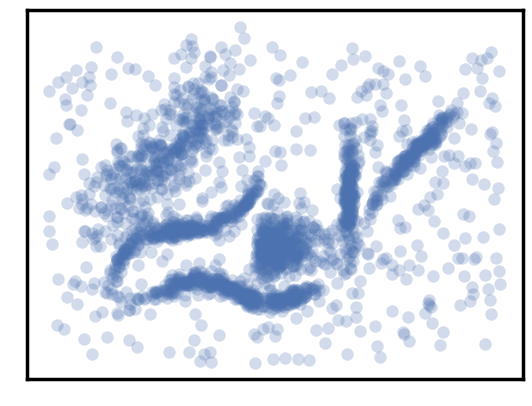

In [4]:
#Scatter plot the 'cluster_data.npy' 
plt.scatter(data.T[0], data.T[1], c='b', **plot_kwds)
frame = plt.gca()
frame.axes.get_xaxis().set_visible(False)
frame.axes.get_yaxis().set_visible(False)


In [5]:
#Establish the plot_clusters(data, algorithm, args, kwds)little utility function to do the clustering and plot the results for us
def plot_clusters(data, algorithm, args, kwds):
    start_time = time.time()
    labels = algorithm(*args, **kwds).fit_predict(data)
    end_time = time.time()
    palette = sns.color_palette('deep', np.unique(labels).max() + 1)
    colors = [palette[x] if x >= 0 else (0.0, 0.0, 0.0) for x in labels]
    plt.scatter(data.T[0], data.T[1], c=colors, **plot_kwds)
    frame = plt.gca()
    frame.axes.get_xaxis().set_visible(False)
    frame.axes.get_yaxis().set_visible(False)
    plt.title('Clusters found by {}'.format(str(algorithm.__name__)), fontsize=24)
    plt.text(-0.54, 0.65, 'Clustering took {:.2f} s'.format(end_time - start_time), fontsize=12)


/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


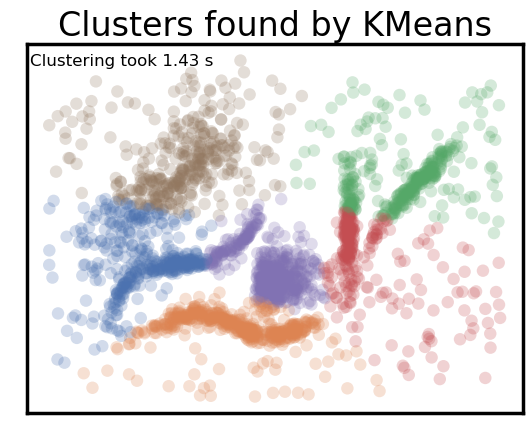

In [6]:
#Plotting an example model
plot_clusters(data, cluster.KMeans, (), {'n_clusters':6})

## 1. K-Means

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


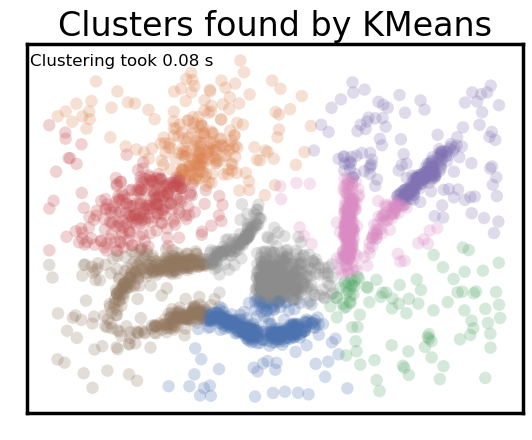

In [41]:
#Plotting the KMeans model with default hyperparameters
plot_clusters(data, cluster.KMeans, (), {})

### 1.1. Finding the best n_clusters parameter

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress t

Text(0.5, 1.0, 'Different Inertia Values for Different Number of Clusters')

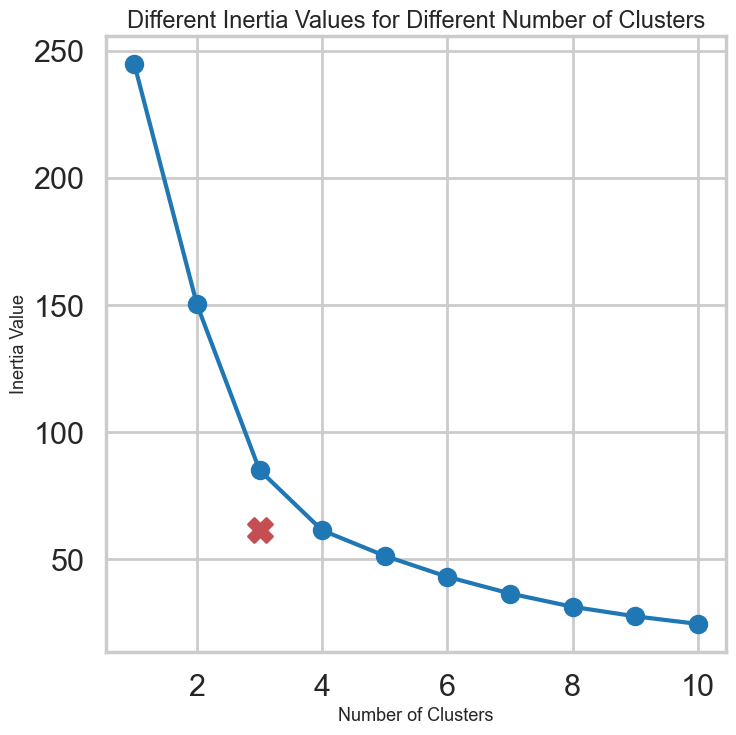

In [43]:
#Finding the best cluster number with elbow method
%matplotlib inline
plt.rcParams['figure.figsize'] = [8,8]
sns.set_style("whitegrid")
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']

inertia_list = []
for num_clusters in range(1, 11):
    kmeans_model = cluster.KMeans(max_iter=1000, n_clusters=num_clusters, init="k-means++")
    kmeans_model.fit(data)
    inertia_list.append(kmeans_model.inertia_)
    
# plot the inertia curve
plt.plot(range(1,11),inertia_list)
plt.scatter(range(1,11),inertia_list)
plt.scatter(3, inertia_list[3], marker="X", s=300, c="r")
plt.xlabel("Number of Clusters", size=13)
plt.ylabel("Inertia Value", size=13)
plt.title("Different Inertia Values for Different Number of Clusters", size=17)

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress t

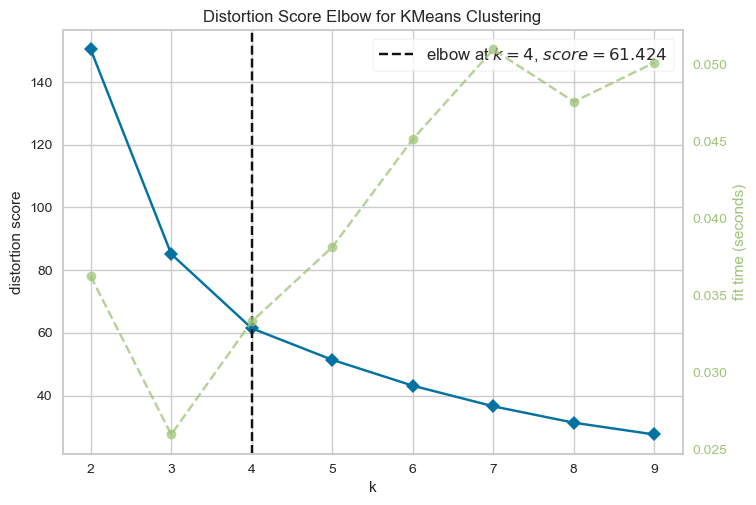

<AxesSubplot: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [169]:
#pip install yellowbrick
from yellowbrick.cluster import KElbowVisualizer
visualizer = KElbowVisualizer(kmeans_model, k=(2,10))
visualizer.fit(data)
visualizer.show()

In [175]:
#Finding the best random_state hyperparameter number with the inertia score
random_state_list = np.arange(1, 1001, 1)
inertia_list = []
silhouette_list = []
for random_state in random_state_list:
    kmeans_model = cluster.KMeans(max_iter=1000, n_clusters=3, random_state=random_state)
    kmeans_model.fit(data)
    inertia_list.append(kmeans_model.inertia_)
    silhouette_avg = metrics.silhouette_score(data, kmeans_model.labels_)
    silhouette_list.append(silhouette_avg)

df = pd.DataFrame(list(zip(silhouette_list, inertia_list)), index =random_state_list, columns =['Silhoutte_Score', 'Inertia_Score'])
df
#print(results[results['Inertia Value'] == results['Inertia Value'].min()])


/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress t

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress t

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress t

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress t

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress t

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress t

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress t

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress t

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress t

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress t

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress t

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress t

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress t

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress t

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress t

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress t

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress t

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress t

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress t

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress t

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress t

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress t

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress t

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress t

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress t

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress t

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress t

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress t

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress t

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress t

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


,Silhoutte_Score,Inertia_Score
1,0.463191,85.102898
2,0.463191,85.103244
3,0.463191,85.102898
4,0.463191,85.102898
5,0.463191,85.103397
...,...,...
996,0.463191,85.103244
997,0.463191,85.103244
998,0.463191,85.102898
999,0.463191,85.103244


In [176]:
df[df.Silhoutte_Score==df.Silhoutte_Score.max()]

,Silhoutte_Score,Inertia_Score
1,0.463191,85.102898
2,0.463191,85.103244
3,0.463191,85.102898
4,0.463191,85.102898
5,0.463191,85.103397
...,...,...
996,0.463191,85.103244
997,0.463191,85.103244
998,0.463191,85.102898
999,0.463191,85.103244


In [177]:
df[df.Inertia_Score==df.Inertia_Score.min()]

,Silhoutte_Score,Inertia_Score
1,0.463191,85.102898
3,0.463191,85.102898
4,0.463191,85.102898
10,0.463191,85.102898
11,0.463191,85.102898
...,...,...
990,0.463191,85.102898
993,0.463191,85.102898
994,0.463191,85.102898
998,0.463191,85.102898


### 1.2. Finding the best init and n_init parameter

In [187]:
#Finding the best random_state hyperparameter number with the inertia and silhoutte score
init_list = ["k-means++", "random"]
n_init_list = np.append(["auto"],np.arange(1, 101, 1))
parameters = list()
inertia_list = []
silhouette_list = []
for init in init_list:
    for n_init in n_init_list:
        if n_init not in ["auto"]:
            n_init = int(n_init)
        kmeans_model = cluster.KMeans(random_state=1, max_iter=1000, n_clusters=3, init=init, n_init=n_init)
        kmeans_model.fit(data)
        silhouette_avg = metrics.silhouette_score(data, kmeans_model.labels_)
        used_parameters = "init: " + str(init) + ", " + "n_init: " + str(n_init)
        inertia_list.append(kmeans_model.inertia_)
        silhouette_list.append(silhouette_avg)
        parameters.append(used_parameters)
        

df = pd.DataFrame(list(zip(silhouette_list, inertia_list)), index =parameters, columns =['Silhoutte_Score', 'Inertia_Score'])
df


,Silhoutte_Score,Inertia_Score
"init: k-means++, n_init: auto",0.463117,85.103947
"init: k-means++, n_init: 1",0.463117,85.103947
"init: k-means++, n_init: 2",0.463117,85.103947
"init: k-means++, n_init: 3",0.463117,85.103947
"init: k-means++, n_init: 4",0.463117,85.103947
...,...,...
"init: random, n_init: 96",0.463191,85.102898
"init: random, n_init: 97",0.463191,85.102898
"init: random, n_init: 98",0.463191,85.102898
"init: random, n_init: 99",0.463191,85.102898


In [188]:
df[df.Silhoutte_Score==df.Silhoutte_Score.max()]

,Silhoutte_Score,Inertia_Score
"init: k-means++, n_init: 5",0.463191,85.102898
"init: k-means++, n_init: 6",0.463191,85.102898
"init: k-means++, n_init: 7",0.463191,85.102898
"init: k-means++, n_init: 8",0.463191,85.102898
"init: k-means++, n_init: 9",0.463191,85.102898
...,...,...
"init: random, n_init: 96",0.463191,85.102898
"init: random, n_init: 97",0.463191,85.102898
"init: random, n_init: 98",0.463191,85.102898
"init: random, n_init: 99",0.463191,85.102898


In [189]:
df[df.Inertia_Score==df.Inertia_Score.min()]

,Silhoutte_Score,Inertia_Score
"init: k-means++, n_init: 5",0.463191,85.102898
"init: k-means++, n_init: 6",0.463191,85.102898
"init: k-means++, n_init: 7",0.463191,85.102898
"init: k-means++, n_init: 8",0.463191,85.102898
"init: k-means++, n_init: 9",0.463191,85.102898
...,...,...
"init: random, n_init: 96",0.463191,85.102898
"init: random, n_init: 97",0.463191,85.102898
"init: random, n_init: 98",0.463191,85.102898
"init: random, n_init: 99",0.463191,85.102898


### 1.3. Finding the best tol, verbose, copy_x, algorithm parameter

In [190]:
#Finding the best hyperparameters with the inertia and silhoutte score
tol_list = [1e-4, 2e-4, 3e-4, 5e-4]
verbose_list = np.arange(0, 11, 1)
copy_x_list = [True, False]
algorithm_list = ["lloyd", "elkan", "auto", "full"]

parameters = list()
inertia_list = []
silhouette_list = []
for tol in tol_list:
    for verbose in verbose_list:
        for copy_x in copy_x_list:
            for algorithm in algorithm_list:
                kmeans_model = cluster.KMeans(random_state=1, max_iter=1000, n_clusters=3, tol=tol, verbose=verbose, 
                                             copy_x=copy_x, algorithm=algorithm)
                kmeans_model.fit(data)
                silhouette_avg = metrics.silhouette_score(data, kmeans_model.labels_)
                used_parameters = "tol: " + str(tol) + ", " + "verbose: " + str(verbose) + ", " + "copy_x: " + str(copy_x) + ", " + "algorithm: " + str(algorithm)
                inertia_list.append(kmeans_model.inertia_)
                silhouette_list.append(silhouette_avg)
                parameters.append(used_parameters)
        

df = pd.DataFrame(list(zip(silhouette_list, inertia_list)), index =parameters, columns =['Silhoutte_Score', 'Inertia_Score'])
df


/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesgu

Initialization complete
Iteration 0, inertia 106.63019366174332.
Iteration 1, inertia 87.67337316492313.
Iteration 2, inertia 87.36208268313452.
Iteration 3, inertia 87.29903380379398.
Iteration 4, inertia 87.24394570491961.
Iteration 5, inertia 87.19242687436837.
Iteration 6, inertia 87.09672702224702.
Iteration 7, inertia 86.87713538184565.
Iteration 8, inertia 86.375832420286.
Iteration 9, inertia 85.68888942565899.
Iteration 10, inertia 85.24492060737305.
Iteration 11, inertia 85.13204869347206.
Iteration 12, inertia 85.10740333603822.
Converged at iteration 12: center shift 5.0081375494916214e-06 within tolerance 5.302402598843445e-06.
Initialization complete
Iteration 0, inertia 106.16616021562362.
Iteration 1, inertia 89.45322818031019.
Iteration 2, inertia 87.89548072254337.
Iteration 3, inertia 87.45203556562717.
Iteration 4, inertia 87.34496771765751.
Iteration 5, inertia 87.32085357319042.
Converged at iteration 5: center shift 1.059408343539183e-06 within tolerance 5.302402

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesgu

Iteration 6, inertia 85.48814673941149.
Iteration 7, inertia 85.16370286670255.
Iteration 8, inertia 85.12276261135099.
Iteration 9, inertia 85.10893919635905.
Converged at iteration 9: center shift 3.007502403918747e-06 within tolerance 5.302402598843445e-06.
Initialization complete
Iteration 0, inertia 106.63019366174332.
Iteration 1, inertia 87.67337316492313.
Iteration 2, inertia 87.36208268313452.
Iteration 3, inertia 87.29903380379398.
Iteration 4, inertia 87.24394570491958.
Iteration 5, inertia 87.19242687436837.
Iteration 6, inertia 87.09672702224704.
Iteration 7, inertia 86.87713538184565.
Iteration 8, inertia 86.375832420286.
Iteration 9, inertia 85.68888942565899.
Iteration 10, inertia 85.24492060737305.
Iteration 11, inertia 85.13204869347207.
Iteration 12, inertia 85.10740333603822.
Converged at iteration 12: center shift 5.008137549491571e-06 within tolerance 5.302402598843445e-06.
Initialization complete
Iteration 0, inertia 106.16616021562362.
Iteration 1, inertia 89.45

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


Initialization complete
Iteration 0, inertia 106.63019366174332
Iteration 1, inertia 87.67337316492313
Iteration 2, inertia 87.36208268313452
Iteration 3, inertia 87.29903380379395
Iteration 4, inertia 87.24394570491958
Iteration 5, inertia 87.19242687436837
Iteration 6, inertia 87.09672702224702
Iteration 7, inertia 86.87713538184565
Iteration 8, inertia 86.375832420286
Iteration 9, inertia 85.68888942565897
Iteration 10, inertia 85.24492060737305
Iteration 11, inertia 85.13204869347206
Iteration 12, inertia 85.10740333603822
Converged at iteration 12: center shift 5.008137549491654e-06 within tolerance 5.302402598843445e-06.
Initialization complete
Iteration 0, inertia 106.16616021562362
Iteration 1, inertia 89.45322818031019
Iteration 2, inertia 87.89548072254337
Iteration 3, inertia 87.45203556562717
Iteration 4, inertia 87.34496771765752
Iteration 5, inertia 87.32085357319042
Converged at iteration 5: center shift 1.0594083435391361e-06 within tolerance 5.302402598843445e-06.
Init

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Iteration 1, inertia 116.22937239613503.
Iteration 2, inertia 108.78181345450847.
Iteration 3, inertia 102.29676257851041.
Iteration 4, inertia 93.91686669807115.
Iteration 5, inertia 87.47571897277506.
Iteration 6, inertia 85.48814673941149.
Iteration 7, inertia 85.16370286670255.
Iteration 8, inertia 85.12276261135098.
Iteration 9, inertia 85.10893919635905.
Converged at iteration 9: center shift 3.0075024039186106e-06 within tolerance 5.302402598843445e-06.
Initialization complete
Iteration 0, inertia 106.63019366174332.
Iteration 1, inertia 87.67337316492313.
Iteration 2, inertia 87.3620826831345.
Iteration 3, inertia 87.29903380379398.
Iteration 4, inertia 87.24394570491958.
Iteration 5, inertia 87.19242687436838.
Iteration 6, inertia 87.09672702224702.
Iteration 7, inertia 86.87713538184563.
Iteration 8, inertia 86.375832420286.
Iteration 9, inertia 85.68888942565899.
Iteration 10, inertia 85.24492060737305.
Iteration 11, inertia 85.13204869347206.
Iteration 12, inertia 85.107403

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/

Initialization complete
Iteration 0, inertia 106.63019366174332.
Iteration 1, inertia 87.67337316492313.
Iteration 2, inertia 87.36208268313452.
Iteration 3, inertia 87.29903380379398.
Iteration 4, inertia 87.24394570491961.
Iteration 5, inertia 87.19242687436837.
Iteration 6, inertia 87.09672702224704.
Iteration 7, inertia 86.87713538184563.
Iteration 8, inertia 86.375832420286.
Iteration 9, inertia 85.68888942565897.
Iteration 10, inertia 85.24492060737305.
Iteration 11, inertia 85.13204869347207.
Iteration 12, inertia 85.10740333603822.
Converged at iteration 12: center shift 5.008137549491611e-06 within tolerance 5.302402598843445e-06.
Initialization complete
Iteration 0, inertia 106.16616021562362.
Iteration 1, inertia 89.45322818031019.
Iteration 2, inertia 87.89548072254337.
Iteration 3, inertia 87.45203556562717.
Iteration 4, inertia 87.34496771765751.
Iteration 5, inertia 87.32085357319045.
Converged at iteration 5: center shift 1.0594083435391727e-06 within tolerance 5.302402

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesgu

Initialization complete
Iteration 0, inertia 106.63019366174332
Iteration 1, inertia 87.67337316492313
Iteration 2, inertia 87.36208268313452
Iteration 3, inertia 87.29903380379395
Iteration 4, inertia 87.24394570491961
Iteration 5, inertia 87.19242687436837
Iteration 6, inertia 87.09672702224705
Iteration 7, inertia 86.87713538184563
Iteration 8, inertia 86.37583242028602
Iteration 9, inertia 85.68888942565899
Iteration 10, inertia 85.24492060737306
Iteration 11, inertia 85.13204869347207
Iteration 12, inertia 85.1074033360382
Converged at iteration 12: center shift 5.008137549491562e-06 within tolerance 5.302402598843445e-06.
Initialization complete
Iteration 0, inertia 106.16616021562362
Iteration 1, inertia 89.45322818031019
Iteration 2, inertia 87.89548072254337
Iteration 3, inertia 87.45203556562717
Iteration 4, inertia 87.34496771765751
Iteration 5, inertia 87.32085357319042
Converged at iteration 5: center shift 1.0594083435391732e-06 within tolerance 5.302402598843445e-06.
Ini

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


Initialization complete
Iteration 0, inertia 106.63019366174332.
Iteration 1, inertia 87.67337316492313.
Iteration 2, inertia 87.36208268313452.
Iteration 3, inertia 87.29903380379395.
Iteration 4, inertia 87.24394570491958.
Iteration 5, inertia 87.19242687436838.
Iteration 6, inertia 87.09672702224704.
Iteration 7, inertia 86.87713538184563.
Iteration 8, inertia 86.37583242028602.
Iteration 9, inertia 85.68888942565899.
Iteration 10, inertia 85.24492060737305.
Iteration 11, inertia 85.13204869347207.
Iteration 12, inertia 85.1074033360382.
Converged at iteration 12: center shift 5.008137549491654e-06 within tolerance 5.302402598843445e-06.
Initialization complete
Iteration 0, inertia 106.16616021562362.
Iteration 1, inertia 89.45322818031019.
Iteration 2, inertia 87.89548072254337.
Iteration 3, inertia 87.45203556562717.
Iteration 4, inertia 87.34496771765751.
Iteration 5, inertia 87.32085357319045.
Converged at iteration 5: center shift 1.0594083435390823e-06 within tolerance 5.30240

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Initialization complete
Iteration 0, inertia 106.63019366174332.
Iteration 1, inertia 87.67337316492313.
Iteration 2, inertia 87.36208268313452.
Iteration 3, inertia 87.29903380379398.
Iteration 4, inertia 87.24394570491958.
Iteration 5, inertia 87.19242687436837.
Iteration 6, inertia 87.09672702224704.
Iteration 7, inertia 86.87713538184563.
Iteration 8, inertia 86.37583242028602.
Iteration 9, inertia 85.68888942565897.
Iteration 10, inertia 85.24492060737305.
Iteration 11, inertia 85.13204869347206.
Iteration 12, inertia 85.1074033360382.
Converged at iteration 12: center shift 5.008137549491511e-06 within tolerance 5.302402598843445e-06.
Initialization complete
Iteration 0, inertia 106.16616021562362.
Iteration 1, inertia 89.45322818031019.
Iteration 2, inertia 87.89548072254337.
Iteration 3, inertia 87.45203556562717.
Iteration 4, inertia 87.34496771765751.
Iteration 5, inertia 87.32085357319042.
Converged at iteration 5: center shift 1.059408343539138e-06 within tolerance 5.302402

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/

Initialization complete
Iteration 0, inertia 106.63019366174332.
Iteration 1, inertia 87.67337316492313.
Iteration 2, inertia 87.36208268313452.
Iteration 3, inertia 87.29903380379398.
Iteration 4, inertia 87.24394570491958.
Iteration 5, inertia 87.19242687436838.
Iteration 6, inertia 87.09672702224705.
Iteration 7, inertia 86.87713538184565.
Iteration 8, inertia 86.375832420286.
Iteration 9, inertia 85.68888942565897.
Iteration 10, inertia 85.24492060737305.
Iteration 11, inertia 85.13204869347207.
Iteration 12, inertia 85.1074033360382.
Converged at iteration 12: center shift 5.0081375494916706e-06 within tolerance 5.302402598843445e-06.
Initialization complete
Iteration 0, inertia 106.16616021562362.
Iteration 1, inertia 89.45322818031019.
Iteration 2, inertia 87.89548072254337.
Iteration 3, inertia 87.45203556562717.
Iteration 4, inertia 87.34496771765752.
Iteration 5, inertia 87.32085357319042.
Converged at iteration 5: center shift 1.05940834353916e-06 within tolerance 5.30240259

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesgu

Initialization complete
Iteration 0, inertia 106.63019366174332
Iteration 1, inertia 87.67337316492313
Iteration 2, inertia 87.36208268313452
Iteration 3, inertia 87.29903380379395
Iteration 4, inertia 87.24394570491958
Iteration 5, inertia 87.19242687436837
Iteration 6, inertia 87.09672702224704
Iteration 7, inertia 86.87713538184563
Iteration 8, inertia 86.375832420286
Iteration 9, inertia 85.68888942565897
Iteration 10, inertia 85.24492060737305
Iteration 11, inertia 85.13204869347207
Iteration 12, inertia 85.10740333603822
Converged at iteration 12: center shift 5.008137549491571e-06 within tolerance 5.302402598843445e-06.
Initialization complete
Iteration 0, inertia 106.16616021562362
Iteration 1, inertia 89.45322818031019
Iteration 2, inertia 87.89548072254337
Iteration 3, inertia 87.45203556562718
Iteration 4, inertia 87.34496771765752
Iteration 5, inertia 87.32085357319042
Converged at iteration 5: center shift 1.059408343539124e-06 within tolerance 5.302402598843445e-06.
Initi

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


Initialization complete
Iteration 0, inertia 106.63019366174332.
Iteration 1, inertia 87.67337316492313.
Iteration 2, inertia 87.36208268313452.
Iteration 3, inertia 87.29903380379398.
Iteration 4, inertia 87.24394570491958.
Iteration 5, inertia 87.19242687436838.
Iteration 6, inertia 87.09672702224704.
Iteration 7, inertia 86.87713538184563.
Iteration 8, inertia 86.375832420286.
Iteration 9, inertia 85.68888942565897.
Iteration 10, inertia 85.24492060737305.
Iteration 11, inertia 85.13204869347207.
Iteration 12, inertia 85.10740333603822.
Converged at iteration 12: center shift 5.008137549491651e-06 within tolerance 5.302402598843445e-06.
Initialization complete
Iteration 0, inertia 106.16616021562362.
Iteration 1, inertia 89.45322818031019.
Iteration 2, inertia 87.89548072254337.
Iteration 3, inertia 87.45203556562717.
Iteration 4, inertia 87.34496771765752.
Iteration 5, inertia 87.32085357319042.
Converged at iteration 5: center shift 1.0594083435391077e-06 within tolerance 5.302402

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Initialization complete
Iteration 0, inertia 106.63019366174332.
Iteration 1, inertia 87.67337316492313.
Iteration 2, inertia 87.36208268313452.
Iteration 3, inertia 87.29903380379398.
Iteration 4, inertia 87.24394570491958.
Iteration 5, inertia 87.19242687436837.
Iteration 6, inertia 87.09672702224705.
Iteration 7, inertia 86.87713538184563.
Iteration 8, inertia 86.37583242028602.
Iteration 9, inertia 85.68888942565897.
Iteration 10, inertia 85.24492060737305.
Iteration 11, inertia 85.13204869347207.
Iteration 12, inertia 85.1074033360382.
Converged at iteration 12: center shift 5.008137549491641e-06 within tolerance 5.302402598843445e-06.
Initialization complete
Iteration 0, inertia 106.16616021562362.
Iteration 1, inertia 89.45322818031019.
Iteration 2, inertia 87.89548072254337.
Iteration 3, inertia 87.45203556562718.
Iteration 4, inertia 87.34496771765752.
Iteration 5, inertia 87.32085357319042.
Converged at iteration 5: center shift 1.059408343539086e-06 within tolerance 5.302402

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/

Initialization complete
Iteration 0, inertia 106.63019366174332.
Iteration 1, inertia 87.67337316492313.
Iteration 2, inertia 87.36208268313452.
Iteration 3, inertia 87.29903380379398.
Iteration 4, inertia 87.24394570491961.
Iteration 5, inertia 87.19242687436837.
Iteration 6, inertia 87.09672702224704.
Iteration 7, inertia 86.87713538184565.
Iteration 8, inertia 86.37583242028602.
Iteration 9, inertia 85.68888942565897.
Iteration 10, inertia 85.24492060737305.
Iteration 11, inertia 85.13204869347206.
Iteration 12, inertia 85.10740333603822.
Converged at iteration 12: center shift 5.0081375494916214e-06 within tolerance 5.302402598843445e-06.
Initialization complete
Iteration 0, inertia 106.16616021562362.
Iteration 1, inertia 89.45322818031019.
Iteration 2, inertia 87.89548072254337.
Iteration 3, inertia 87.45203556562718.
Iteration 4, inertia 87.34496771765752.
Iteration 5, inertia 87.32085357319042.
Converged at iteration 5: center shift 1.059408343539085e-06 within tolerance 5.3024

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesgu

Initialization complete
Iteration 0, inertia 106.63019366174332
Iteration 1, inertia 87.67337316492313
Iteration 2, inertia 87.36208268313452
Iteration 3, inertia 87.29903380379398
Iteration 4, inertia 87.24394570491958
Iteration 5, inertia 87.19242687436837
Iteration 6, inertia 87.09672702224702
Iteration 7, inertia 86.87713538184563
Iteration 8, inertia 86.37583242028602
Iteration 9, inertia 85.68888942565897
Iteration 10, inertia 85.24492060737305
Iteration 11, inertia 85.13204869347206
Iteration 12, inertia 85.1074033360382
Converged at iteration 12: center shift 5.008137549491665e-06 within tolerance 5.302402598843445e-06.
Initialization complete
Iteration 0, inertia 106.16616021562362
Iteration 1, inertia 89.45322818031019
Iteration 2, inertia 87.89548072254337
Iteration 3, inertia 87.45203556562718
Iteration 4, inertia 87.34496771765752
Iteration 5, inertia 87.32085357319045
Converged at iteration 5: center shift 1.0594083435391418e-06 within tolerance 5.302402598843445e-06.
Ini

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


Initialization complete
Iteration 0, inertia 106.63019366174332.
Iteration 1, inertia 87.67337316492313.
Iteration 2, inertia 87.36208268313452.
Iteration 3, inertia 87.29903380379398.
Iteration 4, inertia 87.24394570491958.
Iteration 5, inertia 87.19242687436838.
Iteration 6, inertia 87.09672702224704.
Iteration 7, inertia 86.87713538184563.
Iteration 8, inertia 86.375832420286.
Iteration 9, inertia 85.68888942565897.
Iteration 10, inertia 85.24492060737306.
Iteration 11, inertia 85.13204869347206.
Iteration 12, inertia 85.10740333603822.
Converged at iteration 12: center shift 5.008137549491624e-06 within tolerance 5.302402598843445e-06.
Initialization complete
Iteration 0, inertia 106.16616021562362.
Iteration 1, inertia 89.45322818031019.
Iteration 2, inertia 87.89548072254337.
Iteration 3, inertia 87.45203556562717.
Iteration 4, inertia 87.34496771765751.
Iteration 5, inertia 87.32085357319042.
Converged at iteration 5: center shift 1.0594083435391213e-06 within tolerance 5.302402

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Initialization complete
Iteration 0, inertia 106.63019366174332.
Iteration 1, inertia 87.67337316492313.
Iteration 2, inertia 87.36208268313452.
Iteration 3, inertia 87.29903380379398.
Iteration 4, inertia 87.24394570491958.
Iteration 5, inertia 87.19242687436838.
Iteration 6, inertia 87.09672702224704.
Iteration 7, inertia 86.87713538184565.
Iteration 8, inertia 86.375832420286.
Iteration 9, inertia 85.68888942565897.
Iteration 10, inertia 85.24492060737305.
Iteration 11, inertia 85.13204869347207.
Iteration 12, inertia 85.10740333603822.
Converged at iteration 12: center shift 5.00813754949173e-06 within tolerance 5.302402598843445e-06.
Initialization complete
Iteration 0, inertia 106.16616021562362.
Iteration 1, inertia 89.45322818031019.
Iteration 2, inertia 87.89548072254337.
Iteration 3, inertia 87.45203556562717.
Iteration 4, inertia 87.34496771765752.
Iteration 5, inertia 87.32085357319045.
Converged at iteration 5: center shift 1.0594083435392015e-06 within tolerance 5.3024025

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/

Initialization complete
Iteration 0, inertia 106.63019366174332.
Iteration 1, inertia 87.67337316492313.
Iteration 2, inertia 87.36208268313452.
Iteration 3, inertia 87.29903380379398.
Iteration 4, inertia 87.24394570491961.
Iteration 5, inertia 87.19242687436837.
Iteration 6, inertia 87.09672702224704.
Iteration 7, inertia 86.87713538184565.
Iteration 8, inertia 86.375832420286.
Iteration 9, inertia 85.68888942565899.
Iteration 10, inertia 85.24492060737305.
Iteration 11, inertia 85.13204869347206.
Iteration 12, inertia 85.10740333603822.
Converged at iteration 12: center shift 5.008137549491647e-06 within tolerance 5.302402598843445e-06.
Initialization complete
Iteration 0, inertia 106.16616021562362.
Iteration 1, inertia 89.45322818031019.
Iteration 2, inertia 87.89548072254337.
Iteration 3, inertia 87.45203556562717.
Iteration 4, inertia 87.34496771765751.
Iteration 5, inertia 87.32085357319045.
Converged at iteration 5: center shift 1.0594083435392024e-06 within tolerance 5.302402

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesgu

Initialization complete
Iteration 0, inertia 106.63019366174332
Iteration 1, inertia 87.67337316492313
Iteration 2, inertia 87.36208268313452
Iteration 3, inertia 87.29903380379395
Iteration 4, inertia 87.24394570491958
Iteration 5, inertia 87.19242687436838
Iteration 6, inertia 87.09672702224702
Iteration 7, inertia 86.87713538184563
Iteration 8, inertia 86.375832420286
Iteration 9, inertia 85.68888942565899
Iteration 10, inertia 85.24492060737306
Iteration 11, inertia 85.13204869347206
Iteration 12, inertia 85.1074033360382
Converged at iteration 12: center shift 5.008137549491628e-06 within tolerance 5.302402598843445e-06.
Initialization complete
Iteration 0, inertia 106.16616021562362
Iteration 1, inertia 89.45322818031019
Iteration 2, inertia 87.89548072254337
Iteration 3, inertia 87.45203556562717
Iteration 4, inertia 87.34496771765751
Iteration 5, inertia 87.32085357319042
Converged at iteration 5: center shift 1.0594083435392015e-06 within tolerance 5.302402598843445e-06.
Initi

Iteration 4, inertia 87.27503589654228.
Iteration 5, inertia 87.23114159181344.
Iteration 6, inertia 87.1592386606329.
Iteration 7, inertia 87.0044384847528.
Iteration 8, inertia 86.63588140404083.
Iteration 9, inertia 86.00316603162398.
Iteration 10, inertia 85.36674306729833.
Iteration 11, inertia 85.15099970159122.
Iteration 12, inertia 85.11274827693798.
Iteration 13, inertia 85.10394747664195.
Converged at iteration 13: center shift 8.744985379978951e-07 within tolerance 5.302402598843445e-06.
Initialization complete
Iteration 0, inertia 160.22221457699845.
Iteration 1, inertia 110.95928030526426.
Iteration 2, inertia 95.79376221041687.
Iteration 3, inertia 88.64263010512013.
Iteration 4, inertia 87.61094029829016.
Iteration 5, inertia 87.42465989728436.
Iteration 6, inertia 87.3519266344019.
Iteration 7, inertia 87.33035211312726.
Converged at iteration 7: center shift 4.112241892772325e-07 within tolerance 5.302402598843445e-06.
Initialization complete
Iteration 0, inertia 121.6

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Iteration 2, inertia 87.89548072254337
Iteration 3, inertia 87.45203556562718
Iteration 4, inertia 87.34496771765751
Iteration 5, inertia 87.32085357319042
Converged at iteration 5: center shift 1.059408343539086e-06 within tolerance 5.302402598843445e-06.
Initialization complete
Iteration 0, inertia 123.95813232645014
Iteration 1, inertia 100.48856913997682
Iteration 2, inertia 93.45996435209258
Iteration 3, inertia 89.24273954385647
Iteration 4, inertia 87.83304899016971
Iteration 5, inertia 87.48578874924371
Iteration 6, inertia 87.37360728594768
Iteration 7, inertia 87.33366312971779
Converged at iteration 7: center shift 4.661018613449643e-06 within tolerance 5.302402598843445e-06.
Initialization complete
Iteration 0, inertia 168.6853366414891
Iteration 1, inertia 133.4891508544908
Iteration 2, inertia 126.09907059443155
Iteration 3, inertia 123.01251606822069
Iteration 4, inertia 121.57248314320188
Iteration 5, inertia 119.73724827345706
Iteration 6, inertia 111.64675840237675
It

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


Iteration 2, inertia 87.36208268313452.
Iteration 3, inertia 87.29903380379395.
Iteration 4, inertia 87.24394570491958.
Iteration 5, inertia 87.19242687436837.
Iteration 6, inertia 87.09672702224702.
Iteration 7, inertia 86.87713538184565.
Iteration 8, inertia 86.375832420286.
Iteration 9, inertia 85.68888942565899.
Iteration 10, inertia 85.24492060737305.
Iteration 11, inertia 85.13204869347207.
Iteration 12, inertia 85.1074033360382.
Converged at iteration 12: center shift 5.0081375494916155e-06 within tolerance 5.302402598843445e-06.
Initialization complete
Iteration 0, inertia 106.16616021562362.
Iteration 1, inertia 89.45322818031019.
Iteration 2, inertia 87.89548072254337.
Iteration 3, inertia 87.45203556562717.
Iteration 4, inertia 87.34496771765752.
Iteration 5, inertia 87.32085357319042.
Converged at iteration 5: center shift 1.0594083435391209e-06 within tolerance 5.302402598843445e-06.
Initialization complete
Iteration 0, inertia 123.95813232645014.
Iteration 1, inertia 100.

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


Iteration 6, inertia 87.37360728594768
Iteration 7, inertia 87.33366312971779
Converged at iteration 7: center shift 4.661018613449641e-06 within tolerance 5.302402598843445e-06.
Initialization complete
Iteration 0, inertia 168.6853366414891
Iteration 1, inertia 133.4891508544908
Iteration 2, inertia 126.09907059443157
Iteration 3, inertia 123.01251606822069
Iteration 4, inertia 121.57248314320188
Iteration 5, inertia 119.73724827345706
Iteration 6, inertia 111.64675840237675
Iteration 7, inertia 97.35403021944045
Iteration 8, inertia 88.06160576899391
Iteration 9, inertia 85.61060296418736
Iteration 10, inertia 85.19334342800276
Iteration 11, inertia 85.13450024994603
Iteration 12, inertia 85.10893919635905
Converged at iteration 12: center shift 3.0075024039185792e-06 within tolerance 5.302402598843445e-06.
Initialization complete
Iteration 0, inertia 114.9547082357836
Iteration 1, inertia 85.40178149437804
Iteration 2, inertia 85.11330737812123
Iteration 3, inertia 85.10310246006725

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Initialization complete
Iteration 0, inertia 106.63019366174332.
Iteration 1, inertia 87.67337316492313.
Iteration 2, inertia 87.36208268313452.
Iteration 3, inertia 87.29903380379398.
Iteration 4, inertia 87.24394570491958.
Iteration 5, inertia 87.19242687436837.
Iteration 6, inertia 87.09672702224702.
Iteration 7, inertia 86.87713538184563.
Iteration 8, inertia 86.37583242028602.
Iteration 9, inertia 85.68888942565897.
Iteration 10, inertia 85.24492060737305.
Iteration 11, inertia 85.13204869347206.
Iteration 12, inertia 85.10740333603822.
Converged at iteration 12: center shift 5.0081375494916214e-06 within tolerance 5.302402598843445e-06.
Initialization complete
Iteration 0, inertia 106.16616021562362.
Iteration 1, inertia 89.45322818031019.
Iteration 2, inertia 87.89548072254337.
Iteration 3, inertia 87.45203556562717.
Iteration 4, inertia 87.34496771765751.
Iteration 5, inertia 87.32085357319042.
Converged at iteration 5: center shift 1.0594083435391958e-06 within tolerance 5.302

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/

Iteration 5, inertia 87.42465989728437.
Iteration 6, inertia 87.3519266344019.
Iteration 7, inertia 87.33035211312728.
Converged at iteration 7: center shift 4.112241892771726e-07 within tolerance 5.302402598843445e-06.
Initialization complete
Iteration 0, inertia 121.61914443787444.
Iteration 1, inertia 87.83244673677873.
Iteration 2, inertia 87.48238441149385.
Iteration 3, inertia 87.3816970072813.
Iteration 4, inertia 87.33653757047253.
Iteration 5, inertia 87.33008746798907.
Converged at iteration 5: center shift 1.0462229628982479e-07 within tolerance 5.302402598843445e-06.
Initialization complete
Iteration 0, inertia 130.50845709571092.
Iteration 1, inertia 116.22937239613505.
Iteration 2, inertia 108.78181345450847.
Iteration 3, inertia 102.29676257851041.
Iteration 4, inertia 93.91686669807115.
Iteration 5, inertia 87.47571897277506.
Iteration 6, inertia 85.48814673941149.
Iteration 7, inertia 85.16370286670254.
Iteration 8, inertia 85.12276261135099.
Iteration 9, inertia 85.10

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesgu

Initialization complete
Iteration 0, inertia 106.63019366174332
Iteration 1, inertia 87.67337316492313
Iteration 2, inertia 87.36208268313452
Iteration 3, inertia 87.29903380379395
Iteration 4, inertia 87.24394570491958
Iteration 5, inertia 87.19242687436837
Iteration 6, inertia 87.09672702224704
Iteration 7, inertia 86.87713538184565
Iteration 8, inertia 86.375832420286
Iteration 9, inertia 85.68888942565899
Iteration 10, inertia 85.24492060737305
Iteration 11, inertia 85.13204869347206
Iteration 12, inertia 85.10740333603822
Converged at iteration 12: center shift 5.00813754949156e-06 within tolerance 5.302402598843445e-06.
Initialization complete
Iteration 0, inertia 106.16616021562362
Iteration 1, inertia 89.45322818031019
Iteration 2, inertia 87.89548072254337
Iteration 3, inertia 87.45203556562717
Iteration 4, inertia 87.34496771765752
Iteration 5, inertia 87.32085357319042
Converged at iteration 5: center shift 1.05940834353918e-06 within tolerance 5.302402598843445e-06.
Initial

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


Initialization complete
Iteration 0, inertia 106.63019366174332.
Iteration 1, inertia 87.67337316492313.
Iteration 2, inertia 87.36208268313452.
Iteration 3, inertia 87.29903380379395.
Iteration 4, inertia 87.24394570491958.
Iteration 5, inertia 87.19242687436838.
Iteration 6, inertia 87.09672702224705.
Iteration 7, inertia 86.87713538184565.
Iteration 8, inertia 86.375832420286.
Iteration 9, inertia 85.68888942565897.
Iteration 10, inertia 85.24492060737305.
Iteration 11, inertia 85.13204869347206.
Iteration 12, inertia 85.10740333603822.
Converged at iteration 12: center shift 5.0081375494916214e-06 within tolerance 5.302402598843445e-06.
Initialization complete
Iteration 0, inertia 106.16616021562362.
Iteration 1, inertia 89.45322818031019.
Iteration 2, inertia 87.89548072254337.
Iteration 3, inertia 87.45203556562717.
Iteration 4, inertia 87.34496771765752.
Iteration 5, inertia 87.32085357319042.
Converged at iteration 5: center shift 1.0594083435391609e-06 within tolerance 5.30240

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Initialization complete
Iteration 0, inertia 106.63019366174332.
Iteration 1, inertia 87.67337316492313.
Iteration 2, inertia 87.36208268313452.
Iteration 3, inertia 87.29903380379395.
Iteration 4, inertia 87.24394570491958.
Iteration 5, inertia 87.19242687436837.
Iteration 6, inertia 87.09672702224704.
Iteration 7, inertia 86.87713538184565.
Iteration 8, inertia 86.375832420286.
Iteration 9, inertia 85.68888942565899.
Iteration 10, inertia 85.24492060737305.
Iteration 11, inertia 85.13204869347207.
Iteration 12, inertia 85.10740333603822.
Converged at iteration 12: center shift 5.008137549491653e-06 within tolerance 5.302402598843445e-06.
Initialization complete
Iteration 0, inertia 106.16616021562362.
Iteration 1, inertia 89.45322818031019.
Iteration 2, inertia 87.89548072254337.
Iteration 3, inertia 87.45203556562717.
Iteration 4, inertia 87.34496771765751.
Iteration 5, inertia 87.32085357319045.
Converged at iteration 5: center shift 1.0594083435391418e-06 within tolerance 5.302402

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/

Initialization complete
Iteration 0, inertia 106.63019366174332.
Iteration 1, inertia 87.67337316492313.
Iteration 2, inertia 87.36208268313452.
Iteration 3, inertia 87.29903380379398.
Iteration 4, inertia 87.24394570491958.
Iteration 5, inertia 87.19242687436838.
Iteration 6, inertia 87.09672702224704.
Iteration 7, inertia 86.87713538184563.
Iteration 8, inertia 86.375832420286.
Iteration 9, inertia 85.68888942565899.
Iteration 10, inertia 85.24492060737305.
Iteration 11, inertia 85.13204869347206.
Iteration 12, inertia 85.1074033360382.
Converged at iteration 12: center shift 5.008137549491628e-06 within tolerance 5.302402598843445e-06.
Initialization complete
Iteration 0, inertia 106.16616021562362.
Iteration 1, inertia 89.45322818031019.
Iteration 2, inertia 87.89548072254337.
Iteration 3, inertia 87.45203556562717.
Iteration 4, inertia 87.34496771765752.
Iteration 5, inertia 87.32085357319042.
Converged at iteration 5: center shift 1.0594083435391922e-06 within tolerance 5.3024025

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesgu

Initialization complete
Iteration 0, inertia 106.63019366174332
Iteration 1, inertia 87.67337316492313
Iteration 2, inertia 87.36208268313452
Iteration 3, inertia 87.29903380379398
Iteration 4, inertia 87.24394570491958
Iteration 5, inertia 87.19242687436838
Iteration 6, inertia 87.09672702224702
Iteration 7, inertia 86.87713538184565
Iteration 8, inertia 86.375832420286
Iteration 9, inertia 85.68888942565897
Iteration 10, inertia 85.24492060737305
Iteration 11, inertia 85.13204869347206
Iteration 12, inertia 85.10740333603822
Converged at iteration 12: center shift 5.008137549491692e-06 within tolerance 5.302402598843445e-06.
Initialization complete
Iteration 0, inertia 106.16616021562362
Iteration 1, inertia 89.45322818031019
Iteration 2, inertia 87.89548072254337
Iteration 3, inertia 87.45203556562718
Iteration 4, inertia 87.34496771765752
Iteration 5, inertia 87.32085357319042
Converged at iteration 5: center shift 1.05940834353916e-06 within tolerance 5.302402598843445e-06.
Initia

Iteration 0, inertia 121.61914443787444.
Iteration 1, inertia 87.83244673677873.
Iteration 2, inertia 87.48238441149385.
Iteration 3, inertia 87.38169700728129.
Iteration 4, inertia 87.33653757047253.
Iteration 5, inertia 87.33008746798907.
Converged at iteration 5: center shift 1.0462229628984126e-07 within tolerance 5.302402598843445e-06.
Initialization complete
Iteration 0, inertia 130.50845709571092.
Iteration 1, inertia 116.22937239613505.
Iteration 2, inertia 108.78181345450847.
Iteration 3, inertia 102.2967625785104.
Iteration 4, inertia 93.91686669807115.
Iteration 5, inertia 87.47571897277506.
Iteration 6, inertia 85.48814673941149.
Iteration 7, inertia 85.16370286670255.
Iteration 8, inertia 85.12276261135098.
Iteration 9, inertia 85.10893919635905.
Converged at iteration 9: center shift 3.0075024039186834e-06 within tolerance 5.302402598843445e-06.


/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesgu

Initialization complete
Iteration 0, inertia 106.63019366174332.
Iteration 1, inertia 87.67337316492313.
Iteration 2, inertia 87.36208268313452.
Iteration 3, inertia 87.29903380379398.
Iteration 4, inertia 87.24394570491961.
Iteration 5, inertia 87.19242687436837.
Iteration 6, inertia 87.09672702224704.
Iteration 7, inertia 86.87713538184563.
Iteration 8, inertia 86.375832420286.
Iteration 9, inertia 85.68888942565899.
Iteration 10, inertia 85.24492060737305.
Iteration 11, inertia 85.13204869347207.
Iteration 12, inertia 85.1074033360382.
Converged at iteration 12: center shift 5.008137549491503e-06 within tolerance 1.060480519768689e-05.
Initialization complete
Iteration 0, inertia 106.16616021562362.
Iteration 1, inertia 89.45322818031019.
Iteration 2, inertia 87.89548072254337.
Iteration 3, inertia 87.45203556562717.
Iteration 4, inertia 87.34496771765751.
Iteration 5, inertia 87.32085357319045.
Converged at iteration 5: center shift 1.0594083435391456e-06 within tolerance 1.0604805

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesgu

Initialization complete
Iteration 0, inertia 106.63019366174332.
Iteration 1, inertia 87.67337316492313.
Iteration 2, inertia 87.36208268313452.
Iteration 3, inertia 87.29903380379395.
Iteration 4, inertia 87.24394570491961.
Iteration 5, inertia 87.19242687436837.
Iteration 6, inertia 87.09672702224702.
Iteration 7, inertia 86.87713538184565.
Iteration 8, inertia 86.375832420286.
Iteration 9, inertia 85.68888942565899.
Iteration 10, inertia 85.24492060737305.
Iteration 11, inertia 85.13204869347207.
Iteration 12, inertia 85.10740333603822.
Converged at iteration 12: center shift 5.008137549491679e-06 within tolerance 1.060480519768689e-05.
Initialization complete
Iteration 0, inertia 106.16616021562362.
Iteration 1, inertia 89.45322818031019.
Iteration 2, inertia 87.89548072254337.
Iteration 3, inertia 87.45203556562717.
Iteration 4, inertia 87.34496771765752.
Iteration 5, inertia 87.32085357319042.
Converged at iteration 5: center shift 1.0594083435391334e-06 within tolerance 1.060480

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


Initialization complete
Iteration 0, inertia 106.63019366174332.
Iteration 1, inertia 87.67337316492313.
Iteration 2, inertia 87.36208268313452.
Iteration 3, inertia 87.29903380379395.
Iteration 4, inertia 87.24394570491958.
Iteration 5, inertia 87.19242687436838.
Iteration 6, inertia 87.09672702224704.
Iteration 7, inertia 86.87713538184565.
Iteration 8, inertia 86.375832420286.
Iteration 9, inertia 85.68888942565899.
Iteration 10, inertia 85.24492060737305.
Iteration 11, inertia 85.13204869347207.
Iteration 12, inertia 85.10740333603822.
Converged at iteration 12: center shift 5.008137549491584e-06 within tolerance 1.060480519768689e-05.
Initialization complete
Iteration 0, inertia 106.16616021562362.
Iteration 1, inertia 89.45322818031019.
Iteration 2, inertia 87.89548072254337.
Iteration 3, inertia 87.45203556562717.
Iteration 4, inertia 87.34496771765752.
Iteration 5, inertia 87.32085357319042.
Converged at iteration 5: center shift 1.059408343539183e-06 within tolerance 1.0604805

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Initialization complete
Iteration 0, inertia 130.50845709571092.
Iteration 1, inertia 116.22937239613503.
Iteration 2, inertia 108.78181345450847.
Iteration 3, inertia 102.29676257851041.
Iteration 4, inertia 93.91686669807115.
Iteration 5, inertia 87.47571897277506.
Iteration 6, inertia 85.48814673941149.
Iteration 7, inertia 85.16370286670255.
Iteration 8, inertia 85.12276261135098.
Iteration 9, inertia 85.10893919635905.
Converged at iteration 9: center shift 3.0075024039186834e-06 within tolerance 1.060480519768689e-05.
Initialization complete
Iteration 0, inertia 106.63019366174332
Iteration 1, inertia 87.67337316492313
Iteration 2, inertia 87.36208268313452
Iteration 3, inertia 87.29903380379398
Iteration 4, inertia 87.24394570491958
Iteration 5, inertia 87.19242687436838
Iteration 6, inertia 87.09672702224702
Iteration 7, inertia 86.87713538184565
Iteration 8, inertia 86.375832420286
Iteration 9, inertia 85.68888942565899
Iteration 10, inertia 85.24492060737305
Iteration 11, ine

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/

Initialization complete
Iteration 0, inertia 106.63019366174332.
Iteration 1, inertia 87.67337316492313.
Iteration 2, inertia 87.36208268313452.
Iteration 3, inertia 87.29903380379398.
Iteration 4, inertia 87.2439457049196.
Iteration 5, inertia 87.19242687436838.
Iteration 6, inertia 87.09672702224705.
Iteration 7, inertia 86.87713538184563.
Iteration 8, inertia 86.375832420286.
Iteration 9, inertia 85.68888942565899.
Iteration 10, inertia 85.24492060737305.
Iteration 11, inertia 85.13204869347207.
Iteration 12, inertia 85.1074033360382.
Converged at iteration 12: center shift 5.008137549491658e-06 within tolerance 1.060480519768689e-05.
Initialization complete
Iteration 0, inertia 106.16616021562362.
Iteration 1, inertia 89.45322818031019.
Iteration 2, inertia 87.89548072254337.
Iteration 3, inertia 87.45203556562717.
Iteration 4, inertia 87.34496771765752.
Iteration 5, inertia 87.32085357319042.
Converged at iteration 5: center shift 1.0594083435391948e-06 within tolerance 1.06048051

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesgu

Initialization complete
Iteration 0, inertia 106.63019366174332.
Iteration 1, inertia 87.67337316492313.
Iteration 2, inertia 87.36208268313452.
Iteration 3, inertia 87.29903380379398.
Iteration 4, inertia 87.24394570491958.
Iteration 5, inertia 87.19242687436837.
Iteration 6, inertia 87.09672702224705.
Iteration 7, inertia 86.87713538184563.
Iteration 8, inertia 86.375832420286.
Iteration 9, inertia 85.68888942565899.
Iteration 10, inertia 85.24492060737305.
Iteration 11, inertia 85.13204869347207.
Iteration 12, inertia 85.10740333603822.
Converged at iteration 12: center shift 5.008137549491692e-06 within tolerance 1.060480519768689e-05.
Initialization complete
Iteration 0, inertia 106.16616021562362.
Iteration 1, inertia 89.45322818031019.
Iteration 2, inertia 87.89548072254337.
Iteration 3, inertia 87.45203556562717.
Iteration 4, inertia 87.34496771765752.
Iteration 5, inertia 87.32085357319045.
Converged at iteration 5: center shift 1.0594083435390614e-06 within tolerance 1.060480

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


Initialization complete
Iteration 0, inertia 106.63019366174332
Iteration 1, inertia 87.67337316492313
Iteration 2, inertia 87.36208268313452
Iteration 3, inertia 87.29903380379395
Iteration 4, inertia 87.24394570491958
Iteration 5, inertia 87.19242687436837
Iteration 6, inertia 87.09672702224704
Iteration 7, inertia 86.87713538184565
Iteration 8, inertia 86.375832420286
Iteration 9, inertia 85.68888942565899
Iteration 10, inertia 85.24492060737305
Iteration 11, inertia 85.13204869347206
Iteration 12, inertia 85.10740333603822
Converged at iteration 12: center shift 5.008137549491624e-06 within tolerance 1.060480519768689e-05.
Initialization complete
Iteration 0, inertia 106.16616021562362
Iteration 1, inertia 89.45322818031019
Iteration 2, inertia 87.89548072254337
Iteration 3, inertia 87.45203556562717
Iteration 4, inertia 87.34496771765752
Iteration 5, inertia 87.32085357319042
Converged at iteration 5: center shift 1.0594083435391266e-06 within tolerance 1.060480519768689e-05.
Init

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Initialization complete
Iteration 0, inertia 106.63019366174332.
Iteration 1, inertia 87.67337316492313.
Iteration 2, inertia 87.36208268313452.
Iteration 3, inertia 87.29903380379395.
Iteration 4, inertia 87.24394570491958.
Iteration 5, inertia 87.19242687436837.
Iteration 6, inertia 87.09672702224702.
Iteration 7, inertia 86.87713538184565.
Iteration 8, inertia 86.37583242028602.
Iteration 9, inertia 85.68888942565897.
Iteration 10, inertia 85.24492060737305.
Iteration 11, inertia 85.13204869347207.
Iteration 12, inertia 85.1074033360382.
Converged at iteration 12: center shift 5.008137549491666e-06 within tolerance 1.060480519768689e-05.
Initialization complete
Iteration 0, inertia 106.16616021562362.
Iteration 1, inertia 89.45322818031019.
Iteration 2, inertia 87.89548072254337.
Iteration 3, inertia 87.45203556562717.
Iteration 4, inertia 87.34496771765752.
Iteration 5, inertia 87.32085357319045.
Converged at iteration 5: center shift 1.0594083435391655e-06 within tolerance 1.06048

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/

Initialization complete
Iteration 0, inertia 106.63019366174332.
Iteration 1, inertia 87.67337316492313.
Iteration 2, inertia 87.36208268313452.
Iteration 3, inertia 87.29903380379398.
Iteration 4, inertia 87.2439457049196.
Iteration 5, inertia 87.19242687436837.
Iteration 6, inertia 87.09672702224702.
Iteration 7, inertia 86.87713538184563.
Iteration 8, inertia 86.37583242028602.
Iteration 9, inertia 85.68888942565897.
Iteration 10, inertia 85.24492060737305.
Iteration 11, inertia 85.13204869347206.
Iteration 12, inertia 85.10740333603822.
Converged at iteration 12: center shift 5.008137549491583e-06 within tolerance 1.060480519768689e-05.
Initialization complete
Iteration 0, inertia 106.16616021562362.
Iteration 1, inertia 89.45322818031019.
Iteration 2, inertia 87.89548072254337.
Iteration 3, inertia 87.45203556562717.
Iteration 4, inertia 87.34496771765751.
Iteration 5, inertia 87.32085357319042.
Converged at iteration 5: center shift 1.059408343539124e-06 within tolerance 1.060480

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesgu

Initialization complete
Iteration 0, inertia 106.63019366174332.
Iteration 1, inertia 87.67337316492313.
Iteration 2, inertia 87.36208268313452.
Iteration 3, inertia 87.29903380379398.
Iteration 4, inertia 87.24394570491961.
Iteration 5, inertia 87.19242687436837.
Iteration 6, inertia 87.09672702224704.
Iteration 7, inertia 86.87713538184563.
Iteration 8, inertia 86.375832420286.
Iteration 9, inertia 85.68888942565897.
Iteration 10, inertia 85.24492060737305.
Iteration 11, inertia 85.13204869347206.
Iteration 12, inertia 85.10740333603822.
Converged at iteration 12: center shift 5.008137549491692e-06 within tolerance 1.060480519768689e-05.
Initialization complete
Iteration 0, inertia 106.16616021562362.
Iteration 1, inertia 89.45322818031019.
Iteration 2, inertia 87.89548072254337.
Iteration 3, inertia 87.45203556562717.
Iteration 4, inertia 87.34496771765752.
Iteration 5, inertia 87.32085357319042.
Converged at iteration 5: center shift 1.0594083435391221e-06 within tolerance 1.060480

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


Initialization complete
Iteration 0, inertia 106.63019366174332
Iteration 1, inertia 87.67337316492313
Iteration 2, inertia 87.36208268313452
Iteration 3, inertia 87.29903380379395
Iteration 4, inertia 87.24394570491961
Iteration 5, inertia 87.19242687436837
Iteration 6, inertia 87.09672702224704
Iteration 7, inertia 86.87713538184565
Iteration 8, inertia 86.37583242028602
Iteration 9, inertia 85.68888942565897
Iteration 10, inertia 85.24492060737306
Iteration 11, inertia 85.13204869347206
Iteration 12, inertia 85.1074033360382
Converged at iteration 12: center shift 5.0081375494916155e-06 within tolerance 1.060480519768689e-05.
Initialization complete
Iteration 0, inertia 106.16616021562362
Iteration 1, inertia 89.45322818031019
Iteration 2, inertia 87.89548072254337
Iteration 3, inertia 87.45203556562717
Iteration 4, inertia 87.34496771765751
Iteration 5, inertia 87.32085357319042
Converged at iteration 5: center shift 1.0594083435392015e-06 within tolerance 1.060480519768689e-05.
In

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Initialization complete
Iteration 0, inertia 106.63019366174332.
Iteration 1, inertia 87.67337316492313.
Iteration 2, inertia 87.36208268313452.
Iteration 3, inertia 87.29903380379398.
Iteration 4, inertia 87.24394570491958.
Iteration 5, inertia 87.19242687436838.
Iteration 6, inertia 87.09672702224702.
Iteration 7, inertia 86.87713538184565.
Iteration 8, inertia 86.375832420286.
Iteration 9, inertia 85.68888942565899.
Iteration 10, inertia 85.24492060737305.
Iteration 11, inertia 85.13204869347206.
Iteration 12, inertia 85.10740333603822.
Converged at iteration 12: center shift 5.008137549491653e-06 within tolerance 1.060480519768689e-05.
Initialization complete
Iteration 0, inertia 106.16616021562362.
Iteration 1, inertia 89.45322818031019.
Iteration 2, inertia 87.89548072254337.
Iteration 3, inertia 87.45203556562717.
Iteration 4, inertia 87.34496771765752.
Iteration 5, inertia 87.32085357319042.
Converged at iteration 5: center shift 1.059408343539085e-06 within tolerance 1.0604805

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/

Initialization complete
Iteration 0, inertia 106.63019366174332.
Iteration 1, inertia 87.67337316492313.
Iteration 2, inertia 87.36208268313452.
Iteration 3, inertia 87.29903380379395.
Iteration 4, inertia 87.24394570491958.
Iteration 5, inertia 87.19242687436837.
Iteration 6, inertia 87.09672702224704.
Iteration 7, inertia 86.87713538184565.
Iteration 8, inertia 86.37583242028602.
Iteration 9, inertia 85.68888942565899.
Iteration 10, inertia 85.24492060737305.
Iteration 11, inertia 85.13204869347206.
Iteration 12, inertia 85.10740333603822.
Converged at iteration 12: center shift 5.008137549491615e-06 within tolerance 1.060480519768689e-05.
Initialization complete
Iteration 0, inertia 106.16616021562362.
Iteration 1, inertia 89.45322818031019.
Iteration 2, inertia 87.89548072254337.
Iteration 3, inertia 87.45203556562717.
Iteration 4, inertia 87.34496771765751.
Iteration 5, inertia 87.32085357319042.
Converged at iteration 5: center shift 1.0594083435391617e-06 within tolerance 1.0604

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesgu

Initialization complete
Iteration 0, inertia 106.63019366174332.
Iteration 1, inertia 87.67337316492313.
Iteration 2, inertia 87.36208268313452.
Iteration 3, inertia 87.29903380379395.
Iteration 4, inertia 87.24394570491958.
Iteration 5, inertia 87.19242687436837.
Iteration 6, inertia 87.09672702224702.
Iteration 7, inertia 86.87713538184563.
Iteration 8, inertia 86.37583242028602.
Iteration 9, inertia 85.68888942565897.
Iteration 10, inertia 85.24492060737305.
Iteration 11, inertia 85.13204869347206.
Iteration 12, inertia 85.10740333603822.
Converged at iteration 12: center shift 5.0081375494916595e-06 within tolerance 1.060480519768689e-05.
Initialization complete
Iteration 0, inertia 106.16616021562362.
Iteration 1, inertia 89.45322818031019.
Iteration 2, inertia 87.89548072254337.
Iteration 3, inertia 87.45203556562717.
Iteration 4, inertia 87.34496771765751.
Iteration 5, inertia 87.32085357319042.
Converged at iteration 5: center shift 1.05940834353916e-06 within tolerance 1.06048

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


Initialization complete
Iteration 0, inertia 106.63019366174332
Iteration 1, inertia 87.67337316492313
Iteration 2, inertia 87.36208268313452
Iteration 3, inertia 87.29903380379395
Iteration 4, inertia 87.24394570491958
Iteration 5, inertia 87.19242687436837
Iteration 6, inertia 87.09672702224702
Iteration 7, inertia 86.87713538184563
Iteration 8, inertia 86.375832420286
Iteration 9, inertia 85.68888942565897
Iteration 10, inertia 85.24492060737305
Iteration 11, inertia 85.13204869347206
Iteration 12, inertia 85.1074033360382
Converged at iteration 12: center shift 5.008137549491654e-06 within tolerance 1.060480519768689e-05.
Initialization complete
Iteration 0, inertia 106.16616021562362
Iteration 1, inertia 89.45322818031019
Iteration 2, inertia 87.89548072254337
Iteration 3, inertia 87.45203556562717
Iteration 4, inertia 87.34496771765751
Iteration 5, inertia 87.32085357319042
Converged at iteration 5: center shift 1.0594083435391636e-06 within tolerance 1.060480519768689e-05.
Initi

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Initialization complete
Iteration 0, inertia 106.63019366174332.
Iteration 1, inertia 87.67337316492313.
Iteration 2, inertia 87.36208268313452.
Iteration 3, inertia 87.29903380379398.
Iteration 4, inertia 87.24394570491958.
Iteration 5, inertia 87.19242687436837.
Iteration 6, inertia 87.09672702224702.
Iteration 7, inertia 86.87713538184565.
Iteration 8, inertia 86.375832420286.
Iteration 9, inertia 85.68888942565899.
Iteration 10, inertia 85.24492060737305.
Iteration 11, inertia 85.13204869347206.
Iteration 12, inertia 85.10740333603822.
Converged at iteration 12: center shift 5.008137549491692e-06 within tolerance 1.060480519768689e-05.
Initialization complete
Iteration 0, inertia 106.16616021562362.
Iteration 1, inertia 89.45322818031019.
Iteration 2, inertia 87.89548072254337.
Iteration 3, inertia 87.45203556562717.
Iteration 4, inertia 87.34496771765752.
Iteration 5, inertia 87.32085357319042.
Converged at iteration 5: center shift 1.0594083435391835e-06 within tolerance 1.060480

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/

Initialization complete
Iteration 0, inertia 106.63019366174332.
Iteration 1, inertia 87.67337316492313.
Iteration 2, inertia 87.36208268313452.
Iteration 3, inertia 87.29903380379395.
Iteration 4, inertia 87.24394570491958.
Iteration 5, inertia 87.19242687436838.
Iteration 6, inertia 87.09672702224704.
Iteration 7, inertia 86.87713538184565.
Iteration 8, inertia 86.37583242028602.
Iteration 9, inertia 85.68888942565897.
Iteration 10, inertia 85.24492060737305.
Iteration 11, inertia 85.13204869347207.
Iteration 12, inertia 85.10740333603822.
Converged at iteration 12: center shift 5.0081375494916214e-06 within tolerance 1.060480519768689e-05.
Initialization complete
Iteration 0, inertia 106.16616021562362.
Iteration 1, inertia 89.45322818031019.
Iteration 2, inertia 87.89548072254337.
Iteration 3, inertia 87.45203556562718.
Iteration 4, inertia 87.34496771765752.
Iteration 5, inertia 87.32085357319042.
Converged at iteration 5: center shift 1.059408343539174e-06 within tolerance 1.0604

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesgu

Initialization complete
Iteration 0, inertia 106.63019366174332.
Iteration 1, inertia 87.67337316492313.
Iteration 2, inertia 87.36208268313452.
Iteration 3, inertia 87.29903380379395.
Iteration 4, inertia 87.24394570491958.
Iteration 5, inertia 87.19242687436837.
Iteration 6, inertia 87.09672702224702.
Iteration 7, inertia 86.87713538184565.
Iteration 8, inertia 86.375832420286.
Iteration 9, inertia 85.68888942565897.
Iteration 10, inertia 85.24492060737305.
Iteration 11, inertia 85.13204869347207.
Iteration 12, inertia 85.10740333603822.
Converged at iteration 12: center shift 5.008137549491578e-06 within tolerance 1.060480519768689e-05.
Initialization complete
Iteration 0, inertia 106.16616021562362.
Iteration 1, inertia 89.45322818031019.
Iteration 2, inertia 87.89548072254337.
Iteration 3, inertia 87.45203556562717.
Iteration 4, inertia 87.34496771765751.
Iteration 5, inertia 87.32085357319045.
Converged at iteration 5: center shift 1.05940834353916e-06 within tolerance 1.06048051

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


Initialization complete
Iteration 0, inertia 106.63019366174332
Iteration 1, inertia 87.67337316492313
Iteration 2, inertia 87.36208268313452
Iteration 3, inertia 87.29903380379398
Iteration 4, inertia 87.24394570491958
Iteration 5, inertia 87.19242687436837
Iteration 6, inertia 87.09672702224704
Iteration 7, inertia 86.87713538184565
Iteration 8, inertia 86.375832420286
Iteration 9, inertia 85.68888942565897
Iteration 10, inertia 85.24492060737305
Iteration 11, inertia 85.13204869347207
Iteration 12, inertia 85.1074033360382
Converged at iteration 12: center shift 5.008137549491603e-06 within tolerance 1.060480519768689e-05.
Initialization complete
Iteration 0, inertia 106.16616021562362
Iteration 1, inertia 89.45322818031019
Iteration 2, inertia 87.89548072254337
Iteration 3, inertia 87.45203556562717
Iteration 4, inertia 87.34496771765751
Iteration 5, inertia 87.32085357319042
Converged at iteration 5: center shift 1.0594083435391609e-06 within tolerance 1.060480519768689e-05.
Initi

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Iteration 3, inertia 87.38169700728129.
Iteration 4, inertia 87.33653757047253.
Converged at iteration 4: center shift 6.969190250327715e-06 within tolerance 1.060480519768689e-05.
Initialization complete
Iteration 0, inertia 130.50845709571092.
Iteration 1, inertia 116.22937239613503.
Iteration 2, inertia 108.78181345450847.
Iteration 3, inertia 102.29676257851041.
Iteration 4, inertia 93.91686669807115.
Iteration 5, inertia 87.47571897277506.
Iteration 6, inertia 85.48814673941149.
Iteration 7, inertia 85.16370286670255.
Iteration 8, inertia 85.12276261135099.
Iteration 9, inertia 85.10893919635905.
Converged at iteration 9: center shift 3.0075024039185314e-06 within tolerance 1.060480519768689e-05.
Initialization complete
Iteration 0, inertia 106.63019366174332.
Iteration 1, inertia 87.67337316492313.
Iteration 2, inertia 87.36208268313452.
Iteration 3, inertia 87.29903380379395.
Iteration 4, inertia 87.24394570491958.
Iteration 5, inertia 87.19242687436837.
Iteration 6, inertia 87.

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/

Initialization complete
Iteration 0, inertia 106.63019366174332.
Iteration 1, inertia 87.67337316492313.
Iteration 2, inertia 87.36208268313452.
Iteration 3, inertia 87.29903380379395.
Iteration 4, inertia 87.24394570491958.
Iteration 5, inertia 87.19242687436838.
Iteration 6, inertia 87.09672702224704.
Iteration 7, inertia 86.87713538184565.
Iteration 8, inertia 86.37583242028602.
Iteration 9, inertia 85.68888942565899.
Iteration 10, inertia 85.24492060737305.
Iteration 11, inertia 85.13204869347207.
Iteration 12, inertia 85.10740333603822.
Converged at iteration 12: center shift 5.008137549491583e-06 within tolerance 1.060480519768689e-05.
Initialization complete
Iteration 0, inertia 106.16616021562362.
Iteration 1, inertia 89.45322818031019.
Iteration 2, inertia 87.89548072254337.
Iteration 3, inertia 87.45203556562717.
Iteration 4, inertia 87.34496771765752.
Iteration 5, inertia 87.32085357319042.
Converged at iteration 5: center shift 1.059408343539123e-06 within tolerance 1.06048

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesgu

Initialization complete
Iteration 0, inertia 106.63019366174332
Iteration 1, inertia 87.67337316492313
Iteration 2, inertia 87.36208268313452
Iteration 3, inertia 87.29903380379395
Iteration 4, inertia 87.24394570491958
Iteration 5, inertia 87.19242687436838
Iteration 6, inertia 87.09672702224704
Iteration 7, inertia 86.87713538184563
Iteration 8, inertia 86.37583242028602
Iteration 9, inertia 85.68888942565899
Iteration 10, inertia 85.24492060737305
Iteration 11, inertia 85.13204869347206
Iteration 12, inertia 85.10740333603822
Converged at iteration 12: center shift 5.008137549491653e-06 within tolerance 1.060480519768689e-05.
Initialization complete
Iteration 0, inertia 106.16616021562362
Iteration 1, inertia 89.45322818031019
Iteration 2, inertia 87.89548072254337
Iteration 3, inertia 87.45203556562717
Iteration 4, inertia 87.34496771765752
Iteration 5, inertia 87.32085357319042
Converged at iteration 5: center shift 1.0594083435391787e-06 within tolerance 1.060480519768689e-05.
In

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


Initialization complete
Iteration 0, inertia 106.63019366174332.
Iteration 1, inertia 87.67337316492313.
Iteration 2, inertia 87.36208268313452.
Iteration 3, inertia 87.29903380379398.
Iteration 4, inertia 87.24394570491958.
Iteration 5, inertia 87.19242687436837.
Iteration 6, inertia 87.09672702224704.
Iteration 7, inertia 86.87713538184565.
Iteration 8, inertia 86.375832420286.
Iteration 9, inertia 85.68888942565899.
Iteration 10, inertia 85.24492060737305.
Iteration 11, inertia 85.13204869347207.
Iteration 12, inertia 85.1074033360382.
Converged at iteration 12: center shift 5.008137549491526e-06 within tolerance 1.060480519768689e-05.
Initialization complete
Iteration 0, inertia 106.16616021562362.
Iteration 1, inertia 89.45322818031019.
Iteration 2, inertia 87.89548072254337.
Iteration 3, inertia 87.45203556562717.
Iteration 4, inertia 87.34496771765752.
Iteration 5, inertia 87.32085357319042.
Converged at iteration 5: center shift 1.0594083435391353e-06 within tolerance 1.0604805

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Initialization complete
Iteration 0, inertia 106.63019366174332.
Iteration 1, inertia 87.67337316492313.
Iteration 2, inertia 87.36208268313452.
Iteration 3, inertia 87.29903380379398.
Iteration 4, inertia 87.24394570491958.
Iteration 5, inertia 87.19242687436837.
Iteration 6, inertia 87.09672702224704.
Iteration 7, inertia 86.87713538184563.
Iteration 8, inertia 86.37583242028602.
Iteration 9, inertia 85.68888942565899.
Iteration 10, inertia 85.24492060737305.
Iteration 11, inertia 85.13204869347206.
Iteration 12, inertia 85.1074033360382.
Converged at iteration 12: center shift 5.008137549491721e-06 within tolerance 1.060480519768689e-05.
Initialization complete
Iteration 0, inertia 106.16616021562362.
Iteration 1, inertia 89.45322818031019.
Iteration 2, inertia 87.89548072254337.
Iteration 3, inertia 87.45203556562717.
Iteration 4, inertia 87.34496771765752.
Iteration 5, inertia 87.32085357319042.
Converged at iteration 5: center shift 1.0594083435391285e-06 within tolerance 1.06048

Iteration 3, inertia 87.38169700728129
Iteration 4, inertia 87.33653757047256
Converged at iteration 4: center shift 6.969190250327637e-06 within tolerance 1.060480519768689e-05.
Initialization complete
Iteration 0, inertia 130.50845709571092
Iteration 1, inertia 116.22937239613503
Iteration 2, inertia 108.78181345450847
Iteration 3, inertia 102.2967625785104
Iteration 4, inertia 93.91686669807115
Iteration 5, inertia 87.47571897277506
Iteration 6, inertia 85.48814673941149
Iteration 7, inertia 85.16370286670255
Iteration 8, inertia 85.12276261135099
Iteration 9, inertia 85.10893919635905
Converged at iteration 9: center shift 3.0075024039186834e-06 within tolerance 1.060480519768689e-05.
Initialization complete
Iteration 0, inertia 106.63019366174332.
Iteration 1, inertia 87.67337316492313.
Iteration 2, inertia 87.36208268313452.
Iteration 3, inertia 87.29903380379395.
Iteration 4, inertia 87.24394570491958.
Iteration 5, inertia 87.19242687436837.
Iteration 6, inertia 87.0967270222470

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/

Initialization complete
Iteration 0, inertia 106.63019366174332.
Iteration 1, inertia 87.67337316492313.
Iteration 2, inertia 87.36208268313452.
Iteration 3, inertia 87.29903380379398.
Iteration 4, inertia 87.24394570491958.
Iteration 5, inertia 87.19242687436837.
Iteration 6, inertia 87.09672702224704.
Iteration 7, inertia 86.87713538184565.
Iteration 8, inertia 86.375832420286.
Iteration 9, inertia 85.68888942565899.
Iteration 10, inertia 85.24492060737305.
Iteration 11, inertia 85.13204869347206.
Iteration 12, inertia 85.10740333603822.
Converged at iteration 12: center shift 5.0081375494916214e-06 within tolerance 1.060480519768689e-05.
Initialization complete
Iteration 0, inertia 106.16616021562362.
Iteration 1, inertia 89.45322818031019.
Iteration 2, inertia 87.89548072254337.
Iteration 3, inertia 87.45203556562718.
Iteration 4, inertia 87.3449677176575.
Iteration 5, inertia 87.32085357319042.
Converged at iteration 5: center shift 1.0594083435391317e-06 within tolerance 1.060480

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesgu

Initialization complete
Iteration 0, inertia 106.63019366174332.
Iteration 1, inertia 87.67337316492313.
Iteration 2, inertia 87.36208268313452.
Iteration 3, inertia 87.29903380379398.
Iteration 4, inertia 87.24394570491958.
Iteration 5, inertia 87.19242687436838.
Iteration 6, inertia 87.09672702224704.
Iteration 7, inertia 86.87713538184563.
Iteration 8, inertia 86.375832420286.
Iteration 9, inertia 85.68888942565899.
Iteration 10, inertia 85.24492060737305.
Iteration 11, inertia 85.13204869347206.
Iteration 12, inertia 85.10740333603822.
Converged at iteration 12: center shift 5.008137549491653e-06 within tolerance 1.060480519768689e-05.
Initialization complete
Iteration 0, inertia 106.16616021562362.
Iteration 1, inertia 89.45322818031019.
Iteration 2, inertia 87.89548072254337.
Iteration 3, inertia 87.45203556562717.
Iteration 4, inertia 87.34496771765752.
Iteration 5, inertia 87.32085357319042.
Converged at iteration 5: center shift 1.0594083435391776e-06 within tolerance 1.060480

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


Iteration 5, inertia 87.47571897277506
Iteration 6, inertia 85.48814673941149
Iteration 7, inertia 85.16370286670255
Iteration 8, inertia 85.12276261135098
Iteration 9, inertia 85.10893919635905
Converged at iteration 9: center shift 3.0075024039187067e-06 within tolerance 1.060480519768689e-05.
Initialization complete
Iteration 0, inertia 106.63019366174332.
Iteration 1, inertia 87.67337316492313.
Iteration 2, inertia 87.36208268313452.
Iteration 3, inertia 87.29903380379395.
Iteration 4, inertia 87.24394570491961.
Iteration 5, inertia 87.19242687436837.
Iteration 6, inertia 87.09672702224705.
Iteration 7, inertia 86.87713538184563.
Iteration 8, inertia 86.375832420286.
Iteration 9, inertia 85.68888942565899.
Iteration 10, inertia 85.24492060737305.
Iteration 11, inertia 85.13204869347207.
Iteration 12, inertia 85.10740333603822.
Converged at iteration 12: center shift 5.0081375494916214e-06 within tolerance 1.060480519768689e-05.
Initialization complete
Iteration 0, inertia 106.16616

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesgu

Initialization complete
Iteration 0, inertia 106.63019366174332.
Iteration 1, inertia 87.67337316492313.
Iteration 2, inertia 87.36208268313452.
Iteration 3, inertia 87.29903380379398.
Iteration 4, inertia 87.24394570491958.
Iteration 5, inertia 87.19242687436837.
Iteration 6, inertia 87.09672702224704.
Iteration 7, inertia 86.87713538184563.
Iteration 8, inertia 86.375832420286.
Iteration 9, inertia 85.68888942565899.
Iteration 10, inertia 85.24492060737306.
Iteration 11, inertia 85.13204869347206.
Iteration 12, inertia 85.10740333603822.
Converged at iteration 12: center shift 5.0081375494916595e-06 within tolerance 1.590720779653033e-05.
Initialization complete
Iteration 0, inertia 106.16616021562362.
Iteration 1, inertia 89.45322818031019.
Iteration 2, inertia 87.89548072254337.
Iteration 3, inertia 87.45203556562717.
Iteration 4, inertia 87.3449677176575.
Iteration 5, inertia 87.32085357319042.
Converged at iteration 5: center shift 1.0594083435391943e-06 within tolerance 1.590720

Iteration 8, inertia 86.63588140404082.
Iteration 9, inertia 86.00316603162398.
Iteration 10, inertia 85.36674306729833.
Iteration 11, inertia 85.15099970159122.
Iteration 12, inertia 85.11274827693798.
Converged at iteration 12: center shift 1.4166839934641266e-05 within tolerance 1.590720779653033e-05.
Initialization complete
Iteration 0, inertia 160.22221457699845.
Iteration 1, inertia 110.95928030526426.
Iteration 2, inertia 95.79376221041687.
Iteration 3, inertia 88.64263010512013.
Iteration 4, inertia 87.61094029829016.
Iteration 5, inertia 87.42465989728437.
Iteration 6, inertia 87.3519266344019.
Iteration 7, inertia 87.33035211312728.
Converged at iteration 7: center shift 4.1122418927721954e-07 within tolerance 1.590720779653033e-05.
Initialization complete
Iteration 0, inertia 121.61914443787444.
Iteration 1, inertia 87.83244673677873.
Iteration 2, inertia 87.48238441149385.
Iteration 3, inertia 87.3816970072813.
Iteration 4, inertia 87.33653757047253.
Converged at iteration 

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Initialization complete
Iteration 0, inertia 106.63019366174332
Iteration 1, inertia 87.67337316492313
Iteration 2, inertia 87.36208268313452
Iteration 3, inertia 87.29903380379395
Iteration 4, inertia 87.24394570491961
Iteration 5, inertia 87.19242687436837
Iteration 6, inertia 87.09672702224702
Iteration 7, inertia 86.87713538184565
Iteration 8, inertia 86.375832420286
Iteration 9, inertia 85.68888942565899
Iteration 10, inertia 85.24492060737305
Iteration 11, inertia 85.13204869347207
Iteration 12, inertia 85.10740333603822
Converged at iteration 12: center shift 5.008137549491692e-06 within tolerance 1.590720779653033e-05.
Initialization complete
Iteration 0, inertia 106.16616021562362
Iteration 1, inertia 89.45322818031019
Iteration 2, inertia 87.89548072254337
Iteration 3, inertia 87.45203556562717
Iteration 4, inertia 87.34496771765752
Iteration 5, inertia 87.32085357319045
Converged at iteration 5: center shift 1.059408343539216e-06 within tolerance 1.590720779653033e-05.
Initi

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/

Iteration 12, inertia 85.11274827693796.
Converged at iteration 12: center shift 1.416683993464119e-05 within tolerance 1.590720779653033e-05.
Initialization complete
Iteration 0, inertia 160.22221457699845.
Iteration 1, inertia 110.95928030526426.
Iteration 2, inertia 95.79376221041687.
Iteration 3, inertia 88.6426301051201.
Iteration 4, inertia 87.61094029829016.
Iteration 5, inertia 87.42465989728436.
Iteration 6, inertia 87.3519266344019.
Iteration 7, inertia 87.33035211312728.
Converged at iteration 7: center shift 4.112241892772209e-07 within tolerance 1.590720779653033e-05.
Initialization complete
Iteration 0, inertia 121.61914443787444.
Iteration 1, inertia 87.83244673677873.
Iteration 2, inertia 87.48238441149385.
Iteration 3, inertia 87.38169700728129.
Iteration 4, inertia 87.33653757047254.
Converged at iteration 4: center shift 6.969190250327667e-06 within tolerance 1.590720779653033e-05.
Initialization complete
Iteration 0, inertia 130.50845709571092.
Iteration 1, inertia 

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesgu

Initialization complete
Iteration 0, inertia 106.63019366174332.
Iteration 1, inertia 87.67337316492313.
Iteration 2, inertia 87.36208268313452.
Iteration 3, inertia 87.29903380379395.
Iteration 4, inertia 87.24394570491958.
Iteration 5, inertia 87.19242687436838.
Iteration 6, inertia 87.09672702224705.
Iteration 7, inertia 86.87713538184565.
Iteration 8, inertia 86.375832420286.
Iteration 9, inertia 85.68888942565897.
Iteration 10, inertia 85.24492060737305.
Iteration 11, inertia 85.13204869347206.
Iteration 12, inertia 85.1074033360382.
Converged at iteration 12: center shift 5.008137549491658e-06 within tolerance 1.590720779653033e-05.
Initialization complete
Iteration 0, inertia 106.16616021562362.
Iteration 1, inertia 89.45322818031019.
Iteration 2, inertia 87.89548072254337.
Iteration 3, inertia 87.45203556562717.
Iteration 4, inertia 87.3449677176575.
Iteration 5, inertia 87.32085357319045.
Converged at iteration 5: center shift 1.0594083435391628e-06 within tolerance 1.59072077

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


Initialization complete
Iteration 0, inertia 106.63019366174332
Iteration 1, inertia 87.67337316492313
Iteration 2, inertia 87.36208268313452
Iteration 3, inertia 87.29903380379395
Iteration 4, inertia 87.24394570491958
Iteration 5, inertia 87.19242687436837
Iteration 6, inertia 87.09672702224704
Iteration 7, inertia 86.87713538184565
Iteration 8, inertia 86.375832420286
Iteration 9, inertia 85.68888942565897
Iteration 10, inertia 85.24492060737305
Iteration 11, inertia 85.13204869347207
Iteration 12, inertia 85.1074033360382
Converged at iteration 12: center shift 5.0081375494916096e-06 within tolerance 1.590720779653033e-05.
Initialization complete
Iteration 0, inertia 106.16616021562362
Iteration 1, inertia 89.45322818031019
Iteration 2, inertia 87.89548072254337
Iteration 3, inertia 87.45203556562717
Iteration 4, inertia 87.34496771765752
Iteration 5, inertia 87.32085357319042
Converged at iteration 5: center shift 1.0594083435391988e-06 within tolerance 1.590720779653033e-05.
Init

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Initialization complete
Iteration 0, inertia 106.63019366174332.
Iteration 1, inertia 87.67337316492313.
Iteration 2, inertia 87.36208268313452.
Iteration 3, inertia 87.29903380379395.
Iteration 4, inertia 87.24394570491958.
Iteration 5, inertia 87.19242687436838.
Iteration 6, inertia 87.09672702224705.
Iteration 7, inertia 86.87713538184565.
Iteration 8, inertia 86.375832420286.
Iteration 9, inertia 85.68888942565897.
Iteration 10, inertia 85.24492060737305.
Iteration 11, inertia 85.13204869347206.
Iteration 12, inertia 85.1074033360382.
Converged at iteration 12: center shift 5.008137549491749e-06 within tolerance 1.590720779653033e-05.
Initialization complete
Iteration 0, inertia 106.16616021562362.
Iteration 1, inertia 89.45322818031019.
Iteration 2, inertia 87.89548072254337.
Iteration 3, inertia 87.45203556562718.
Iteration 4, inertia 87.34496771765752.
Iteration 5, inertia 87.32085357319042.
Converged at iteration 5: center shift 1.0594083435392015e-06 within tolerance 1.5907207

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/

Initialization complete
Iteration 0, inertia 106.63019366174332.
Iteration 1, inertia 87.67337316492313.
Iteration 2, inertia 87.36208268313452.
Iteration 3, inertia 87.29903380379398.
Iteration 4, inertia 87.24394570491958.
Iteration 5, inertia 87.19242687436837.
Iteration 6, inertia 87.09672702224704.
Iteration 7, inertia 86.87713538184563.
Iteration 8, inertia 86.37583242028602.
Iteration 9, inertia 85.68888942565897.
Iteration 10, inertia 85.24492060737305.
Iteration 11, inertia 85.13204869347207.
Iteration 12, inertia 85.10740333603822.
Converged at iteration 12: center shift 5.008137549491615e-06 within tolerance 1.590720779653033e-05.
Initialization complete
Iteration 0, inertia 106.16616021562362.
Iteration 1, inertia 89.45322818031019.
Iteration 2, inertia 87.89548072254337.
Iteration 3, inertia 87.45203556562717.
Iteration 4, inertia 87.34496771765752.
Iteration 5, inertia 87.32085357319045.
Converged at iteration 5: center shift 1.059408343539178e-06 within tolerance 1.59072

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesgu

Initialization complete
Iteration 0, inertia 106.63019366174332.
Iteration 1, inertia 87.67337316492313.
Iteration 2, inertia 87.36208268313452.
Iteration 3, inertia 87.29903380379395.
Iteration 4, inertia 87.24394570491961.
Iteration 5, inertia 87.19242687436837.
Iteration 6, inertia 87.09672702224704.
Iteration 7, inertia 86.87713538184563.
Iteration 8, inertia 86.37583242028602.
Iteration 9, inertia 85.68888942565899.
Iteration 10, inertia 85.24492060737305.
Iteration 11, inertia 85.13204869347206.
Iteration 12, inertia 85.10740333603822.
Converged at iteration 12: center shift 5.008137549491647e-06 within tolerance 1.590720779653033e-05.
Initialization complete
Iteration 0, inertia 106.16616021562362.
Iteration 1, inertia 89.45322818031019.
Iteration 2, inertia 87.89548072254337.
Iteration 3, inertia 87.45203556562717.
Iteration 4, inertia 87.34496771765752.
Iteration 5, inertia 87.32085357319045.
Converged at iteration 5: center shift 1.0594083435391835e-06 within tolerance 1.5907

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


Initialization complete
Iteration 0, inertia 106.63019366174332
Iteration 1, inertia 87.67337316492313
Iteration 2, inertia 87.36208268313452
Iteration 3, inertia 87.29903380379395
Iteration 4, inertia 87.24394570491958
Iteration 5, inertia 87.19242687436837
Iteration 6, inertia 87.09672702224704
Iteration 7, inertia 86.87713538184565
Iteration 8, inertia 86.375832420286
Iteration 9, inertia 85.68888942565899
Iteration 10, inertia 85.24492060737305
Iteration 11, inertia 85.13204869347206
Iteration 12, inertia 85.10740333603822
Converged at iteration 12: center shift 5.0081375494916595e-06 within tolerance 1.590720779653033e-05.
Initialization complete
Iteration 0, inertia 106.16616021562362
Iteration 1, inertia 89.45322818031019
Iteration 2, inertia 87.89548072254337
Iteration 3, inertia 87.45203556562717
Iteration 4, inertia 87.34496771765752
Iteration 5, inertia 87.32085357319045
Converged at iteration 5: center shift 1.0594083435391852e-06 within tolerance 1.590720779653033e-05.
Ini

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Initialization complete
Iteration 0, inertia 106.63019366174332.
Iteration 1, inertia 87.67337316492313.
Iteration 2, inertia 87.36208268313452.
Iteration 3, inertia 87.29903380379398.
Iteration 4, inertia 87.24394570491958.
Iteration 5, inertia 87.19242687436838.
Iteration 6, inertia 87.09672702224704.
Iteration 7, inertia 86.87713538184563.
Iteration 8, inertia 86.375832420286.
Iteration 9, inertia 85.68888942565897.
Iteration 10, inertia 85.24492060737305.
Iteration 11, inertia 85.13204869347206.
Iteration 12, inertia 85.10740333603822.
Converged at iteration 12: center shift 5.0081375494916485e-06 within tolerance 1.590720779653033e-05.
Initialization complete
Iteration 0, inertia 106.16616021562362.
Iteration 1, inertia 89.45322818031019.
Iteration 2, inertia 87.89548072254337.
Iteration 3, inertia 87.45203556562717.
Iteration 4, inertia 87.34496771765752.
Iteration 5, inertia 87.32085357319042.
Converged at iteration 5: center shift 1.0594083435391448e-06 within tolerance 1.59072

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/

Initialization complete
Iteration 0, inertia 106.63019366174332.
Iteration 1, inertia 87.67337316492313.
Iteration 2, inertia 87.36208268313452.
Iteration 3, inertia 87.29903380379395.
Iteration 4, inertia 87.24394570491961.
Iteration 5, inertia 87.19242687436837.
Iteration 6, inertia 87.09672702224704.
Iteration 7, inertia 86.87713538184563.
Iteration 8, inertia 86.375832420286.
Iteration 9, inertia 85.68888942565899.
Iteration 10, inertia 85.24492060737305.
Iteration 11, inertia 85.13204869347206.
Iteration 12, inertia 85.1074033360382.
Converged at iteration 12: center shift 5.0081375494916045e-06 within tolerance 1.590720779653033e-05.
Initialization complete
Iteration 0, inertia 106.16616021562362.
Iteration 1, inertia 89.45322818031019.
Iteration 2, inertia 87.89548072254337.
Iteration 3, inertia 87.45203556562717.
Iteration 4, inertia 87.34496771765752.
Iteration 5, inertia 87.32085357319042.
Converged at iteration 5: center shift 1.0594083435390455e-06 within tolerance 1.590720

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesgu

Initialization complete
Iteration 0, inertia 106.63019366174332.
Iteration 1, inertia 87.67337316492313.
Iteration 2, inertia 87.36208268313452.
Iteration 3, inertia 87.29903380379395.
Iteration 4, inertia 87.24394570491961.
Iteration 5, inertia 87.19242687436837.
Iteration 6, inertia 87.09672702224704.
Iteration 7, inertia 86.87713538184563.
Iteration 8, inertia 86.375832420286.
Iteration 9, inertia 85.68888942565897.
Iteration 10, inertia 85.24492060737305.
Iteration 11, inertia 85.13204869347207.
Iteration 12, inertia 85.1074033360382.
Converged at iteration 12: center shift 5.008137549491654e-06 within tolerance 1.590720779653033e-05.
Initialization complete
Iteration 0, inertia 106.16616021562362.
Iteration 1, inertia 89.45322818031019.
Iteration 2, inertia 87.89548072254337.
Iteration 3, inertia 87.45203556562718.
Iteration 4, inertia 87.34496771765752.
Iteration 5, inertia 87.32085357319042.
Converged at iteration 5: center shift 1.0594083435390963e-06 within tolerance 1.5907207

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


Initialization complete
Iteration 0, inertia 106.63019366174332
Iteration 1, inertia 87.67337316492313
Iteration 2, inertia 87.36208268313452
Iteration 3, inertia 87.29903380379395
Iteration 4, inertia 87.24394570491958
Iteration 5, inertia 87.19242687436837
Iteration 6, inertia 87.09672702224702
Iteration 7, inertia 86.87713538184563
Iteration 8, inertia 86.37583242028602
Iteration 9, inertia 85.68888942565899
Iteration 10, inertia 85.24492060737305
Iteration 11, inertia 85.13204869347207
Iteration 12, inertia 85.10740333603822
Converged at iteration 12: center shift 5.008137549491703e-06 within tolerance 1.590720779653033e-05.
Initialization complete
Iteration 0, inertia 106.16616021562362
Iteration 1, inertia 89.45322818031019
Iteration 2, inertia 87.89548072254337
Iteration 3, inertia 87.45203556562718
Iteration 4, inertia 87.34496771765752
Iteration 5, inertia 87.32085357319042
Converged at iteration 5: center shift 1.0594083435391782e-06 within tolerance 1.590720779653033e-05.
In

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Initialization complete
Iteration 0, inertia 106.63019366174332.
Iteration 1, inertia 87.67337316492313.
Iteration 2, inertia 87.36208268313452.
Iteration 3, inertia 87.29903380379398.
Iteration 4, inertia 87.24394570491958.
Iteration 5, inertia 87.19242687436838.
Iteration 6, inertia 87.09672702224702.
Iteration 7, inertia 86.87713538184563.
Iteration 8, inertia 86.37583242028602.
Iteration 9, inertia 85.68888942565897.
Iteration 10, inertia 85.24492060737305.
Iteration 11, inertia 85.13204869347206.
Iteration 12, inertia 85.10740333603822.
Converged at iteration 12: center shift 5.00813754949156e-06 within tolerance 1.590720779653033e-05.
Initialization complete
Iteration 0, inertia 106.16616021562362.
Iteration 1, inertia 89.45322818031019.
Iteration 2, inertia 87.89548072254337.
Iteration 3, inertia 87.45203556562717.
Iteration 4, inertia 87.34496771765752.
Iteration 5, inertia 87.32085357319042.
Converged at iteration 5: center shift 1.0594083435390603e-06 within tolerance 1.59072

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/

Initialization complete
Iteration 0, inertia 106.63019366174332.
Iteration 1, inertia 87.67337316492313.
Iteration 2, inertia 87.36208268313452.
Iteration 3, inertia 87.29903380379395.
Iteration 4, inertia 87.24394570491961.
Iteration 5, inertia 87.19242687436838.
Iteration 6, inertia 87.09672702224704.
Iteration 7, inertia 86.87713538184563.
Iteration 8, inertia 86.375832420286.
Iteration 9, inertia 85.68888942565899.
Iteration 10, inertia 85.24492060737306.
Iteration 11, inertia 85.13204869347207.
Iteration 12, inertia 85.1074033360382.
Converged at iteration 12: center shift 5.008137549491666e-06 within tolerance 1.590720779653033e-05.
Initialization complete
Iteration 0, inertia 106.16616021562362.
Iteration 1, inertia 89.45322818031019.
Iteration 2, inertia 87.89548072254337.
Iteration 3, inertia 87.45203556562717.
Iteration 4, inertia 87.34496771765752.
Iteration 5, inertia 87.32085357319042.
Converged at iteration 5: center shift 1.059408343539137e-06 within tolerance 1.59072077

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesgu

Initialization complete
Iteration 0, inertia 106.63019366174332.
Iteration 1, inertia 87.67337316492313.
Iteration 2, inertia 87.36208268313452.
Iteration 3, inertia 87.29903380379398.
Iteration 4, inertia 87.2439457049196.
Iteration 5, inertia 87.19242687436837.
Iteration 6, inertia 87.09672702224704.
Iteration 7, inertia 86.87713538184565.
Iteration 8, inertia 86.375832420286.
Iteration 9, inertia 85.68888942565897.
Iteration 10, inertia 85.24492060737305.
Iteration 11, inertia 85.13204869347206.
Iteration 12, inertia 85.10740333603822.
Converged at iteration 12: center shift 5.008137549491647e-06 within tolerance 1.590720779653033e-05.
Initialization complete
Iteration 0, inertia 106.16616021562362.
Iteration 1, inertia 89.45322818031019.
Iteration 2, inertia 87.89548072254337.
Iteration 3, inertia 87.45203556562717.
Iteration 4, inertia 87.34496771765751.
Iteration 5, inertia 87.32085357319042.
Converged at iteration 5: center shift 1.0594083435391647e-06 within tolerance 1.5907207

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


Iteration 5, inertia 87.32085357319042.
Converged at iteration 5: center shift 1.0594083435391617e-06 within tolerance 1.590720779653033e-05.
Initialization complete
Iteration 0, inertia 123.95813232645014.
Iteration 1, inertia 100.48856913997683.
Iteration 2, inertia 93.45996435209258.
Iteration 3, inertia 89.24273954385646.
Iteration 4, inertia 87.83304899016971.
Iteration 5, inertia 87.48578874924371.
Iteration 6, inertia 87.37360728594768.
Iteration 7, inertia 87.33366312971779.
Converged at iteration 7: center shift 4.661018613449641e-06 within tolerance 1.590720779653033e-05.
Initialization complete
Iteration 0, inertia 168.6853366414891.
Iteration 1, inertia 133.4891508544908.
Iteration 2, inertia 126.09907059443157.
Iteration 3, inertia 123.0125160682207.
Iteration 4, inertia 121.57248314320188.
Iteration 5, inertia 119.73724827345706.
Iteration 6, inertia 111.64675840237675.
Iteration 7, inertia 97.35403021944045.
Iteration 8, inertia 88.06160576899391.
Iteration 9, inertia 85

Iteration 1, inertia 88.1920356396009.
Iteration 2, inertia 87.51581028648809.
Iteration 3, inertia 87.33885075654777.
Iteration 4, inertia 87.27503589654228.
Iteration 5, inertia 87.23114159181344.
Iteration 6, inertia 87.1592386606329.
Iteration 7, inertia 87.0044384847528.
Iteration 8, inertia 86.63588140404083.
Iteration 9, inertia 86.00316603162398.
Iteration 10, inertia 85.36674306729834.
Iteration 11, inertia 85.15099970159122.
Iteration 12, inertia 85.11274827693796.
Converged at iteration 12: center shift 1.4166839934641178e-05 within tolerance 1.590720779653033e-05.
Initialization complete
Iteration 0, inertia 160.22221457699845.
Iteration 1, inertia 110.95928030526426.
Iteration 2, inertia 95.79376221041687.
Iteration 3, inertia 88.6426301051201.
Iteration 4, inertia 87.61094029829016.
Iteration 5, inertia 87.42465989728436.
Iteration 6, inertia 87.3519266344019.
Iteration 7, inertia 87.33035211312726.
Converged at iteration 7: center shift 4.112241892772025e-07 within toler

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Initialization complete
Iteration 0, inertia 106.63019366174332
Iteration 1, inertia 87.67337316492313
Iteration 2, inertia 87.36208268313452
Iteration 3, inertia 87.29903380379395
Iteration 4, inertia 87.24394570491958
Iteration 5, inertia 87.19242687436837
Iteration 6, inertia 87.09672702224705
Iteration 7, inertia 86.87713538184565
Iteration 8, inertia 86.375832420286
Iteration 9, inertia 85.68888942565897
Iteration 10, inertia 85.24492060737306
Iteration 11, inertia 85.13204869347206
Iteration 12, inertia 85.10740333603822
Converged at iteration 12: center shift 5.0081375494916214e-06 within tolerance 1.590720779653033e-05.
Initialization complete
Iteration 0, inertia 106.16616021562362
Iteration 1, inertia 89.45322818031019
Iteration 2, inertia 87.89548072254337
Iteration 3, inertia 87.45203556562717
Iteration 4, inertia 87.34496771765752
Iteration 5, inertia 87.32085357319042
Converged at iteration 5: center shift 1.0594083435391257e-06 within tolerance 1.590720779653033e-05.
Ini

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/

Initialization complete
Iteration 0, inertia 106.63019366174332.
Iteration 1, inertia 87.67337316492313.
Iteration 2, inertia 87.36208268313452.
Iteration 3, inertia 87.29903380379395.
Iteration 4, inertia 87.2439457049196.
Iteration 5, inertia 87.19242687436837.
Iteration 6, inertia 87.09672702224705.
Iteration 7, inertia 86.87713538184563.
Iteration 8, inertia 86.375832420286.
Iteration 9, inertia 85.68888942565899.
Iteration 10, inertia 85.24492060737306.
Iteration 11, inertia 85.13204869347206.
Iteration 12, inertia 85.10740333603822.
Converged at iteration 12: center shift 5.008137549491598e-06 within tolerance 1.590720779653033e-05.
Initialization complete
Iteration 0, inertia 106.16616021562362.
Iteration 1, inertia 89.45322818031019.
Iteration 2, inertia 87.89548072254337.
Iteration 3, inertia 87.45203556562717.
Iteration 4, inertia 87.34496771765752.
Iteration 5, inertia 87.32085357319042.
Converged at iteration 5: center shift 1.05940834353916e-06 within tolerance 1.590720779

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesgu

Initialization complete
Iteration 0, inertia 106.63019366174332.
Iteration 1, inertia 87.67337316492313.
Iteration 2, inertia 87.36208268313452.
Iteration 3, inertia 87.29903380379398.
Iteration 4, inertia 87.24394570491958.
Iteration 5, inertia 87.19242687436837.
Iteration 6, inertia 87.09672702224704.
Iteration 7, inertia 86.87713538184563.
Iteration 8, inertia 86.375832420286.
Iteration 9, inertia 85.68888942565897.
Iteration 10, inertia 85.24492060737305.
Iteration 11, inertia 85.13204869347206.
Iteration 12, inertia 85.10740333603822.
Converged at iteration 12: center shift 5.0081375494915604e-06 within tolerance 1.590720779653033e-05.
Initialization complete
Iteration 0, inertia 106.16616021562362.
Iteration 1, inertia 89.45322818031019.
Iteration 2, inertia 87.89548072254337.
Iteration 3, inertia 87.45203556562717.
Iteration 4, inertia 87.34496771765751.
Iteration 5, inertia 87.32085357319042.
Converged at iteration 5: center shift 1.0594083435391581e-06 within tolerance 1.59072

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


Initialization complete
Iteration 0, inertia 106.63019366174332.
Iteration 1, inertia 87.67337316492313.
Iteration 2, inertia 87.36208268313452.
Iteration 3, inertia 87.29903380379398.
Iteration 4, inertia 87.24394570491958.
Iteration 5, inertia 87.19242687436837.
Iteration 6, inertia 87.09672702224704.
Iteration 7, inertia 86.87713538184563.
Iteration 8, inertia 86.375832420286.
Iteration 9, inertia 85.68888942565899.
Iteration 10, inertia 85.24492060737305.
Iteration 11, inertia 85.13204869347206.
Iteration 12, inertia 85.10740333603822.
Converged at iteration 12: center shift 5.00813754949164e-06 within tolerance 1.590720779653033e-05.
Initialization complete
Iteration 0, inertia 106.16616021562362.
Iteration 1, inertia 89.45322818031019.
Iteration 2, inertia 87.89548072254337.
Iteration 3, inertia 87.45203556562718.
Iteration 4, inertia 87.34496771765752.
Iteration 5, inertia 87.32085357319042.
Converged at iteration 5: center shift 1.0594083435391592e-06 within tolerance 1.5907207

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Initialization complete
Iteration 0, inertia 106.63019366174332
Iteration 1, inertia 87.67337316492313
Iteration 2, inertia 87.36208268313452
Iteration 3, inertia 87.29903380379395
Iteration 4, inertia 87.2439457049196
Iteration 5, inertia 87.19242687436838
Iteration 6, inertia 87.09672702224702
Iteration 7, inertia 86.87713538184565
Iteration 8, inertia 86.375832420286
Iteration 9, inertia 85.68888942565897
Iteration 10, inertia 85.24492060737305
Iteration 11, inertia 85.13204869347206
Iteration 12, inertia 85.10740333603822
Converged at iteration 12: center shift 5.008137549491653e-06 within tolerance 1.590720779653033e-05.
Initialization complete
Iteration 0, inertia 106.16616021562362
Iteration 1, inertia 89.45322818031019
Iteration 2, inertia 87.89548072254337
Iteration 3, inertia 87.45203556562717
Iteration 4, inertia 87.34496771765752
Iteration 5, inertia 87.32085357319042
Converged at iteration 5: center shift 1.0594083435390813e-06 within tolerance 1.590720779653033e-05.
Initi

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/

Initialization complete
Iteration 0, inertia 106.63019366174332.
Iteration 1, inertia 87.67337316492313.
Iteration 2, inertia 87.36208268313452.
Iteration 3, inertia 87.29903380379395.
Iteration 4, inertia 87.24394570491961.
Iteration 5, inertia 87.19242687436838.
Iteration 6, inertia 87.09672702224704.
Iteration 7, inertia 86.87713538184563.
Iteration 8, inertia 86.375832420286.
Iteration 9, inertia 85.68888942565899.
Iteration 10, inertia 85.24492060737305.
Iteration 11, inertia 85.13204869347206.
Iteration 12, inertia 85.1074033360382.
Converged at iteration 12: center shift 5.008137549491749e-06 within tolerance 1.590720779653033e-05.
Initialization complete
Iteration 0, inertia 106.16616021562362.
Iteration 1, inertia 89.45322818031019.
Iteration 2, inertia 87.89548072254337.
Iteration 3, inertia 87.45203556562717.
Iteration 4, inertia 87.34496771765752.
Iteration 5, inertia 87.32085357319045.
Converged at iteration 5: center shift 1.0594083435391647e-06 within tolerance 1.5907207

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesgu

Iteration 0, inertia 130.50845709571092.
Iteration 1, inertia 116.22937239613503.
Iteration 2, inertia 108.78181345450847.
Iteration 3, inertia 102.29676257851041.
Iteration 4, inertia 93.91686669807115.
Iteration 5, inertia 87.47571897277507.
Iteration 6, inertia 85.48814673941149.
Iteration 7, inertia 85.16370286670255.
Iteration 8, inertia 85.12276261135099.
Converged at iteration 8: center shift 1.1319065216839427e-05 within tolerance 1.590720779653033e-05.
Initialization complete
Iteration 0, inertia 106.63019366174332.
Iteration 1, inertia 87.67337316492313.
Iteration 2, inertia 87.36208268313452.
Iteration 3, inertia 87.29903380379398.
Iteration 4, inertia 87.24394570491958.
Iteration 5, inertia 87.19242687436837.
Iteration 6, inertia 87.09672702224702.
Iteration 7, inertia 86.87713538184565.
Iteration 8, inertia 86.375832420286.
Iteration 9, inertia 85.68888942565899.
Iteration 10, inertia 85.24492060737305.
Iteration 11, inertia 85.13204869347206.
Iteration 12, inertia 85.1074

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


Initialization complete
Iteration 0, inertia 106.63019366174332
Iteration 1, inertia 87.67337316492313
Iteration 2, inertia 87.36208268313452
Iteration 3, inertia 87.29903380379398
Iteration 4, inertia 87.24394570491958
Iteration 5, inertia 87.19242687436837
Iteration 6, inertia 87.09672702224704
Iteration 7, inertia 86.87713538184563
Iteration 8, inertia 86.37583242028602
Iteration 9, inertia 85.68888942565897
Iteration 10, inertia 85.24492060737305
Iteration 11, inertia 85.13204869347206
Iteration 12, inertia 85.10740333603822
Converged at iteration 12: center shift 5.008137549491572e-06 within tolerance 1.590720779653033e-05.
Initialization complete
Iteration 0, inertia 106.16616021562362
Iteration 1, inertia 89.45322818031019
Iteration 2, inertia 87.89548072254337
Iteration 3, inertia 87.45203556562717
Iteration 4, inertia 87.34496771765752
Iteration 5, inertia 87.32085357319042
Converged at iteration 5: center shift 1.059408343539183e-06 within tolerance 1.590720779653033e-05.
Ini

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Initialization complete
Iteration 0, inertia 106.63019366174332.
Iteration 1, inertia 87.67337316492313.
Iteration 2, inertia 87.36208268313452.
Iteration 3, inertia 87.29903380379395.
Iteration 4, inertia 87.24394570491961.
Iteration 5, inertia 87.19242687436838.
Iteration 6, inertia 87.09672702224705.
Iteration 7, inertia 86.87713538184563.
Iteration 8, inertia 86.375832420286.
Iteration 9, inertia 85.68888942565899.
Iteration 10, inertia 85.24492060737305.
Iteration 11, inertia 85.13204869347206.
Iteration 12, inertia 85.10740333603822.
Converged at iteration 12: center shift 5.008137549491696e-06 within tolerance 1.590720779653033e-05.
Initialization complete
Iteration 0, inertia 106.16616021562362.
Iteration 1, inertia 89.45322818031019.
Iteration 2, inertia 87.89548072254337.
Iteration 3, inertia 87.45203556562717.
Iteration 4, inertia 87.34496771765752.
Iteration 5, inertia 87.32085357319042.
Converged at iteration 5: center shift 1.0594083435391636e-06 within tolerance 1.590720

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/

Initialization complete
Iteration 0, inertia 106.63019366174332.
Iteration 1, inertia 87.67337316492313.
Iteration 2, inertia 87.36208268313452.
Iteration 3, inertia 87.29903380379398.
Iteration 4, inertia 87.24394570491958.
Iteration 5, inertia 87.19242687436838.
Iteration 6, inertia 87.09672702224705.
Iteration 7, inertia 86.87713538184565.
Iteration 8, inertia 86.375832420286.
Iteration 9, inertia 85.68888942565899.
Iteration 10, inertia 85.24492060737305.
Iteration 11, inertia 85.13204869347206.
Iteration 12, inertia 85.10740333603822.
Converged at iteration 12: center shift 5.0081375494915986e-06 within tolerance 1.590720779653033e-05.
Initialization complete
Iteration 0, inertia 106.16616021562362.
Iteration 1, inertia 89.45322818031019.
Iteration 2, inertia 87.89548072254337.
Iteration 3, inertia 87.45203556562717.
Iteration 4, inertia 87.3449677176575.
Iteration 5, inertia 87.32085357319042.
Converged at iteration 5: center shift 1.0594083435391353e-06 within tolerance 1.590720

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesgu

Initialization complete
Iteration 0, inertia 106.63019366174332.
Iteration 1, inertia 87.67337316492313.
Iteration 2, inertia 87.36208268313452.
Iteration 3, inertia 87.29903380379395.
Iteration 4, inertia 87.24394570491958.
Converged at iteration 4: center shift 2.5633192379091383e-05 within tolerance 2.651201299421722e-05.
Initialization complete
Iteration 0, inertia 106.16616021562362.
Iteration 1, inertia 89.45322818031019.
Iteration 2, inertia 87.89548072254337.
Iteration 3, inertia 87.45203556562717.
Iteration 4, inertia 87.34496771765752.
Converged at iteration 4: center shift 2.4548178111000852e-05 within tolerance 2.651201299421722e-05.
Initialization complete
Iteration 0, inertia 123.95813232645014.
Iteration 1, inertia 100.48856913997683.
Iteration 2, inertia 93.45996435209258.
Iteration 3, inertia 89.24273954385647.
Iteration 4, inertia 87.83304899016971.
Iteration 5, inertia 87.48578874924371.
Iteration 6, inertia 87.37360728594768.
Iteration 7, inertia 87.33366312971782.


/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/

Initialization complete
Iteration 0, inertia 106.63019366174332.
Iteration 1, inertia 87.67337316492313.
Iteration 2, inertia 87.36208268313452.
Iteration 3, inertia 87.29903380379395.
Iteration 4, inertia 87.24394570491958.
Converged at iteration 4: center shift 2.5633192379091576e-05 within tolerance 2.651201299421722e-05.
Initialization complete
Iteration 0, inertia 106.16616021562362.
Iteration 1, inertia 89.45322818031019.
Iteration 2, inertia 87.89548072254337.
Iteration 3, inertia 87.45203556562717.
Iteration 4, inertia 87.34496771765752.
Converged at iteration 4: center shift 2.4548178111000727e-05 within tolerance 2.651201299421722e-05.
Initialization complete
Iteration 0, inertia 123.95813232645014.
Iteration 1, inertia 100.48856913997682.
Iteration 2, inertia 93.45996435209258.
Iteration 3, inertia 89.24273954385646.
Iteration 4, inertia 87.83304899016971.
Iteration 5, inertia 87.48578874924371.
Iteration 6, inertia 87.37360728594768.
Iteration 7, inertia 87.33366312971779.


/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesgu

Initialization complete
Iteration 0, inertia 106.63019366174332.
Iteration 1, inertia 87.67337316492313.
Iteration 2, inertia 87.36208268313452.
Iteration 3, inertia 87.29903380379395.
Iteration 4, inertia 87.24394570491958.
Converged at iteration 4: center shift 2.5633192379091258e-05 within tolerance 2.651201299421722e-05.
Initialization complete
Iteration 0, inertia 106.16616021562362.
Iteration 1, inertia 89.45322818031019.
Iteration 2, inertia 87.89548072254337.
Iteration 3, inertia 87.45203556562717.
Iteration 4, inertia 87.34496771765751.
Converged at iteration 4: center shift 2.4548178111001018e-05 within tolerance 2.651201299421722e-05.
Initialization complete
Iteration 0, inertia 123.95813232645014.
Iteration 1, inertia 100.48856913997683.
Iteration 2, inertia 93.45996435209258.
Iteration 3, inertia 89.24273954385647.
Iteration 4, inertia 87.83304899016971.
Iteration 5, inertia 87.48578874924371.
Iteration 6, inertia 87.37360728594768.
Iteration 7, inertia 87.33366312971779.


/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


Initialization complete
Iteration 0, inertia 106.63019366174332
Iteration 1, inertia 87.67337316492313
Iteration 2, inertia 87.36208268313452
Iteration 3, inertia 87.29903380379395
Iteration 4, inertia 87.24394570491958
Converged at iteration 4: center shift 2.563319237909146e-05 within tolerance 2.651201299421722e-05.
Initialization complete
Iteration 0, inertia 106.16616021562362
Iteration 1, inertia 89.45322818031019
Iteration 2, inertia 87.89548072254337
Iteration 3, inertia 87.45203556562718
Iteration 4, inertia 87.34496771765752
Converged at iteration 4: center shift 2.454817811100086e-05 within tolerance 2.651201299421722e-05.
Initialization complete
Iteration 0, inertia 123.95813232645014
Iteration 1, inertia 100.48856913997682
Iteration 2, inertia 93.45996435209258
Iteration 3, inertia 89.24273954385647
Iteration 4, inertia 87.83304899016971
Iteration 5, inertia 87.48578874924371
Iteration 6, inertia 87.37360728594768
Iteration 7, inertia 87.33366312971782
Converged at iterati

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Initialization complete
Iteration 0, inertia 106.63019366174332.
Iteration 1, inertia 87.67337316492313.
Iteration 2, inertia 87.36208268313452.
Iteration 3, inertia 87.29903380379395.
Iteration 4, inertia 87.24394570491958.
Converged at iteration 4: center shift 2.563319237909146e-05 within tolerance 2.651201299421722e-05.
Initialization complete
Iteration 0, inertia 106.16616021562362.
Iteration 1, inertia 89.45322818031019.
Iteration 2, inertia 87.89548072254337.
Iteration 3, inertia 87.45203556562717.
Iteration 4, inertia 87.34496771765752.
Converged at iteration 4: center shift 2.4548178111000584e-05 within tolerance 2.651201299421722e-05.
Initialization complete
Iteration 0, inertia 123.95813232645014.
Iteration 1, inertia 100.48856913997683.
Iteration 2, inertia 93.45996435209258.
Iteration 3, inertia 89.24273954385646.
Iteration 4, inertia 87.83304899016971.
Iteration 5, inertia 87.48578874924371.
Iteration 6, inertia 87.37360728594768.
Iteration 7, inertia 87.33366312971779.
C

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/

Initialization complete
Iteration 0, inertia 106.63019366174332.
Iteration 1, inertia 87.67337316492313.
Iteration 2, inertia 87.36208268313452.
Iteration 3, inertia 87.29903380379396.
Iteration 4, inertia 87.24394570491958.
Converged at iteration 4: center shift 2.5633192379091397e-05 within tolerance 2.651201299421722e-05.
Initialization complete
Iteration 0, inertia 106.16616021562362.
Iteration 1, inertia 89.45322818031019.
Iteration 2, inertia 87.89548072254337.
Iteration 3, inertia 87.45203556562717.
Iteration 4, inertia 87.34496771765752.
Converged at iteration 4: center shift 2.4548178111000737e-05 within tolerance 2.651201299421722e-05.
Initialization complete
Iteration 0, inertia 123.95813232645014.
Iteration 1, inertia 100.48856913997683.
Iteration 2, inertia 93.45996435209258.
Iteration 3, inertia 89.24273954385646.
Iteration 4, inertia 87.83304899016971.
Iteration 5, inertia 87.48578874924371.
Iteration 6, inertia 87.37360728594768.
Iteration 7, inertia 87.33366312971779.


/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesgu

Initialization complete
Iteration 0, inertia 106.63019366174332.
Iteration 1, inertia 87.67337316492313.
Iteration 2, inertia 87.36208268313452.
Iteration 3, inertia 87.29903380379395.
Iteration 4, inertia 87.24394570491958.
Converged at iteration 4: center shift 2.563319237909121e-05 within tolerance 2.651201299421722e-05.
Initialization complete
Iteration 0, inertia 106.16616021562362.
Iteration 1, inertia 89.45322818031019.
Iteration 2, inertia 87.89548072254337.
Iteration 3, inertia 87.45203556562717.
Iteration 4, inertia 87.34496771765752.
Converged at iteration 4: center shift 2.4548178111000757e-05 within tolerance 2.651201299421722e-05.
Initialization complete
Iteration 0, inertia 123.95813232645014.
Iteration 1, inertia 100.48856913997683.
Iteration 2, inertia 93.45996435209258.
Iteration 3, inertia 89.24273954385647.
Iteration 4, inertia 87.83304899016971.
Iteration 5, inertia 87.48578874924371.
Iteration 6, inertia 87.37360728594768.
Iteration 7, inertia 87.33366312971779.
C

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


Initialization complete
Iteration 0, inertia 106.63019366174332
Iteration 1, inertia 87.67337316492313
Iteration 2, inertia 87.36208268313452
Iteration 3, inertia 87.29903380379395
Iteration 4, inertia 87.24394570491961
Converged at iteration 4: center shift 2.56331923790915e-05 within tolerance 2.651201299421722e-05.
Initialization complete
Iteration 0, inertia 106.16616021562362
Iteration 1, inertia 89.45322818031019
Iteration 2, inertia 87.89548072254337
Iteration 3, inertia 87.45203556562717
Iteration 4, inertia 87.34496771765752
Converged at iteration 4: center shift 2.454817811100104e-05 within tolerance 2.651201299421722e-05.
Initialization complete
Iteration 0, inertia 123.95813232645014
Iteration 1, inertia 100.48856913997683
Iteration 2, inertia 93.45996435209258
Iteration 3, inertia 89.24273954385647
Iteration 4, inertia 87.83304899016971
Iteration 5, inertia 87.48578874924371
Iteration 6, inertia 87.37360728594768
Iteration 7, inertia 87.33366312971782
Converged at iteratio

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Initialization complete
Iteration 0, inertia 106.63019366174332.
Iteration 1, inertia 87.67337316492313.
Iteration 2, inertia 87.36208268313452.
Iteration 3, inertia 87.29903380379395.
Iteration 4, inertia 87.24394570491958.
Converged at iteration 4: center shift 2.5633192379091566e-05 within tolerance 2.651201299421722e-05.
Initialization complete
Iteration 0, inertia 106.16616021562362.
Iteration 1, inertia 89.45322818031019.
Iteration 2, inertia 87.89548072254337.
Iteration 3, inertia 87.45203556562718.
Iteration 4, inertia 87.34496771765751.
Converged at iteration 4: center shift 2.4548178111000784e-05 within tolerance 2.651201299421722e-05.
Initialization complete
Iteration 0, inertia 123.95813232645014.
Iteration 1, inertia 100.48856913997683.
Iteration 2, inertia 93.45996435209258.
Iteration 3, inertia 89.24273954385646.
Iteration 4, inertia 87.83304899016971.
Iteration 5, inertia 87.48578874924371.
Iteration 6, inertia 87.37360728594768.
Iteration 7, inertia 87.33366312971779.


/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/

Initialization complete
Iteration 0, inertia 106.63019366174332.
Iteration 1, inertia 87.67337316492313.
Iteration 2, inertia 87.36208268313452.
Iteration 3, inertia 87.29903380379398.
Iteration 4, inertia 87.24394570491958.
Converged at iteration 4: center shift 2.5633192379091366e-05 within tolerance 2.651201299421722e-05.
Initialization complete
Iteration 0, inertia 106.16616021562362.
Iteration 1, inertia 89.45322818031019.
Iteration 2, inertia 87.89548072254337.
Iteration 3, inertia 87.45203556562717.
Iteration 4, inertia 87.34496771765752.
Converged at iteration 4: center shift 2.454817811100092e-05 within tolerance 2.651201299421722e-05.
Initialization complete
Iteration 0, inertia 123.95813232645014.
Iteration 1, inertia 100.48856913997682.
Iteration 2, inertia 93.45996435209258.
Iteration 3, inertia 89.24273954385646.
Iteration 4, inertia 87.83304899016971.
Iteration 5, inertia 87.48578874924371.
Iteration 6, inertia 87.3736072859477.
Iteration 7, inertia 87.33366312971779.
Co

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesgu

Initialization complete
Iteration 0, inertia 106.63019366174332.
Iteration 1, inertia 87.67337316492313.
Iteration 2, inertia 87.36208268313452.
Iteration 3, inertia 87.29903380379395.
Iteration 4, inertia 87.24394570491961.
Converged at iteration 4: center shift 2.563319237909181e-05 within tolerance 2.651201299421722e-05.
Initialization complete
Iteration 0, inertia 106.16616021562362.
Iteration 1, inertia 89.45322818031019.
Iteration 2, inertia 87.89548072254337.
Iteration 3, inertia 87.45203556562717.
Iteration 4, inertia 87.34496771765751.
Converged at iteration 4: center shift 2.4548178111001062e-05 within tolerance 2.651201299421722e-05.
Initialization complete
Iteration 0, inertia 123.95813232645014.
Iteration 1, inertia 100.48856913997682.
Iteration 2, inertia 93.45996435209258.
Iteration 3, inertia 89.24273954385647.
Iteration 4, inertia 87.83304899016971.
Iteration 5, inertia 87.48578874924371.
Iteration 6, inertia 87.37360728594768.
Iteration 7, inertia 87.33366312971782.
C

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


Initialization complete
Iteration 0, inertia 106.63019366174332
Iteration 1, inertia 87.67337316492313
Iteration 2, inertia 87.36208268313452
Iteration 3, inertia 87.29903380379395
Iteration 4, inertia 87.24394570491961
Converged at iteration 4: center shift 2.563319237909156e-05 within tolerance 2.651201299421722e-05.
Initialization complete
Iteration 0, inertia 106.16616021562362
Iteration 1, inertia 89.45322818031019
Iteration 2, inertia 87.89548072254337
Iteration 3, inertia 87.45203556562718
Iteration 4, inertia 87.34496771765751
Converged at iteration 4: center shift 2.4548178111000527e-05 within tolerance 2.651201299421722e-05.
Initialization complete
Iteration 0, inertia 123.95813232645014
Iteration 1, inertia 100.48856913997683
Iteration 2, inertia 93.45996435209258
Iteration 3, inertia 89.24273954385646
Iteration 4, inertia 87.83304899016971
Iteration 5, inertia 87.48578874924371
Iteration 6, inertia 87.37360728594768
Iteration 7, inertia 87.33366312971779
Converged at iterat

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Initialization complete
Iteration 0, inertia 106.63019366174332.
Iteration 1, inertia 87.67337316492313.
Iteration 2, inertia 87.36208268313452.
Iteration 3, inertia 87.29903380379398.
Iteration 4, inertia 87.24394570491958.
Converged at iteration 4: center shift 2.5633192379091576e-05 within tolerance 2.651201299421722e-05.
Initialization complete
Iteration 0, inertia 106.16616021562362.
Iteration 1, inertia 89.45322818031019.
Iteration 2, inertia 87.89548072254335.
Iteration 3, inertia 87.45203556562717.
Iteration 4, inertia 87.34496771765752.
Converged at iteration 4: center shift 2.45481781110007e-05 within tolerance 2.651201299421722e-05.
Initialization complete
Iteration 0, inertia 123.95813232645014.
Iteration 1, inertia 100.48856913997682.
Iteration 2, inertia 93.45996435209258.
Iteration 3, inertia 89.24273954385647.
Iteration 4, inertia 87.83304899016971.
Iteration 5, inertia 87.48578874924371.
Iteration 6, inertia 87.37360728594768.
Iteration 7, inertia 87.33366312971779.
Co

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/

Initialization complete
Iteration 0, inertia 106.63019366174332.
Iteration 1, inertia 87.67337316492313.
Iteration 2, inertia 87.36208268313452.
Iteration 3, inertia 87.29903380379395.
Iteration 4, inertia 87.24394570491958.
Converged at iteration 4: center shift 2.5633192379091383e-05 within tolerance 2.651201299421722e-05.
Initialization complete
Iteration 0, inertia 106.16616021562362.
Iteration 1, inertia 89.45322818031019.
Iteration 2, inertia 87.89548072254337.
Iteration 3, inertia 87.45203556562718.
Iteration 4, inertia 87.34496771765751.
Converged at iteration 4: center shift 2.4548178111000686e-05 within tolerance 2.651201299421722e-05.
Initialization complete
Iteration 0, inertia 123.95813232645014.
Iteration 1, inertia 100.48856913997683.
Iteration 2, inertia 93.45996435209258.
Iteration 3, inertia 89.24273954385647.
Iteration 4, inertia 87.83304899016971.
Iteration 5, inertia 87.48578874924371.
Iteration 6, inertia 87.37360728594768.
Iteration 7, inertia 87.33366312971782.


/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesgu

Initialization complete
Iteration 0, inertia 106.63019366174332.
Iteration 1, inertia 87.67337316492313.
Iteration 2, inertia 87.36208268313452.
Iteration 3, inertia 87.29903380379398.
Iteration 4, inertia 87.24394570491958.
Converged at iteration 4: center shift 2.5633192379091485e-05 within tolerance 2.651201299421722e-05.
Initialization complete
Iteration 0, inertia 106.16616021562362.
Iteration 1, inertia 89.45322818031019.
Iteration 2, inertia 87.89548072254337.
Iteration 3, inertia 87.45203556562717.
Iteration 4, inertia 87.34496771765751.
Converged at iteration 4: center shift 2.4548178111000642e-05 within tolerance 2.651201299421722e-05.
Initialization complete
Iteration 0, inertia 123.95813232645014.
Iteration 1, inertia 100.48856913997682.
Iteration 2, inertia 93.45996435209258.
Iteration 3, inertia 89.24273954385647.
Iteration 4, inertia 87.83304899016971.
Iteration 5, inertia 87.48578874924371.
Iteration 6, inertia 87.37360728594768.
Iteration 7, inertia 87.33366312971782.


/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


Initialization complete
Iteration 0, inertia 106.63019366174332
Iteration 1, inertia 87.67337316492313
Iteration 2, inertia 87.36208268313452
Iteration 3, inertia 87.29903380379395
Iteration 4, inertia 87.24394570491961
Converged at iteration 4: center shift 2.5633192379091712e-05 within tolerance 2.651201299421722e-05.
Initialization complete
Iteration 0, inertia 106.16616021562362
Iteration 1, inertia 89.45322818031019
Iteration 2, inertia 87.89548072254337
Iteration 3, inertia 87.45203556562717
Iteration 4, inertia 87.34496771765752
Converged at iteration 4: center shift 2.4548178111000804e-05 within tolerance 2.651201299421722e-05.
Initialization complete
Iteration 0, inertia 123.95813232645014
Iteration 1, inertia 100.48856913997682
Iteration 2, inertia 93.45996435209258
Iteration 3, inertia 89.24273954385647
Iteration 4, inertia 87.83304899016971
Iteration 5, inertia 87.48578874924371
Iteration 6, inertia 87.37360728594768
Iteration 7, inertia 87.33366312971779
Converged at itera

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Initialization complete
Iteration 0, inertia 106.63019366174332.
Iteration 1, inertia 87.67337316492313.
Iteration 2, inertia 87.36208268313452.
Iteration 3, inertia 87.29903380379395.
Iteration 4, inertia 87.24394570491958.
Converged at iteration 4: center shift 2.5633192379091688e-05 within tolerance 2.651201299421722e-05.
Initialization complete
Iteration 0, inertia 106.16616021562362.
Iteration 1, inertia 89.45322818031019.
Iteration 2, inertia 87.89548072254337.
Iteration 3, inertia 87.45203556562718.
Iteration 4, inertia 87.3449677176575.
Converged at iteration 4: center shift 2.4548178111000754e-05 within tolerance 2.651201299421722e-05.
Initialization complete
Iteration 0, inertia 123.95813232645014.
Iteration 1, inertia 100.48856913997683.
Iteration 2, inertia 93.45996435209258.
Iteration 3, inertia 89.24273954385646.
Iteration 4, inertia 87.83304899016971.
Iteration 5, inertia 87.48578874924371.
Iteration 6, inertia 87.3736072859477.
Iteration 7, inertia 87.33366312971779.
Co

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/

Initialization complete
Iteration 0, inertia 106.63019366174332.
Iteration 1, inertia 87.67337316492313.
Iteration 2, inertia 87.36208268313452.
Iteration 3, inertia 87.29903380379395.
Iteration 4, inertia 87.24394570491961.
Converged at iteration 4: center shift 2.5633192379091522e-05 within tolerance 2.651201299421722e-05.
Initialization complete
Iteration 0, inertia 106.16616021562362.
Iteration 1, inertia 89.45322818031019.
Iteration 2, inertia 87.89548072254337.
Iteration 3, inertia 87.45203556562717.
Iteration 4, inertia 87.34496771765752.
Converged at iteration 4: center shift 2.4548178111001e-05 within tolerance 2.651201299421722e-05.
Initialization complete
Iteration 0, inertia 123.95813232645014.
Iteration 1, inertia 100.48856913997683.
Iteration 2, inertia 93.45996435209258.
Iteration 3, inertia 89.24273954385647.
Iteration 4, inertia 87.83304899016971.
Iteration 5, inertia 87.48578874924371.
Iteration 6, inertia 87.37360728594768.
Iteration 7, inertia 87.33366312971779.
Con

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesgu

Initialization complete
Iteration 0, inertia 106.63019366174332.
Iteration 1, inertia 87.67337316492313.
Iteration 2, inertia 87.36208268313452.
Iteration 3, inertia 87.29903380379398.
Iteration 4, inertia 87.24394570491961.
Converged at iteration 4: center shift 2.5633192379091674e-05 within tolerance 2.651201299421722e-05.
Initialization complete
Iteration 0, inertia 106.16616021562362.
Iteration 1, inertia 89.45322818031019.
Iteration 2, inertia 87.89548072254337.
Iteration 3, inertia 87.45203556562718.
Iteration 4, inertia 87.34496771765752.
Converged at iteration 4: center shift 2.4548178111000588e-05 within tolerance 2.651201299421722e-05.
Initialization complete
Iteration 0, inertia 123.95813232645014.
Iteration 1, inertia 100.48856913997683.
Iteration 2, inertia 93.45996435209258.
Iteration 3, inertia 89.24273954385646.
Iteration 4, inertia 87.83304899016971.
Iteration 5, inertia 87.48578874924371.
Iteration 6, inertia 87.3736072859477.
Iteration 7, inertia 87.33366312971779.
C

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


Initialization complete
Iteration 0, inertia 106.63019366174332
Iteration 1, inertia 87.67337316492313
Iteration 2, inertia 87.36208268313452
Iteration 3, inertia 87.29903380379398
Iteration 4, inertia 87.24394570491958
Converged at iteration 4: center shift 2.563319237909159e-05 within tolerance 2.651201299421722e-05.
Initialization complete
Iteration 0, inertia 106.16616021562362
Iteration 1, inertia 89.45322818031019
Iteration 2, inertia 87.89548072254337
Iteration 3, inertia 87.45203556562717
Iteration 4, inertia 87.34496771765751
Converged at iteration 4: center shift 2.4548178111001025e-05 within tolerance 2.651201299421722e-05.
Initialization complete
Iteration 0, inertia 123.95813232645014
Iteration 1, inertia 100.48856913997682
Iteration 2, inertia 93.45996435209258
Iteration 3, inertia 89.24273954385647
Iteration 4, inertia 87.83304899016971
Iteration 5, inertia 87.48578874924371
Iteration 6, inertia 87.37360728594768
Iteration 7, inertia 87.33366312971779
Converged at iterat

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Initialization complete
Iteration 0, inertia 106.63019366174332.
Iteration 1, inertia 87.67337316492313.
Iteration 2, inertia 87.36208268313452.
Iteration 3, inertia 87.29903380379398.
Iteration 4, inertia 87.24394570491958.
Converged at iteration 4: center shift 2.5633192379091264e-05 within tolerance 2.651201299421722e-05.
Initialization complete
Iteration 0, inertia 106.16616021562362.
Iteration 1, inertia 89.45322818031019.
Iteration 2, inertia 87.89548072254337.
Iteration 3, inertia 87.45203556562717.
Iteration 4, inertia 87.34496771765751.
Converged at iteration 4: center shift 2.4548178111000784e-05 within tolerance 2.651201299421722e-05.
Initialization complete
Iteration 0, inertia 123.95813232645014.
Iteration 1, inertia 100.48856913997683.
Iteration 2, inertia 93.45996435209258.
Iteration 3, inertia 89.24273954385647.
Iteration 4, inertia 87.83304899016971.
Iteration 5, inertia 87.48578874924371.
Iteration 6, inertia 87.37360728594768.
Iteration 7, inertia 87.33366312971779.


/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/

Initialization complete
Iteration 0, inertia 106.63019366174332.
Iteration 1, inertia 87.67337316492313.
Iteration 2, inertia 87.36208268313452.
Iteration 3, inertia 87.29903380379395.
Iteration 4, inertia 87.24394570491961.
Converged at iteration 4: center shift 2.5633192379091437e-05 within tolerance 2.651201299421722e-05.
Initialization complete
Iteration 0, inertia 106.16616021562362.
Iteration 1, inertia 89.45322818031019.
Iteration 2, inertia 87.89548072254337.
Iteration 3, inertia 87.45203556562717.
Iteration 4, inertia 87.34496771765751.
Converged at iteration 4: center shift 2.4548178111000533e-05 within tolerance 2.651201299421722e-05.
Initialization complete
Iteration 0, inertia 123.95813232645014.
Iteration 1, inertia 100.48856913997683.
Iteration 2, inertia 93.45996435209258.
Iteration 3, inertia 89.24273954385647.
Iteration 4, inertia 87.83304899016971.
Iteration 5, inertia 87.48578874924371.
Iteration 6, inertia 87.37360728594768.
Iteration 7, inertia 87.33366312971779.


/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesgu

Initialization complete
Iteration 0, inertia 106.63019366174332.
Iteration 1, inertia 87.67337316492313.
Iteration 2, inertia 87.36208268313452.
Iteration 3, inertia 87.29903380379395.
Iteration 4, inertia 87.24394570491958.
Converged at iteration 4: center shift 2.563319237909161e-05 within tolerance 2.651201299421722e-05.
Initialization complete
Iteration 0, inertia 106.16616021562362.
Iteration 1, inertia 89.45322818031019.
Iteration 2, inertia 87.89548072254337.
Iteration 3, inertia 87.45203556562717.
Iteration 4, inertia 87.34496771765751.
Converged at iteration 4: center shift 2.4548178111000947e-05 within tolerance 2.651201299421722e-05.
Initialization complete
Iteration 0, inertia 123.95813232645014.
Iteration 1, inertia 100.48856913997682.
Iteration 2, inertia 93.45996435209258.
Iteration 3, inertia 89.24273954385646.
Iteration 4, inertia 87.83304899016971.
Iteration 5, inertia 87.48578874924371.
Iteration 6, inertia 87.37360728594768.
Iteration 7, inertia 87.33366312971782.
C

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


Initialization complete
Iteration 0, inertia 106.63019366174332
Iteration 1, inertia 87.67337316492313
Iteration 2, inertia 87.36208268313452
Iteration 3, inertia 87.29903380379398
Iteration 4, inertia 87.24394570491958
Converged at iteration 4: center shift 2.563319237909146e-05 within tolerance 2.651201299421722e-05.
Initialization complete
Iteration 0, inertia 106.16616021562362
Iteration 1, inertia 89.45322818031019
Iteration 2, inertia 87.89548072254337
Iteration 3, inertia 87.45203556562717
Iteration 4, inertia 87.34496771765751
Converged at iteration 4: center shift 2.4548178111000933e-05 within tolerance 2.651201299421722e-05.
Initialization complete
Iteration 0, inertia 123.95813232645014
Iteration 1, inertia 100.48856913997682
Iteration 2, inertia 93.45996435209258
Iteration 3, inertia 89.24273954385647
Iteration 4, inertia 87.83304899016971
Iteration 5, inertia 87.48578874924371
Iteration 6, inertia 87.3736072859477
Iteration 7, inertia 87.33366312971779
Converged at iterati

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Initialization complete
Iteration 0, inertia 106.63019366174332.
Iteration 1, inertia 87.67337316492313.
Iteration 2, inertia 87.36208268313452.
Iteration 3, inertia 87.29903380379398.
Iteration 4, inertia 87.24394570491958.
Converged at iteration 4: center shift 2.5633192379091383e-05 within tolerance 2.651201299421722e-05.
Initialization complete
Iteration 0, inertia 106.16616021562362.
Iteration 1, inertia 89.45322818031019.
Iteration 2, inertia 87.89548072254337.
Iteration 3, inertia 87.45203556562717.
Iteration 4, inertia 87.34496771765752.
Converged at iteration 4: center shift 2.4548178111000957e-05 within tolerance 2.651201299421722e-05.
Initialization complete
Iteration 0, inertia 123.95813232645014.
Iteration 1, inertia 100.48856913997683.
Iteration 2, inertia 93.45996435209258.
Iteration 3, inertia 89.24273954385646.
Iteration 4, inertia 87.83304899016971.
Iteration 5, inertia 87.48578874924371.
Iteration 6, inertia 87.37360728594768.
Iteration 7, inertia 87.33366312971779.


/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/

Initialization complete
Iteration 0, inertia 106.63019366174332.
Iteration 1, inertia 87.67337316492313.
Iteration 2, inertia 87.36208268313452.
Iteration 3, inertia 87.29903380379398.
Iteration 4, inertia 87.24394570491958.
Converged at iteration 4: center shift 2.5633192379091468e-05 within tolerance 2.651201299421722e-05.
Initialization complete
Iteration 0, inertia 106.16616021562362.
Iteration 1, inertia 89.45322818031019.
Iteration 2, inertia 87.89548072254337.
Iteration 3, inertia 87.45203556562718.
Iteration 4, inertia 87.34496771765751.
Converged at iteration 4: center shift 2.4548178111000913e-05 within tolerance 2.651201299421722e-05.
Initialization complete
Iteration 0, inertia 123.95813232645014.
Iteration 1, inertia 100.48856913997682.
Iteration 2, inertia 93.45996435209258.
Iteration 3, inertia 89.24273954385646.
Iteration 4, inertia 87.83304899016971.
Iteration 5, inertia 87.48578874924371.
Iteration 6, inertia 87.37360728594768.
Iteration 7, inertia 87.33366312971779.


/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='auto' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/hasanenesgu

Initialization complete
Iteration 0, inertia 106.63019366174332.
Iteration 1, inertia 87.67337316492313.
Iteration 2, inertia 87.36208268313452.
Iteration 3, inertia 87.29903380379398.
Iteration 4, inertia 87.24394570491961.
Converged at iteration 4: center shift 2.5633192379091613e-05 within tolerance 2.651201299421722e-05.
Initialization complete
Iteration 0, inertia 106.16616021562362.
Iteration 1, inertia 89.45322818031019.
Iteration 2, inertia 87.89548072254337.
Iteration 3, inertia 87.45203556562717.
Iteration 4, inertia 87.34496771765752.
Converged at iteration 4: center shift 2.454817811100046e-05 within tolerance 2.651201299421722e-05.
Initialization complete
Iteration 0, inertia 123.95813232645014.
Iteration 1, inertia 100.48856913997683.
Iteration 2, inertia 93.45996435209258.
Iteration 3, inertia 89.24273954385647.
Iteration 4, inertia 87.83304899016971.
Iteration 5, inertia 87.48578874924371.
Iteration 6, inertia 87.3736072859477.
Iteration 7, inertia 87.33366312971779.
Co

,Silhoutte_Score,Inertia_Score
"tol: 0.0001, verbose: 0, copy_x: True, algorithm: lloyd",0.463191,85.102898
"tol: 0.0001, verbose: 0, copy_x: True, algorithm: elkan",0.463191,85.102898
"tol: 0.0001, verbose: 0, copy_x: True, algorithm: auto",0.463191,85.102898
"tol: 0.0001, verbose: 0, copy_x: True, algorithm: full",0.463191,85.102898
"tol: 0.0001, verbose: 0, copy_x: False, algorithm: lloyd",0.463191,85.102898
...,...,...
"tol: 0.0005, verbose: 10, copy_x: True, algorithm: full",0.463191,85.103102
"tol: 0.0005, verbose: 10, copy_x: False, algorithm: lloyd",0.463191,85.103102
"tol: 0.0005, verbose: 10, copy_x: False, algorithm: elkan",0.463191,85.103102
"tol: 0.0005, verbose: 10, copy_x: False, algorithm: auto",0.463191,85.103102


In [191]:
df[df.Silhoutte_Score==df.Silhoutte_Score.max()]

,Silhoutte_Score,Inertia_Score
"tol: 0.0001, verbose: 0, copy_x: True, algorithm: lloyd",0.463191,85.102898
"tol: 0.0001, verbose: 0, copy_x: True, algorithm: elkan",0.463191,85.102898
"tol: 0.0001, verbose: 0, copy_x: True, algorithm: auto",0.463191,85.102898
"tol: 0.0001, verbose: 0, copy_x: True, algorithm: full",0.463191,85.102898
"tol: 0.0001, verbose: 0, copy_x: False, algorithm: lloyd",0.463191,85.102898
...,...,...
"tol: 0.0005, verbose: 10, copy_x: True, algorithm: full",0.463191,85.103102
"tol: 0.0005, verbose: 10, copy_x: False, algorithm: lloyd",0.463191,85.103102
"tol: 0.0005, verbose: 10, copy_x: False, algorithm: elkan",0.463191,85.103102
"tol: 0.0005, verbose: 10, copy_x: False, algorithm: auto",0.463191,85.103102


In [192]:
df[df.Inertia_Score==df.Inertia_Score.min()]

,Silhoutte_Score,Inertia_Score
"tol: 0.0001, verbose: 0, copy_x: True, algorithm: lloyd",0.463191,85.102898
"tol: 0.0001, verbose: 0, copy_x: True, algorithm: elkan",0.463191,85.102898
"tol: 0.0001, verbose: 0, copy_x: True, algorithm: auto",0.463191,85.102898
"tol: 0.0001, verbose: 0, copy_x: True, algorithm: full",0.463191,85.102898
"tol: 0.0001, verbose: 0, copy_x: False, algorithm: lloyd",0.463191,85.102898
...,...,...
"tol: 0.0003, verbose: 10, copy_x: True, algorithm: full",0.463191,85.102898
"tol: 0.0003, verbose: 10, copy_x: False, algorithm: lloyd",0.463191,85.102898
"tol: 0.0003, verbose: 10, copy_x: False, algorithm: elkan",0.463191,85.102898
"tol: 0.0003, verbose: 10, copy_x: False, algorithm: auto",0.463191,85.102898


### 1.4. Final

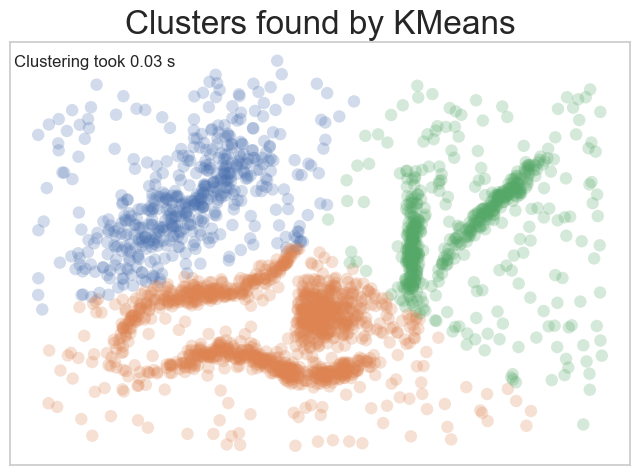

In [193]:
#Plotting the KMeans model with the best parameters
plot_clusters(data, cluster.KMeans, (), {'n_clusters':3, "random_state":1, "max_iter":1000, "n_init":5, 
                                         'init':'k-means++', 'tol':0.0001, 'verbose':0, 'copy_x':True, 
                                         'algorithm':'lloyd'})


## 2. Affinity Propagation

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_affinity_propagation.py:143: ConvergenceWarning: Affinity propagation did not converge, this model may return degenerate cluster centers and labels.
  warnings.warn(


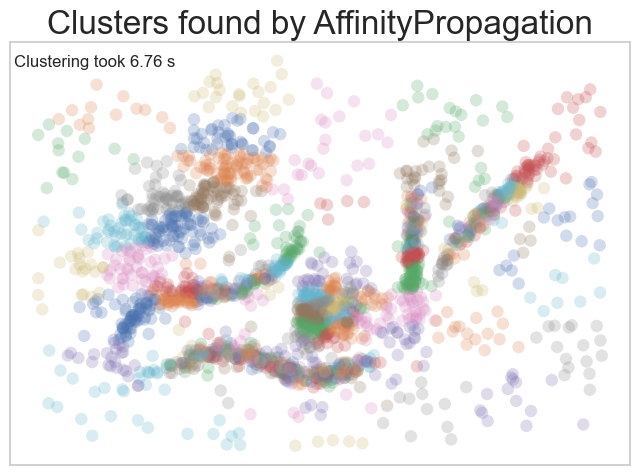

In [194]:
#Plotting the Affinity Propagation model with the default parameters
plot_clusters(data, cluster.AffinityPropagation, (), {})

### 2.1 Finding the best preference and damping parameters

In [196]:
# Try different preference parameter values
prefs = np.linspace(-50, 0, 11)
dampings = np.linspace(0.5, 1, 11)[:-1]
n_clusters = []
parameters = list()

# Fit the clustering model for each preference parameter value
for pref in prefs:
    for damping in dampings:
        try:
            af = cluster.AffinityPropagation(preference=pref, damping=damping)
            af.fit(data)
            n_clusters.append(len(af.cluster_centers_indices_))
            used_parameters = "preference: " + str(pref) + ", " + "damping: " + str(damping)
            parameters.append(used_parameters)
        except:
            pass

df = pd.DataFrame(n_clusters, index =parameters, columns =['Cluster_Number'])
df

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_affinity_propagation.py:143: ConvergenceWarning: Affinity propagation did not converge, this model may return degenerate cluster centers and labels.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_affinity_propagation.py:143: ConvergenceWarning: Affinity propagation did not converge, this model may return degenerate cluster centers and labels.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_affinity_propagation.py:143: ConvergenceWarning: Affinity propagation did not converge, this model may return degenerate cluster centers and labels.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_affinity_propagation.py:143: ConvergenceWarning: Affinity propagation did not converge, this model may return degenerate cluster centers and labels.
  warnings.warn(
/Users/hasan

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_affinity_propagation.py:143: ConvergenceWarning: Affinity propagation did not converge, this model may return degenerate cluster centers and labels.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_affinity_propagation.py:143: ConvergenceWarning: Affinity propagation did not converge, this model may return degenerate cluster centers and labels.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_affinity_propagation.py:143: ConvergenceWarning: Affinity propagation did not converge, this model may return degenerate cluster centers and labels.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_affinity_propagation.py:143: ConvergenceWarning: Affinity propagation did not converge, this model may return degenerate cluster centers and labels.
  warnings.warn(
/Users/hasan

,Cluster_Number
"preference: -50.0, damping: 0.5",2309
"preference: -50.0, damping: 0.55",2309
"preference: -50.0, damping: 0.6",1827
"preference: -50.0, damping: 0.65",2309
"preference: -50.0, damping: 0.7",2306
...,...
"preference: 0.0, damping: 0.75",2309
"preference: 0.0, damping: 0.8",2309
"preference: 0.0, damping: 0.8500000000000001",2309
"preference: 0.0, damping: 0.9",2309


In [212]:
#Finding the best hyperparameters with the inertia and silhoutte score
prefs = np.linspace(-50, 0, 11)
dampings = np.linspace(0.5, 1, 11)[:-1]

n_clusters_list = []
parameters = list()
inertia_list = []
silhouette_list = []

for pref in prefs:
    for damping in dampings:
        af = cluster.AffinityPropagation(preference=pref, damping=damping)
        af.fit(data)
        n_clusters_list.append(len(af.cluster_centers_indices_))
        used_parameters = "preference: " + str(pref) + ", " + "damping: " + str(damping)
        try:
            silhouette_avg = metrics.silhouette_score(data, af.labels_)
        except:
            silhouette_avg = "-"

        # Get the cluster labels and the number of clusters
        labels = af.labels_
        unique_labels = np.unique(labels)
        n_clusters = len(unique_labels)

        # Get the cluster centers
        cluster_centers = np.zeros((n_clusters, data.shape[1]))
        for i in range(n_clusters):
            cluster_centers[i] = np.mean(data[labels == unique_labels[i]], axis=0)

        # Calculate the inertia score
        inertia = 0.0
        for i in range(len(data)):
            # Calculate the distance to the nearest cluster center
            distances = [((data[i] - center) ** 2).sum() for center in cluster_centers]
            min_distance = min(distances)
            # Add the squared distance to the inertia score
            inertia += min_distance



        inertia_list.append(inertia)       
        silhouette_list.append(silhouette_avg)
        parameters.append(used_parameters)
        

df = pd.DataFrame(list(zip(n_clusters_list, silhouette_list, inertia_list)), index =parameters, columns =['Cluster_Number','Silhoutte_Score', 'Inertia_Score'])
df


/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_affinity_propagation.py:143: ConvergenceWarning: Affinity propagation did not converge, this model may return degenerate cluster centers and labels.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_affinity_propagation.py:143: ConvergenceWarning: Affinity propagation did not converge, this model may return degenerate cluster centers and labels.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_affinity_propagation.py:143: ConvergenceWarning: Affinity propagation did not converge, this model may return degenerate cluster centers and labels.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_affinity_propagation.py:143: ConvergenceWarning: Affinity propagation did not converge, this model may return degenerate cluster centers and labels.
  warnings.warn(
/Users/hasan

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_affinity_propagation.py:143: ConvergenceWarning: Affinity propagation did not converge, this model may return degenerate cluster centers and labels.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_affinity_propagation.py:143: ConvergenceWarning: Affinity propagation did not converge, this model may return degenerate cluster centers and labels.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_affinity_propagation.py:143: ConvergenceWarning: Affinity propagation did not converge, this model may return degenerate cluster centers and labels.
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_affinity_propagation.py:143: ConvergenceWarning: Affinity propagation did not converge, this model may return degenerate cluster centers and labels.
  warnings.warn(
/Users/hasan

,Cluster_Number,Silhoutte_Score,Inertia_Score
"preference: -50.0, damping: 0.5",2309,-,0.0
"preference: -50.0, damping: 0.55",2309,-,0.0
"preference: -50.0, damping: 0.6",2309,-,0.0
"preference: -50.0, damping: 0.65",2309,-,0.0
"preference: -50.0, damping: 0.7",2309,-,0.0
...,...,...,...
"preference: 0.0, damping: 0.75",2309,-,0.0
"preference: 0.0, damping: 0.8",2309,-,0.0
"preference: 0.0, damping: 0.8500000000000001",2309,-,0.0
"preference: 0.0, damping: 0.9",2309,-,0.0


In [213]:
df[df.Cluster_Number==3].sort_values(by=['Silhoutte_Score'])

,Cluster_Number,Silhoutte_Score,Inertia_Score
"preference: -50.0, damping: 0.8",3,0.388928,90.507088
"preference: -45.0, damping: 0.8500000000000001",3,0.417918,88.460005
"preference: -40.0, damping: 0.8500000000000001",3,0.425179,88.950015
"preference: -50.0, damping: 0.75",3,0.42982,87.589481
"preference: -25.0, damping: 0.8",3,0.435549,87.700505
"preference: -45.0, damping: 0.9",3,0.436518,87.350346
"preference: -30.0, damping: 0.95",3,0.437253,87.311625
"preference: -25.0, damping: 0.95",3,0.438455,87.256659
"preference: -40.0, damping: 0.7",3,0.438458,86.494274
"preference: -40.0, damping: 0.75",3,0.439555,86.541829


In [214]:
df[df.Cluster_Number==3].sort_values(by=['Inertia_Score'])

,Cluster_Number,Silhoutte_Score,Inertia_Score
"preference: -30.0, damping: 0.8500000000000001",3,0.459065,85.231743
"preference: -35.0, damping: 0.9",3,0.458763,85.237091
"preference: -25.0, damping: 0.7",3,0.462552,85.240325
"preference: -25.0, damping: 0.8500000000000001",3,0.460356,85.247095
"preference: -40.0, damping: 0.9",3,0.458497,85.253124
"preference: -30.0, damping: 0.8",3,0.460053,85.265919
"preference: -45.0, damping: 0.8",3,0.462945,85.301997
"preference: -40.0, damping: 0.8",3,0.462945,85.301997
"preference: -30.0, damping: 0.65",3,0.458878,85.323749
"preference: -20.0, damping: 0.95",3,0.458878,85.323749


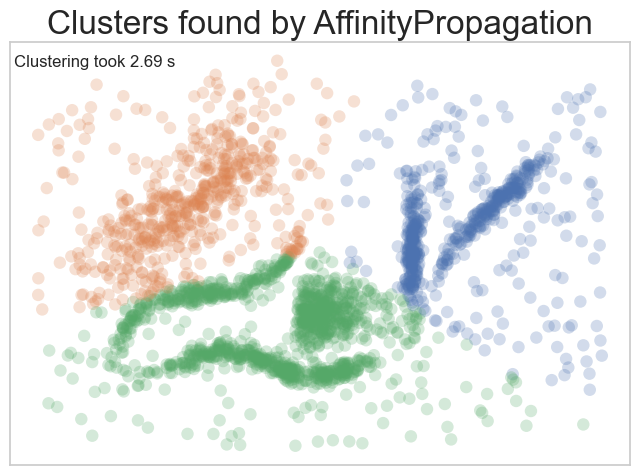

In [215]:
#Plotting the Affinity Propagation model
plot_clusters(data, cluster.AffinityPropagation, (), {'preference':-30.0, 'damping':0.85})

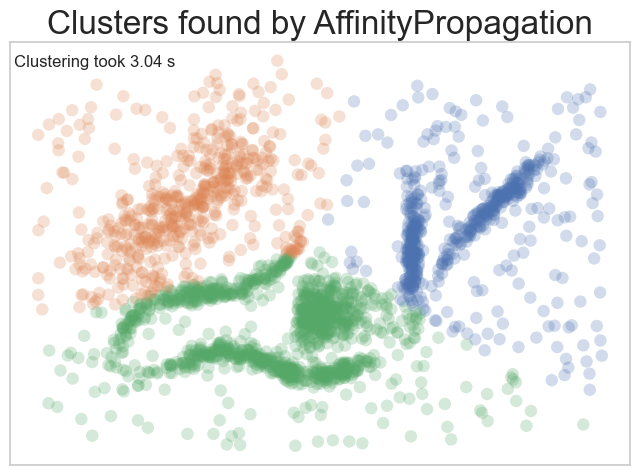

In [216]:
#Plotting the Affinity Propagation model
plot_clusters(data, cluster.AffinityPropagation, (), {'preference':-35.0, 'damping':0.9})

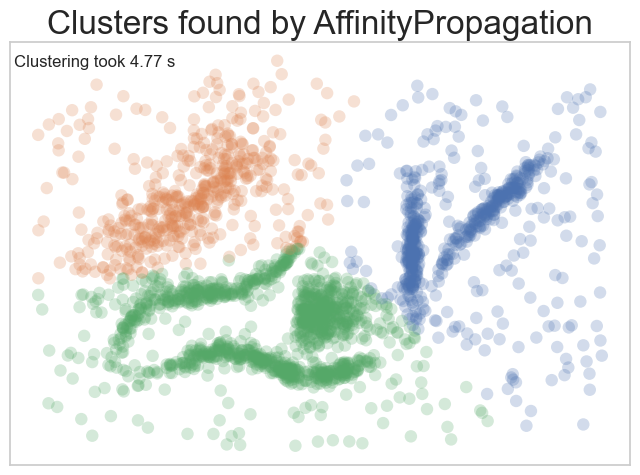

In [217]:
#Plotting the Affinity Propagation model
plot_clusters(data, cluster.AffinityPropagation, (), {'preference':-25.0, 'damping':0.7})

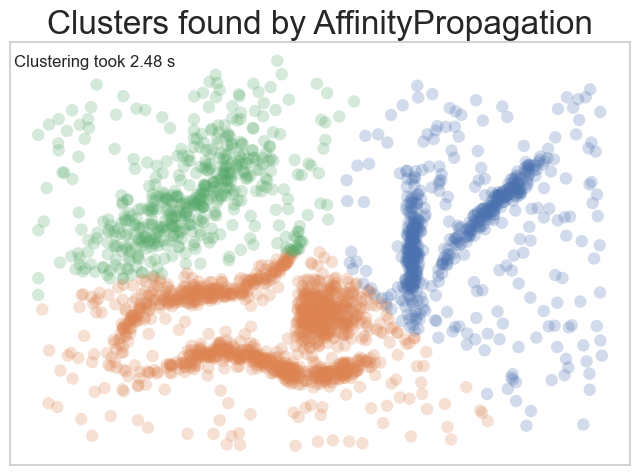

In [218]:
#Plotting the Affinity Propagation model
plot_clusters(data, cluster.AffinityPropagation, (), {'preference':-25.0, 'damping':0.85})

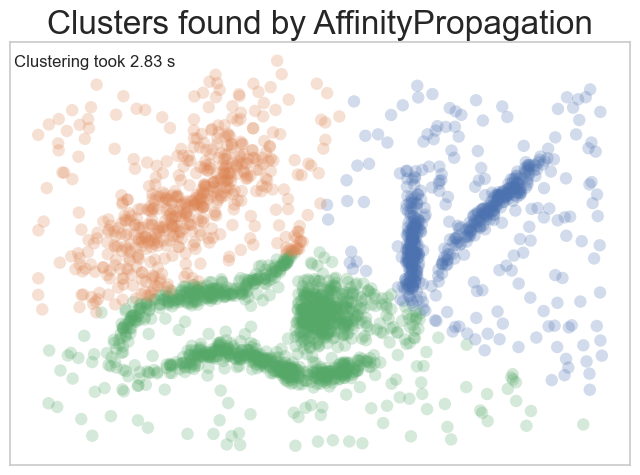

In [219]:
#Plotting the Affinity Propagation model
plot_clusters(data, cluster.AffinityPropagation, (), {'preference':-40.0, 'damping':0.9})

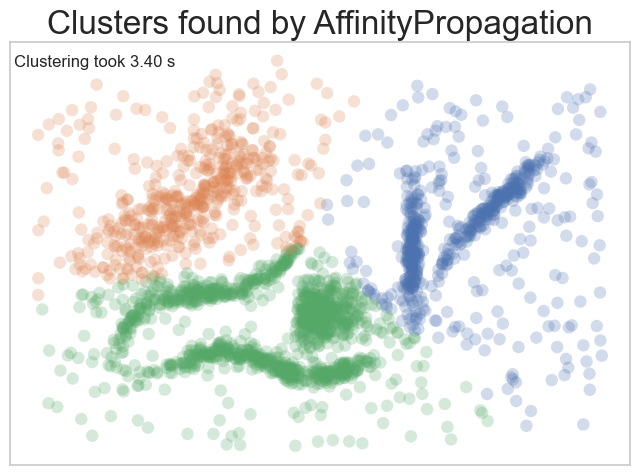

In [220]:
#Plotting the Affinity Propagation model
plot_clusters(data, cluster.AffinityPropagation, (), {'preference':-30.0, 'damping':0.8})

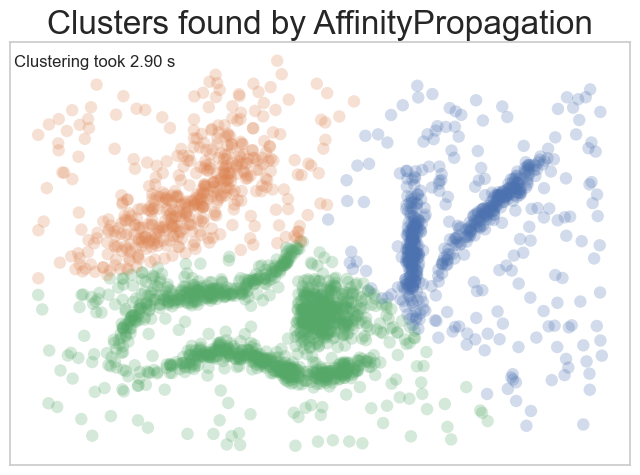

In [221]:
#Plotting the Affinity Propagation model
plot_clusters(data, cluster.AffinityPropagation, (), {'preference':-45.0, 'damping':0.8})

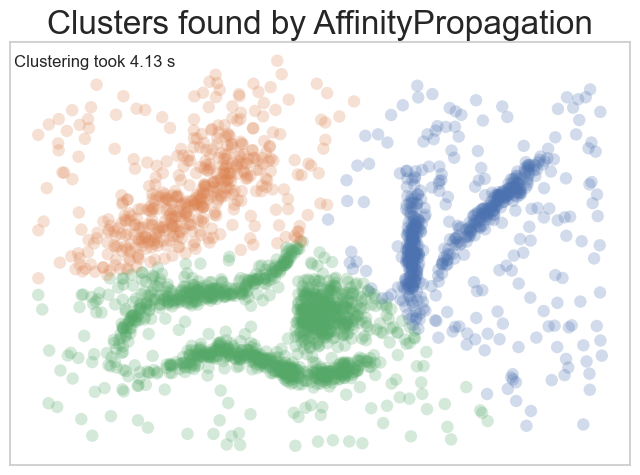

In [222]:
#Plotting the Affinity Propagation model
plot_clusters(data, cluster.AffinityPropagation, (), {'preference':-40.0, 'damping':0.8})

### 2.2 Finding the best max_iter, convergence_iter, copy, verbose, random_state parameters

In [223]:
#Finding the best hyperparameters with the inertia and silhoutte score
max_iters = [300,400,500]
convergence_iters = [15,20,25]
copies = [True, False]
verboses = [True, False]
random_states = [100,200,300]

n_clusters_list = []
parameters = list()
inertia_list = []
silhouette_list = []

for max_iter in max_iters:
    for convergence_iter in convergence_iters:
        for copy in copies:
            for verbose in verboses:
                for random_state in random_states:
                    af = cluster.AffinityPropagation(preference=-45, damping=0.8, max_iter=max_iter, convergence_iter=convergence_iter, 
                                                    copy=copy, verbose=verbose, random_state=random_state)
                    af.fit(data)
                    n_clusters_list.append(len(af.cluster_centers_indices_))
                    used_parameters = "max_iter: " + str(max_iter) + ", " + "convergence_iter: " + str(convergence_iter) + ", " + "copy: " + str(copy) + ", " + "verbose: " + str(verbose) + ", " + "random_state: " + str(random_state)
                    try:
                        silhouette_avg = metrics.silhouette_score(data, af.labels_)
                    except:
                        silhouette_avg = "-"

                    # Get the cluster labels and the number of clusters
                    labels = af.labels_
                    unique_labels = np.unique(labels)
                    n_clusters = len(unique_labels)

                    # Get the cluster centers
                    cluster_centers = np.zeros((n_clusters, data.shape[1]))
                    for i in range(n_clusters):
                        cluster_centers[i] = np.mean(data[labels == unique_labels[i]], axis=0)

                    # Calculate the inertia score
                    inertia = 0.0
                    for i in range(len(data)):
                        # Calculate the distance to the nearest cluster center
                        distances = [((data[i] - center) ** 2).sum() for center in cluster_centers]
                        min_distance = min(distances)
                        # Add the squared distance to the inertia score
                        inertia += min_distance



                    inertia_list.append(inertia)       
                    silhouette_list.append(silhouette_avg)
                    parameters.append(used_parameters)
        

df = pd.DataFrame(list(zip(n_clusters_list, silhouette_list, inertia_list)), index =parameters, columns =['Cluster_Number','Silhoutte_Score', 'Inertia_Score'])
df


Converged after 76 iterations.
Converged after 76 iterations.
Converged after 76 iterations.
Converged after 76 iterations.
Converged after 76 iterations.
Converged after 76 iterations.
Converged after 81 iterations.
Converged after 81 iterations.
Converged after 81 iterations.
Converged after 81 iterations.
Converged after 81 iterations.
Converged after 81 iterations.
Converged after 86 iterations.
Converged after 86 iterations.
Converged after 86 iterations.
Converged after 86 iterations.
Converged after 86 iterations.
Converged after 86 iterations.
Converged after 76 iterations.
Converged after 76 iterations.
Converged after 76 iterations.
Converged after 76 iterations.
Converged after 76 iterations.
Converged after 76 iterations.
Converged after 81 iterations.
Converged after 81 iterations.
Converged after 81 iterations.
Converged after 81 iterations.
Converged after 81 iterations.
Converged after 81 iterations.
Converged after 86 iterations.
Converged after 86 iterations.
Converge

,Cluster_Number,Silhoutte_Score,Inertia_Score
"max_iter: 300, convergence_iter: 15, copy: True, verbose: True, random_state: 100",3,0.462945,85.301997
"max_iter: 300, convergence_iter: 15, copy: True, verbose: True, random_state: 200",3,0.462945,85.301997
"max_iter: 300, convergence_iter: 15, copy: True, verbose: True, random_state: 300",3,0.462945,85.301997
"max_iter: 300, convergence_iter: 15, copy: True, verbose: False, random_state: 100",3,0.462945,85.301997
"max_iter: 300, convergence_iter: 15, copy: True, verbose: False, random_state: 200",3,0.462945,85.301997
...,...,...,...
"max_iter: 500, convergence_iter: 25, copy: False, verbose: True, random_state: 200",3,0.462945,85.301997
"max_iter: 500, convergence_iter: 25, copy: False, verbose: True, random_state: 300",3,0.462945,85.301997
"max_iter: 500, convergence_iter: 25, copy: False, verbose: False, random_state: 100",3,0.462945,85.301997
"max_iter: 500, convergence_iter: 25, copy: False, verbose: False, random_state: 200",3,0.462945,85.301997


### 2.3 Final

In [227]:
af = cluster.AffinityPropagation(preference=-45, damping=0.8, max_iter=300, convergence_iter=15, 
                                copy=True, verbose=True, random_state=100, affinity='euclidean')
af.fit(data)
n_clusters_list.append(len(af.cluster_centers_indices_))
used_parameters = "max_iter: " + str(max_iter) + ", " + "convergence_iter: " + str(convergence_iter) + ", " + "copy: " + str(copy) + ", " + "verbose: " + str(verbose) + ", " + "random_state: " + str(random_state)
metrics.silhouette_score(data, af.labels_)


Converged after 76 iterations.


0.46294521394560634

In [228]:
af = cluster.AffinityPropagation(preference=-45, damping=0.8, max_iter=300, convergence_iter=15, 
                                copy=True, verbose=True, random_state=100, affinity='euclidean')
af.fit(data)
# Get the cluster labels and the number of clusters
labels = af.labels_
unique_labels = np.unique(labels)
n_clusters = len(unique_labels)

# Get the cluster centers
cluster_centers = np.zeros((n_clusters, data.shape[1]))
for i in range(n_clusters):
    cluster_centers[i] = np.mean(data[labels == unique_labels[i]], axis=0)

# Calculate the inertia score
inertia = 0.0
for i in range(len(data)):
    # Calculate the distance to the nearest cluster center
    distances = [((data[i] - center) ** 2).sum() for center in cluster_centers]
    min_distance = min(distances)
    # Add the squared distance to the inertia score
    inertia += min_distance
inertia

Converged after 76 iterations.


85.3019974514542

Converged after 76 iterations.


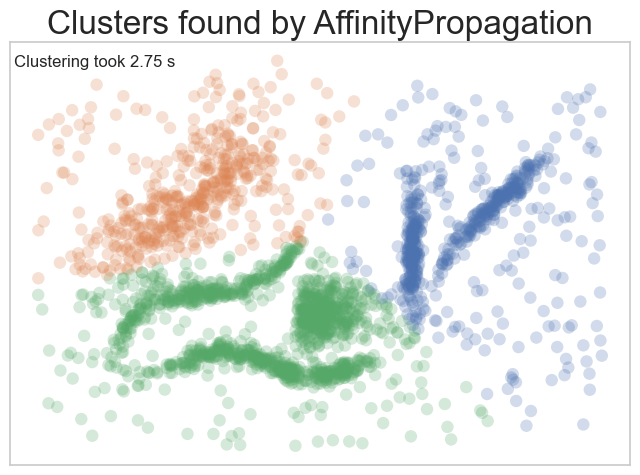

In [229]:
#Plotting the Affinity Propagation model
plot_clusters(data, cluster.AffinityPropagation, (), {'preference':-45.0, 'damping':0.8, 'max_iter': 300,
                                                      'convergence_iter':15, 'copy':True, 'affinity':'euclidean', 
                                                     'verbose': True, 'random_state':100})


## 3. Mean Shift

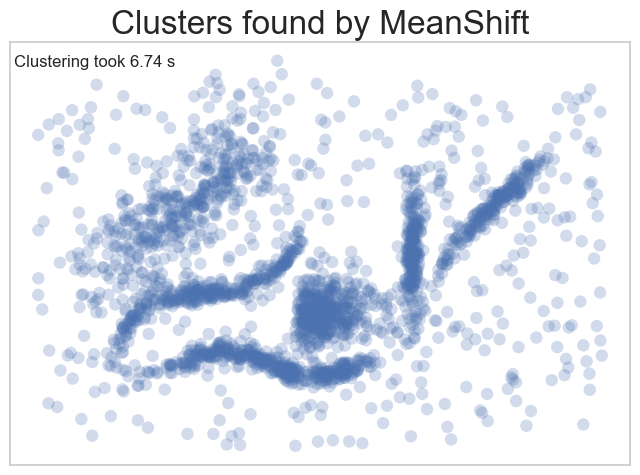

In [230]:
#Plotting the Mean Shift model
plot_clusters(data, cluster.MeanShift, (), {})

### 3.1 Finding the best bandwidth parameter

In [252]:
#Finding the best hyperparameters with the inertia and silhoutte score
quantiles = np.linspace(0, 1, 21)[1:]
n_sampless = np.linspace(0, 1000, 11)[1:]

n_clusters_list = []
parameters = list()
inertia_list = []
silhouette_list = []

for quantile in quantiles:
    for n_samples in n_sampless:
        n_samples = int(n_samples)
        bandwidth = cluster.estimate_bandwidth(data, quantile=quantile, n_samples=n_samples)
        ms = cluster.MeanShift(bandwidth=bandwidth)
        ms.fit(data)
        
        used_parameters = "quantile: " + str(quantile) + ", " + "n_samples: " + str(n_samples)
        try:
            silhouette_avg = metrics.silhouette_score(data, ms.labels_)
        except:
            silhouette_avg = "-"


        # Get the cluster labels and the number of clusters
        labels = ms.labels_
        unique_labels = np.unique(labels)
        n_clusters = len(unique_labels)

        # Get the cluster centers
        cluster_centers = np.zeros((n_clusters, data.shape[1]))
        for i in range(n_clusters):
            cluster_centers[i] = np.mean(data[labels == unique_labels[i]], axis=0)

        # Calculate the inertia score
        inertia = 0.0
        for i in range(len(data)):
            # Calculate the distance to the nearest cluster center
            distances = [((data[i] - center) ** 2).sum() for center in cluster_centers]
            min_distance = min(distances)
            # Add the squared distance to the inertia score
            inertia += min_distance


        n_clusters_list.append(len(set(labels)))
        inertia_list.append(inertia)       
        silhouette_list.append(silhouette_avg)
        parameters.append(used_parameters)
        

df = pd.DataFrame(list(zip(n_clusters_list, silhouette_list, inertia_list)), index =parameters, columns =['Cluster_Number','Silhoutte_Score', 'Inertia_Score'])
df


,Cluster_Number,Silhoutte_Score,Inertia_Score
"quantile: 0.05, n_samples: 100",36,0.367579,10.932784
"quantile: 0.05, n_samples: 200",29,0.328551,14.100528
"quantile: 0.05, n_samples: 300",23,0.362438,18.940938
"quantile: 0.05, n_samples: 400",22,0.36461,18.902178
"quantile: 0.05, n_samples: 500",23,0.383033,15.536872
...,...,...,...
"quantile: 1.0, n_samples: 600",1,-,244.864952
"quantile: 1.0, n_samples: 700",1,-,244.864952
"quantile: 1.0, n_samples: 800",1,-,244.864952
"quantile: 1.0, n_samples: 900",1,-,244.864952


In [259]:
df[df.Cluster_Number==3].sort_values(by=['Inertia_Score'])

,Cluster_Number,Silhoutte_Score,Inertia_Score
"quantile: 0.2, n_samples: 900",3,0.427517,87.737977
"quantile: 0.2, n_samples: 500",3,0.426845,87.764140
"quantile: 0.2, n_samples: 400",3,0.426604,87.771390
"quantile: 0.2, n_samples: 700",3,0.426604,87.771390
"quantile: 0.2, n_samples: 800",3,0.426604,87.771390
"quantile: 0.2, n_samples: 1000",3,0.427169,87.772093
"quantile: 0.2, n_samples: 600",3,0.426597,87.774888
"quantile: 0.2, n_samples: 300",3,0.426784,87.776703
"quantile: 0.2, n_samples: 200",3,0.426104,87.811461
"quantile: 0.2, n_samples: 100",3,0.426012,87.820981


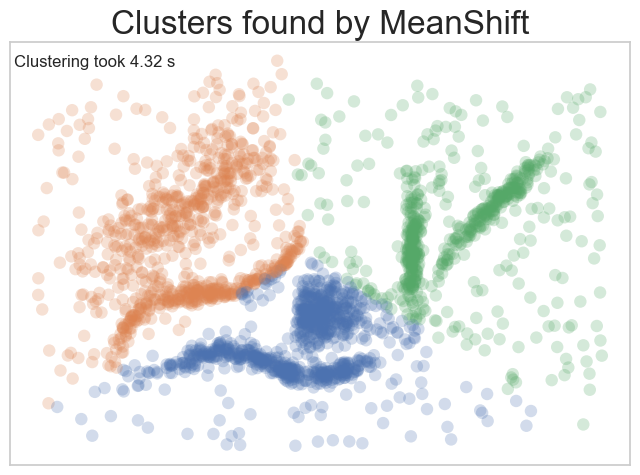

In [260]:
#Plotting the Mean Shift model
bandwidth = cluster.estimate_bandwidth(data, quantile=0.2, n_samples=900)
plot_clusters(data, cluster.MeanShift, (), {'bandwidth':bandwidth})

### 3.2 Finding the best bin_seeding parameter

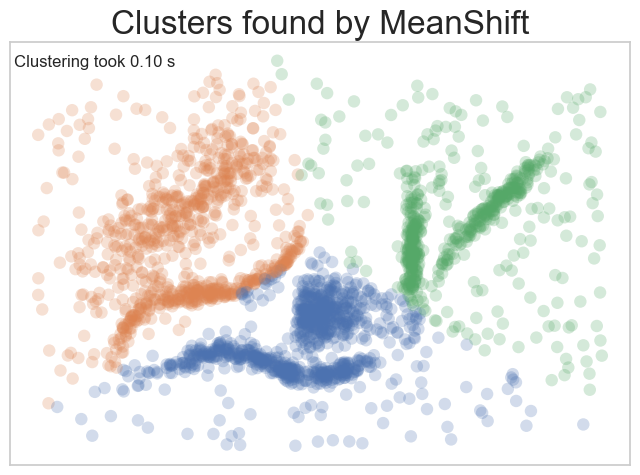

In [261]:
#Plotting the Mean Shift model
bandwidth = cluster.estimate_bandwidth(data, quantile=0.2, n_samples=900)
plot_clusters(data, cluster.MeanShift, (), {'bandwidth':bandwidth, 'bin_seeding':True})

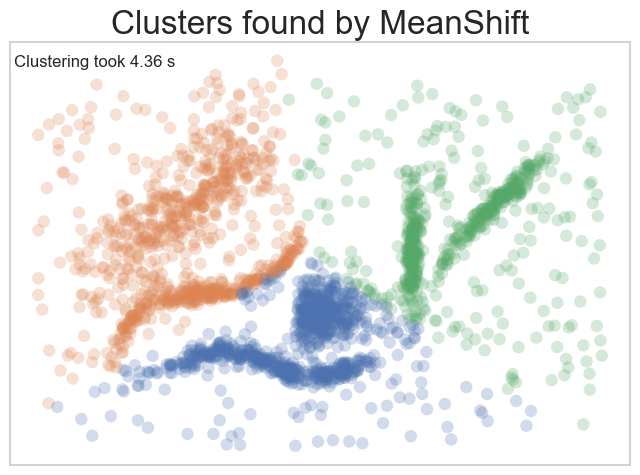

In [262]:
#Plotting the Mean Shift model
bandwidth = cluster.estimate_bandwidth(data, quantile=0.2, n_samples=900)
plot_clusters(data, cluster.MeanShift, (), {'bandwidth':bandwidth, 'bin_seeding':False})

### 3.3 Finding the best min_bin_freq parameter

In [266]:
#Finding the best hyperparameters with the inertia and silhoutte score
min_bin_freqs = np.linspace(0, 200, 41)[1:]

n_clusters_list = []
parameters = list()
inertia_list = []
silhouette_list = []

for min_bin_freq in min_bin_freqs:
    bandwidth = cluster.estimate_bandwidth(data, quantile=0.2, n_samples=900)
    min_bin_freq = int(min_bin_freq)
    ms = cluster.MeanShift(bandwidth=bandwidth, bin_seeding=True, min_bin_freq=min_bin_freq)
    ms.fit(data)

    used_parameters = "min_bin_freq: " + str(min_bin_freq)
    silhouette_avg = metrics.silhouette_score(data, ms.labels_)


    # Get the cluster labels and the number of clusters
    labels = ms.labels_
    unique_labels = np.unique(labels)
    n_clusters = len(unique_labels)

    # Get the cluster centers
    cluster_centers = np.zeros((n_clusters, data.shape[1]))
    for i in range(n_clusters):
        cluster_centers[i] = np.mean(data[labels == unique_labels[i]], axis=0)

    # Calculate the inertia score
    inertia = 0.0
    for i in range(len(data)):
        # Calculate the distance to the nearest cluster center
        distances = [((data[i] - center) ** 2).sum() for center in cluster_centers]
        min_distance = min(distances)
        # Add the squared distance to the inertia score
        inertia += min_distance


    n_clusters_list.append(len(set(labels)))
    inertia_list.append(inertia)       
    silhouette_list.append(silhouette_avg)
    parameters.append(used_parameters)


df = pd.DataFrame(list(zip(n_clusters_list, silhouette_list, inertia_list)), index =parameters, columns =['Cluster_Number','Silhoutte_Score', 'Inertia_Score'])
df


,Cluster_Number,Silhoutte_Score,Inertia_Score
min_bin_freq: 5,3,0.434053,87.485896
min_bin_freq: 10,3,0.434053,87.485896
min_bin_freq: 15,3,0.434053,87.485896
min_bin_freq: 20,3,0.434053,87.485896
min_bin_freq: 25,3,0.434053,87.485896
min_bin_freq: 30,3,0.434053,87.485896
min_bin_freq: 35,3,0.434053,87.485896
min_bin_freq: 40,3,0.434053,87.485896
min_bin_freq: 45,3,0.434053,87.485896
min_bin_freq: 50,3,0.434053,87.485896


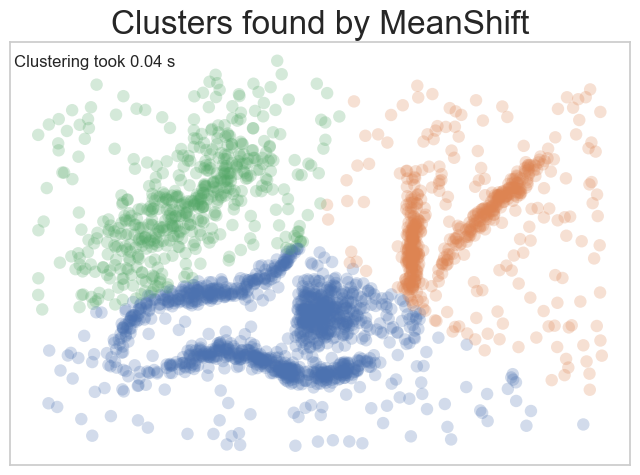

In [267]:
#Plotting the Mean Shift model
bandwidth = cluster.estimate_bandwidth(data, quantile=0.2, n_samples=900)
plot_clusters(data, cluster.MeanShift, (), {'bandwidth':bandwidth, 'bin_seeding':True, 'min_bin_freq':165})

### 3.4 Finding the best seeds, n_jobs, max_iter parameter

In [269]:
#Finding the best hyperparameters with the inertia and silhoutte score
seedss = [[[-1, -1], [0, 0], [1, 1]],[[-5, -5], [0, 0], [5, 5]],[[-10, -10], [0, 0], [10, 10]],None]
n_jobss = [-1,10,None]
max_iters = [300,500,1000]

n_clusters_list = []
parameters = list()
inertia_list = []
silhouette_list = []

for seeds in seedss:
    for n_jobs in n_jobss:
        for max_iter in max_iters:
            bandwidth = cluster.estimate_bandwidth(data, quantile=0.2, n_samples=900)
            min_bin_freq = int(min_bin_freq)
            ms = cluster.MeanShift(bandwidth=bandwidth, bin_seeding=True, min_bin_freq=165, seeds=seeds, n_jobs=n_jobs, 
                                  max_iter=max_iter)
            ms.fit(data)

            used_parameters = "seeds: " + str(seeds) + ", " + "n_jobs: " + str(n_jobs) + ", " + "max_iter: " + str(max_iter)
            try:
                silhouette_avg = metrics.silhouette_score(data, ms.labels_)
            except:
                silhouette_avg = "-"

            # Get the cluster labels and the number of clusters
            labels = ms.labels_
            unique_labels = np.unique(labels)
            n_clusters = len(unique_labels)

            # Get the cluster centers
            cluster_centers = np.zeros((n_clusters, data.shape[1]))
            for i in range(n_clusters):
                cluster_centers[i] = np.mean(data[labels == unique_labels[i]], axis=0)

            # Calculate the inertia score
            inertia = 0.0
            for i in range(len(data)):
                # Calculate the distance to the nearest cluster center
                distances = [((data[i] - center) ** 2).sum() for center in cluster_centers]
                min_distance = min(distances)
                # Add the squared distance to the inertia score
                inertia += min_distance


            n_clusters_list.append(len(set(labels)))
            inertia_list.append(inertia)       
            silhouette_list.append(silhouette_avg)
            parameters.append(used_parameters)


df = pd.DataFrame(list(zip(n_clusters_list, silhouette_list, inertia_list)), index =parameters, columns =['Cluster_Number','Silhoutte_Score', 'Inertia_Score'])
df


,Cluster_Number,Silhoutte_Score,Inertia_Score
"seeds: [[-1, -1], [0, 0], [1, 1]], n_jobs: -1, max_iter: 300",1,-,244.864952
"seeds: [[-1, -1], [0, 0], [1, 1]], n_jobs: -1, max_iter: 500",1,-,244.864952
"seeds: [[-1, -1], [0, 0], [1, 1]], n_jobs: -1, max_iter: 1000",1,-,244.864952
"seeds: [[-1, -1], [0, 0], [1, 1]], n_jobs: 10, max_iter: 300",1,-,244.864952
"seeds: [[-1, -1], [0, 0], [1, 1]], n_jobs: 10, max_iter: 500",1,-,244.864952
"seeds: [[-1, -1], [0, 0], [1, 1]], n_jobs: 10, max_iter: 1000",1,-,244.864952
"seeds: [[-1, -1], [0, 0], [1, 1]], n_jobs: None, max_iter: 300",1,-,244.864952
"seeds: [[-1, -1], [0, 0], [1, 1]], n_jobs: None, max_iter: 500",1,-,244.864952
"seeds: [[-1, -1], [0, 0], [1, 1]], n_jobs: None, max_iter: 1000",1,-,244.864952
"seeds: [[-5, -5], [0, 0], [5, 5]], n_jobs: -1, max_iter: 300",1,-,244.864952


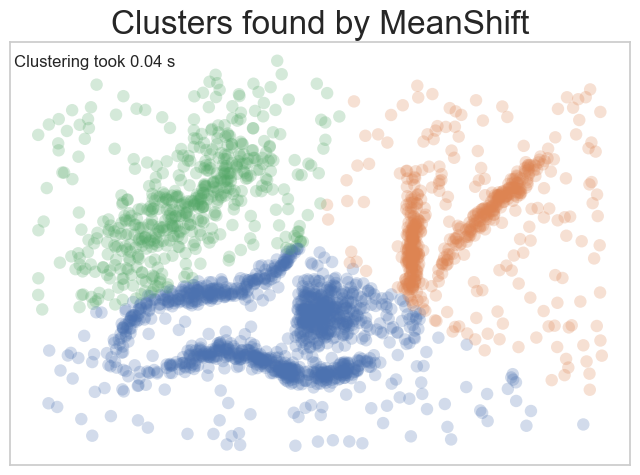

In [270]:
#Plotting the Mean Shift model
bandwidth = cluster.estimate_bandwidth(data, quantile=0.2, n_samples=900)
plot_clusters(data, cluster.MeanShift, (), {'bandwidth':bandwidth, 'bin_seeding':True, 'min_bin_freq':165, 'seeds':None, 
                                           'n_jobs':None, 'max_iter':300})

### 3.5 Finding the best cluster_all parameter

In [275]:
bandwidth = cluster.estimate_bandwidth(data, quantile=0.2, n_samples=900)
ms = cluster.MeanShift(bandwidth=bandwidth, bin_seeding=True, min_bin_freq=165, seeds=None, n_jobs=None, 
                      max_iter=300, cluster_all=True)
ms.fit(data)
metrics.silhouette_score(data, ms.labels_)

0.4606413191760174

In [276]:
bandwidth = cluster.estimate_bandwidth(data, quantile=0.2, n_samples=900)
ms = cluster.MeanShift(bandwidth=bandwidth, bin_seeding=True, min_bin_freq=165, seeds=None, n_jobs=None, 
                      max_iter=300, cluster_all=True)
ms.fit(data)
# Get the cluster labels and the number of clusters
labels = ms.labels_
unique_labels = np.unique(labels)
n_clusters = len(unique_labels)

# Get the cluster centers
cluster_centers = np.zeros((n_clusters, data.shape[1]))
for i in range(n_clusters):
    cluster_centers[i] = np.mean(data[labels == unique_labels[i]], axis=0)

# Calculate the inertia score
inertia = 0.0
for i in range(len(data)):
    # Calculate the distance to the nearest cluster center
    distances = [((data[i] - center) ** 2).sum() for center in cluster_centers]
    min_distance = min(distances)
    # Add the squared distance to the inertia score
    inertia += min_distance
inertia

85.21153310505669

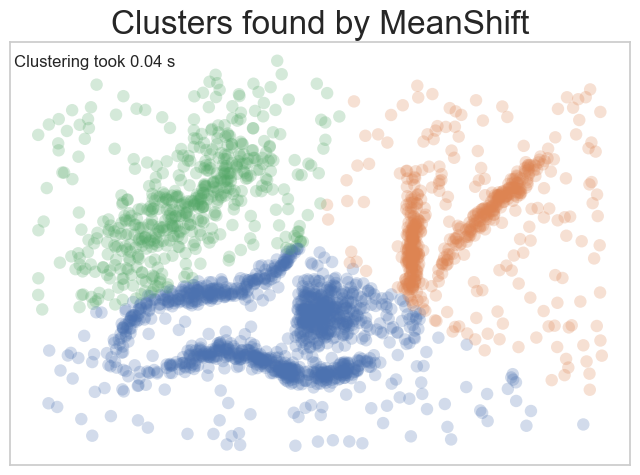

In [272]:
#Plotting the Mean Shift model
bandwidth = cluster.estimate_bandwidth(data, quantile=0.2, n_samples=900)
plot_clusters(data, cluster.MeanShift, (), {'bandwidth':bandwidth, 'bin_seeding':True, 'min_bin_freq':165, 'seeds':None, 
                                           'n_jobs':None, 'max_iter':300, 'cluster_all':True})

In [274]:
bandwidth = cluster.estimate_bandwidth(data, quantile=0.2, n_samples=900)
ms = cluster.MeanShift(bandwidth=bandwidth, bin_seeding=True, min_bin_freq=165, seeds=None, n_jobs=None, 
                      max_iter=300, cluster_all=False)
ms.fit(data)
metrics.silhouette_score(data, ms.labels_)


0.3491082104598927

In [277]:
bandwidth = cluster.estimate_bandwidth(data, quantile=0.2, n_samples=900)
ms = cluster.MeanShift(bandwidth=bandwidth, bin_seeding=True, min_bin_freq=165, seeds=None, n_jobs=None, 
                      max_iter=300, cluster_all=False)
ms.fit(data)
# Get the cluster labels and the number of clusters
labels = ms.labels_
unique_labels = np.unique(labels)
n_clusters = len(unique_labels)

# Get the cluster centers
cluster_centers = np.zeros((n_clusters, data.shape[1]))
for i in range(n_clusters):
    cluster_centers[i] = np.mean(data[labels == unique_labels[i]], axis=0)

# Calculate the inertia score
inertia = 0.0
for i in range(len(data)):
    # Calculate the distance to the nearest cluster center
    distances = [((data[i] - center) ** 2).sum() for center in cluster_centers]
    min_distance = min(distances)
    # Add the squared distance to the inertia score
    inertia += min_distance
inertia

79.90250926712083

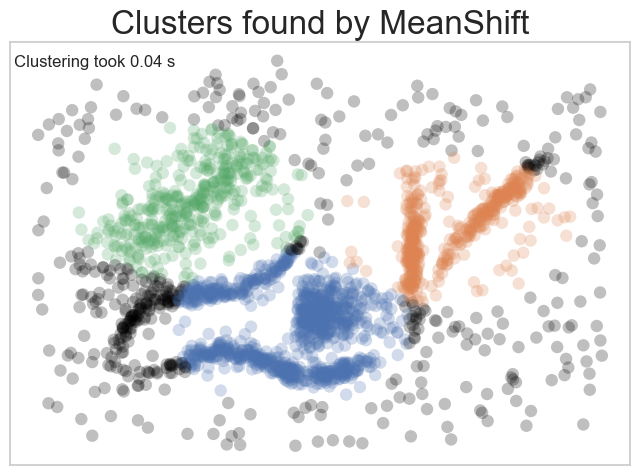

In [271]:
#Plotting the Mean Shift model
bandwidth = cluster.estimate_bandwidth(data, quantile=0.2, n_samples=900)
plot_clusters(data, cluster.MeanShift, (), {'bandwidth':bandwidth, 'bin_seeding':True, 'min_bin_freq':165, 'seeds':None, 
                                           'n_jobs':None, 'max_iter':300, 'cluster_all':False})

### 3.6 Final

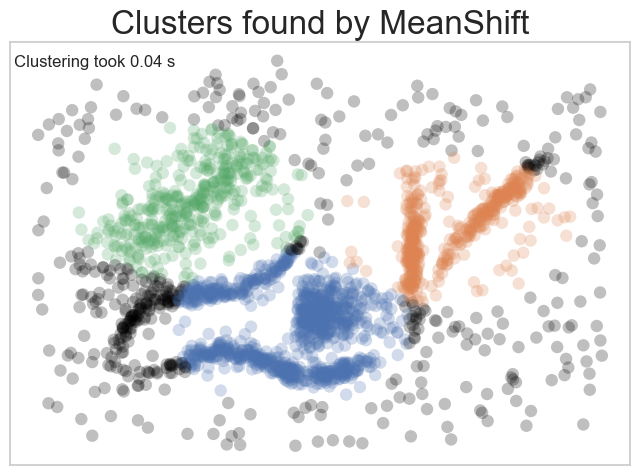

In [273]:
#Plotting the Mean Shift model
bandwidth = cluster.estimate_bandwidth(data, quantile=0.2, n_samples=900)
plot_clusters(data, cluster.MeanShift, (), {'bandwidth':bandwidth, 'bin_seeding':True, 'min_bin_freq':165, 'seeds':None, 
                                           'n_jobs':None, 'max_iter':300, 'cluster_all':False})

## 4. Spectral Clustering

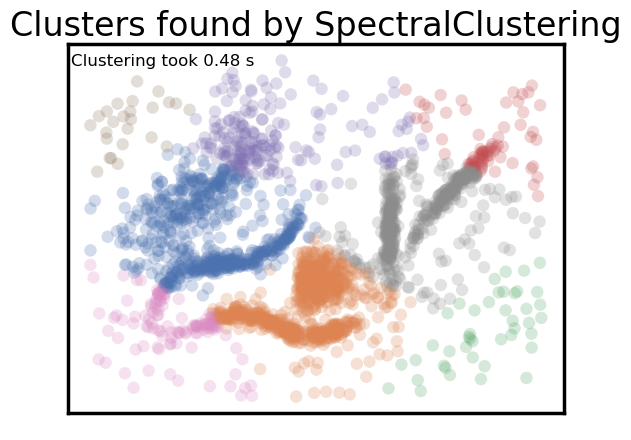

In [7]:
plot_clusters(data, cluster.SpectralClustering, (), {})

### 4.1 Finding the best random_state parameter

In [143]:
# Finding the best parameters with the silhoutte and inertia score
random_states = np.arange(1, 1001, 1)

silhouette_avgs = []
parameters = list()
inertias = []

# Fit the clustering model for each preference parameter value
for random_state in random_states:
    spectral_clustering = cluster.SpectralClustering(n_clusters=3, random_state=random_state)
    spectral_clustering.fit(data)
    silhouette_avg = metrics.silhouette_score(data, spectral_clustering.labels_)
    silhouette_avgs.append(silhouette_avg)
    used_parameters = "random_state: " + str(random_state)
    parameters.append(used_parameters)
    # Get the cluster labels and the number of clusters
    labels = spectral_clustering.labels_
    unique_labels = np.unique(labels)
    n_clusters = len(unique_labels)

    # Get the cluster centers
    cluster_centers = np.zeros((n_clusters, data.shape[1]))
    for i in range(n_clusters):
        cluster_centers[i] = np.mean(data[labels == unique_labels[i]], axis=0)

    # Calculate the inertia score
    inertia = 0.0
    for i in range(len(data)):
        # Calculate the distance to the nearest cluster center
        distances = [((data[i] - center) ** 2).sum() for center in cluster_centers]
        min_distance = min(distances)
        # Add the squared distance to the inertia score
        inertia += min_distance
    inertias.append(inertia)


df = pd.DataFrame(list(zip(silhouette_avgs, inertias)), index =parameters, columns =['Silhoutte_Score', 'Inertia_Score'])
df

,Silhoutte_Score,Inertia_Score
random_state: 1,0.463236,85.165490
random_state: 2,0.463350,85.158315
random_state: 3,0.463236,85.165490
random_state: 4,0.463370,85.164413
random_state: 5,0.463236,85.165490
...,...,...
random_state: 996,0.463236,85.165490
random_state: 997,0.463236,85.165490
random_state: 998,0.463236,85.165490
random_state: 999,0.463236,85.165490


In [144]:
# Finding the best random_state parameter with the silhoutte score
df[df.Silhoutte_Score==df.Silhoutte_Score.max()]

,Silhoutte_Score,Inertia_Score
random_state: 594,0.463467,85.151427


In [145]:
# Finding the best random_state parameter with the inertia score
df[df.Inertia_Score==df.Inertia_Score.max()]

,Silhoutte_Score,Inertia_Score
random_state: 21,0.463207,85.189515
random_state: 63,0.463207,85.189515
random_state: 115,0.463207,85.189515
random_state: 150,0.463207,85.189515
random_state: 173,0.463207,85.189515
random_state: 201,0.463207,85.189515
random_state: 219,0.463207,85.189515
random_state: 222,0.463207,85.189515
random_state: 257,0.463207,85.189515
random_state: 301,0.463207,85.189515


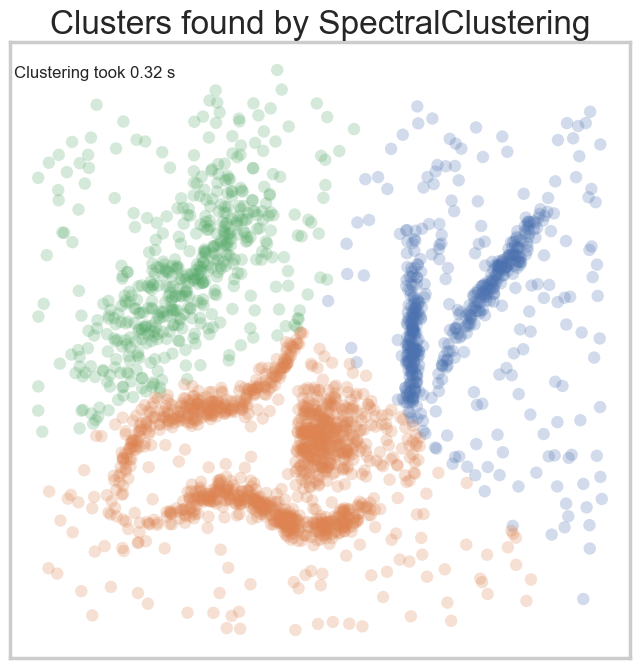

In [146]:
plot_clusters(data, cluster.SpectralClustering, (), {'n_clusters':3, 'random_state':594})

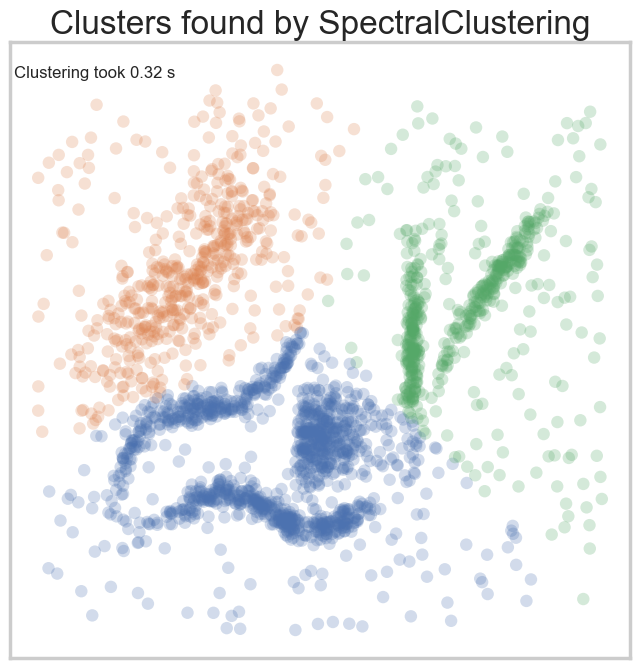

In [147]:
plot_clusters(data, cluster.SpectralClustering, (), {'n_clusters':3, 'random_state':21})

### 4.2 Finding the best eigen_solver, assign_labels, n_components, affinity parameter

In [149]:
# Finding the best parameters with the silhoutte score
eigen_solvers = ['arpack', 'lobpcg', 'amg']
assign_labelss = ['kmeans', 'discretize', 'cluster_qr']
n_componentss = [3,5,10,15]
affinities = ['nearest_neighbors', 'rbf', 'precomputed', 'precomputed_nearest_neighbors']

silhouette_avgs = []
parameters = list()
inertias = []

# Fit the clustering model for each preference parameter value
for eigen_solver in eigen_solvers:
    for assign_labels in assign_labelss:
        for n_components in n_componentss:
            for affinity in affinities:
                try:
                    spectral_clustering = cluster.SpectralClustering(n_clusters=3, random_state=594, eigen_solver=eigen_solver, 
                                                                     assign_labels=assign_labels, n_components=n_components, 
                                                                     n_init=n_init, affinity=affinity
                                                                    )
                    spectral_clustering.fit(data)
                    silhouette_avg = metrics.silhouette_score(data, spectral_clustering.labels_)
                    silhouette_avgs.append(silhouette_avg)
                    used_parameters = "eigen_solver: " + str(eigen_solver) + ", " + "assign_labels: " + str(assign_labels) + ", " + "n_components: " + str(n_components) + ", " + "affinity: " + str(affinity)
                    parameters.append(used_parameters)
                    # Get the cluster labels and the number of clusters
                    labels = spectral_clustering.labels_
                    unique_labels = np.unique(labels)
                    n_clusters = len(unique_labels)

                    # Get the cluster centers
                    cluster_centers = np.zeros((n_clusters, data.shape[1]))
                    for i in range(n_clusters):
                        cluster_centers[i] = np.mean(data[labels == unique_labels[i]], axis=0)

                    # Calculate the inertia score
                    inertia = 0.0
                    for i in range(len(data)):
                        # Calculate the distance to the nearest cluster center
                        distances = [((data[i] - center) ** 2).sum() for center in cluster_centers]
                        min_distance = min(distances)
                        # Add the squared distance to the inertia score
                        inertia += min_distance
                    inertias.append(inertia)
                except:
                    pass


df = pd.DataFrame(list(zip(silhouette_avgs, inertias)), index =parameters, columns =['Silhoutte_Score', 'Inertia_Score'])
df

,Silhoutte_Score,Inertia_Score
"eigen_solver: arpack, assign_labels: kmeans, n_components: 3, affinity: nearest_neighbors",0.433714,87.458997
"eigen_solver: arpack, assign_labels: kmeans, n_components: 3, affinity: rbf",0.463370,85.164413
"eigen_solver: arpack, assign_labels: kmeans, n_components: 5, affinity: nearest_neighbors",0.130688,112.288558
"eigen_solver: arpack, assign_labels: kmeans, n_components: 5, affinity: rbf",0.391182,95.006263
"eigen_solver: arpack, assign_labels: kmeans, n_components: 10, affinity: nearest_neighbors",0.343478,101.638144
...,...,...
"eigen_solver: amg, assign_labels: cluster_qr, n_components: 5, affinity: rbf",0.249270,66.412456
"eigen_solver: amg, assign_labels: cluster_qr, n_components: 10, affinity: nearest_neighbors",0.342907,30.108363
"eigen_solver: amg, assign_labels: cluster_qr, n_components: 10, affinity: rbf",0.271482,36.752623
"eigen_solver: amg, assign_labels: cluster_qr, n_components: 15, affinity: nearest_neighbors",0.328722,20.631082


In [150]:
df[df.Silhoutte_Score==df.Silhoutte_Score.max()]

,Silhoutte_Score,Inertia_Score
"eigen_solver: arpack, assign_labels: kmeans, n_components: 3, affinity: rbf",0.46337,85.164413
"eigen_solver: lobpcg, assign_labels: kmeans, n_components: 3, affinity: rbf",0.46337,85.164413
"eigen_solver: amg, assign_labels: kmeans, n_components: 3, affinity: rbf",0.46337,85.164413


In [152]:
# Finding the best random_state parameter with the inertia score
df[df.Inertia_Score==df.Inertia_Score.min()]

,Silhoutte_Score,Inertia_Score
"eigen_solver: arpack, assign_labels: discretize, n_components: 15, affinity: nearest_neighbors",0.331357,20.12196
"eigen_solver: lobpcg, assign_labels: discretize, n_components: 15, affinity: nearest_neighbors",0.331357,20.12196
"eigen_solver: amg, assign_labels: discretize, n_components: 15, affinity: nearest_neighbors",0.331357,20.12196


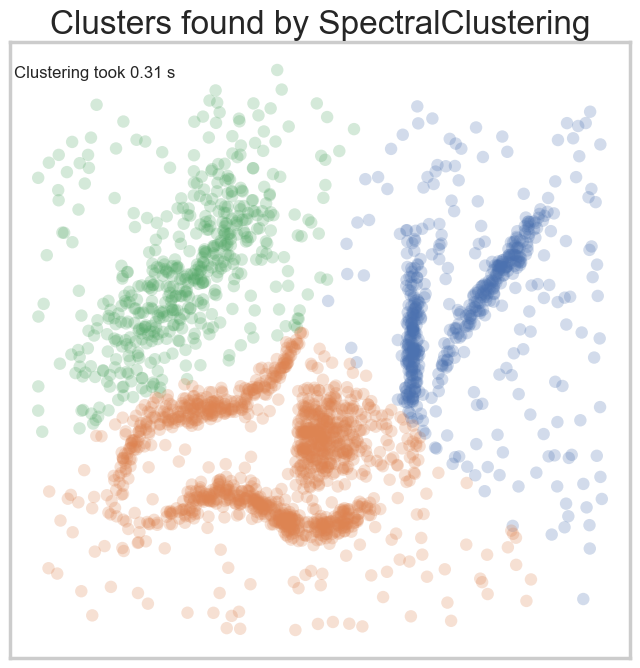

In [154]:
plot_clusters(data, cluster.SpectralClustering, (), {'n_clusters':3, 'random_state':594, 'assign_labels':'kmeans', 
                                                     'n_components':3, 'affinity':'rbf'})

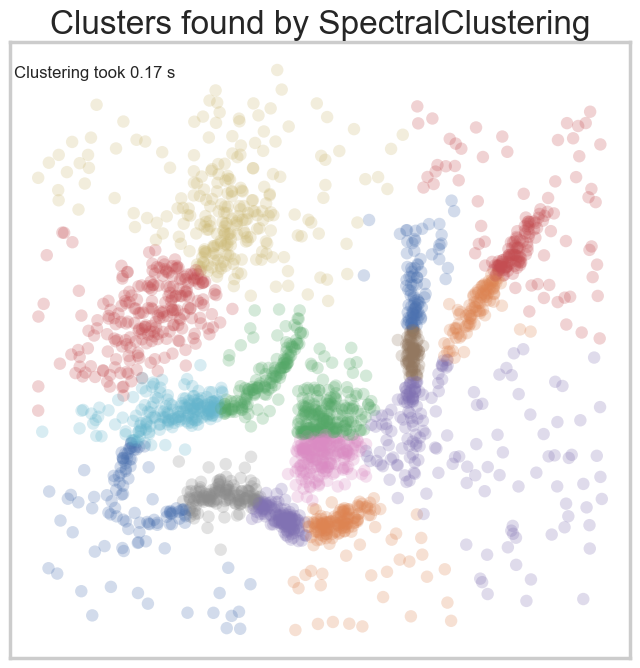

In [155]:
plot_clusters(data, cluster.SpectralClustering, (), {'n_clusters':3, 'random_state':594, 'assign_labels':'discretize', 
                                                     'n_components':15, 'affinity':'nearest_neighbors'})


### 4.3 Finding the best eigen_solver, n_init, eigen_tol, degree parameter

In [158]:
# Finding the best parameters with the silhoutte and inertia score
eigen_solvers = ['arpack', 'lobpcg', 'amg']
n_inits = [10,100,1000]
eigen_tols = ['auto',0.5,1.0,1.5]
degrees = [1,3,5]

silhouette_avgs = []
parameters = list()
inertias = []

# Fit the clustering model for each preference parameter value
for eigen_solver in eigen_solvers:
    for n_init in n_inits:
        for eigen_tol in eigen_tols:
            for degree in degrees:
                spectral_clustering = cluster.SpectralClustering(n_clusters=3, random_state=594, eigen_solver=eigen_solver, 
                                                                 assign_labels='kmeans', n_components=3, 
                                                                n_init=n_init, affinity='rbf', 
                                                                 eigen_tol=eigen_tol,degree=degree 
                                                                )
                spectral_clustering.fit(data)
                silhouette_avg = metrics.silhouette_score(data, spectral_clustering.labels_)
                silhouette_avgs.append(silhouette_avg)
                used_parameters = "eigen_solver: " + str(eigen_solver)+ ", " + "n_init: " + str(n_init) + ", " + "eigen_tol: " + str(eigen_tol) + ", " + "degree: " + str(degree)
                parameters.append(used_parameters)
                # Get the cluster labels and the number of clusters
                labels = spectral_clustering.labels_
                unique_labels = np.unique(labels)
                n_clusters = len(unique_labels)

                # Get the cluster centers
                cluster_centers = np.zeros((n_clusters, data.shape[1]))
                for i in range(n_clusters):
                    cluster_centers[i] = np.mean(data[labels == unique_labels[i]], axis=0)

                # Calculate the inertia score
                inertia = 0.0
                for i in range(len(data)):
                    # Calculate the distance to the nearest cluster center
                    distances = [((data[i] - center) ** 2).sum() for center in cluster_centers]
                    min_distance = min(distances)
                    # Add the squared distance to the inertia score
                    inertia += min_distance
                inertias.append(inertia)


df = pd.DataFrame(list(zip(silhouette_avgs, inertias)), index =parameters, columns =['Silhoutte_Score', 'Inertia_Score'])
df

,Silhoutte_Score,Inertia_Score
"eigen_solver: arpack, n_init: 10, eigen_tol: auto, degree: 1",0.463467,85.151427
"eigen_solver: arpack, n_init: 10, eigen_tol: auto, degree: 3",0.463467,85.151427
"eigen_solver: arpack, n_init: 10, eigen_tol: auto, degree: 5",0.463467,85.151427
"eigen_solver: arpack, n_init: 10, eigen_tol: 0.5, degree: 1",0.463467,85.151427
"eigen_solver: arpack, n_init: 10, eigen_tol: 0.5, degree: 3",0.463467,85.151427
...,...,...
"eigen_solver: amg, n_init: 1000, eigen_tol: 1.0, degree: 3",0.463370,85.164413
"eigen_solver: amg, n_init: 1000, eigen_tol: 1.0, degree: 5",0.463370,85.164413
"eigen_solver: amg, n_init: 1000, eigen_tol: 1.5, degree: 1",0.463370,85.164413
"eigen_solver: amg, n_init: 1000, eigen_tol: 1.5, degree: 3",0.463370,85.164413


In [159]:
df[df.Silhoutte_Score==df.Silhoutte_Score.max()]

,Silhoutte_Score,Inertia_Score
"eigen_solver: arpack, n_init: 10, eigen_tol: auto, degree: 1",0.463467,85.151427
"eigen_solver: arpack, n_init: 10, eigen_tol: auto, degree: 3",0.463467,85.151427
"eigen_solver: arpack, n_init: 10, eigen_tol: auto, degree: 5",0.463467,85.151427
"eigen_solver: arpack, n_init: 10, eigen_tol: 0.5, degree: 1",0.463467,85.151427
"eigen_solver: arpack, n_init: 10, eigen_tol: 0.5, degree: 3",0.463467,85.151427
"eigen_solver: arpack, n_init: 10, eigen_tol: 0.5, degree: 5",0.463467,85.151427
"eigen_solver: arpack, n_init: 10, eigen_tol: 1.0, degree: 1",0.463467,85.151427
"eigen_solver: arpack, n_init: 10, eigen_tol: 1.0, degree: 3",0.463467,85.151427
"eigen_solver: arpack, n_init: 10, eigen_tol: 1.0, degree: 5",0.463467,85.151427
"eigen_solver: arpack, n_init: 10, eigen_tol: 1.5, degree: 1",0.463467,85.151427


In [160]:
# Finding the best random_state parameter with the inertia score
df[df.Inertia_Score==df.Inertia_Score.min()]

,Silhoutte_Score,Inertia_Score
"eigen_solver: arpack, n_init: 10, eigen_tol: auto, degree: 1",0.463467,85.151427
"eigen_solver: arpack, n_init: 10, eigen_tol: auto, degree: 3",0.463467,85.151427
"eigen_solver: arpack, n_init: 10, eigen_tol: auto, degree: 5",0.463467,85.151427
"eigen_solver: arpack, n_init: 10, eigen_tol: 0.5, degree: 1",0.463467,85.151427
"eigen_solver: arpack, n_init: 10, eigen_tol: 0.5, degree: 3",0.463467,85.151427
"eigen_solver: arpack, n_init: 10, eigen_tol: 0.5, degree: 5",0.463467,85.151427
"eigen_solver: arpack, n_init: 10, eigen_tol: 1.0, degree: 1",0.463467,85.151427
"eigen_solver: arpack, n_init: 10, eigen_tol: 1.0, degree: 3",0.463467,85.151427
"eigen_solver: arpack, n_init: 10, eigen_tol: 1.0, degree: 5",0.463467,85.151427
"eigen_solver: arpack, n_init: 10, eigen_tol: 1.5, degree: 1",0.463467,85.151427


In [161]:
df[df.Silhoutte_Score!=df.Silhoutte_Score.max()]

,Silhoutte_Score,Inertia_Score
"eigen_solver: arpack, n_init: 100, eigen_tol: auto, degree: 1",0.463236,85.165490
"eigen_solver: arpack, n_init: 100, eigen_tol: auto, degree: 3",0.463236,85.165490
"eigen_solver: arpack, n_init: 100, eigen_tol: auto, degree: 5",0.463236,85.165490
"eigen_solver: arpack, n_init: 100, eigen_tol: 0.5, degree: 1",0.463236,85.165490
"eigen_solver: arpack, n_init: 100, eigen_tol: 0.5, degree: 3",0.463236,85.165490
...,...,...
"eigen_solver: amg, n_init: 1000, eigen_tol: 1.0, degree: 3",0.463370,85.164413
"eigen_solver: amg, n_init: 1000, eigen_tol: 1.0, degree: 5",0.463370,85.164413
"eigen_solver: amg, n_init: 1000, eigen_tol: 1.5, degree: 1",0.463370,85.164413
"eigen_solver: amg, n_init: 1000, eigen_tol: 1.5, degree: 3",0.463370,85.164413


### 4.4 Finding the best eigen_solver, eigen_tol, degree, coef0, verbose  parameter

In [26]:
# Finding the best parameters with the silhoutte score
eigen_solvers = ['arpack', 'lobpcg', 'amg']
eigen_tols = ['auto',0.5,1.0,1.5]
degrees = [1,3,5]
coef0s = [0.5,1.0,1.5]
verboses = [True,False]

silhouette_avgs = []
parameters = list()

# Fit the clustering model for each preference parameter value
for eigen_solver in eigen_solvers:
        for eigen_tol in eigen_tols:
            for degree in degrees:
                for coef0 in coef0s:
                    for verbose in verboses:
                        try:
                            spectral_clustering = cluster.SpectralClustering(n_clusters=3, random_state=594, eigen_solver=eigen_solver, 
                                                                             assign_labels='kmeans', n_components=3, 
                                                                            n_init=10, affinity='rbf', 
                                                                             eigen_tol=eigen_tol,degree=degree, coef0=coef0, verbose=verbose  
                                                                            )
                            spectral_clustering.fit(data)
                            silhouette_avg = metrics.silhouette_score(data, spectral_clustering.labels_)
                            silhouette_avgs.append(silhouette_avg)
                            used_parameters = "eigen_solver: " + str(eigen_solver) + ", " + "eigen_tol: " + str(eigen_tol) + ", " + "degree: " + str(degree) + ", " + "coef0: " + str(coef0) + ", " + "verbose: " + str(verbose)
                            parameters.append(used_parameters)
                        except:
                            pass

df = pd.DataFrame(silhouette_avgs, index =parameters, columns =['Silhoutte_Score'])
df

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007076888513149332.
Iteration 1, inertia 0.0005023987130840773.
Iteration 2, inertia 0.00045606862199676915.
Iteration 3, inertia 0.00040429520851511364.
Iteration 4, inertia 0.00038363637982089324.
Iteration 5, inertia 0.00037907757518005453.
Iteration 6, inertia 0.00037852368360788045.
Iteration 7, inertia 0.00037849141755557877.
Converged at iteration 7: center shift 9.909883991316709e-13 within tolerance 1.637956369404076e-11.
Initialization complete
Iteration 0, inertia 0.0004072265597657403.
Iteration 1, inertia 0.0003931533584811394.
Iteration 2, inertia 0.00039249612488138317.
Iteration 3, inertia 0.00039199433212157905.
Iteration 4, inertia 0.00039125448610007757.
Iteration 5, inertia 0.0003900141532777093.
Iteration 6, inertia 0.00038827657731844013.
Iteration 7, inertia 0.00038542701539811576.
Iteration 8, inertia 0.0003814423574204057.
Iteration 9, inertia 0.0003790008832126595.
Iteratio

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007076888513149332.
Iteration 1, inertia 0.0005023987130840774.
Iteration 2, inertia 0.00045606862199676915.
Iteration 3, inertia 0.00040429520851511364.
Iteration 4, inertia 0.00038363637982089324.
Iteration 5, inertia 0.00037907757518005464.
Iteration 6, inertia 0.0003785236836078804.
Iteration 7, inertia 0.0003784914175555787.
Converged at iteration 7: center shift 9.90988399131628e-13 within tolerance 1.637956369404076e-11.
Initialization complete
Iteration 0, inertia 0.0004072265597657403.
Iteration 1, inertia 0.00039315335848113945.
Iteration 2, inertia 0.0003924961248813831.
Iteration 3, inertia 0.00039199433212157905.
Iteration 4, inertia 0.00039125448610007757.
Iteration 5, inertia 0.0003900141532777093.
Iteration 6, inertia 0.00038827657731844013.
Iteration 7, inertia 0.00038542701539811576.
Iteration 8, inertia 0.0003814423574204057.
Iteration 9, inertia 0.0003790008832126595.
Iteration 1

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007076888513149332.
Iteration 1, inertia 0.0005023987130840773.
Iteration 2, inertia 0.00045606862199676915.
Iteration 3, inertia 0.00040429520851511375.
Iteration 4, inertia 0.00038363637982089324.
Iteration 5, inertia 0.00037907757518005464.
Iteration 6, inertia 0.00037852368360788045.
Iteration 7, inertia 0.00037849141755557877.
Converged at iteration 7: center shift 9.909883991316719e-13 within tolerance 1.637956369404076e-11.
Initialization complete
Iteration 0, inertia 0.0004072265597657403.
Iteration 1, inertia 0.00039315335848113934.
Iteration 2, inertia 0.00039249612488138317.
Iteration 3, inertia 0.00039199433212157905.
Iteration 4, inertia 0.0003912544861000776.
Iteration 5, inertia 0.00039001415327770926.
Iteration 6, inertia 0.00038827657731844013.
Iteration 7, inertia 0.00038542701539811576.
Iteration 8, inertia 0.0003814423574204057.
Iteration 9, inertia 0.0003790008832126595.
Iterati

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007076888513149332.
Iteration 1, inertia 0.0005023987130840774.
Iteration 2, inertia 0.00045606862199676915.
Iteration 3, inertia 0.00040429520851511375.
Iteration 4, inertia 0.00038363637982089324.
Iteration 5, inertia 0.00037907757518005453.
Iteration 6, inertia 0.0003785236836078804.
Iteration 7, inertia 0.00037849141755557877.
Converged at iteration 7: center shift 9.9098839913138e-13 within tolerance 1.637956369404076e-11.
Initialization complete
Iteration 0, inertia 0.0004072265597657403.
Iteration 1, inertia 0.0003931533584811394.
Iteration 2, inertia 0.0003924961248813831.
Iteration 3, inertia 0.000391994332121579.
Iteration 4, inertia 0.00039125448610007757.
Iteration 5, inertia 0.00039001415327770926.
Iteration 6, inertia 0.00038827657731844013.
Iteration 7, inertia 0.00038542701539811576.
Iteration 8, inertia 0.0003814423574204057.
Iteration 9, inertia 0.0003790008832126595.
Iteration 10,

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007076888513149332.
Iteration 1, inertia 0.0005023987130840774.
Iteration 2, inertia 0.00045606862199676915.
Iteration 3, inertia 0.00040429520851511364.
Iteration 4, inertia 0.0003836363798208933.
Iteration 5, inertia 0.00037907757518005464.
Iteration 6, inertia 0.0003785236836078804.
Iteration 7, inertia 0.00037849141755557877.
Converged at iteration 7: center shift 9.909883991317826e-13 within tolerance 1.637956369404076e-11.
Initialization complete
Iteration 0, inertia 0.0004072265597657403.
Iteration 1, inertia 0.00039315335848113934.
Iteration 2, inertia 0.0003924961248813831.
Iteration 3, inertia 0.00039199433212157905.
Iteration 4, inertia 0.00039125448610007757.
Iteration 5, inertia 0.0003900141532777093.
Iteration 6, inertia 0.00038827657731844013.
Iteration 7, inertia 0.00038542701539811576.
Iteration 8, inertia 0.0003814423574204057.
Iteration 9, inertia 0.0003790008832126595.
Iteration 

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007076888513149332.
Iteration 1, inertia 0.0005023987130840774.
Iteration 2, inertia 0.00045606862199676915.
Iteration 3, inertia 0.00040429520851511364.
Iteration 4, inertia 0.0003836363798208932.
Iteration 5, inertia 0.00037907757518005464.
Iteration 6, inertia 0.0003785236836078804.
Iteration 7, inertia 0.0003784914175555787.
Converged at iteration 7: center shift 9.909883991316309e-13 within tolerance 1.637956369404076e-11.
Initialization complete
Iteration 0, inertia 0.0004072265597657403.
Iteration 1, inertia 0.00039315335848113934.
Iteration 2, inertia 0.0003924961248813831.
Iteration 3, inertia 0.00039199433212157905.
Iteration 4, inertia 0.00039125448610007757.
Iteration 5, inertia 0.00039001415327770926.
Iteration 6, inertia 0.00038827657731844013.
Iteration 7, inertia 0.00038542701539811576.
Iteration 8, inertia 0.0003814423574204057.
Iteration 9, inertia 0.0003790008832126595.
Iteration 

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007076888513149332.
Iteration 1, inertia 0.0005023987130840774.
Iteration 2, inertia 0.00045606862199676915.
Iteration 3, inertia 0.0004042952085151137.
Iteration 4, inertia 0.0003836363798208932.
Iteration 5, inertia 0.00037907757518005453.
Iteration 6, inertia 0.00037852368360788045.
Iteration 7, inertia 0.00037849141755557877.
Converged at iteration 7: center shift 9.90988399131585e-13 within tolerance 1.637956369404076e-11.
Initialization complete
Iteration 0, inertia 0.0004072265597657403.
Iteration 1, inertia 0.00039315335848113934.
Iteration 2, inertia 0.0003924961248813831.
Iteration 3, inertia 0.00039199433212157905.
Iteration 4, inertia 0.00039125448610007757.
Iteration 5, inertia 0.00039001415327770926.
Iteration 6, inertia 0.0003882765773184402.
Iteration 7, inertia 0.00038542701539811576.
Iteration 8, inertia 0.0003814423574204057.
Iteration 9, inertia 0.0003790008832126595.
Iteration 1

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007076888513149332.
Iteration 1, inertia 0.0005023987130840774.
Iteration 2, inertia 0.00045606862199676915.
Iteration 3, inertia 0.00040429520851511364.
Iteration 4, inertia 0.00038363637982089324.
Iteration 5, inertia 0.00037907757518005464.
Iteration 6, inertia 0.00037852368360788045.
Iteration 7, inertia 0.00037849141755557877.
Converged at iteration 7: center shift 9.909883991316785e-13 within tolerance 1.637956369404076e-11.
Initialization complete
Iteration 0, inertia 0.0004072265597657403.
Iteration 1, inertia 0.00039315335848113934.
Iteration 2, inertia 0.00039249612488138317.
Iteration 3, inertia 0.00039199433212157905.
Iteration 4, inertia 0.00039125448610007757.
Iteration 5, inertia 0.00039001415327770926.
Iteration 6, inertia 0.00038827657731844013.
Iteration 7, inertia 0.00038542701539811576.
Iteration 8, inertia 0.0003814423574204057.
Iteration 9, inertia 0.0003790008832126595.
Iterat

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007076888513149332.
Iteration 1, inertia 0.0005023987130840774.
Iteration 2, inertia 0.00045606862199676915.
Iteration 3, inertia 0.00040429520851511364.
Iteration 4, inertia 0.0003836363798208933.
Iteration 5, inertia 0.00037907757518005453.
Iteration 6, inertia 0.0003785236836078804.
Iteration 7, inertia 0.00037849141755557877.
Converged at iteration 7: center shift 9.909883991317866e-13 within tolerance 1.637956369404076e-11.
Initialization complete
Iteration 0, inertia 0.0004072265597657403.
Iteration 1, inertia 0.0003931533584811394.
Iteration 2, inertia 0.00039249612488138317.
Iteration 3, inertia 0.00039199433212157905.
Iteration 4, inertia 0.0003912544861000776.
Iteration 5, inertia 0.0003900141532777093.
Iteration 6, inertia 0.00038827657731844013.
Iteration 7, inertia 0.00038542701539811576.
Iteration 8, inertia 0.0003814423574204057.
Iteration 9, inertia 0.0003790008832126595.
Iteration 1

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007076888513149332.
Iteration 1, inertia 0.0005023987130840774.
Iteration 2, inertia 0.0004560686219967692.
Iteration 3, inertia 0.00040429520851511364.
Iteration 4, inertia 0.00038363637982089324.
Iteration 5, inertia 0.00037907757518005453.
Iteration 6, inertia 0.0003785236836078804.
Iteration 7, inertia 0.00037849141755557877.
Converged at iteration 7: center shift 9.909883991318332e-13 within tolerance 1.637956369404076e-11.
Initialization complete
Iteration 0, inertia 0.0004072265597657403.
Iteration 1, inertia 0.00039315335848113934.
Iteration 2, inertia 0.00039249612488138317.
Iteration 3, inertia 0.00039199433212157905.
Iteration 4, inertia 0.0003912544861000776.
Iteration 5, inertia 0.00039001415327770926.
Iteration 6, inertia 0.0003882765773184402.
Iteration 7, inertia 0.00038542701539811576.
Iteration 8, inertia 0.00038144235742040573.
Iteration 9, inertia 0.0003790008832126595.
Iteration

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007076888513149332.
Iteration 1, inertia 0.0005023987130840774.
Iteration 2, inertia 0.00045606862199676915.
Iteration 3, inertia 0.00040429520851511375.
Iteration 4, inertia 0.00038363637982089324.
Iteration 5, inertia 0.00037907757518005464.
Iteration 6, inertia 0.00037852368360788045.
Iteration 7, inertia 0.0003784914175555787.
Converged at iteration 7: center shift 9.909883991318102e-13 within tolerance 1.637956369404076e-11.
Initialization complete
Iteration 0, inertia 0.0004072265597657403.
Iteration 1, inertia 0.0003931533584811394.
Iteration 2, inertia 0.00039249612488138317.
Iteration 3, inertia 0.00039199433212157905.
Iteration 4, inertia 0.0003912544861000776.
Iteration 5, inertia 0.00039001415327770926.
Iteration 6, inertia 0.00038827657731844013.
Iteration 7, inertia 0.00038542701539811576.
Iteration 8, inertia 0.0003814423574204057.
Iteration 9, inertia 0.0003790008832126596.
Iteration

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007076888513149332.
Iteration 1, inertia 0.0005023987130840773.
Iteration 2, inertia 0.00045606862199676915.
Iteration 3, inertia 0.0004042952085151137.
Iteration 4, inertia 0.0003836363798208933.
Iteration 5, inertia 0.00037907757518005453.
Iteration 6, inertia 0.0003785236836078804.
Iteration 7, inertia 0.00037849141755557877.
Converged at iteration 7: center shift 9.909883991316214e-13 within tolerance 1.637956369404076e-11.
Initialization complete
Iteration 0, inertia 0.0004072265597657403.
Iteration 1, inertia 0.0003931533584811394.
Iteration 2, inertia 0.00039249612488138317.
Iteration 3, inertia 0.00039199433212157905.
Iteration 4, inertia 0.00039125448610007757.
Iteration 5, inertia 0.0003900141532777093.
Iteration 6, inertia 0.00038827657731844013.
Iteration 7, inertia 0.00038542701539811576.
Iteration 8, inertia 0.0003814423574204057.
Iteration 9, inertia 0.0003790008832126595.
Iteration 1

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007076888513149332.
Iteration 1, inertia 0.0005023987130840774.
Iteration 2, inertia 0.00045606862199676915.
Iteration 3, inertia 0.00040429520851511364.
Iteration 4, inertia 0.00038363637982089324.
Iteration 5, inertia 0.00037907757518005464.
Iteration 6, inertia 0.00037852368360788045.
Iteration 7, inertia 0.00037849141755557877.
Converged at iteration 7: center shift 9.90988399131629e-13 within tolerance 1.637956369404076e-11.
Initialization complete
Iteration 0, inertia 0.0004072265597657403.
Iteration 1, inertia 0.0003931533584811394.
Iteration 2, inertia 0.00039249612488138317.
Iteration 3, inertia 0.00039199433212157905.
Iteration 4, inertia 0.00039125448610007757.
Iteration 5, inertia 0.00039001415327770926.
Iteration 6, inertia 0.00038827657731844013.
Iteration 7, inertia 0.00038542701539811576.
Iteration 8, inertia 0.0003814423574204057.
Iteration 9, inertia 0.0003790008832126595.
Iteratio

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007076888513149332.
Iteration 1, inertia 0.0005023987130840774.
Iteration 2, inertia 0.0004560686219967692.
Iteration 3, inertia 0.0004042952085151137.
Iteration 4, inertia 0.00038363637982089324.
Iteration 5, inertia 0.00037907757518005464.
Iteration 6, inertia 0.00037852368360788045.
Iteration 7, inertia 0.0003784914175555787.
Converged at iteration 7: center shift 9.909883991314308e-13 within tolerance 1.637956369404076e-11.
Initialization complete
Iteration 0, inertia 0.0004072265597657403.
Iteration 1, inertia 0.00039315335848113945.
Iteration 2, inertia 0.00039249612488138317.
Iteration 3, inertia 0.00039199433212157905.
Iteration 4, inertia 0.00039125448610007757.
Iteration 5, inertia 0.00039001415327770926.
Iteration 6, inertia 0.00038827657731844013.
Iteration 7, inertia 0.00038542701539811576.
Iteration 8, inertia 0.0003814423574204057.
Iteration 9, inertia 0.0003790008832126595.
Iteration

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007076888513149332.
Iteration 1, inertia 0.0005023987130840774.
Iteration 2, inertia 0.00045606862199676915.
Iteration 3, inertia 0.00040429520851511375.
Iteration 4, inertia 0.0003836363798208932.
Iteration 5, inertia 0.00037907757518005453.
Iteration 6, inertia 0.00037852368360788045.
Iteration 7, inertia 0.0003784914175555787.
Converged at iteration 7: center shift 9.90988399131423e-13 within tolerance 1.637956369404076e-11.
Initialization complete
Iteration 0, inertia 0.0004072265597657403.
Iteration 1, inertia 0.00039315335848113934.
Iteration 2, inertia 0.00039249612488138317.
Iteration 3, inertia 0.00039199433212157905.
Iteration 4, inertia 0.00039125448610007757.
Iteration 5, inertia 0.00039001415327770926.
Iteration 6, inertia 0.00038827657731844024.
Iteration 7, inertia 0.00038542701539811576.
Iteration 8, inertia 0.0003814423574204057.
Iteration 9, inertia 0.0003790008832126595.
Iteration

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007076888513149332.
Iteration 1, inertia 0.0005023987130840773.
Iteration 2, inertia 0.00045606862199676915.
Iteration 3, inertia 0.00040429520851511364.
Iteration 4, inertia 0.00038363637982089324.
Iteration 5, inertia 0.00037907757518005464.
Iteration 6, inertia 0.00037852368360788045.
Iteration 7, inertia 0.00037849141755557877.
Converged at iteration 7: center shift 9.909883991314308e-13 within tolerance 1.637956369404076e-11.
Initialization complete
Iteration 0, inertia 0.0004072265597657403.
Iteration 1, inertia 0.00039315335848113934.
Iteration 2, inertia 0.0003924961248813831.
Iteration 3, inertia 0.00039199433212157905.
Iteration 4, inertia 0.00039125448610007757.
Iteration 5, inertia 0.00039001415327770926.
Iteration 6, inertia 0.00038827657731844013.
Iteration 7, inertia 0.00038542701539811576.
Iteration 8, inertia 0.0003814423574204057.
Iteration 9, inertia 0.0003790008832126595.
Iterati

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007076888513149332.
Iteration 1, inertia 0.0005023987130840774.
Iteration 2, inertia 0.0004560686219967692.
Iteration 3, inertia 0.00040429520851511364.
Iteration 4, inertia 0.0003836363798208932.
Iteration 5, inertia 0.00037907757518005453.
Iteration 6, inertia 0.0003785236836078804.
Iteration 7, inertia 0.00037849141755557877.
Converged at iteration 7: center shift 9.90988399131876e-13 within tolerance 1.637956369404076e-11.
Initialization complete
Iteration 0, inertia 0.0004072265597657403.
Iteration 1, inertia 0.0003931533584811394.
Iteration 2, inertia 0.0003924961248813831.
Iteration 3, inertia 0.00039199433212157905.
Iteration 4, inertia 0.00039125448610007757.
Iteration 5, inertia 0.00039001415327770926.
Iteration 6, inertia 0.00038827657731844013.
Iteration 7, inertia 0.00038542701539811576.
Iteration 8, inertia 0.0003814423574204057.
Iteration 9, inertia 0.0003790008832126595.
Iteration 10

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007076888513149332.
Iteration 1, inertia 0.0005023987130840774.
Iteration 2, inertia 0.00045606862199676915.
Iteration 3, inertia 0.0004042952085151137.
Iteration 4, inertia 0.00038363637982089324.
Iteration 5, inertia 0.00037907757518005453.
Iteration 6, inertia 0.0003785236836078804.
Iteration 7, inertia 0.00037849141755557877.
Converged at iteration 7: center shift 9.909883991316709e-13 within tolerance 1.637956369404076e-11.
Initialization complete
Iteration 0, inertia 0.0004072265597657403.
Iteration 1, inertia 0.00039315335848113934.
Iteration 2, inertia 0.00039249612488138317.
Iteration 3, inertia 0.00039199433212157905.
Iteration 4, inertia 0.00039125448610007757.
Iteration 5, inertia 0.00039001415327770926.
Iteration 6, inertia 0.00038827657731844013.
Iteration 7, inertia 0.00038542701539811576.
Iteration 8, inertia 0.0003814423574204057.
Iteration 9, inertia 0.0003790008832126595.
Iteratio

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0006800605763433745.
Iteration 1, inertia 0.00039183427758189115.
Iteration 2, inertia 0.0003797031083015418.
Iteration 3, inertia 0.0003785890970098463.
Iteration 4, inertia 0.0003784919221875258.
Converged at iteration 4: strict convergence.
Initialization complete
Iteration 0, inertia 0.0005404179411324602.
Iteration 1, inertia 0.0004285936916515879.
Iteration 2, inertia 0.0003913431886155298.
Iteration 3, inertia 0.0003800902947914749.
Iteration 4, inertia 0.00037860817338152366.
Iteration 5, inertia 0.0003784925828632961.
Converged at iteration 5: center shift 9.909872472768582e-13 within tolerance 1.6379567867262465e-11.
Initialization complete
Iteration 0, inertia 0.000569945459633564.
Iteration 1, inertia 0.0004555645056505211.
Iteration 2, inertia 0.00041118977487253507.
Iteration 3, inertia 0.00039706388110536897.
Iteration 4, inertia 0.0003942443353324594.
Iteration 5, inertia 0.0003930116

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0006800605763433745.
Iteration 1, inertia 0.00039183427758189126.
Iteration 2, inertia 0.0003797031083015419.
Iteration 3, inertia 0.00037858909700984637.
Iteration 4, inertia 0.0003784919221875258.
Converged at iteration 4: strict convergence.
Initialization complete
Iteration 0, inertia 0.0005404179411324602.
Iteration 1, inertia 0.0004285936916515879.
Iteration 2, inertia 0.0003913431886155298.
Iteration 3, inertia 0.0003800902947914749.
Iteration 4, inertia 0.00037860817338152366.
Iteration 5, inertia 0.00037849258286329617.
Converged at iteration 5: center shift 9.90987247276618e-13 within tolerance 1.6379567867262465e-11.
Initialization complete
Iteration 0, inertia 0.000569945459633564.
Iteration 1, inertia 0.0004555645056505211.
Iteration 2, inertia 0.000411189774872535.
Iteration 3, inertia 0.00039706388110536897.
Iteration 4, inertia 0.00039424433533245937.
Iteration 5, inertia 0.0003930116

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0006800605763433745.
Iteration 1, inertia 0.00039183427758189126.
Iteration 2, inertia 0.00037970310830154184.
Iteration 3, inertia 0.00037858909700984626.
Iteration 4, inertia 0.00037849192218752584.
Converged at iteration 4: strict convergence.
Initialization complete
Iteration 0, inertia 0.0005404179411324602.
Iteration 1, inertia 0.00042859369165158795.
Iteration 2, inertia 0.0003913431886155298.
Iteration 3, inertia 0.00038009029479147484.
Iteration 4, inertia 0.00037860817338152366.
Iteration 5, inertia 0.00037849258286329617.
Converged at iteration 5: center shift 9.90987247276618e-13 within tolerance 1.6379567867262465e-11.
Initialization complete
Iteration 0, inertia 0.000569945459633564.
Iteration 1, inertia 0.0004555645056505211.
Iteration 2, inertia 0.000411189774872535.
Iteration 3, inertia 0.00039706388110536897.
Iteration 4, inertia 0.0003942443353324594.
Iteration 5, inertia 0.0003930

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0006800605763433745.
Iteration 1, inertia 0.00039183427758189126.
Iteration 2, inertia 0.0003797031083015419.
Iteration 3, inertia 0.00037858909700984637.
Iteration 4, inertia 0.0003784919221875258.
Converged at iteration 4: strict convergence.
Initialization complete
Iteration 0, inertia 0.0005404179411324602.
Iteration 1, inertia 0.0004285936916515879.
Iteration 2, inertia 0.0003913431886155298.
Iteration 3, inertia 0.00038009029479147484.
Iteration 4, inertia 0.00037860817338152366.
Iteration 5, inertia 0.00037849258286329617.
Converged at iteration 5: center shift 9.909872472763774e-13 within tolerance 1.6379567867262465e-11.
Initialization complete
Iteration 0, inertia 0.000569945459633564.
Iteration 1, inertia 0.0004555645056505211.
Iteration 2, inertia 0.0004111897748725351.
Iteration 3, inertia 0.00039706388110536897.
Iteration 4, inertia 0.0003942443353324595.
Iteration 5, inertia 0.00039301

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0006800605763433745.
Iteration 1, inertia 0.0003918342775818912.
Iteration 2, inertia 0.0003797031083015418.
Iteration 3, inertia 0.00037858909700984626.
Iteration 4, inertia 0.0003784919221875258.
Converged at iteration 4: strict convergence.
Initialization complete
Iteration 0, inertia 0.0005404179411324602.
Iteration 1, inertia 0.0004285936916515879.
Iteration 2, inertia 0.0003913431886155298.
Iteration 3, inertia 0.00038009029479147484.
Iteration 4, inertia 0.00037860817338152366.
Iteration 5, inertia 0.0003784925828632961.
Converged at iteration 5: center shift 9.90987247276657e-13 within tolerance 1.6379567867262465e-11.
Initialization complete
Iteration 0, inertia 0.000569945459633564.
Iteration 1, inertia 0.0004555645056505211.
Iteration 2, inertia 0.000411189774872535.
Iteration 3, inertia 0.00039706388110536897.
Iteration 4, inertia 0.0003942443353324594.
Iteration 5, inertia 0.000393011614

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007107525468187247.
Iteration 1, inertia 0.0005437511130695456.
Iteration 2, inertia 0.0005086600659121841.
Iteration 3, inertia 0.000496095704618259.
Iteration 4, inertia 0.0004931056598736621.
Iteration 5, inertia 0.0004921519979624191.
Iteration 6, inertia 0.0004915733384974687.
Iteration 7, inertia 0.0004914429362504369.
Iteration 8, inertia 0.0004913951370398962.
Iteration 9, inertia 0.0004913338508846229.
Iteration 10, inertia 0.000491245162628657.
Iteration 11, inertia 0.0004912000937836728.
Converged at iteration 11: center shift 1.2782931793706674e-11 within tolerance 1.5271969733628074e-11.
Initialization complete
Iteration 0, inertia 0.0005339189842335511.
Iteration 1, inertia 0.0004883219221395905.
Iteration 2, inertia 0.00048360166639981495.
Iteration 3, inertia 0.0004816643256544132.
Iteration 4, inertia 0.00048064163470050783.
Iteration 5, inertia 0.0004802290744384768.
Iteration 6, i

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007107525468187247.
Iteration 1, inertia 0.0005437511130695456.
Iteration 2, inertia 0.0005086600659121841.
Iteration 3, inertia 0.000496095704618259.
Iteration 4, inertia 0.0004931056598736621.
Iteration 5, inertia 0.0004921519979624192.
Iteration 6, inertia 0.0004915733384974687.
Iteration 7, inertia 0.0004914429362504369.
Iteration 8, inertia 0.0004913951370398962.
Iteration 9, inertia 0.0004913338508846229.
Iteration 10, inertia 0.000491245162628657.
Iteration 11, inertia 0.0004912000937836728.
Converged at iteration 11: center shift 1.2782931793706979e-11 within tolerance 1.5271969733628074e-11.
Initialization complete
Iteration 0, inertia 0.0005339189842335511.
Iteration 1, inertia 0.0004883219221395905.
Iteration 2, inertia 0.00048360166639981495.
Iteration 3, inertia 0.0004816643256544132.
Iteration 4, inertia 0.00048064163470050783.
Iteration 5, inertia 0.00048022907443847685.
Iteration 6, 

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007107525468187247.
Iteration 1, inertia 0.0005437511130695456.
Iteration 2, inertia 0.0005086600659121841.
Iteration 3, inertia 0.000496095704618259.
Iteration 4, inertia 0.0004931056598736621.
Iteration 5, inertia 0.0004921519979624192.
Iteration 6, inertia 0.0004915733384974687.
Iteration 7, inertia 0.0004914429362504369.
Iteration 8, inertia 0.0004913951370398962.
Iteration 9, inertia 0.0004913338508846229.
Iteration 10, inertia 0.000491245162628657.
Iteration 11, inertia 0.0004912000937836727.
Converged at iteration 11: center shift 1.278293179370706e-11 within tolerance 1.5271969733628074e-11.
Initialization complete
Iteration 0, inertia 0.0005339189842335511.
Iteration 1, inertia 0.0004883219221395905.
Iteration 2, inertia 0.00048360166639981495.
Iteration 3, inertia 0.0004816643256544132.
Iteration 4, inertia 0.0004806416347005078.
Iteration 5, inertia 0.0004802290744384768.
Iteration 6, ine

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007107525468187247.
Iteration 1, inertia 0.0005437511130695456.
Iteration 2, inertia 0.0005086600659121841.
Iteration 3, inertia 0.000496095704618259.
Iteration 4, inertia 0.0004931056598736621.
Iteration 5, inertia 0.0004921519979624191.
Iteration 6, inertia 0.0004915733384974687.
Iteration 7, inertia 0.0004914429362504369.
Iteration 8, inertia 0.0004913951370398962.
Iteration 9, inertia 0.0004913338508846229.
Iteration 10, inertia 0.000491245162628657.
Iteration 11, inertia 0.0004912000937836728.
Converged at iteration 11: center shift 1.2782931793706955e-11 within tolerance 1.5271969733628074e-11.
Initialization complete
Iteration 0, inertia 0.0005339189842335511.
Iteration 1, inertia 0.0004883219221395906.
Iteration 2, inertia 0.00048360166639981495.
Iteration 3, inertia 0.0004816643256544132.
Iteration 4, inertia 0.00048064163470050783.
Iteration 5, inertia 0.00048022907443847685.
Iteration 6, 

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007107525468187247.
Iteration 1, inertia 0.0005437511130695456.
Iteration 2, inertia 0.0005086600659121841.
Iteration 3, inertia 0.000496095704618259.
Iteration 4, inertia 0.0004931056598736621.
Iteration 5, inertia 0.0004921519979624192.
Iteration 6, inertia 0.0004915733384974687.
Iteration 7, inertia 0.0004914429362504369.
Iteration 8, inertia 0.0004913951370398962.
Iteration 9, inertia 0.0004913338508846229.
Iteration 10, inertia 0.000491245162628657.
Iteration 11, inertia 0.0004912000937836728.
Converged at iteration 11: center shift 1.278293179370697e-11 within tolerance 1.5271969733628074e-11.
Initialization complete
Iteration 0, inertia 0.0005339189842335511.
Iteration 1, inertia 0.0004883219221395905.
Iteration 2, inertia 0.00048360166639981495.
Iteration 3, inertia 0.0004816643256544132.
Iteration 4, inertia 0.00048064163470050783.
Iteration 5, inertia 0.00048022907443847685.
Iteration 6, i

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007107525468187247.
Iteration 1, inertia 0.0005437511130695456.
Iteration 2, inertia 0.0005086600659121841.
Iteration 3, inertia 0.000496095704618259.
Iteration 4, inertia 0.0004931056598736621.
Iteration 5, inertia 0.0004921519979624191.
Iteration 6, inertia 0.0004915733384974687.
Iteration 7, inertia 0.0004914429362504369.
Iteration 8, inertia 0.0004913951370398962.
Iteration 9, inertia 0.0004913338508846229.
Iteration 10, inertia 0.000491245162628657.
Iteration 11, inertia 0.0004912000937836728.
Converged at iteration 11: center shift 1.2782931793707005e-11 within tolerance 1.5271969733628074e-11.
Initialization complete
Iteration 0, inertia 0.0005339189842335511.
Iteration 1, inertia 0.0004883219221395905.
Iteration 2, inertia 0.00048360166639981495.
Iteration 3, inertia 0.0004816643256544132.
Iteration 4, inertia 0.00048064163470050783.
Iteration 5, inertia 0.00048022907443847685.
Iteration 6, 

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007107525468187247.
Iteration 1, inertia 0.0005437511130695456.
Iteration 2, inertia 0.0005086600659121841.
Iteration 3, inertia 0.000496095704618259.
Iteration 4, inertia 0.0004931056598736621.
Iteration 5, inertia 0.0004921519979624191.
Iteration 6, inertia 0.0004915733384974687.
Iteration 7, inertia 0.0004914429362504369.
Iteration 8, inertia 0.0004913951370398962.
Iteration 9, inertia 0.0004913338508846229.
Iteration 10, inertia 0.000491245162628657.
Iteration 11, inertia 0.0004912000937836728.
Converged at iteration 11: center shift 1.2782931793706945e-11 within tolerance 1.5271969733628074e-11.
Initialization complete
Iteration 0, inertia 0.0005339189842335511.
Iteration 1, inertia 0.0004883219221395905.
Iteration 2, inertia 0.00048360166639981495.
Iteration 3, inertia 0.0004816643256544132.
Iteration 4, inertia 0.0004806416347005078.
Iteration 5, inertia 0.00048022907443847685.
Iteration 6, i

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007107525468187247.
Iteration 1, inertia 0.0005437511130695456.
Iteration 2, inertia 0.0005086600659121841.
Iteration 3, inertia 0.000496095704618259.
Iteration 4, inertia 0.0004931056598736621.
Iteration 5, inertia 0.0004921519979624191.
Iteration 6, inertia 0.0004915733384974687.
Iteration 7, inertia 0.0004914429362504369.
Iteration 8, inertia 0.0004913951370398962.
Iteration 9, inertia 0.0004913338508846229.
Iteration 10, inertia 0.000491245162628657.
Iteration 11, inertia 0.0004912000937836728.
Converged at iteration 11: center shift 1.2782931793706943e-11 within tolerance 1.5271969733628074e-11.
Initialization complete
Iteration 0, inertia 0.0005339189842335511.
Iteration 1, inertia 0.0004883219221395906.
Iteration 2, inertia 0.00048360166639981495.
Iteration 3, inertia 0.00048166432565441313.
Iteration 4, inertia 0.00048064163470050783.
Iteration 5, inertia 0.00048022907443847685.
Iteration 6,

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007107525468187247.
Iteration 1, inertia 0.0005437511130695456.
Iteration 2, inertia 0.0005086600659121841.
Iteration 3, inertia 0.0004960957046182591.
Iteration 4, inertia 0.000493105659873662.
Iteration 5, inertia 0.0004921519979624191.
Iteration 6, inertia 0.0004915733384974687.
Iteration 7, inertia 0.0004914429362504369.
Iteration 8, inertia 0.0004913951370398962.
Iteration 9, inertia 0.0004913338508846229.
Iteration 10, inertia 0.000491245162628657.
Iteration 11, inertia 0.0004912000937836728.
Converged at iteration 11: center shift 1.2782931793707126e-11 within tolerance 1.5271969733628074e-11.
Initialization complete
Iteration 0, inertia 0.0005339189842335511.
Iteration 1, inertia 0.0004883219221395905.
Iteration 2, inertia 0.00048360166639981495.
Iteration 3, inertia 0.0004816643256544132.
Iteration 4, inertia 0.00048064163470050783.
Iteration 5, inertia 0.00048022907443847685.
Iteration 6, 

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007107525468187247.
Iteration 1, inertia 0.0005437511130695456.
Iteration 2, inertia 0.0005086600659121841.
Iteration 3, inertia 0.000496095704618259.
Iteration 4, inertia 0.0004931056598736621.
Iteration 5, inertia 0.0004921519979624191.
Iteration 6, inertia 0.0004915733384974687.
Iteration 7, inertia 0.0004914429362504369.
Iteration 8, inertia 0.0004913951370398962.
Iteration 9, inertia 0.0004913338508846229.
Iteration 10, inertia 0.000491245162628657.
Iteration 11, inertia 0.0004912000937836728.
Converged at iteration 11: center shift 1.2782931793706491e-11 within tolerance 1.5271969733628074e-11.
Initialization complete
Iteration 0, inertia 0.0005339189842335511.
Iteration 1, inertia 0.0004883219221395905.
Iteration 2, inertia 0.00048360166639981495.
Iteration 3, inertia 0.0004816643256544132.
Iteration 4, inertia 0.0004806416347005078.
Iteration 5, inertia 0.00048022907443847685.
Iteration 6, i

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007107525468187247.
Iteration 1, inertia 0.0005437511130695456.
Iteration 2, inertia 0.0005086600659121841.
Iteration 3, inertia 0.000496095704618259.
Iteration 4, inertia 0.0004931056598736621.
Iteration 5, inertia 0.0004921519979624191.
Iteration 6, inertia 0.0004915733384974687.
Iteration 7, inertia 0.0004914429362504369.
Iteration 8, inertia 0.0004913951370398962.
Iteration 9, inertia 0.0004913338508846229.
Iteration 10, inertia 0.000491245162628657.
Iteration 11, inertia 0.0004912000937836728.
Converged at iteration 11: center shift 1.2782931793707002e-11 within tolerance 1.5271969733628074e-11.
Initialization complete
Iteration 0, inertia 0.0005339189842335511.
Iteration 1, inertia 0.0004883219221395905.
Iteration 2, inertia 0.00048360166639981495.
Iteration 3, inertia 0.0004816643256544132.
Iteration 4, inertia 0.00048064163470050783.
Iteration 5, inertia 0.00048022907443847685.
Iteration 6, 

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007107525468187247.
Iteration 1, inertia 0.0005437511130695456.
Iteration 2, inertia 0.0005086600659121841.
Iteration 3, inertia 0.0004960957046182591.
Iteration 4, inertia 0.0004931056598736621.
Iteration 5, inertia 0.0004921519979624191.
Iteration 6, inertia 0.0004915733384974687.
Iteration 7, inertia 0.0004914429362504369.
Iteration 8, inertia 0.0004913951370398962.
Iteration 9, inertia 0.0004913338508846229.
Iteration 10, inertia 0.000491245162628657.
Iteration 11, inertia 0.0004912000937836728.
Converged at iteration 11: center shift 1.2782931793707034e-11 within tolerance 1.5271969733628074e-11.
Initialization complete
Iteration 0, inertia 0.0005339189842335511.
Iteration 1, inertia 0.0004883219221395905.
Iteration 2, inertia 0.00048360166639981495.
Iteration 3, inertia 0.0004816643256544132.
Iteration 4, inertia 0.0004806416347005078.
Iteration 5, inertia 0.00048022907443847685.
Iteration 6, 

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007107525468187247.
Iteration 1, inertia 0.0005437511130695456.
Iteration 2, inertia 0.0005086600659121841.
Iteration 3, inertia 0.000496095704618259.
Iteration 4, inertia 0.0004931056598736621.
Iteration 5, inertia 0.0004921519979624192.
Iteration 6, inertia 0.0004915733384974687.
Iteration 7, inertia 0.0004914429362504369.
Iteration 8, inertia 0.0004913951370398962.
Iteration 9, inertia 0.0004913338508846229.
Iteration 10, inertia 0.000491245162628657.
Iteration 11, inertia 0.0004912000937836728.
Converged at iteration 11: center shift 1.2782931793707318e-11 within tolerance 1.5271969733628074e-11.
Initialization complete
Iteration 0, inertia 0.0005339189842335511.
Iteration 1, inertia 0.0004883219221395905.
Iteration 2, inertia 0.00048360166639981495.
Iteration 3, inertia 0.0004816643256544132.
Iteration 4, inertia 0.00048064163470050783.
Iteration 5, inertia 0.0004802290744384768.
Iteration 6, i

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007107525468187247.
Iteration 1, inertia 0.0005437511130695456.
Iteration 2, inertia 0.0005086600659121841.
Iteration 3, inertia 0.000496095704618259.
Iteration 4, inertia 0.0004931056598736621.
Iteration 5, inertia 0.0004921519979624191.
Iteration 6, inertia 0.0004915733384974687.
Iteration 7, inertia 0.0004914429362504369.
Iteration 8, inertia 0.0004913951370398962.
Iteration 9, inertia 0.0004913338508846229.
Iteration 10, inertia 0.000491245162628657.
Iteration 11, inertia 0.0004912000937836728.
Converged at iteration 11: center shift 1.2782931793707194e-11 within tolerance 1.5271969733628074e-11.
Initialization complete
Iteration 0, inertia 0.0005339189842335511.
Iteration 1, inertia 0.0004883219221395905.
Iteration 2, inertia 0.00048360166639981495.
Iteration 3, inertia 0.0004816643256544132.
Iteration 4, inertia 0.00048064163470050783.
Iteration 5, inertia 0.0004802290744384768.
Iteration 6, i

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007107525468187247.
Iteration 1, inertia 0.0005437511130695456.
Iteration 2, inertia 0.0005086600659121841.
Iteration 3, inertia 0.000496095704618259.
Iteration 4, inertia 0.0004931056598736621.
Iteration 5, inertia 0.0004921519979624191.
Iteration 6, inertia 0.0004915733384974687.
Iteration 7, inertia 0.0004914429362504369.
Iteration 8, inertia 0.0004913951370398963.
Iteration 9, inertia 0.0004913338508846229.
Iteration 10, inertia 0.000491245162628657.
Iteration 11, inertia 0.0004912000937836728.
Converged at iteration 11: center shift 1.2782931793706662e-11 within tolerance 1.5271969733628074e-11.
Initialization complete
Iteration 0, inertia 0.0005339189842335511.
Iteration 1, inertia 0.0004883219221395906.
Iteration 2, inertia 0.00048360166639981495.
Iteration 3, inertia 0.0004816643256544132.
Iteration 4, inertia 0.00048064163470050783.
Iteration 5, inertia 0.0004802290744384768.
Iteration 6, i

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007107525468187247.
Iteration 1, inertia 0.0005437511130695456.
Iteration 2, inertia 0.0005086600659121841.
Iteration 3, inertia 0.000496095704618259.
Iteration 4, inertia 0.0004931056598736621.
Iteration 5, inertia 0.0004921519979624191.
Iteration 6, inertia 0.0004915733384974687.
Iteration 7, inertia 0.0004914429362504369.
Iteration 8, inertia 0.0004913951370398963.
Iteration 9, inertia 0.0004913338508846229.
Iteration 10, inertia 0.000491245162628657.
Iteration 11, inertia 0.0004912000937836727.
Converged at iteration 11: center shift 1.2782931793707147e-11 within tolerance 1.5271969733628074e-11.
Initialization complete
Iteration 0, inertia 0.0005339189842335511.
Iteration 1, inertia 0.0004883219221395905.
Iteration 2, inertia 0.00048360166639981495.
Iteration 3, inertia 0.0004816643256544132.
Iteration 4, inertia 0.00048064163470050783.
Iteration 5, inertia 0.00048022907443847685.
Iteration 6, 

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007107525468187247.
Iteration 1, inertia 0.0005437511130695455.
Iteration 2, inertia 0.0005086600659121841.
Iteration 3, inertia 0.000496095704618259.
Iteration 4, inertia 0.0004931056598736621.
Iteration 5, inertia 0.0004921519979624191.
Iteration 6, inertia 0.0004915733384974687.
Iteration 7, inertia 0.0004914429362504369.
Iteration 8, inertia 0.0004913951370398962.
Iteration 9, inertia 0.0004913338508846229.
Iteration 10, inertia 0.000491245162628657.
Iteration 11, inertia 0.0004912000937836728.
Converged at iteration 11: center shift 1.2782931793707226e-11 within tolerance 1.5271969733628074e-11.
Initialization complete
Iteration 0, inertia 0.0005339189842335511.
Iteration 1, inertia 0.0004883219221395905.
Iteration 2, inertia 0.00048360166639981495.
Iteration 3, inertia 0.0004816643256544132.
Iteration 4, inertia 0.00048064163470050783.
Iteration 5, inertia 0.00048022907443847685.
Iteration 6, 

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007107525468187247.
Iteration 1, inertia 0.0005437511130695456.
Iteration 2, inertia 0.0005086600659121841.
Iteration 3, inertia 0.000496095704618259.
Iteration 4, inertia 0.0004931056598736621.
Iteration 5, inertia 0.0004921519979624191.
Iteration 6, inertia 0.0004915733384974687.
Iteration 7, inertia 0.0004914429362504369.
Iteration 8, inertia 0.0004913951370398962.
Iteration 9, inertia 0.0004913338508846229.
Iteration 10, inertia 0.000491245162628657.
Iteration 11, inertia 0.0004912000937836728.
Converged at iteration 11: center shift 1.278293179370709e-11 within tolerance 1.5271969733628074e-11.
Initialization complete
Iteration 0, inertia 0.0005339189842335511.
Iteration 1, inertia 0.0004883219221395905.
Iteration 2, inertia 0.00048360166639981495.
Iteration 3, inertia 0.00048166432565441313.
Iteration 4, inertia 0.00048064163470050783.
Iteration 5, inertia 0.00048022907443847685.
Iteration 6, 

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007107525468187247.
Iteration 1, inertia 0.0005437511130695456.
Iteration 2, inertia 0.0005086600659121841.
Iteration 3, inertia 0.000496095704618259.
Iteration 4, inertia 0.0004931056598736621.
Iteration 5, inertia 0.0004921519979624191.
Iteration 6, inertia 0.0004915733384974687.
Iteration 7, inertia 0.0004914429362504369.
Iteration 8, inertia 0.0004913951370398962.
Iteration 9, inertia 0.0004913338508846229.
Iteration 10, inertia 0.000491245162628657.
Iteration 11, inertia 0.0004912000937836728.
Converged at iteration 11: center shift 1.2782931793707226e-11 within tolerance 1.5271969733628074e-11.
Initialization complete
Iteration 0, inertia 0.0005339189842335511.
Iteration 1, inertia 0.0004883219221395905.
Iteration 2, inertia 0.00048360166639981495.
Iteration 3, inertia 0.00048166432565441313.
Iteration 4, inertia 0.00048064163470050783.
Iteration 5, inertia 0.00048022907443847685.
Iteration 6,

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007107525468187247.
Iteration 1, inertia 0.0005437511130695456.
Iteration 2, inertia 0.0005086600659121841.
Iteration 3, inertia 0.000496095704618259.
Iteration 4, inertia 0.0004931056598736621.
Iteration 5, inertia 0.0004921519979624192.
Iteration 6, inertia 0.0004915733384974687.
Iteration 7, inertia 0.0004914429362504369.
Iteration 8, inertia 0.0004913951370398962.
Iteration 9, inertia 0.0004913338508846229.
Iteration 10, inertia 0.000491245162628657.
Iteration 11, inertia 0.0004912000937836728.
Converged at iteration 11: center shift 1.2782931793707213e-11 within tolerance 1.5271969733628074e-11.
Initialization complete
Iteration 0, inertia 0.0005339189842335511.
Iteration 1, inertia 0.0004883219221395905.
Iteration 2, inertia 0.00048360166639981495.
Iteration 3, inertia 0.0004816643256544132.
Iteration 4, inertia 0.00048064163470050783.
Iteration 5, inertia 0.00048022907443847685.
Iteration 6, 

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007107525468187247.
Iteration 1, inertia 0.0005437511130695456.
Iteration 2, inertia 0.0005086600659121841.
Iteration 3, inertia 0.000496095704618259.
Iteration 4, inertia 0.0004931056598736621.
Iteration 5, inertia 0.0004921519979624191.
Iteration 6, inertia 0.0004915733384974687.
Iteration 7, inertia 0.0004914429362504369.
Iteration 8, inertia 0.0004913951370398962.
Iteration 9, inertia 0.0004913338508846229.
Iteration 10, inertia 0.000491245162628657.
Iteration 11, inertia 0.0004912000937836728.
Converged at iteration 11: center shift 1.278293179370712e-11 within tolerance 1.5271969733628074e-11.
Initialization complete
Iteration 0, inertia 0.0005339189842335511.
Iteration 1, inertia 0.0004883219221395905.
Iteration 2, inertia 0.00048360166639981495.
Iteration 3, inertia 0.0004816643256544132.
Iteration 4, inertia 0.00048064163470050783.
Iteration 5, inertia 0.00048022907443847685.
Iteration 6, i

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007107525468187247.
Iteration 1, inertia 0.0005437511130695456.
Iteration 2, inertia 0.0005086600659121841.
Iteration 3, inertia 0.000496095704618259.
Iteration 4, inertia 0.0004931056598736621.
Iteration 5, inertia 0.0004921519979624191.
Iteration 6, inertia 0.0004915733384974687.
Iteration 7, inertia 0.0004914429362504369.
Iteration 8, inertia 0.0004913951370398962.
Iteration 9, inertia 0.0004913338508846229.
Iteration 10, inertia 0.000491245162628657.
Iteration 11, inertia 0.0004912000937836728.
Converged at iteration 11: center shift 1.2782931793706672e-11 within tolerance 1.5271969733628074e-11.
Initialization complete
Iteration 0, inertia 0.0005339189842335511.
Iteration 1, inertia 0.0004883219221395906.
Iteration 2, inertia 0.00048360166639981495.
Iteration 3, inertia 0.00048166432565441313.
Iteration 4, inertia 0.00048064163470050783.
Iteration 5, inertia 0.00048022907443847685.
Iteration 6,

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007107525468187247.
Iteration 1, inertia 0.0005437511130695456.
Iteration 2, inertia 0.0005086600659121841.
Iteration 3, inertia 0.000496095704618259.
Iteration 4, inertia 0.0004931056598736621.
Iteration 5, inertia 0.0004921519979624191.
Iteration 6, inertia 0.0004915733384974687.
Iteration 7, inertia 0.0004914429362504369.
Iteration 8, inertia 0.0004913951370398962.
Iteration 9, inertia 0.0004913338508846229.
Iteration 10, inertia 0.000491245162628657.
Iteration 11, inertia 0.0004912000937836728.
Converged at iteration 11: center shift 1.2782931793706686e-11 within tolerance 1.5271969733628074e-11.
Initialization complete
Iteration 0, inertia 0.0005339189842335511.
Iteration 1, inertia 0.0004883219221395906.
Iteration 2, inertia 0.00048360166639981495.
Iteration 3, inertia 0.00048166432565441313.
Iteration 4, inertia 0.00048064163470050783.
Iteration 5, inertia 0.00048022907443847685.
Iteration 6,

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007107525468187247.
Iteration 1, inertia 0.0005437511130695456.
Iteration 2, inertia 0.0005086600659121841.
Iteration 3, inertia 0.000496095704618259.
Iteration 4, inertia 0.0004931056598736621.
Iteration 5, inertia 0.0004921519979624191.
Iteration 6, inertia 0.0004915733384974687.
Iteration 7, inertia 0.0004914429362504369.
Iteration 8, inertia 0.0004913951370398962.
Iteration 9, inertia 0.0004913338508846229.
Iteration 10, inertia 0.000491245162628657.
Iteration 11, inertia 0.0004912000937836728.
Converged at iteration 11: center shift 1.278293179370694e-11 within tolerance 1.5271969733628074e-11.
Initialization complete
Iteration 0, inertia 0.0005339189842335511.
Iteration 1, inertia 0.0004883219221395905.
Iteration 2, inertia 0.00048360166639981495.
Iteration 3, inertia 0.0004816643256544132.
Iteration 4, inertia 0.00048064163470050783.
Iteration 5, inertia 0.0004802290744384768.
Iteration 6, in

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007107525468187247.
Iteration 1, inertia 0.0005437511130695456.
Iteration 2, inertia 0.0005086600659121841.
Iteration 3, inertia 0.000496095704618259.
Iteration 4, inertia 0.0004931056598736621.
Iteration 5, inertia 0.0004921519979624191.
Iteration 6, inertia 0.0004915733384974687.
Iteration 7, inertia 0.0004914429362504369.
Iteration 8, inertia 0.0004913951370398962.
Iteration 9, inertia 0.0004913338508846229.
Iteration 10, inertia 0.000491245162628657.
Iteration 11, inertia 0.0004912000937836728.
Converged at iteration 11: center shift 1.2782931793707002e-11 within tolerance 1.5271969733628074e-11.
Initialization complete
Iteration 0, inertia 0.0005339189842335511.
Iteration 1, inertia 0.0004883219221395905.
Iteration 2, inertia 0.00048360166639981495.
Iteration 3, inertia 0.0004816643256544132.
Iteration 4, inertia 0.00048064163470050783.
Iteration 5, inertia 0.00048022907443847685.
Iteration 6, 

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007107525468187247.
Iteration 1, inertia 0.0005437511130695456.
Iteration 2, inertia 0.0005086600659121841.
Iteration 3, inertia 0.0004960957046182589.
Iteration 4, inertia 0.0004931056598736621.
Iteration 5, inertia 0.0004921519979624191.
Iteration 6, inertia 0.0004915733384974687.
Iteration 7, inertia 0.0004914429362504369.
Iteration 8, inertia 0.0004913951370398962.
Iteration 9, inertia 0.0004913338508846229.
Iteration 10, inertia 0.000491245162628657.
Iteration 11, inertia 0.0004912000937836728.
Converged at iteration 11: center shift 1.2782931793706943e-11 within tolerance 1.5271969733628074e-11.
Initialization complete
Iteration 0, inertia 0.0005339189842335511.
Iteration 1, inertia 0.0004883219221395906.
Iteration 2, inertia 0.00048360166639981495.
Iteration 3, inertia 0.0004816643256544132.
Iteration 4, inertia 0.00048064163470050783.
Iteration 5, inertia 0.00048022907443847685.
Iteration 6,

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007076888513149332.
Iteration 1, inertia 0.0005023987130840774.
Iteration 2, inertia 0.00045606862199676915.
Iteration 3, inertia 0.0004042952085151137.
Iteration 4, inertia 0.00038363637982089324.
Iteration 5, inertia 0.00037907757518005464.
Iteration 6, inertia 0.00037852368360788045.
Iteration 7, inertia 0.0003784914175555787.
Converged at iteration 7: center shift 9.909883991318256e-13 within tolerance 1.637956369404076e-11.
Initialization complete
Iteration 0, inertia 0.0004072265597657403.
Iteration 1, inertia 0.00039315335848113934.
Iteration 2, inertia 0.00039249612488138317.
Iteration 3, inertia 0.00039199433212157905.
Iteration 4, inertia 0.00039125448610007757.
Iteration 5, inertia 0.00039001415327770926.
Iteration 6, inertia 0.00038827657731844013.
Iteration 7, inertia 0.00038542701539811576.
Iteration 8, inertia 0.0003814423574204057.
Iteration 9, inertia 0.0003790008832126595.
Iteratio

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007076888513149332.
Iteration 1, inertia 0.0005023987130840774.
Iteration 2, inertia 0.00045606862199676915.
Iteration 3, inertia 0.00040429520851511364.
Iteration 4, inertia 0.00038363637982089324.
Iteration 5, inertia 0.00037907757518005464.
Iteration 6, inertia 0.00037852368360788045.
Iteration 7, inertia 0.00037849141755557877.
Converged at iteration 7: center shift 9.909883991318256e-13 within tolerance 1.637956369404076e-11.
Initialization complete
Iteration 0, inertia 0.0004072265597657403.
Iteration 1, inertia 0.00039315335848113934.
Iteration 2, inertia 0.0003924961248813831.
Iteration 3, inertia 0.00039199433212157905.
Iteration 4, inertia 0.00039125448610007757.
Iteration 5, inertia 0.00039001415327770926.
Iteration 6, inertia 0.00038827657731844013.
Iteration 7, inertia 0.00038542701539811576.
Iteration 8, inertia 0.00038144235742040573.
Iteration 9, inertia 0.0003790008832126595.
Iterat

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007076888513149332.
Iteration 1, inertia 0.0005023987130840773.
Iteration 2, inertia 0.00045606862199676915.
Iteration 3, inertia 0.00040429520851511364.
Iteration 4, inertia 0.0003836363798208933.
Iteration 5, inertia 0.00037907757518005464.
Iteration 6, inertia 0.00037852368360788045.
Iteration 7, inertia 0.00037849141755557877.
Converged at iteration 7: center shift 9.90988399131628e-13 within tolerance 1.637956369404076e-11.
Initialization complete
Iteration 0, inertia 0.0004072265597657403.
Iteration 1, inertia 0.00039315335848113934.
Iteration 2, inertia 0.00039249612488138317.
Iteration 3, inertia 0.00039199433212157905.
Iteration 4, inertia 0.0003912544861000776.
Iteration 5, inertia 0.0003900141532777093.
Iteration 6, inertia 0.00038827657731844013.
Iteration 7, inertia 0.00038542701539811576.
Iteration 8, inertia 0.0003814423574204057.
Iteration 9, inertia 0.0003790008832126595.
Iteration 

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007076888513149332.
Iteration 1, inertia 0.0005023987130840774.
Iteration 2, inertia 0.00045606862199676915.
Iteration 3, inertia 0.00040429520851511364.
Iteration 4, inertia 0.00038363637982089324.
Iteration 5, inertia 0.00037907757518005464.
Iteration 6, inertia 0.00037852368360788045.
Iteration 7, inertia 0.00037849141755557877.
Converged at iteration 7: center shift 9.90988399131629e-13 within tolerance 1.637956369404076e-11.
Initialization complete
Iteration 0, inertia 0.0004072265597657403.
Iteration 1, inertia 0.00039315335848113945.
Iteration 2, inertia 0.00039249612488138317.
Iteration 3, inertia 0.00039199433212157905.
Iteration 4, inertia 0.0003912544861000776.
Iteration 5, inertia 0.0003900141532777093.
Iteration 6, inertia 0.00038827657731844013.
Iteration 7, inertia 0.00038542701539811576.
Iteration 8, inertia 0.0003814423574204057.
Iteration 9, inertia 0.0003790008832126595.
Iteration

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007076888513149332.
Iteration 1, inertia 0.0005023987130840773.
Iteration 2, inertia 0.00045606862199676915.
Iteration 3, inertia 0.00040429520851511375.
Iteration 4, inertia 0.00038363637982089324.
Iteration 5, inertia 0.00037907757518005464.
Iteration 6, inertia 0.00037852368360788034.
Iteration 7, inertia 0.00037849141755557877.
Converged at iteration 7: center shift 9.909883991316709e-13 within tolerance 1.637956369404076e-11.
Initialization complete
Iteration 0, inertia 0.0004072265597657403.
Iteration 1, inertia 0.00039315335848113934.
Iteration 2, inertia 0.0003924961248813831.
Iteration 3, inertia 0.00039199433212157905.
Iteration 4, inertia 0.00039125448610007757.
Iteration 5, inertia 0.00039001415327770926.
Iteration 6, inertia 0.00038827657731844013.
Iteration 7, inertia 0.00038542701539811576.
Iteration 8, inertia 0.0003814423574204057.
Iteration 9, inertia 0.0003790008832126595.
Iterati

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007076888513149332.
Iteration 1, inertia 0.0005023987130840774.
Iteration 2, inertia 0.0004560686219967692.
Iteration 3, inertia 0.00040429520851511364.
Iteration 4, inertia 0.00038363637982089324.
Iteration 5, inertia 0.00037907757518005464.
Iteration 6, inertia 0.00037852368360788045.
Iteration 7, inertia 0.00037849141755557877.
Converged at iteration 7: center shift 9.90988399131628e-13 within tolerance 1.637956369404076e-11.
Initialization complete
Iteration 0, inertia 0.0004072265597657403.
Iteration 1, inertia 0.0003931533584811394.
Iteration 2, inertia 0.0003924961248813831.
Iteration 3, inertia 0.00039199433212157905.
Iteration 4, inertia 0.0003912544861000776.
Iteration 5, inertia 0.00039001415327770926.
Iteration 6, inertia 0.00038827657731844013.
Iteration 7, inertia 0.00038542701539811576.
Iteration 8, inertia 0.0003814423574204057.
Iteration 9, inertia 0.0003790008832126595.
Iteration 1

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007076888513149332.
Iteration 1, inertia 0.0005023987130840774.
Iteration 2, inertia 0.00045606862199676915.
Iteration 3, inertia 0.00040429520851511375.
Iteration 4, inertia 0.00038363637982089324.
Iteration 5, inertia 0.00037907757518005453.
Iteration 6, inertia 0.00037852368360788045.
Iteration 7, inertia 0.00037849141755557877.
Converged at iteration 7: center shift 9.909883991316824e-13 within tolerance 1.637956369404076e-11.
Initialization complete
Iteration 0, inertia 0.0004072265597657403.
Iteration 1, inertia 0.00039315335848113934.
Iteration 2, inertia 0.00039249612488138317.
Iteration 3, inertia 0.00039199433212157905.
Iteration 4, inertia 0.0003912544861000776.
Iteration 5, inertia 0.00039001415327770926.
Iteration 6, inertia 0.00038827657731844013.
Iteration 7, inertia 0.00038542701539811576.
Iteration 8, inertia 0.0003814423574204057.
Iteration 9, inertia 0.0003790008832126595.
Iterati

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007076888513149332.
Iteration 1, inertia 0.0005023987130840774.
Iteration 2, inertia 0.00045606862199676915.
Iteration 3, inertia 0.00040429520851511364.
Iteration 4, inertia 0.00038363637982089324.
Iteration 5, inertia 0.00037907757518005453.
Iteration 6, inertia 0.00037852368360788045.
Iteration 7, inertia 0.00037849141755557877.
Converged at iteration 7: center shift 9.909883991316719e-13 within tolerance 1.637956369404076e-11.
Initialization complete
Iteration 0, inertia 0.0004072265597657403.
Iteration 1, inertia 0.00039315335848113934.
Iteration 2, inertia 0.0003924961248813831.
Iteration 3, inertia 0.00039199433212157905.
Iteration 4, inertia 0.00039125448610007757.
Iteration 5, inertia 0.0003900141532777093.
Iteration 6, inertia 0.0003882765773184402.
Iteration 7, inertia 0.00038542701539811576.
Iteration 8, inertia 0.0003814423574204057.
Iteration 9, inertia 0.0003790008832126595.
Iteration

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007076888513149332.
Iteration 1, inertia 0.0005023987130840774.
Iteration 2, inertia 0.00045606862199676915.
Iteration 3, inertia 0.00040429520851511364.
Iteration 4, inertia 0.00038363637982089324.
Iteration 5, inertia 0.00037907757518005464.
Iteration 6, inertia 0.00037852368360788034.
Iteration 7, inertia 0.00037849141755557877.
Converged at iteration 7: center shift 9.909883991315968e-13 within tolerance 1.637956369404076e-11.
Initialization complete
Iteration 0, inertia 0.0004072265597657403.
Iteration 1, inertia 0.00039315335848113934.
Iteration 2, inertia 0.00039249612488138317.
Iteration 3, inertia 0.00039199433212157905.
Iteration 4, inertia 0.0003912544861000776.
Iteration 5, inertia 0.00039001415327770926.
Iteration 6, inertia 0.00038827657731844013.
Iteration 7, inertia 0.00038542701539811576.
Iteration 8, inertia 0.0003814423574204057.
Iteration 9, inertia 0.0003790008832126595.
Iterati

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007076888513149332.
Iteration 1, inertia 0.0005023987130840774.
Iteration 2, inertia 0.00045606862199676915.
Iteration 3, inertia 0.0004042952085151137.
Iteration 4, inertia 0.00038363637982089324.
Iteration 5, inertia 0.00037907757518005464.
Iteration 6, inertia 0.0003785236836078804.
Iteration 7, inertia 0.00037849141755557877.
Converged at iteration 7: center shift 9.90988399131388e-13 within tolerance 1.637956369404076e-11.
Initialization complete
Iteration 0, inertia 0.0004072265597657403.
Iteration 1, inertia 0.0003931533584811394.
Iteration 2, inertia 0.00039249612488138317.
Iteration 3, inertia 0.00039199433212157905.
Iteration 4, inertia 0.00039125448610007757.
Iteration 5, inertia 0.0003900141532777093.
Iteration 6, inertia 0.00038827657731844013.
Iteration 7, inertia 0.00038542701539811576.
Iteration 8, inertia 0.0003814423574204057.
Iteration 9, inertia 0.0003790008832126595.
Iteration 1

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007076888513149332.
Iteration 1, inertia 0.0005023987130840774.
Iteration 2, inertia 0.00045606862199676915.
Iteration 3, inertia 0.00040429520851511375.
Iteration 4, inertia 0.00038363637982089324.
Iteration 5, inertia 0.00037907757518005453.
Iteration 6, inertia 0.00037852368360788045.
Iteration 7, inertia 0.00037849141755557877.
Converged at iteration 7: center shift 9.909883991316719e-13 within tolerance 1.637956369404076e-11.
Initialization complete
Iteration 0, inertia 0.0004072265597657403.
Iteration 1, inertia 0.00039315335848113934.
Iteration 2, inertia 0.00039249612488138317.
Iteration 3, inertia 0.00039199433212157905.
Iteration 4, inertia 0.00039125448610007757.
Iteration 5, inertia 0.00039001415327770926.
Iteration 6, inertia 0.0003882765773184402.
Iteration 7, inertia 0.00038542701539811576.
Iteration 8, inertia 0.0003814423574204057.
Iteration 9, inertia 0.0003790008832126595.
Iterati

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007076888513149332.
Iteration 1, inertia 0.0005023987130840774.
Iteration 2, inertia 0.00045606862199676915.
Iteration 3, inertia 0.0004042952085151137.
Iteration 4, inertia 0.00038363637982089324.
Iteration 5, inertia 0.00037907757518005453.
Iteration 6, inertia 0.00037852368360788045.
Iteration 7, inertia 0.0003784914175555787.
Converged at iteration 7: center shift 9.90988399131629e-13 within tolerance 1.637956369404076e-11.
Initialization complete
Iteration 0, inertia 0.0004072265597657403.
Iteration 1, inertia 0.00039315335848113934.
Iteration 2, inertia 0.00039249612488138317.
Iteration 3, inertia 0.00039199433212157905.
Iteration 4, inertia 0.00039125448610007757.
Iteration 5, inertia 0.00039001415327770926.
Iteration 6, inertia 0.00038827657731844013.
Iteration 7, inertia 0.00038542701539811576.
Iteration 8, inertia 0.0003814423574204057.
Iteration 9, inertia 0.0003790008832126595.
Iteration

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007076888513149332.
Iteration 1, inertia 0.0005023987130840774.
Iteration 2, inertia 0.00045606862199676915.
Iteration 3, inertia 0.0004042952085151137.
Iteration 4, inertia 0.00038363637982089324.
Iteration 5, inertia 0.00037907757518005464.
Iteration 6, inertia 0.00037852368360788045.
Iteration 7, inertia 0.00037849141755557877.
Converged at iteration 7: center shift 9.909883991316309e-13 within tolerance 1.637956369404076e-11.
Initialization complete
Iteration 0, inertia 0.0004072265597657403.
Iteration 1, inertia 0.00039315335848113934.
Iteration 2, inertia 0.0003924961248813831.
Iteration 3, inertia 0.00039199433212157905.
Iteration 4, inertia 0.0003912544861000776.
Iteration 5, inertia 0.0003900141532777093.
Iteration 6, inertia 0.00038827657731844013.
Iteration 7, inertia 0.00038542701539811576.
Iteration 8, inertia 0.00038144235742040573.
Iteration 9, inertia 0.0003790008832126595.
Iteration

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007076888513149332.
Iteration 1, inertia 0.0005023987130840774.
Iteration 2, inertia 0.00045606862199676915.
Iteration 3, inertia 0.00040429520851511364.
Iteration 4, inertia 0.00038363637982089324.
Iteration 5, inertia 0.00037907757518005453.
Iteration 6, inertia 0.00037852368360788045.
Iteration 7, inertia 0.00037849141755557877.
Converged at iteration 7: center shift 9.909883991316709e-13 within tolerance 1.637956369404076e-11.
Initialization complete
Iteration 0, inertia 0.0004072265597657403.
Iteration 1, inertia 0.00039315335848113945.
Iteration 2, inertia 0.0003924961248813831.
Iteration 3, inertia 0.00039199433212157905.
Iteration 4, inertia 0.00039125448610007757.
Iteration 5, inertia 0.00039001415327770926.
Iteration 6, inertia 0.00038827657731844013.
Iteration 7, inertia 0.00038542701539811576.
Iteration 8, inertia 0.0003814423574204057.
Iteration 9, inertia 0.0003790008832126595.
Iterati

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007076888513149332.
Iteration 1, inertia 0.0005023987130840774.
Iteration 2, inertia 0.00045606862199676915.
Iteration 3, inertia 0.0004042952085151137.
Iteration 4, inertia 0.0003836363798208933.
Iteration 5, inertia 0.00037907757518005464.
Iteration 6, inertia 0.00037852368360788034.
Iteration 7, inertia 0.00037849141755557877.
Converged at iteration 7: center shift 9.909883991314659e-13 within tolerance 1.637956369404076e-11.
Initialization complete
Iteration 0, inertia 0.0004072265597657403.
Iteration 1, inertia 0.00039315335848113945.
Iteration 2, inertia 0.00039249612488138317.
Iteration 3, inertia 0.00039199433212157905.
Iteration 4, inertia 0.00039125448610007757.
Iteration 5, inertia 0.00039001415327770926.
Iteration 6, inertia 0.00038827657731844013.
Iteration 7, inertia 0.00038542701539811576.
Iteration 8, inertia 0.0003814423574204057.
Iteration 9, inertia 0.0003790008832126595.
Iteratio

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007076888513149332.
Iteration 1, inertia 0.0005023987130840774.
Iteration 2, inertia 0.00045606862199676915.
Iteration 3, inertia 0.00040429520851511364.
Iteration 4, inertia 0.00038363637982089324.
Iteration 5, inertia 0.00037907757518005453.
Iteration 6, inertia 0.00037852368360788034.
Iteration 7, inertia 0.00037849141755557877.
Converged at iteration 7: center shift 9.90988399131628e-13 within tolerance 1.637956369404076e-11.
Initialization complete
Iteration 0, inertia 0.0004072265597657403.
Iteration 1, inertia 0.0003931533584811394.
Iteration 2, inertia 0.00039249612488138317.
Iteration 3, inertia 0.00039199433212157905.
Iteration 4, inertia 0.0003912544861000776.
Iteration 5, inertia 0.00039001415327770926.
Iteration 6, inertia 0.00038827657731844013.
Iteration 7, inertia 0.00038542701539811576.
Iteration 8, inertia 0.0003814423574204057.
Iteration 9, inertia 0.0003790008832126595.
Iteration

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007076888513149332.
Iteration 1, inertia 0.0005023987130840773.
Iteration 2, inertia 0.00045606862199676915.
Iteration 3, inertia 0.00040429520851511364.
Iteration 4, inertia 0.0003836363798208933.
Iteration 5, inertia 0.00037907757518005464.
Iteration 6, inertia 0.00037852368360788045.
Iteration 7, inertia 0.00037849141755557877.
Converged at iteration 7: center shift 9.909883991314308e-13 within tolerance 1.637956369404076e-11.
Initialization complete
Iteration 0, inertia 0.0004072265597657403.
Iteration 1, inertia 0.00039315335848113934.
Iteration 2, inertia 0.00039249612488138317.
Iteration 3, inertia 0.00039199433212157905.
Iteration 4, inertia 0.00039125448610007757.
Iteration 5, inertia 0.0003900141532777093.
Iteration 6, inertia 0.0003882765773184402.
Iteration 7, inertia 0.00038542701539811576.
Iteration 8, inertia 0.0003814423574204057.
Iteration 9, inertia 0.0003790008832126595.
Iteration

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007076888513149332.
Iteration 1, inertia 0.0005023987130840773.
Iteration 2, inertia 0.00045606862199676915.
Iteration 3, inertia 0.0004042952085151137.
Iteration 4, inertia 0.0003836363798208933.
Iteration 5, inertia 0.00037907757518005464.
Iteration 6, inertia 0.0003785236836078804.
Iteration 7, inertia 0.00037849141755557877.
Converged at iteration 7: center shift 9.909883991318256e-13 within tolerance 1.637956369404076e-11.
Initialization complete
Iteration 0, inertia 0.0004072265597657403.
Iteration 1, inertia 0.00039315335848113934.
Iteration 2, inertia 0.00039249612488138317.
Iteration 3, inertia 0.00039199433212157905.
Iteration 4, inertia 0.00039125448610007757.
Iteration 5, inertia 0.0003900141532777093.
Iteration 6, inertia 0.00038827657731844013.
Iteration 7, inertia 0.00038542701539811576.
Iteration 8, inertia 0.0003814423574204057.
Iteration 9, inertia 0.0003790008832126595.
Iteration 

,Silhoutte_Score
"eigen_solver: arpack, eigen_tol: auto, degree: 1, coef0: 0.5, verbose: True",0.463467
"eigen_solver: arpack, eigen_tol: auto, degree: 1, coef0: 0.5, verbose: False",0.463467
"eigen_solver: arpack, eigen_tol: auto, degree: 1, coef0: 1.0, verbose: True",0.463467
"eigen_solver: arpack, eigen_tol: auto, degree: 1, coef0: 1.0, verbose: False",0.463467
"eigen_solver: arpack, eigen_tol: auto, degree: 1, coef0: 1.5, verbose: True",0.463467
...,...
"eigen_solver: amg, eigen_tol: 1.5, degree: 5, coef0: 0.5, verbose: False",0.463467
"eigen_solver: amg, eigen_tol: 1.5, degree: 5, coef0: 1.0, verbose: True",0.463467
"eigen_solver: amg, eigen_tol: 1.5, degree: 5, coef0: 1.0, verbose: False",0.463467
"eigen_solver: amg, eigen_tol: 1.5, degree: 5, coef0: 1.5, verbose: True",0.463467


In [162]:
# Finding the best parameters with the silhoutte and inertia score
eigen_solvers = ['arpack', 'lobpcg', 'amg']
eigen_tols = ['auto',0.5,1.0,1.5]
degrees = [1,3,5]
coef0s = [0.5,1.0,1.5]
verboses = [True,False]

silhouette_avgs = []
parameters = list()
inertias = []

# Fit the clustering model for each preference parameter value
for eigen_solver in eigen_solvers:
        for eigen_tol in eigen_tols:
            for degree in degrees:
                for coef0 in coef0s:
                    for verbose in verboses:
                        spectral_clustering = cluster.SpectralClustering(n_clusters=3, random_state=594, eigen_solver=eigen_solver, 
                                                                         assign_labels='kmeans', n_components=3, 
                                                                        n_init=10, affinity='rbf', 
                                                                         eigen_tol=eigen_tol,degree=degree, coef0=coef0, verbose=verbose  
                                                                        )
                        spectral_clustering.fit(data)
                        silhouette_avg = metrics.silhouette_score(data, spectral_clustering.labels_)
                        silhouette_avgs.append(silhouette_avg)
                        used_parameters = "eigen_solver: " + str(eigen_solver) + ", " + "eigen_tol: " + str(eigen_tol) + ", " + "degree: " + str(degree) + ", " + "coef0: " + str(coef0) + ", " + "verbose: " + str(verbose)
                        parameters.append(used_parameters)
                        # Get the cluster labels and the number of clusters
                        labels = spectral_clustering.labels_
                        unique_labels = np.unique(labels)
                        n_clusters = len(unique_labels)

                        # Get the cluster centers
                        cluster_centers = np.zeros((n_clusters, data.shape[1]))
                        for i in range(n_clusters):
                            cluster_centers[i] = np.mean(data[labels == unique_labels[i]], axis=0)

                        # Calculate the inertia score
                        inertia = 0.0
                        for i in range(len(data)):
                            # Calculate the distance to the nearest cluster center
                            distances = [((data[i] - center) ** 2).sum() for center in cluster_centers]
                            min_distance = min(distances)
                            # Add the squared distance to the inertia score
                            inertia += min_distance
                        inertias.append(inertia)


df = pd.DataFrame(list(zip(silhouette_avgs, inertias)), index =parameters, columns =['Silhoutte_Score', 'Inertia_Score'])
df

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007076888513149332.
Iteration 1, inertia 0.0005023987130840773.
Iteration 2, inertia 0.0004560686219967692.
Iteration 3, inertia 0.0004042952085151137.
Iteration 4, inertia 0.00038363637982089324.
Iteration 5, inertia 0.00037907757518005453.
Iteration 6, inertia 0.00037852368360788045.
Iteration 7, inertia 0.0003784914175555787.
Converged at iteration 7: center shift 9.909883991318722e-13 within tolerance 1.637956369404076e-11.
Initialization complete
Iteration 0, inertia 0.0004072265597657403.
Iteration 1, inertia 0.0003931533584811394.
Iteration 2, inertia 0.0003924961248813831.
Iteration 3, inertia 0.00039199433212157905.
Iteration 4, inertia 0.00039125448610007757.
Iteration 5, inertia 0.0003900141532777093.
Iteration 6, inertia 0.00038827657731844013.
Iteration 7, inertia 0.00038542701539811576.
Iteration 8, inertia 0.0003814423574204057.
Iteration 9, inertia 0.0003790008832126595.
Iteration 10

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007076888513149332.
Iteration 1, inertia 0.0005023987130840774.
Iteration 2, inertia 0.00045606862199676915.
Iteration 3, inertia 0.00040429520851511375.
Iteration 4, inertia 0.00038363637982089324.
Iteration 5, inertia 0.00037907757518005453.
Iteration 6, inertia 0.00037852368360788034.
Iteration 7, inertia 0.00037849141755557877.
Converged at iteration 7: center shift 9.909883991313982e-13 within tolerance 1.637956369404076e-11.
Initialization complete
Iteration 0, inertia 0.0004072265597657403.
Iteration 1, inertia 0.00039315335848113934.
Iteration 2, inertia 0.00039249612488138317.
Iteration 3, inertia 0.00039199433212157905.
Iteration 4, inertia 0.00039125448610007757.
Iteration 5, inertia 0.00039001415327770926.
Iteration 6, inertia 0.00038827657731844013.
Iteration 7, inertia 0.00038542701539811576.
Iteration 8, inertia 0.0003814423574204057.
Iteration 9, inertia 0.0003790008832126595.
Iterat

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007076888513149332.
Iteration 1, inertia 0.0005023987130840774.
Iteration 2, inertia 0.00045606862199676915.
Iteration 3, inertia 0.0004042952085151137.
Iteration 4, inertia 0.00038363637982089324.
Iteration 5, inertia 0.00037907757518005453.
Iteration 6, inertia 0.0003785236836078804.
Iteration 7, inertia 0.00037849141755557877.
Converged at iteration 7: center shift 9.90988399131585e-13 within tolerance 1.637956369404076e-11.
Initialization complete
Iteration 0, inertia 0.0004072265597657403.
Iteration 1, inertia 0.0003931533584811394.
Iteration 2, inertia 0.0003924961248813831.
Iteration 3, inertia 0.00039199433212157905.
Iteration 4, inertia 0.00039125448610007757.
Iteration 5, inertia 0.00039001415327770926.
Iteration 6, inertia 0.0003882765773184402.
Iteration 7, inertia 0.00038542701539811576.
Iteration 8, inertia 0.0003814423574204057.
Iteration 9, inertia 0.0003790008832126595.
Iteration 10

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007076888513149332.
Iteration 1, inertia 0.0005023987130840774.
Iteration 2, inertia 0.00045606862199676915.
Iteration 3, inertia 0.00040429520851511364.
Iteration 4, inertia 0.00038363637982089324.
Iteration 5, inertia 0.00037907757518005464.
Iteration 6, inertia 0.00037852368360788045.
Iteration 7, inertia 0.0003784914175555787.
Converged at iteration 7: center shift 9.90988399131585e-13 within tolerance 1.637956369404076e-11.
Initialization complete
Iteration 0, inertia 0.0004072265597657403.
Iteration 1, inertia 0.00039315335848113945.
Iteration 2, inertia 0.0003924961248813831.
Iteration 3, inertia 0.00039199433212157905.
Iteration 4, inertia 0.00039125448610007757.
Iteration 5, inertia 0.00039001415327770926.
Iteration 6, inertia 0.00038827657731844013.
Iteration 7, inertia 0.00038542701539811576.
Iteration 8, inertia 0.0003814423574204057.
Iteration 9, inertia 0.0003790008832126595.
Iteration

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007076888513149332.
Iteration 1, inertia 0.0005023987130840773.
Iteration 2, inertia 0.00045606862199676915.
Iteration 3, inertia 0.00040429520851511364.
Iteration 4, inertia 0.00038363637982089324.
Iteration 5, inertia 0.00037907757518005464.
Iteration 6, inertia 0.00037852368360788045.
Iteration 7, inertia 0.00037849141755557877.
Converged at iteration 7: center shift 9.909883991316796e-13 within tolerance 1.637956369404076e-11.
Initialization complete
Iteration 0, inertia 0.0004072265597657403.
Iteration 1, inertia 0.00039315335848113945.
Iteration 2, inertia 0.00039249612488138317.
Iteration 3, inertia 0.00039199433212157905.
Iteration 4, inertia 0.00039125448610007757.
Iteration 5, inertia 0.00039001415327770926.
Iteration 6, inertia 0.00038827657731844013.
Iteration 7, inertia 0.00038542701539811576.
Iteration 8, inertia 0.0003814423574204057.
Iteration 9, inertia 0.0003790008832126595.
Iterat

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007076888513149332.
Iteration 1, inertia 0.0005023987130840773.
Iteration 2, inertia 0.00045606862199676915.
Iteration 3, inertia 0.0004042952085151137.
Iteration 4, inertia 0.00038363637982089324.
Iteration 5, inertia 0.00037907757518005464.
Iteration 6, inertia 0.0003785236836078804.
Iteration 7, inertia 0.00037849141755557877.
Converged at iteration 7: center shift 9.909883991318684e-13 within tolerance 1.637956369404076e-11.
Initialization complete
Iteration 0, inertia 0.0004072265597657403.
Iteration 1, inertia 0.00039315335848113934.
Iteration 2, inertia 0.00039249612488138317.
Iteration 3, inertia 0.00039199433212157905.
Iteration 4, inertia 0.0003912544861000776.
Iteration 5, inertia 0.0003900141532777093.
Iteration 6, inertia 0.00038827657731844013.
Iteration 7, inertia 0.00038542701539811576.
Iteration 8, inertia 0.0003814423574204057.
Iteration 9, inertia 0.0003790008832126595.
Iteration 

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007076888513149332.
Iteration 1, inertia 0.0005023987130840774.
Iteration 2, inertia 0.00045606862199676915.
Iteration 3, inertia 0.00040429520851511364.
Iteration 4, inertia 0.0003836363798208932.
Iteration 5, inertia 0.00037907757518005464.
Iteration 6, inertia 0.0003785236836078804.
Iteration 7, inertia 0.00037849141755557877.
Converged at iteration 7: center shift 9.909883991314736e-13 within tolerance 1.637956369404076e-11.
Initialization complete
Iteration 0, inertia 0.0004072265597657403.
Iteration 1, inertia 0.00039315335848113934.
Iteration 2, inertia 0.0003924961248813831.
Iteration 3, inertia 0.00039199433212157905.
Iteration 4, inertia 0.00039125448610007757.
Iteration 5, inertia 0.00039001415327770926.
Iteration 6, inertia 0.00038827657731844013.
Iteration 7, inertia 0.00038542701539811576.
Iteration 8, inertia 0.0003814423574204057.
Iteration 9, inertia 0.0003790008832126595.
Iteration

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007076888513149332.
Iteration 1, inertia 0.0005023987130840774.
Iteration 2, inertia 0.00045606862199676915.
Iteration 3, inertia 0.0004042952085151137.
Iteration 4, inertia 0.00038363637982089324.
Iteration 5, inertia 0.00037907757518005464.
Iteration 6, inertia 0.00037852368360788045.
Iteration 7, inertia 0.0003784914175555787.
Converged at iteration 7: center shift 9.909883991316204e-13 within tolerance 1.637956369404076e-11.
Initialization complete
Iteration 0, inertia 0.0004072265597657403.
Iteration 1, inertia 0.0003931533584811394.
Iteration 2, inertia 0.0003924961248813831.
Iteration 3, inertia 0.00039199433212157905.
Iteration 4, inertia 0.00039125448610007757.
Iteration 5, inertia 0.00039001415327770926.
Iteration 6, inertia 0.00038827657731844013.
Iteration 7, inertia 0.00038542701539811576.
Iteration 8, inertia 0.0003814423574204057.
Iteration 9, inertia 0.0003790008832126595.
Iteration 

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007076888513149332.
Iteration 1, inertia 0.0005023987130840774.
Iteration 2, inertia 0.00045606862199676915.
Iteration 3, inertia 0.0004042952085151137.
Iteration 4, inertia 0.00038363637982089324.
Iteration 5, inertia 0.00037907757518005464.
Iteration 6, inertia 0.00037852368360788045.
Iteration 7, inertia 0.00037849141755557877.
Converged at iteration 7: center shift 9.909883991313904e-13 within tolerance 1.637956369404076e-11.
Initialization complete
Iteration 0, inertia 0.0004072265597657403.
Iteration 1, inertia 0.00039315335848113934.
Iteration 2, inertia 0.00039249612488138317.
Iteration 3, inertia 0.00039199433212157905.
Iteration 4, inertia 0.00039125448610007757.
Iteration 5, inertia 0.00039001415327770926.
Iteration 6, inertia 0.00038827657731844013.
Iteration 7, inertia 0.00038542701539811576.
Iteration 8, inertia 0.0003814423574204057.
Iteration 9, inertia 0.0003790008832126595.
Iterati

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007076888513149332.
Iteration 1, inertia 0.0005023987130840774.
Iteration 2, inertia 0.00045606862199676915.
Iteration 3, inertia 0.00040429520851511364.
Iteration 4, inertia 0.00038363637982089324.
Iteration 5, inertia 0.00037907757518005464.
Iteration 6, inertia 0.00037852368360788045.
Iteration 7, inertia 0.00037849141755557877.
Converged at iteration 7: center shift 9.909883991316204e-13 within tolerance 1.637956369404076e-11.
Initialization complete
Iteration 0, inertia 0.0004072265597657403.
Iteration 1, inertia 0.0003931533584811394.
Iteration 2, inertia 0.00039249612488138317.
Iteration 3, inertia 0.00039199433212157905.
Iteration 4, inertia 0.00039125448610007757.
Iteration 5, inertia 0.00039001415327770926.
Iteration 6, inertia 0.00038827657731844013.
Iteration 7, inertia 0.00038542701539811576.
Iteration 8, inertia 0.0003814423574204057.
Iteration 9, inertia 0.0003790008832126595.
Iterati

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007076888513149332.
Iteration 1, inertia 0.0005023987130840773.
Iteration 2, inertia 0.00045606862199676915.
Iteration 3, inertia 0.00040429520851511364.
Iteration 4, inertia 0.0003836363798208933.
Iteration 5, inertia 0.00037907757518005464.
Iteration 6, inertia 0.00037852368360788045.
Iteration 7, inertia 0.00037849141755557877.
Converged at iteration 7: center shift 9.909883991316709e-13 within tolerance 1.637956369404076e-11.
Initialization complete
Iteration 0, inertia 0.0004072265597657403.
Iteration 1, inertia 0.00039315335848113934.
Iteration 2, inertia 0.0003924961248813831.
Iteration 3, inertia 0.00039199433212157905.
Iteration 4, inertia 0.0003912544861000776.
Iteration 5, inertia 0.00039001415327770926.
Iteration 6, inertia 0.00038827657731844013.
Iteration 7, inertia 0.00038542701539811576.
Iteration 8, inertia 0.0003814423574204057.
Iteration 9, inertia 0.0003790008832126595.
Iteration

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007076888513149332.
Iteration 1, inertia 0.0005023987130840774.
Iteration 2, inertia 0.0004560686219967692.
Iteration 3, inertia 0.00040429520851511364.
Iteration 4, inertia 0.0003836363798208933.
Iteration 5, inertia 0.00037907757518005464.
Iteration 6, inertia 0.00037852368360788045.
Iteration 7, inertia 0.0003784914175555787.
Converged at iteration 7: center shift 9.909883991318246e-13 within tolerance 1.637956369404076e-11.
Initialization complete
Iteration 0, inertia 0.0004072265597657403.
Iteration 1, inertia 0.00039315335848113934.
Iteration 2, inertia 0.0003924961248813831.
Iteration 3, inertia 0.00039199433212157905.
Iteration 4, inertia 0.00039125448610007757.
Iteration 5, inertia 0.00039001415327770926.
Iteration 6, inertia 0.0003882765773184402.
Iteration 7, inertia 0.00038542701539811576.
Iteration 8, inertia 0.0003814423574204057.
Iteration 9, inertia 0.0003790008832126595.
Iteration 1

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007076888513149332.
Iteration 1, inertia 0.0005023987130840774.
Iteration 2, inertia 0.00045606862199676915.
Iteration 3, inertia 0.0004042952085151137.
Iteration 4, inertia 0.00038363637982089324.
Iteration 5, inertia 0.00037907757518005464.
Iteration 6, inertia 0.00037852368360788045.
Iteration 7, inertia 0.00037849141755557877.
Converged at iteration 7: center shift 9.909883991320257e-13 within tolerance 1.637956369404076e-11.
Initialization complete
Iteration 0, inertia 0.0004072265597657403.
Iteration 1, inertia 0.00039315335848113934.
Iteration 2, inertia 0.00039249612488138317.
Iteration 3, inertia 0.00039199433212157905.
Iteration 4, inertia 0.0003912544861000776.
Iteration 5, inertia 0.00039001415327770926.
Iteration 6, inertia 0.00038827657731844013.
Iteration 7, inertia 0.00038542701539811576.
Iteration 8, inertia 0.0003814423574204057.
Iteration 9, inertia 0.0003790008832126595.
Iteratio

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007076888513149332.
Iteration 1, inertia 0.0005023987130840774.
Iteration 2, inertia 0.00045606862199676915.
Iteration 3, inertia 0.00040429520851511364.
Iteration 4, inertia 0.00038363637982089324.
Iteration 5, inertia 0.00037907757518005464.
Iteration 6, inertia 0.0003785236836078804.
Iteration 7, inertia 0.0003784914175555788.
Converged at iteration 7: center shift 9.909883991316319e-13 within tolerance 1.637956369404076e-11.
Initialization complete
Iteration 0, inertia 0.0004072265597657403.
Iteration 1, inertia 0.00039315335848113934.
Iteration 2, inertia 0.0003924961248813831.
Iteration 3, inertia 0.00039199433212157905.
Iteration 4, inertia 0.00039125448610007757.
Iteration 5, inertia 0.00039001415327770926.
Iteration 6, inertia 0.00038827657731844013.
Iteration 7, inertia 0.00038542701539811576.
Iteration 8, inertia 0.0003814423574204057.
Iteration 9, inertia 0.0003790008832126595.
Iteration

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007076888513149332.
Iteration 1, inertia 0.0005023987130840773.
Iteration 2, inertia 0.00045606862199676915.
Iteration 3, inertia 0.00040429520851511364.
Iteration 4, inertia 0.00038363637982089324.
Iteration 5, inertia 0.00037907757518005464.
Iteration 6, inertia 0.00037852368360788045.
Iteration 7, inertia 0.00037849141755557877.
Converged at iteration 7: center shift 9.909883991316319e-13 within tolerance 1.637956369404076e-11.
Initialization complete
Iteration 0, inertia 0.0004072265597657403.
Iteration 1, inertia 0.0003931533584811394.
Iteration 2, inertia 0.00039249612488138317.
Iteration 3, inertia 0.00039199433212157905.
Iteration 4, inertia 0.00039125448610007757.
Iteration 5, inertia 0.0003900141532777093.
Iteration 6, inertia 0.00038827657731844013.
Iteration 7, inertia 0.00038542701539811576.
Iteration 8, inertia 0.0003814423574204057.
Iteration 9, inertia 0.0003790008832126595.
Iteratio

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007076888513149332.
Iteration 1, inertia 0.0005023987130840774.
Iteration 2, inertia 0.00045606862199676915.
Iteration 3, inertia 0.00040429520851511364.
Iteration 4, inertia 0.00038363637982089324.
Iteration 5, inertia 0.00037907757518005464.
Iteration 6, inertia 0.00037852368360788045.
Iteration 7, inertia 0.0003784914175555787.
Converged at iteration 7: center shift 9.909883991316204e-13 within tolerance 1.637956369404076e-11.
Initialization complete
Iteration 0, inertia 0.0004072265597657403.
Iteration 1, inertia 0.00039315335848113945.
Iteration 2, inertia 0.00039249612488138317.
Iteration 3, inertia 0.00039199433212157905.
Iteration 4, inertia 0.0003912544861000776.
Iteration 5, inertia 0.00039001415327770926.
Iteration 6, inertia 0.00038827657731844013.
Iteration 7, inertia 0.00038542701539811576.
Iteration 8, inertia 0.0003814423574204057.
Iteration 9, inertia 0.0003790008832126596.
Iteratio

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007076888513149332.
Iteration 1, inertia 0.0005023987130840774.
Iteration 2, inertia 0.00045606862199676915.
Iteration 3, inertia 0.00040429520851511364.
Iteration 4, inertia 0.00038363637982089324.
Iteration 5, inertia 0.00037907757518005464.
Iteration 6, inertia 0.0003785236836078804.
Iteration 7, inertia 0.00037849141755557877.
Converged at iteration 7: center shift 9.909883991314308e-13 within tolerance 1.637956369404076e-11.
Initialization complete
Iteration 0, inertia 0.0004072265597657403.
Iteration 1, inertia 0.00039315335848113934.
Iteration 2, inertia 0.0003924961248813831.
Iteration 3, inertia 0.00039199433212157905.
Iteration 4, inertia 0.0003912544861000776.
Iteration 5, inertia 0.0003900141532777093.
Iteration 6, inertia 0.00038827657731844013.
Iteration 7, inertia 0.00038542701539811576.
Iteration 8, inertia 0.0003814423574204057.
Iteration 9, inertia 0.0003790008832126595.
Iteration 

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007076888513149332.
Iteration 1, inertia 0.0005023987130840774.
Iteration 2, inertia 0.00045606862199676915.
Iteration 3, inertia 0.00040429520851511364.
Iteration 4, inertia 0.0003836363798208932.
Iteration 5, inertia 0.00037907757518005464.
Iteration 6, inertia 0.0003785236836078804.
Iteration 7, inertia 0.0003784914175555787.
Converged at iteration 7: center shift 9.909883991314372e-13 within tolerance 1.637956369404076e-11.
Initialization complete
Iteration 0, inertia 0.0004072265597657403.
Iteration 1, inertia 0.0003931533584811394.
Iteration 2, inertia 0.00039249612488138317.
Iteration 3, inertia 0.00039199433212157905.
Iteration 4, inertia 0.00039125448610007757.
Iteration 5, inertia 0.00039001415327770926.
Iteration 6, inertia 0.00038827657731844013.
Iteration 7, inertia 0.00038542701539811576.
Iteration 8, inertia 0.0003814423574204057.
Iteration 9, inertia 0.0003790008832126595.
Iteration 

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0006800605763433745.
Iteration 1, inertia 0.0003918342775818912.
Iteration 2, inertia 0.0003797031083015419.
Iteration 3, inertia 0.00037858909700984637.
Iteration 4, inertia 0.0003784919221875258.
Converged at iteration 4: strict convergence.
Initialization complete
Iteration 0, inertia 0.0005404179411324602.
Iteration 1, inertia 0.0004285936916515879.
Iteration 2, inertia 0.0003913431886155298.
Iteration 3, inertia 0.00038009029479147484.
Iteration 4, inertia 0.00037860817338152366.
Iteration 5, inertia 0.0003784925828632961.
Converged at iteration 5: center shift 9.90987247276618e-13 within tolerance 1.6379567867262465e-11.
Initialization complete
Iteration 0, inertia 0.000569945459633564.
Iteration 1, inertia 0.0004555645056505211.
Iteration 2, inertia 0.000411189774872535.
Iteration 3, inertia 0.00039706388110536897.
Iteration 4, inertia 0.0003942443353324594.
Iteration 5, inertia 0.000393011614

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0006800605763433745.
Iteration 1, inertia 0.0003918342775818912.
Iteration 2, inertia 0.0003797031083015418.
Iteration 3, inertia 0.00037858909700984637.
Iteration 4, inertia 0.0003784919221875258.
Converged at iteration 4: strict convergence.
Initialization complete
Iteration 0, inertia 0.0005404179411324602.
Iteration 1, inertia 0.0004285936916515879.
Iteration 2, inertia 0.0003913431886155298.
Iteration 3, inertia 0.0003800902947914749.
Iteration 4, inertia 0.00037860817338152377.
Iteration 5, inertia 0.0003784925828632961.
Converged at iteration 5: center shift 9.909872472768562e-13 within tolerance 1.6379567867262465e-11.
Initialization complete
Iteration 0, inertia 0.000569945459633564.
Iteration 1, inertia 0.0004555645056505211.
Iteration 2, inertia 0.000411189774872535.
Iteration 3, inertia 0.00039706388110536897.
Iteration 4, inertia 0.00039424433533245937.
Iteration 5, inertia 0.00039301161

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0006800605763433745.
Iteration 1, inertia 0.00039183427758189115.
Iteration 2, inertia 0.0003797031083015419.
Iteration 3, inertia 0.00037858909700984637.
Iteration 4, inertia 0.00037849192218752584.
Converged at iteration 4: strict convergence.
Initialization complete
Iteration 0, inertia 0.0005404179411324602.
Iteration 1, inertia 0.0004285936916515879.
Iteration 2, inertia 0.0003913431886155298.
Iteration 3, inertia 0.0003800902947914749.
Iteration 4, inertia 0.00037860817338152366.
Iteration 5, inertia 0.00037849258286329617.
Converged at iteration 5: center shift 9.909872472768096e-13 within tolerance 1.6379567867262465e-11.
Initialization complete
Iteration 0, inertia 0.000569945459633564.
Iteration 1, inertia 0.0004555645056505211.
Iteration 2, inertia 0.000411189774872535.
Iteration 3, inertia 0.00039706388110536897.
Iteration 4, inertia 0.00039424433533245937.
Iteration 5, inertia 0.00039301

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0006800605763433745.
Iteration 1, inertia 0.00039183427758189115.
Iteration 2, inertia 0.0003797031083015419.
Iteration 3, inertia 0.0003785890970098463.
Iteration 4, inertia 0.0003784919221875258.
Converged at iteration 4: strict convergence.
Initialization complete
Iteration 0, inertia 0.0005404179411324602.
Iteration 1, inertia 0.0004285936916515879.
Iteration 2, inertia 0.0003913431886155298.
Iteration 3, inertia 0.0003800902947914749.
Iteration 4, inertia 0.00037860817338152377.
Iteration 5, inertia 0.00037849258286329617.
Converged at iteration 5: center shift 9.90987247276618e-13 within tolerance 1.6379567867262465e-11.
Initialization complete
Iteration 0, inertia 0.000569945459633564.
Iteration 1, inertia 0.0004555645056505211.
Iteration 2, inertia 0.0004111897748725351.
Iteration 3, inertia 0.00039706388110536897.
Iteration 4, inertia 0.0003942443353324594.
Iteration 5, inertia 0.00039301161

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0006800605763433745.
Iteration 1, inertia 0.00039183427758189126.
Iteration 2, inertia 0.0003797031083015418.
Iteration 3, inertia 0.00037858909700984637.
Iteration 4, inertia 0.0003784919221875258.
Converged at iteration 4: strict convergence.
Initialization complete
Iteration 0, inertia 0.0005404179411324602.
Iteration 1, inertia 0.0004285936916515879.
Iteration 2, inertia 0.0003913431886155298.
Iteration 3, inertia 0.0003800902947914749.
Iteration 4, inertia 0.00037860817338152377.
Iteration 5, inertia 0.00037849258286329617.
Converged at iteration 5: center shift 9.909872472764204e-13 within tolerance 1.6379567867262465e-11.
Initialization complete
Iteration 0, inertia 0.000569945459633564.
Iteration 1, inertia 0.0004555645056505211.
Iteration 2, inertia 0.000411189774872535.
Iteration 3, inertia 0.00039706388110536897.
Iteration 4, inertia 0.0003942443353324594.
Iteration 5, inertia 0.0003930116

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007107525468187247.
Iteration 1, inertia 0.0005437511130695456.
Iteration 2, inertia 0.0005086600659121841.
Iteration 3, inertia 0.000496095704618259.
Iteration 4, inertia 0.0004931056598736621.
Iteration 5, inertia 0.0004921519979624192.
Iteration 6, inertia 0.0004915733384974687.
Iteration 7, inertia 0.0004914429362504369.
Iteration 8, inertia 0.0004913951370398963.
Iteration 9, inertia 0.0004913338508846229.
Iteration 10, inertia 0.000491245162628657.
Iteration 11, inertia 0.0004912000937836728.
Converged at iteration 11: center shift 1.2782931793707026e-11 within tolerance 1.5271969733628074e-11.
Initialization complete
Iteration 0, inertia 0.0005339189842335511.
Iteration 1, inertia 0.0004883219221395905.
Iteration 2, inertia 0.00048360166639981495.
Iteration 3, inertia 0.0004816643256544132.
Iteration 4, inertia 0.00048064163470050783.
Iteration 5, inertia 0.00048022907443847685.
Iteration 6, 

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007107525468187247.
Iteration 1, inertia 0.0005437511130695455.
Iteration 2, inertia 0.0005086600659121841.
Iteration 3, inertia 0.000496095704618259.
Iteration 4, inertia 0.0004931056598736621.
Iteration 5, inertia 0.0004921519979624191.
Iteration 6, inertia 0.0004915733384974687.
Iteration 7, inertia 0.0004914429362504369.
Iteration 8, inertia 0.0004913951370398962.
Iteration 9, inertia 0.0004913338508846229.
Iteration 10, inertia 0.000491245162628657.
Iteration 11, inertia 0.0004912000937836728.
Converged at iteration 11: center shift 1.2782931793706632e-11 within tolerance 1.5271969733628074e-11.
Initialization complete
Iteration 0, inertia 0.0005339189842335511.
Iteration 1, inertia 0.0004883219221395905.
Iteration 2, inertia 0.00048360166639981495.
Iteration 3, inertia 0.0004816643256544132.
Iteration 4, inertia 0.00048064163470050783.
Iteration 5, inertia 0.0004802290744384768.
Iteration 6, i

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007107525468187247.
Iteration 1, inertia 0.0005437511130695456.
Iteration 2, inertia 0.0005086600659121841.
Iteration 3, inertia 0.000496095704618259.
Iteration 4, inertia 0.0004931056598736621.
Iteration 5, inertia 0.0004921519979624191.
Iteration 6, inertia 0.0004915733384974687.
Iteration 7, inertia 0.0004914429362504369.
Iteration 8, inertia 0.0004913951370398962.
Iteration 9, inertia 0.0004913338508846229.
Iteration 10, inertia 0.000491245162628657.
Iteration 11, inertia 0.0004912000937836728.
Converged at iteration 11: center shift 1.2782931793707002e-11 within tolerance 1.5271969733628074e-11.
Initialization complete
Iteration 0, inertia 0.0005339189842335511.
Iteration 1, inertia 0.0004883219221395905.
Iteration 2, inertia 0.00048360166639981495.
Iteration 3, inertia 0.00048166432565441313.
Iteration 4, inertia 0.00048064163470050783.
Iteration 5, inertia 0.0004802290744384768.
Iteration 6, 

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007107525468187247.
Iteration 1, inertia 0.0005437511130695456.
Iteration 2, inertia 0.0005086600659121841.
Iteration 3, inertia 0.000496095704618259.
Iteration 4, inertia 0.0004931056598736621.
Iteration 5, inertia 0.0004921519979624191.
Iteration 6, inertia 0.0004915733384974687.
Iteration 7, inertia 0.0004914429362504369.
Iteration 8, inertia 0.0004913951370398962.
Iteration 9, inertia 0.0004913338508846229.
Iteration 10, inertia 0.000491245162628657.
Iteration 11, inertia 0.0004912000937836728.
Converged at iteration 11: center shift 1.2782931793706972e-11 within tolerance 1.5271969733628074e-11.
Initialization complete
Iteration 0, inertia 0.0005339189842335511.
Iteration 1, inertia 0.0004883219221395905.
Iteration 2, inertia 0.00048360166639981495.
Iteration 3, inertia 0.0004816643256544132.
Iteration 4, inertia 0.00048064163470050783.
Iteration 5, inertia 0.00048022907443847685.
Iteration 6, 

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007107525468187247.
Iteration 1, inertia 0.0005437511130695456.
Iteration 2, inertia 0.0005086600659121841.
Iteration 3, inertia 0.0004960957046182591.
Iteration 4, inertia 0.0004931056598736621.
Iteration 5, inertia 0.0004921519979624191.
Iteration 6, inertia 0.0004915733384974687.
Iteration 7, inertia 0.0004914429362504369.
Iteration 8, inertia 0.0004913951370398962.
Iteration 9, inertia 0.0004913338508846229.
Iteration 10, inertia 0.000491245162628657.
Iteration 11, inertia 0.0004912000937836728.
Converged at iteration 11: center shift 1.2782931793706803e-11 within tolerance 1.5271969733628074e-11.
Initialization complete
Iteration 0, inertia 0.0005339189842335511.
Iteration 1, inertia 0.0004883219221395905.
Iteration 2, inertia 0.00048360166639981495.
Iteration 3, inertia 0.0004816643256544132.
Iteration 4, inertia 0.00048064163470050783.
Iteration 5, inertia 0.00048022907443847685.
Iteration 6,

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007107525468187247.
Iteration 1, inertia 0.0005437511130695456.
Iteration 2, inertia 0.0005086600659121841.
Iteration 3, inertia 0.0004960957046182591.
Iteration 4, inertia 0.0004931056598736621.
Iteration 5, inertia 0.0004921519979624191.
Iteration 6, inertia 0.0004915733384974687.
Iteration 7, inertia 0.0004914429362504369.
Iteration 8, inertia 0.0004913951370398962.
Iteration 9, inertia 0.0004913338508846229.
Iteration 10, inertia 0.000491245162628657.
Iteration 11, inertia 0.0004912000937836728.
Converged at iteration 11: center shift 1.2782931793706746e-11 within tolerance 1.5271969733628074e-11.
Initialization complete
Iteration 0, inertia 0.0005339189842335511.
Iteration 1, inertia 0.0004883219221395905.
Iteration 2, inertia 0.00048360166639981495.
Iteration 3, inertia 0.0004816643256544132.
Iteration 4, inertia 0.0004806416347005078.
Iteration 5, inertia 0.00048022907443847685.
Iteration 6, 

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007107525468187247.
Iteration 1, inertia 0.0005437511130695456.
Iteration 2, inertia 0.0005086600659121841.
Iteration 3, inertia 0.000496095704618259.
Iteration 4, inertia 0.0004931056598736621.
Iteration 5, inertia 0.0004921519979624191.
Iteration 6, inertia 0.0004915733384974687.
Iteration 7, inertia 0.0004914429362504369.
Iteration 8, inertia 0.0004913951370398962.
Iteration 9, inertia 0.0004913338508846229.
Iteration 10, inertia 0.000491245162628657.
Iteration 11, inertia 0.0004912000937836728.
Converged at iteration 11: center shift 1.2782931793706604e-11 within tolerance 1.5271969733628074e-11.
Initialization complete
Iteration 0, inertia 0.0005339189842335511.
Iteration 1, inertia 0.0004883219221395906.
Iteration 2, inertia 0.00048360166639981495.
Iteration 3, inertia 0.0004816643256544132.
Iteration 4, inertia 0.00048064163470050783.
Iteration 5, inertia 0.0004802290744384768.
Iteration 6, i

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007107525468187247.
Iteration 1, inertia 0.0005437511130695456.
Iteration 2, inertia 0.0005086600659121841.
Iteration 3, inertia 0.000496095704618259.
Iteration 4, inertia 0.0004931056598736621.
Iteration 5, inertia 0.0004921519979624191.
Iteration 6, inertia 0.0004915733384974687.
Iteration 7, inertia 0.0004914429362504369.
Iteration 8, inertia 0.0004913951370398962.
Iteration 9, inertia 0.0004913338508846229.
Iteration 10, inertia 0.000491245162628657.
Iteration 11, inertia 0.0004912000937836728.
Converged at iteration 11: center shift 1.2782931793706682e-11 within tolerance 1.5271969733628074e-11.
Initialization complete
Iteration 0, inertia 0.0005339189842335511.
Iteration 1, inertia 0.0004883219221395905.
Iteration 2, inertia 0.00048360166639981495.
Iteration 3, inertia 0.0004816643256544132.
Iteration 4, inertia 0.00048064163470050783.
Iteration 5, inertia 0.0004802290744384768.
Iteration 6, i

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007107525468187247.
Iteration 1, inertia 0.0005437511130695455.
Iteration 2, inertia 0.0005086600659121841.
Iteration 3, inertia 0.000496095704618259.
Iteration 4, inertia 0.0004931056598736621.
Iteration 5, inertia 0.0004921519979624191.
Iteration 6, inertia 0.0004915733384974687.
Iteration 7, inertia 0.0004914429362504369.
Iteration 8, inertia 0.0004913951370398962.
Iteration 9, inertia 0.0004913338508846228.
Iteration 10, inertia 0.000491245162628657.
Iteration 11, inertia 0.0004912000937836728.
Converged at iteration 11: center shift 1.2782931793706514e-11 within tolerance 1.5271969733628074e-11.
Initialization complete
Iteration 0, inertia 0.0005339189842335511.
Iteration 1, inertia 0.0004883219221395905.
Iteration 2, inertia 0.00048360166639981495.
Iteration 3, inertia 0.0004816643256544132.
Iteration 4, inertia 0.00048064163470050783.
Iteration 5, inertia 0.00048022907443847685.
Iteration 6, 

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007107525468187247.
Iteration 1, inertia 0.0005437511130695456.
Iteration 2, inertia 0.0005086600659121841.
Iteration 3, inertia 0.000496095704618259.
Iteration 4, inertia 0.0004931056598736621.
Iteration 5, inertia 0.0004921519979624191.
Iteration 6, inertia 0.0004915733384974687.
Iteration 7, inertia 0.0004914429362504369.
Iteration 8, inertia 0.0004913951370398962.
Iteration 9, inertia 0.0004913338508846229.
Iteration 10, inertia 0.000491245162628657.
Iteration 11, inertia 0.0004912000937836728.
Converged at iteration 11: center shift 1.2782931793707082e-11 within tolerance 1.5271969733628074e-11.
Initialization complete
Iteration 0, inertia 0.0005339189842335511.
Iteration 1, inertia 0.0004883219221395905.
Iteration 2, inertia 0.00048360166639981495.
Iteration 3, inertia 0.0004816643256544132.
Iteration 4, inertia 0.00048064163470050783.
Iteration 5, inertia 0.0004802290744384768.
Iteration 6, i

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007107525468187247.
Iteration 1, inertia 0.0005437511130695456.
Iteration 2, inertia 0.0005086600659121841.
Iteration 3, inertia 0.0004960957046182591.
Iteration 4, inertia 0.0004931056598736621.
Iteration 5, inertia 0.0004921519979624191.
Iteration 6, inertia 0.0004915733384974687.
Iteration 7, inertia 0.0004914429362504369.
Iteration 8, inertia 0.0004913951370398962.
Iteration 9, inertia 0.0004913338508846229.
Iteration 10, inertia 0.000491245162628657.
Iteration 11, inertia 0.0004912000937836728.
Converged at iteration 11: center shift 1.2782931793706745e-11 within tolerance 1.5271969733628074e-11.
Initialization complete
Iteration 0, inertia 0.0005339189842335511.
Iteration 1, inertia 0.0004883219221395905.
Iteration 2, inertia 0.00048360166639981495.
Iteration 3, inertia 0.0004816643256544132.
Iteration 4, inertia 0.00048064163470050783.
Iteration 5, inertia 0.00048022907443847685.
Iteration 6,

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007107525468187247.
Iteration 1, inertia 0.0005437511130695456.
Iteration 2, inertia 0.0005086600659121841.
Iteration 3, inertia 0.0004960957046182591.
Iteration 4, inertia 0.0004931056598736621.
Iteration 5, inertia 0.0004921519979624191.
Iteration 6, inertia 0.0004915733384974687.
Iteration 7, inertia 0.0004914429362504369.
Iteration 8, inertia 0.0004913951370398962.
Iteration 9, inertia 0.0004913338508846229.
Iteration 10, inertia 0.000491245162628657.
Iteration 11, inertia 0.0004912000937836728.
Converged at iteration 11: center shift 1.2782931793706586e-11 within tolerance 1.5271969733628074e-11.
Initialization complete
Iteration 0, inertia 0.0005339189842335511.
Iteration 1, inertia 0.0004883219221395905.
Iteration 2, inertia 0.00048360166639981495.
Iteration 3, inertia 0.0004816643256544132.
Iteration 4, inertia 0.00048064163470050783.
Iteration 5, inertia 0.00048022907443847685.
Iteration 6,

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007107525468187247.
Iteration 1, inertia 0.0005437511130695456.
Iteration 2, inertia 0.0005086600659121841.
Iteration 3, inertia 0.000496095704618259.
Iteration 4, inertia 0.0004931056598736621.
Iteration 5, inertia 0.0004921519979624191.
Iteration 6, inertia 0.0004915733384974687.
Iteration 7, inertia 0.0004914429362504369.
Iteration 8, inertia 0.0004913951370398962.
Iteration 9, inertia 0.0004913338508846229.
Iteration 10, inertia 0.000491245162628657.
Iteration 11, inertia 0.0004912000937836728.
Converged at iteration 11: center shift 1.2782931793706745e-11 within tolerance 1.5271969733628074e-11.
Initialization complete
Iteration 0, inertia 0.0005339189842335511.
Iteration 1, inertia 0.0004883219221395905.
Iteration 2, inertia 0.00048360166639981495.
Iteration 3, inertia 0.0004816643256544132.
Iteration 4, inertia 0.00048064163470050783.
Iteration 5, inertia 0.0004802290744384768.
Iteration 6, i

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007107525468187247.
Iteration 1, inertia 0.0005437511130695456.
Iteration 2, inertia 0.0005086600659121841.
Iteration 3, inertia 0.0004960957046182591.
Iteration 4, inertia 0.0004931056598736621.
Iteration 5, inertia 0.0004921519979624191.
Iteration 6, inertia 0.0004915733384974687.
Iteration 7, inertia 0.0004914429362504369.
Iteration 8, inertia 0.0004913951370398962.
Iteration 9, inertia 0.0004913338508846229.
Iteration 10, inertia 0.000491245162628657.
Iteration 11, inertia 0.0004912000937836728.
Converged at iteration 11: center shift 1.2782931793706745e-11 within tolerance 1.5271969733628074e-11.
Initialization complete
Iteration 0, inertia 0.0005339189842335511.
Iteration 1, inertia 0.0004883219221395905.
Iteration 2, inertia 0.00048360166639981495.
Iteration 3, inertia 0.0004816643256544132.
Iteration 4, inertia 0.00048064163470050783.
Iteration 5, inertia 0.00048022907443847685.
Iteration 6,

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007107525468187247.
Iteration 1, inertia 0.0005437511130695456.
Iteration 2, inertia 0.0005086600659121841.
Iteration 3, inertia 0.000496095704618259.
Iteration 4, inertia 0.0004931056598736621.
Iteration 5, inertia 0.0004921519979624191.
Iteration 6, inertia 0.0004915733384974687.
Iteration 7, inertia 0.0004914429362504369.
Iteration 8, inertia 0.0004913951370398962.
Iteration 9, inertia 0.0004913338508846229.
Iteration 10, inertia 0.000491245162628657.
Iteration 11, inertia 0.0004912000937836728.
Converged at iteration 11: center shift 1.2782931793707212e-11 within tolerance 1.5271969733628074e-11.
Initialization complete
Iteration 0, inertia 0.0005339189842335511.
Iteration 1, inertia 0.0004883219221395905.
Iteration 2, inertia 0.00048360166639981495.
Iteration 3, inertia 0.0004816643256544132.
Iteration 4, inertia 0.00048064163470050783.
Iteration 5, inertia 0.00048022907443847685.
Iteration 6, 

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007107525468187247.
Iteration 1, inertia 0.0005437511130695456.
Iteration 2, inertia 0.0005086600659121841.
Iteration 3, inertia 0.000496095704618259.
Iteration 4, inertia 0.0004931056598736621.
Iteration 5, inertia 0.0004921519979624192.
Iteration 6, inertia 0.0004915733384974687.
Iteration 7, inertia 0.0004914429362504369.
Iteration 8, inertia 0.0004913951370398962.
Iteration 9, inertia 0.0004913338508846229.
Iteration 10, inertia 0.000491245162628657.
Iteration 11, inertia 0.0004912000937836728.
Converged at iteration 11: center shift 1.2782931793707107e-11 within tolerance 1.5271969733628074e-11.
Initialization complete
Iteration 0, inertia 0.0005339189842335511.
Iteration 1, inertia 0.0004883219221395905.
Iteration 2, inertia 0.00048360166639981495.
Iteration 3, inertia 0.00048166432565441324.
Iteration 4, inertia 0.0004806416347005078.
Iteration 5, inertia 0.0004802290744384768.
Iteration 6, i

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007107525468187247.
Iteration 1, inertia 0.0005437511130695456.
Iteration 2, inertia 0.0005086600659121841.
Iteration 3, inertia 0.000496095704618259.
Iteration 4, inertia 0.0004931056598736621.
Iteration 5, inertia 0.0004921519979624192.
Iteration 6, inertia 0.0004915733384974687.
Iteration 7, inertia 0.0004914429362504369.
Iteration 8, inertia 0.0004913951370398962.
Iteration 9, inertia 0.0004913338508846229.
Iteration 10, inertia 0.000491245162628657.
Iteration 11, inertia 0.0004912000937836728.
Converged at iteration 11: center shift 1.278293179370697e-11 within tolerance 1.5271969733628074e-11.
Initialization complete
Iteration 0, inertia 0.0005339189842335511.
Iteration 1, inertia 0.0004883219221395905.
Iteration 2, inertia 0.00048360166639981495.
Iteration 3, inertia 0.0004816643256544132.
Iteration 4, inertia 0.00048064163470050783.
Iteration 5, inertia 0.0004802290744384768.
Iteration 6, in

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007107525468187247.
Iteration 1, inertia 0.0005437511130695456.
Iteration 2, inertia 0.0005086600659121841.
Iteration 3, inertia 0.000496095704618259.
Iteration 4, inertia 0.0004931056598736621.
Iteration 5, inertia 0.0004921519979624191.
Iteration 6, inertia 0.0004915733384974687.
Iteration 7, inertia 0.0004914429362504369.
Iteration 8, inertia 0.0004913951370398962.
Iteration 9, inertia 0.0004913338508846229.
Iteration 10, inertia 0.000491245162628657.
Iteration 11, inertia 0.0004912000937836728.
Converged at iteration 11: center shift 1.2782931793706972e-11 within tolerance 1.5271969733628074e-11.
Initialization complete
Iteration 0, inertia 0.0005339189842335511.
Iteration 1, inertia 0.0004883219221395905.
Iteration 2, inertia 0.00048360166639981495.
Iteration 3, inertia 0.0004816643256544132.
Iteration 4, inertia 0.00048064163470050783.
Iteration 5, inertia 0.0004802290744384768.
Iteration 6, i

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007107525468187247.
Iteration 1, inertia 0.0005437511130695456.
Iteration 2, inertia 0.0005086600659121841.
Iteration 3, inertia 0.000496095704618259.
Iteration 4, inertia 0.0004931056598736621.
Iteration 5, inertia 0.0004921519979624191.
Iteration 6, inertia 0.0004915733384974687.
Iteration 7, inertia 0.0004914429362504369.
Iteration 8, inertia 0.0004913951370398962.
Iteration 9, inertia 0.0004913338508846229.
Iteration 10, inertia 0.000491245162628657.
Iteration 11, inertia 0.0004912000937836728.
Converged at iteration 11: center shift 1.278293179370711e-11 within tolerance 1.5271969733628074e-11.
Initialization complete
Iteration 0, inertia 0.0005339189842335511.
Iteration 1, inertia 0.0004883219221395905.
Iteration 2, inertia 0.00048360166639981495.
Iteration 3, inertia 0.0004816643256544132.
Iteration 4, inertia 0.0004806416347005078.
Iteration 5, inertia 0.00048022907443847685.
Iteration 6, in

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007107525468187247.
Iteration 1, inertia 0.0005437511130695456.
Iteration 2, inertia 0.0005086600659121841.
Iteration 3, inertia 0.0004960957046182591.
Iteration 4, inertia 0.0004931056598736621.
Iteration 5, inertia 0.0004921519979624192.
Iteration 6, inertia 0.0004915733384974687.
Iteration 7, inertia 0.0004914429362504369.
Iteration 8, inertia 0.0004913951370398962.
Iteration 9, inertia 0.0004913338508846229.
Iteration 10, inertia 0.000491245162628657.
Iteration 11, inertia 0.0004912000937836728.
Converged at iteration 11: center shift 1.2782931793706854e-11 within tolerance 1.5271969733628074e-11.
Initialization complete
Iteration 0, inertia 0.0005339189842335511.
Iteration 1, inertia 0.0004883219221395905.
Iteration 2, inertia 0.00048360166639981495.
Iteration 3, inertia 0.0004816643256544132.
Iteration 4, inertia 0.00048064163470050783.
Iteration 5, inertia 0.00048022907443847685.
Iteration 6,

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007107525468187247.
Iteration 1, inertia 0.0005437511130695456.
Iteration 2, inertia 0.0005086600659121841.
Iteration 3, inertia 0.000496095704618259.
Iteration 4, inertia 0.0004931056598736621.
Iteration 5, inertia 0.0004921519979624191.
Iteration 6, inertia 0.0004915733384974687.
Iteration 7, inertia 0.0004914429362504369.
Iteration 8, inertia 0.0004913951370398963.
Iteration 9, inertia 0.0004913338508846229.
Iteration 10, inertia 0.000491245162628657.
Iteration 11, inertia 0.0004912000937836728.
Converged at iteration 11: center shift 1.2782931793707e-11 within tolerance 1.5271969733628074e-11.
Initialization complete
Iteration 0, inertia 0.0005339189842335511.
Iteration 1, inertia 0.0004883219221395905.
Iteration 2, inertia 0.00048360166639981495.
Iteration 3, inertia 0.0004816643256544132.
Iteration 4, inertia 0.00048064163470050783.
Iteration 5, inertia 0.0004802290744384768.
Iteration 6, iner

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007107525468187247.
Iteration 1, inertia 0.0005437511130695456.
Iteration 2, inertia 0.0005086600659121841.
Iteration 3, inertia 0.000496095704618259.
Iteration 4, inertia 0.0004931056598736621.
Iteration 5, inertia 0.0004921519979624191.
Iteration 6, inertia 0.0004915733384974687.
Iteration 7, inertia 0.0004914429362504369.
Iteration 8, inertia 0.0004913951370398963.
Iteration 9, inertia 0.0004913338508846229.
Iteration 10, inertia 0.000491245162628657.
Iteration 11, inertia 0.0004912000937836728.
Converged at iteration 11: center shift 1.2782931793706488e-11 within tolerance 1.5271969733628074e-11.
Initialization complete
Iteration 0, inertia 0.0005339189842335511.
Iteration 1, inertia 0.0004883219221395905.
Iteration 2, inertia 0.00048360166639981495.
Iteration 3, inertia 0.0004816643256544132.
Iteration 4, inertia 0.0004806416347005078.
Iteration 5, inertia 0.0004802290744384768.
Iteration 6, in

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007107525468187247.
Iteration 1, inertia 0.0005437511130695456.
Iteration 2, inertia 0.0005086600659121841.
Iteration 3, inertia 0.000496095704618259.
Iteration 4, inertia 0.0004931056598736621.
Iteration 5, inertia 0.0004921519979624191.
Iteration 6, inertia 0.0004915733384974687.
Iteration 7, inertia 0.0004914429362504369.
Iteration 8, inertia 0.0004913951370398962.
Iteration 9, inertia 0.0004913338508846229.
Iteration 10, inertia 0.000491245162628657.
Iteration 11, inertia 0.0004912000937836728.
Converged at iteration 11: center shift 1.2782931793706518e-11 within tolerance 1.5271969733628074e-11.
Initialization complete
Iteration 0, inertia 0.0005339189842335511.
Iteration 1, inertia 0.0004883219221395905.
Iteration 2, inertia 0.00048360166639981495.
Iteration 3, inertia 0.0004816643256544132.
Iteration 4, inertia 0.00048064163470050783.
Iteration 5, inertia 0.00048022907443847685.
Iteration 6, 

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007107525468187247.
Iteration 1, inertia 0.0005437511130695456.
Iteration 2, inertia 0.0005086600659121841.
Iteration 3, inertia 0.000496095704618259.
Iteration 4, inertia 0.0004931056598736621.
Iteration 5, inertia 0.0004921519979624191.
Iteration 6, inertia 0.0004915733384974687.
Iteration 7, inertia 0.0004914429362504369.
Iteration 8, inertia 0.0004913951370398962.
Iteration 9, inertia 0.0004913338508846229.
Iteration 10, inertia 0.000491245162628657.
Iteration 11, inertia 0.0004912000937836728.
Converged at iteration 11: center shift 1.2782931793706514e-11 within tolerance 1.5271969733628074e-11.
Initialization complete
Iteration 0, inertia 0.0005339189842335511.
Iteration 1, inertia 0.0004883219221395905.
Iteration 2, inertia 0.00048360166639981495.
Iteration 3, inertia 0.0004816643256544132.
Iteration 4, inertia 0.00048064163470050783.
Iteration 5, inertia 0.0004802290744384768.
Iteration 6, i

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007107525468187247.
Iteration 1, inertia 0.0005437511130695456.
Iteration 2, inertia 0.0005086600659121841.
Iteration 3, inertia 0.000496095704618259.
Iteration 4, inertia 0.0004931056598736621.
Iteration 5, inertia 0.0004921519979624192.
Iteration 6, inertia 0.0004915733384974687.
Iteration 7, inertia 0.0004914429362504369.
Iteration 8, inertia 0.0004913951370398962.
Iteration 9, inertia 0.0004913338508846229.
Iteration 10, inertia 0.000491245162628657.
Iteration 11, inertia 0.0004912000937836728.
Converged at iteration 11: center shift 1.2782931793706745e-11 within tolerance 1.5271969733628074e-11.
Initialization complete
Iteration 0, inertia 0.0005339189842335511.
Iteration 1, inertia 0.0004883219221395905.
Iteration 2, inertia 0.00048360166639981495.
Iteration 3, inertia 0.00048166432565441313.
Iteration 4, inertia 0.00048064163470050783.
Iteration 5, inertia 0.00048022907443847685.
Iteration 6,

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007107525468187247.
Iteration 1, inertia 0.0005437511130695456.
Iteration 2, inertia 0.0005086600659121841.
Iteration 3, inertia 0.000496095704618259.
Iteration 4, inertia 0.0004931056598736621.
Iteration 5, inertia 0.0004921519979624192.
Iteration 6, inertia 0.0004915733384974687.
Iteration 7, inertia 0.0004914429362504369.
Iteration 8, inertia 0.0004913951370398962.
Iteration 9, inertia 0.0004913338508846229.
Iteration 10, inertia 0.000491245162628657.
Iteration 11, inertia 0.0004912000937836727.
Converged at iteration 11: center shift 1.2782931793706885e-11 within tolerance 1.5271969733628074e-11.
Initialization complete
Iteration 0, inertia 0.0005339189842335511.
Iteration 1, inertia 0.0004883219221395905.
Iteration 2, inertia 0.00048360166639981495.
Iteration 3, inertia 0.0004816643256544132.
Iteration 4, inertia 0.00048064163470050783.
Iteration 5, inertia 0.00048022907443847685.
Iteration 6, 

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007076888513149332.
Iteration 1, inertia 0.0005023987130840773.
Iteration 2, inertia 0.00045606862199676915.
Iteration 3, inertia 0.00040429520851511364.
Iteration 4, inertia 0.0003836363798208932.
Iteration 5, inertia 0.00037907757518005464.
Iteration 6, inertia 0.00037852368360788045.
Iteration 7, inertia 0.00037849141755557877.
Converged at iteration 7: center shift 9.909883991316214e-13 within tolerance 1.637956369404076e-11.
Initialization complete
Iteration 0, inertia 0.0004072265597657403.
Iteration 1, inertia 0.00039315335848113934.
Iteration 2, inertia 0.00039249612488138317.
Iteration 3, inertia 0.00039199433212157905.
Iteration 4, inertia 0.00039125448610007757.
Iteration 5, inertia 0.00039001415327770926.
Iteration 6, inertia 0.00038827657731844013.
Iteration 7, inertia 0.00038542701539811576.
Iteration 8, inertia 0.0003814423574204057.
Iteration 9, inertia 0.0003790008832126595.
Iterati

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007076888513149332.
Iteration 1, inertia 0.0005023987130840774.
Iteration 2, inertia 0.00045606862199676915.
Iteration 3, inertia 0.00040429520851511364.
Iteration 4, inertia 0.00038363637982089324.
Iteration 5, inertia 0.00037907757518005464.
Iteration 6, inertia 0.00037852368360788045.
Iteration 7, inertia 0.00037849141755557877.
Converged at iteration 7: center shift 9.909883991318256e-13 within tolerance 1.637956369404076e-11.
Initialization complete
Iteration 0, inertia 0.0004072265597657403.
Iteration 1, inertia 0.00039315335848113934.
Iteration 2, inertia 0.00039249612488138317.
Iteration 3, inertia 0.00039199433212157905.
Iteration 4, inertia 0.00039125448610007757.
Iteration 5, inertia 0.00039001415327770926.
Iteration 6, inertia 0.00038827657731844013.
Iteration 7, inertia 0.00038542701539811576.
Iteration 8, inertia 0.0003814423574204057.
Iteration 9, inertia 0.0003790008832126595.
Iterat

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007076888513149332.
Iteration 1, inertia 0.0005023987130840774.
Iteration 2, inertia 0.00045606862199676915.
Iteration 3, inertia 0.00040429520851511364.
Iteration 4, inertia 0.0003836363798208932.
Iteration 5, inertia 0.00037907757518005464.
Iteration 6, inertia 0.00037852368360788045.
Iteration 7, inertia 0.0003784914175555787.
Converged at iteration 7: center shift 9.909883991317175e-13 within tolerance 1.637956369404076e-11.
Initialization complete
Iteration 0, inertia 0.0004072265597657403.
Iteration 1, inertia 0.00039315335848113945.
Iteration 2, inertia 0.0003924961248813831.
Iteration 3, inertia 0.00039199433212157905.
Iteration 4, inertia 0.0003912544861000776.
Iteration 5, inertia 0.0003900141532777093.
Iteration 6, inertia 0.00038827657731844013.
Iteration 7, inertia 0.00038542701539811576.
Iteration 8, inertia 0.0003814423574204057.
Iteration 9, inertia 0.0003790008832126595.
Iteration 1

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007076888513149332.
Iteration 1, inertia 0.0005023987130840774.
Iteration 2, inertia 0.00045606862199676915.
Iteration 3, inertia 0.00040429520851511364.
Iteration 4, inertia 0.0003836363798208933.
Iteration 5, inertia 0.00037907757518005464.
Iteration 6, inertia 0.00037852368360788045.
Iteration 7, inertia 0.00037849141755557877.
Converged at iteration 7: center shift 9.90988399131388e-13 within tolerance 1.637956369404076e-11.
Initialization complete
Iteration 0, inertia 0.0004072265597657403.
Iteration 1, inertia 0.00039315335848113934.
Iteration 2, inertia 0.00039249612488138317.
Iteration 3, inertia 0.00039199433212157905.
Iteration 4, inertia 0.00039125448610007757.
Iteration 5, inertia 0.00039001415327770926.
Iteration 6, inertia 0.00038827657731844013.
Iteration 7, inertia 0.00038542701539811576.
Iteration 8, inertia 0.0003814423574204057.
Iteration 9, inertia 0.0003790008832126595.
Iteratio

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007076888513149332.
Iteration 1, inertia 0.0005023987130840774.
Iteration 2, inertia 0.00045606862199676915.
Iteration 3, inertia 0.0004042952085151137.
Iteration 4, inertia 0.00038363637982089324.
Iteration 5, inertia 0.00037907757518005464.
Iteration 6, inertia 0.00037852368360788045.
Iteration 7, inertia 0.0003784914175555787.
Converged at iteration 7: center shift 9.909883991316357e-13 within tolerance 1.637956369404076e-11.
Initialization complete
Iteration 0, inertia 0.0004072265597657403.
Iteration 1, inertia 0.00039315335848113934.
Iteration 2, inertia 0.00039249612488138317.
Iteration 3, inertia 0.00039199433212157905.
Iteration 4, inertia 0.00039125448610007757.
Iteration 5, inertia 0.00039001415327770926.
Iteration 6, inertia 0.00038827657731844013.
Iteration 7, inertia 0.00038542701539811576.
Iteration 8, inertia 0.0003814423574204057.
Iteration 9, inertia 0.0003790008832126595.
Iteratio

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007076888513149332.
Iteration 1, inertia 0.0005023987130840773.
Iteration 2, inertia 0.0004560686219967692.
Iteration 3, inertia 0.00040429520851511364.
Iteration 4, inertia 0.00038363637982089324.
Iteration 5, inertia 0.00037907757518005464.
Iteration 6, inertia 0.00037852368360788045.
Iteration 7, inertia 0.00037849141755557877.
Converged at iteration 7: center shift 9.909883991315095e-13 within tolerance 1.637956369404076e-11.
Initialization complete
Iteration 0, inertia 0.0004072265597657403.
Iteration 1, inertia 0.00039315335848113934.
Iteration 2, inertia 0.00039249612488138317.
Iteration 3, inertia 0.00039199433212157905.
Iteration 4, inertia 0.00039125448610007757.
Iteration 5, inertia 0.00039001415327770926.
Iteration 6, inertia 0.00038827657731844013.
Iteration 7, inertia 0.00038542701539811576.
Iteration 8, inertia 0.0003814423574204057.
Iteration 9, inertia 0.0003790008832126595.
Iterati

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007076888513149332.
Iteration 1, inertia 0.0005023987130840774.
Iteration 2, inertia 0.00045606862199676915.
Iteration 3, inertia 0.00040429520851511364.
Iteration 4, inertia 0.00038363637982089324.
Iteration 5, inertia 0.00037907757518005464.
Iteration 6, inertia 0.00037852368360788045.
Iteration 7, inertia 0.00037849141755557877.
Converged at iteration 7: center shift 9.909883991316709e-13 within tolerance 1.637956369404076e-11.
Initialization complete
Iteration 0, inertia 0.0004072265597657403.
Iteration 1, inertia 0.00039315335848113934.
Iteration 2, inertia 0.0003924961248813831.
Iteration 3, inertia 0.00039199433212157905.
Iteration 4, inertia 0.00039125448610007757.
Iteration 5, inertia 0.0003900141532777093.
Iteration 6, inertia 0.00038827657731844013.
Iteration 7, inertia 0.00038542701539811576.
Iteration 8, inertia 0.00038144235742040573.
Iteration 9, inertia 0.0003790008832126595.
Iterati

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007076888513149332.
Iteration 1, inertia 0.0005023987130840773.
Iteration 2, inertia 0.00045606862199676915.
Iteration 3, inertia 0.00040429520851511364.
Iteration 4, inertia 0.00038363637982089324.
Iteration 5, inertia 0.00037907757518005464.
Iteration 6, inertia 0.00037852368360788045.
Iteration 7, inertia 0.0003784914175555787.
Converged at iteration 7: center shift 9.909883991316319e-13 within tolerance 1.637956369404076e-11.
Initialization complete
Iteration 0, inertia 0.0004072265597657403.
Iteration 1, inertia 0.00039315335848113934.
Iteration 2, inertia 0.00039249612488138317.
Iteration 3, inertia 0.00039199433212157905.
Iteration 4, inertia 0.0003912544861000776.
Iteration 5, inertia 0.00039001415327770926.
Iteration 6, inertia 0.00038827657731844013.
Iteration 7, inertia 0.00038542701539811576.
Iteration 8, inertia 0.0003814423574204057.
Iteration 9, inertia 0.0003790008832126596.
Iteratio

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007076888513149332.
Iteration 1, inertia 0.0005023987130840774.
Iteration 2, inertia 0.00045606862199676915.
Iteration 3, inertia 0.00040429520851511375.
Iteration 4, inertia 0.00038363637982089324.
Iteration 5, inertia 0.00037907757518005464.
Iteration 6, inertia 0.00037852368360788045.
Iteration 7, inertia 0.00037849141755557877.
Converged at iteration 7: center shift 9.909883991315814e-13 within tolerance 1.637956369404076e-11.
Initialization complete
Iteration 0, inertia 0.0004072265597657403.
Iteration 1, inertia 0.00039315335848113934.
Iteration 2, inertia 0.0003924961248813831.
Iteration 3, inertia 0.00039199433212157905.
Iteration 4, inertia 0.00039125448610007757.
Iteration 5, inertia 0.00039001415327770926.
Iteration 6, inertia 0.00038827657731844013.
Iteration 7, inertia 0.00038542701539811576.
Iteration 8, inertia 0.0003814423574204057.
Iteration 9, inertia 0.0003790008832126595.
Iterati

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007076888513149332.
Iteration 1, inertia 0.0005023987130840774.
Iteration 2, inertia 0.00045606862199676915.
Iteration 3, inertia 0.0004042952085151137.
Iteration 4, inertia 0.00038363637982089324.
Iteration 5, inertia 0.00037907757518005464.
Iteration 6, inertia 0.00037852368360788045.
Iteration 7, inertia 0.00037849141755557877.
Converged at iteration 7: center shift 9.90988399131585e-13 within tolerance 1.637956369404076e-11.
Initialization complete
Iteration 0, inertia 0.0004072265597657403.
Iteration 1, inertia 0.0003931533584811394.
Iteration 2, inertia 0.0003924961248813831.
Iteration 3, inertia 0.00039199433212157905.
Iteration 4, inertia 0.0003912544861000776.
Iteration 5, inertia 0.00039001415327770926.
Iteration 6, inertia 0.00038827657731844013.
Iteration 7, inertia 0.00038542701539811576.
Iteration 8, inertia 0.0003814423574204057.
Iteration 9, inertia 0.0003790008832126595.
Iteration 1

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007076888513149332.
Iteration 1, inertia 0.0005023987130840774.
Iteration 2, inertia 0.00045606862199676915.
Iteration 3, inertia 0.00040429520851511364.
Iteration 4, inertia 0.00038363637982089324.
Iteration 5, inertia 0.00037907757518005453.
Iteration 6, inertia 0.00037852368360788045.
Iteration 7, inertia 0.0003784914175555787.
Converged at iteration 7: center shift 9.909883991316204e-13 within tolerance 1.637956369404076e-11.
Initialization complete
Iteration 0, inertia 0.0004072265597657403.
Iteration 1, inertia 0.00039315335848113945.
Iteration 2, inertia 0.0003924961248813831.
Iteration 3, inertia 0.00039199433212157905.
Iteration 4, inertia 0.0003912544861000776.
Iteration 5, inertia 0.00039001415327770926.
Iteration 6, inertia 0.00038827657731844013.
Iteration 7, inertia 0.00038542701539811576.
Iteration 8, inertia 0.0003814423574204057.
Iteration 9, inertia 0.0003790008832126595.
Iteration

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007076888513149332.
Iteration 1, inertia 0.0005023987130840773.
Iteration 2, inertia 0.00045606862199676915.
Iteration 3, inertia 0.00040429520851511375.
Iteration 4, inertia 0.00038363637982089324.
Iteration 5, inertia 0.00037907757518005464.
Iteration 6, inertia 0.00037852368360788045.
Iteration 7, inertia 0.00037849141755557877.
Converged at iteration 7: center shift 9.909883991318684e-13 within tolerance 1.637956369404076e-11.
Initialization complete
Iteration 0, inertia 0.0004072265597657403.
Iteration 1, inertia 0.0003931533584811394.
Iteration 2, inertia 0.00039249612488138317.
Iteration 3, inertia 0.00039199433212157905.
Iteration 4, inertia 0.00039125448610007757.
Iteration 5, inertia 0.00039001415327770926.
Iteration 6, inertia 0.00038827657731844013.
Iteration 7, inertia 0.00038542701539811576.
Iteration 8, inertia 0.0003814423574204057.
Iteration 9, inertia 0.0003790008832126595.
Iterati

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007076888513149332.
Iteration 1, inertia 0.0005023987130840773.
Iteration 2, inertia 0.00045606862199676915.
Iteration 3, inertia 0.00040429520851511364.
Iteration 4, inertia 0.00038363637982089324.
Iteration 5, inertia 0.00037907757518005464.
Iteration 6, inertia 0.00037852368360788045.
Iteration 7, inertia 0.00037849141755557877.
Converged at iteration 7: center shift 9.909883991314308e-13 within tolerance 1.637956369404076e-11.
Initialization complete
Iteration 0, inertia 0.0004072265597657403.
Iteration 1, inertia 0.00039315335848113945.
Iteration 2, inertia 0.0003924961248813831.
Iteration 3, inertia 0.00039199433212157905.
Iteration 4, inertia 0.00039125448610007757.
Iteration 5, inertia 0.00039001415327770926.
Iteration 6, inertia 0.00038827657731844013.
Iteration 7, inertia 0.00038542701539811576.
Iteration 8, inertia 0.0003814423574204057.
Iteration 9, inertia 0.0003790008832126595.
Iterati

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007076888513149332.
Iteration 1, inertia 0.0005023987130840773.
Iteration 2, inertia 0.00045606862199676915.
Iteration 3, inertia 0.00040429520851511364.
Iteration 4, inertia 0.00038363637982089324.
Iteration 5, inertia 0.00037907757518005464.
Iteration 6, inertia 0.00037852368360788045.
Iteration 7, inertia 0.00037849141755557877.
Converged at iteration 7: center shift 9.909883991316709e-13 within tolerance 1.637956369404076e-11.
Initialization complete
Iteration 0, inertia 0.0004072265597657403.
Iteration 1, inertia 0.0003931533584811394.
Iteration 2, inertia 0.00039249612488138317.
Iteration 3, inertia 0.00039199433212157905.
Iteration 4, inertia 0.00039125448610007757.
Iteration 5, inertia 0.00039001415327770926.
Iteration 6, inertia 0.00038827657731844013.
Iteration 7, inertia 0.00038542701539811576.
Iteration 8, inertia 0.0003814423574204057.
Iteration 9, inertia 0.0003790008832126595.
Iterati

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007076888513149332.
Iteration 1, inertia 0.0005023987130840774.
Iteration 2, inertia 0.00045606862199676915.
Iteration 3, inertia 0.00040429520851511375.
Iteration 4, inertia 0.0003836363798208933.
Iteration 5, inertia 0.00037907757518005464.
Iteration 6, inertia 0.00037852368360788045.
Iteration 7, inertia 0.0003784914175555787.
Converged at iteration 7: center shift 9.909883991318684e-13 within tolerance 1.637956369404076e-11.
Initialization complete
Iteration 0, inertia 0.0004072265597657403.
Iteration 1, inertia 0.00039315335848113945.
Iteration 2, inertia 0.0003924961248813831.
Iteration 3, inertia 0.00039199433212157905.
Iteration 4, inertia 0.00039125448610007757.
Iteration 5, inertia 0.00039001415327770926.
Iteration 6, inertia 0.00038827657731844013.
Iteration 7, inertia 0.00038542701539811576.
Iteration 8, inertia 0.0003814423574204057.
Iteration 9, inertia 0.0003790008832126595.
Iteration

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007076888513149332.
Iteration 1, inertia 0.0005023987130840773.
Iteration 2, inertia 0.00045606862199676915.
Iteration 3, inertia 0.00040429520851511375.
Iteration 4, inertia 0.0003836363798208932.
Iteration 5, inertia 0.00037907757518005464.
Iteration 6, inertia 0.00037852368360788045.
Iteration 7, inertia 0.00037849141755557877.
Converged at iteration 7: center shift 9.909883991314736e-13 within tolerance 1.637956369404076e-11.
Initialization complete
Iteration 0, inertia 0.0004072265597657403.
Iteration 1, inertia 0.0003931533584811394.
Iteration 2, inertia 0.00039249612488138317.
Iteration 3, inertia 0.00039199433212157905.
Iteration 4, inertia 0.00039125448610007757.
Iteration 5, inertia 0.00039001415327770926.
Iteration 6, inertia 0.00038827657731844013.
Iteration 7, inertia 0.00038542701539811576.
Iteration 8, inertia 0.0003814423574204057.
Iteration 9, inertia 0.0003790008832126595.
Iteratio

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007076888513149332.
Iteration 1, inertia 0.0005023987130840774.
Iteration 2, inertia 0.00045606862199676915.
Iteration 3, inertia 0.00040429520851511375.
Iteration 4, inertia 0.00038363637982089324.
Iteration 5, inertia 0.00037907757518005464.
Iteration 6, inertia 0.0003785236836078804.
Iteration 7, inertia 0.00037849141755557877.
Converged at iteration 7: center shift 9.90988399131628e-13 within tolerance 1.637956369404076e-11.
Initialization complete
Iteration 0, inertia 0.0004072265597657403.
Iteration 1, inertia 0.00039315335848113934.
Iteration 2, inertia 0.00039249612488138317.
Iteration 3, inertia 0.00039199433212157905.
Iteration 4, inertia 0.00039125448610007757.
Iteration 5, inertia 0.00039001415327770926.
Iteration 6, inertia 0.00038827657731844013.
Iteration 7, inertia 0.00038542701539811576.
Iteration 8, inertia 0.0003814423574204057.
Iteration 9, inertia 0.0003790008832126595.
Iteratio

Computing label assignment using kmeans
Initialization complete
Iteration 0, inertia 0.0007076888513149332.
Iteration 1, inertia 0.0005023987130840774.
Iteration 2, inertia 0.00045606862199676915.
Iteration 3, inertia 0.0004042952085151137.
Iteration 4, inertia 0.00038363637982089324.
Iteration 5, inertia 0.00037907757518005464.
Iteration 6, inertia 0.00037852368360788045.
Iteration 7, inertia 0.00037849141755557877.
Converged at iteration 7: center shift 9.909883991314316e-13 within tolerance 1.637956369404076e-11.
Initialization complete
Iteration 0, inertia 0.0004072265597657403.
Iteration 1, inertia 0.0003931533584811394.
Iteration 2, inertia 0.0003924961248813831.
Iteration 3, inertia 0.00039199433212157905.
Iteration 4, inertia 0.0003912544861000776.
Iteration 5, inertia 0.00039001415327770926.
Iteration 6, inertia 0.00038827657731844013.
Iteration 7, inertia 0.00038542701539811576.
Iteration 8, inertia 0.0003814423574204057.
Iteration 9, inertia 0.0003790008832126595.
Iteration 

,Silhoutte_Score,Inertia_Score
"eigen_solver: arpack, eigen_tol: auto, degree: 1, coef0: 0.5, verbose: True",0.463467,85.151427
"eigen_solver: arpack, eigen_tol: auto, degree: 1, coef0: 0.5, verbose: False",0.463467,85.151427
"eigen_solver: arpack, eigen_tol: auto, degree: 1, coef0: 1.0, verbose: True",0.463467,85.151427
"eigen_solver: arpack, eigen_tol: auto, degree: 1, coef0: 1.0, verbose: False",0.463467,85.151427
"eigen_solver: arpack, eigen_tol: auto, degree: 1, coef0: 1.5, verbose: True",0.463467,85.151427
...,...,...
"eigen_solver: amg, eigen_tol: 1.5, degree: 5, coef0: 0.5, verbose: False",0.463467,85.151427
"eigen_solver: amg, eigen_tol: 1.5, degree: 5, coef0: 1.0, verbose: True",0.463467,85.151427
"eigen_solver: amg, eigen_tol: 1.5, degree: 5, coef0: 1.0, verbose: False",0.463467,85.151427
"eigen_solver: amg, eigen_tol: 1.5, degree: 5, coef0: 1.5, verbose: True",0.463467,85.151427


In [163]:
df[df.Silhoutte_Score==df.Silhoutte_Score.max()]

,Silhoutte_Score,Inertia_Score
"eigen_solver: arpack, eigen_tol: auto, degree: 1, coef0: 0.5, verbose: True",0.463467,85.151427
"eigen_solver: arpack, eigen_tol: auto, degree: 1, coef0: 0.5, verbose: False",0.463467,85.151427
"eigen_solver: arpack, eigen_tol: auto, degree: 1, coef0: 1.0, verbose: True",0.463467,85.151427
"eigen_solver: arpack, eigen_tol: auto, degree: 1, coef0: 1.0, verbose: False",0.463467,85.151427
"eigen_solver: arpack, eigen_tol: auto, degree: 1, coef0: 1.5, verbose: True",0.463467,85.151427
...,...,...
"eigen_solver: amg, eigen_tol: 1.5, degree: 5, coef0: 0.5, verbose: False",0.463467,85.151427
"eigen_solver: amg, eigen_tol: 1.5, degree: 5, coef0: 1.0, verbose: True",0.463467,85.151427
"eigen_solver: amg, eigen_tol: 1.5, degree: 5, coef0: 1.0, verbose: False",0.463467,85.151427
"eigen_solver: amg, eigen_tol: 1.5, degree: 5, coef0: 1.5, verbose: True",0.463467,85.151427


In [164]:
df[df.Silhoutte_Score!=df.Silhoutte_Score.max()]

,Silhoutte_Score,Inertia_Score
"eigen_solver: lobpcg, eigen_tol: auto, degree: 1, coef0: 0.5, verbose: True",0.463207,85.189515
"eigen_solver: lobpcg, eigen_tol: auto, degree: 1, coef0: 0.5, verbose: False",0.463207,85.189515
"eigen_solver: lobpcg, eigen_tol: auto, degree: 1, coef0: 1.0, verbose: True",0.463207,85.189515
"eigen_solver: lobpcg, eigen_tol: auto, degree: 1, coef0: 1.0, verbose: False",0.463207,85.189515
"eigen_solver: lobpcg, eigen_tol: auto, degree: 1, coef0: 1.5, verbose: True",0.463207,85.189515
...,...,...
"eigen_solver: lobpcg, eigen_tol: 1.5, degree: 5, coef0: 0.5, verbose: False",-0.008809,233.100881
"eigen_solver: lobpcg, eigen_tol: 1.5, degree: 5, coef0: 1.0, verbose: True",-0.008809,233.100881
"eigen_solver: lobpcg, eigen_tol: 1.5, degree: 5, coef0: 1.0, verbose: False",-0.008809,233.100881
"eigen_solver: lobpcg, eigen_tol: 1.5, degree: 5, coef0: 1.5, verbose: True",-0.008809,233.100881


In [165]:
# Finding the best random_state parameter with the inertia score
df[df.Inertia_Score==df.Inertia_Score.min()]

,Silhoutte_Score,Inertia_Score
"eigen_solver: arpack, eigen_tol: auto, degree: 1, coef0: 0.5, verbose: True",0.463467,85.151427
"eigen_solver: arpack, eigen_tol: auto, degree: 1, coef0: 0.5, verbose: False",0.463467,85.151427
"eigen_solver: arpack, eigen_tol: auto, degree: 1, coef0: 1.0, verbose: True",0.463467,85.151427
"eigen_solver: arpack, eigen_tol: auto, degree: 1, coef0: 1.0, verbose: False",0.463467,85.151427
"eigen_solver: arpack, eigen_tol: auto, degree: 1, coef0: 1.5, verbose: True",0.463467,85.151427
...,...,...
"eigen_solver: amg, eigen_tol: 1.5, degree: 5, coef0: 0.5, verbose: False",0.463467,85.151427
"eigen_solver: amg, eigen_tol: 1.5, degree: 5, coef0: 1.0, verbose: True",0.463467,85.151427
"eigen_solver: amg, eigen_tol: 1.5, degree: 5, coef0: 1.0, verbose: False",0.463467,85.151427
"eigen_solver: amg, eigen_tol: 1.5, degree: 5, coef0: 1.5, verbose: True",0.463467,85.151427


### 4.5 Final

In [278]:
spectral_clustering = cluster.SpectralClustering(n_clusters=3, random_state=594, eigen_solver=None, n_components=None, 
                                                 assign_labels='kmeans', gamma=1.0, n_neighbors=10, 
                                                n_init=10, affinity='rbf', kernel_params=None, n_jobs=None,
                                                 eigen_tol='auto',degree=3, coef0=1, verbose=False  
                                                )
spectral_clustering.fit(data)
metrics.silhouette_score(data, spectral_clustering.labels_)

0.46346738695115675

In [167]:
spectral_clustering = cluster.SpectralClustering(n_clusters=3, random_state=594, eigen_solver=None, n_components=None, 
                                                 assign_labels='kmeans', gamma=1.0, n_neighbors=10, 
                                                n_init=10, affinity='rbf', kernel_params=None, n_jobs=None,
                                                 eigen_tol='auto',degree=3, coef0=1, verbose=False  
                                                )
spectral_clustering.fit(data)
# Get the cluster labels and the number of clusters
labels = spectral_clustering.labels_
unique_labels = np.unique(labels)
n_clusters = len(unique_labels)

# Get the cluster centers
cluster_centers = np.zeros((n_clusters, data.shape[1]))
for i in range(n_clusters):
    cluster_centers[i] = np.mean(data[labels == unique_labels[i]], axis=0)

# Calculate the inertia score
inertia = 0.0
for i in range(len(data)):
    # Calculate the distance to the nearest cluster center
    distances = [((data[i] - center) ** 2).sum() for center in cluster_centers]
    min_distance = min(distances)
    # Add the squared distance to the inertia score
    inertia += min_distance
inertia

85.15142722892998

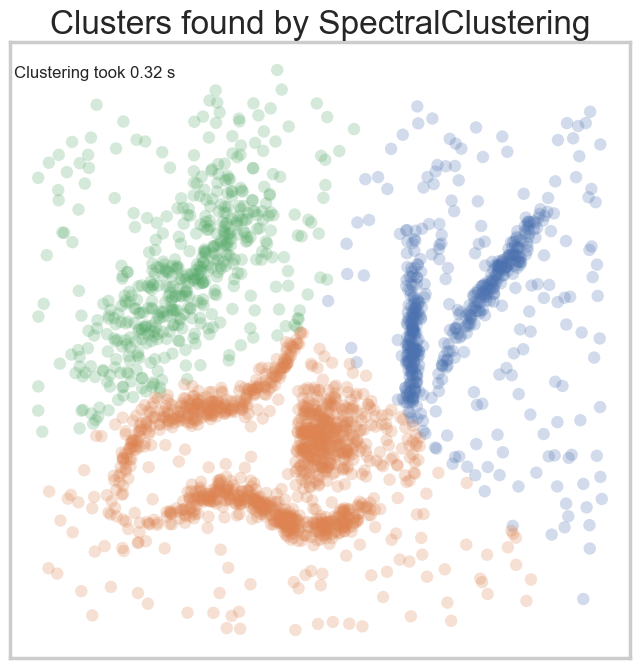

In [168]:
plot_clusters(data, cluster.SpectralClustering, (), {'n_clusters':3, 'random_state':594, 'eigen_solver':None, 
                                                    'n_components':None, 'assign_labels':'kmeans', 'gamma':1.0, 
                                                    'n_neighbors':10, 'n_init':10, 'affinity':'rbf', 
                                                     'kernel_params':None, 'n_jobs':None, 'eigen_tol':'auto', 
                                                     'degree':3, 'coef0':1, 'verbose':False})

## 5. Agglomerative Clustering

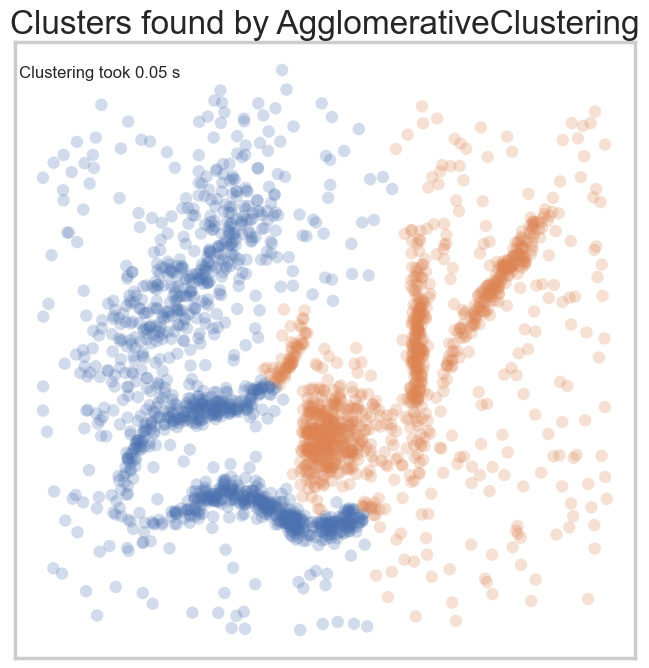

In [50]:
plot_clusters(data, cluster.AgglomerativeClustering, (), {})

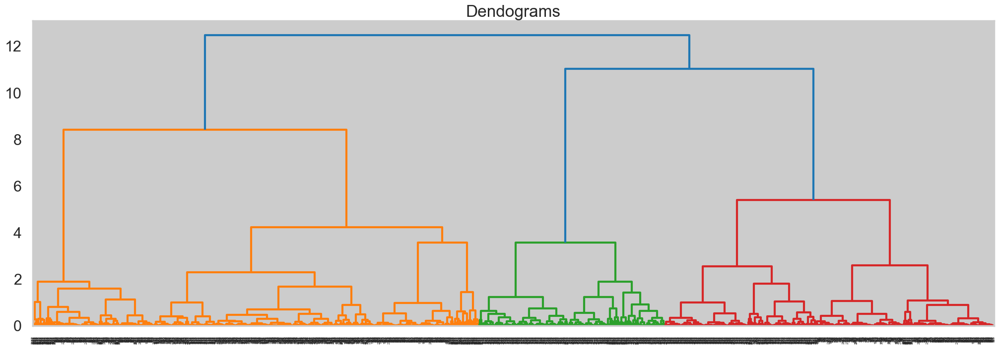

In [46]:
plt.figure(figsize=(25, 8))
plt.title("Dendograms")
dend = shc.dendrogram(shc.linkage(data, method='ward'))

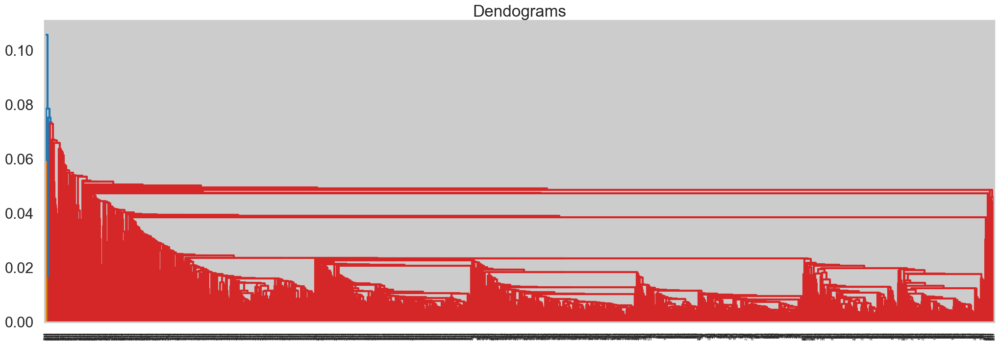

In [47]:
plt.figure(figsize=(25, 8))
plt.title("Dendograms")
dend2 = shc.dendrogram(shc.linkage(data, method='single'))

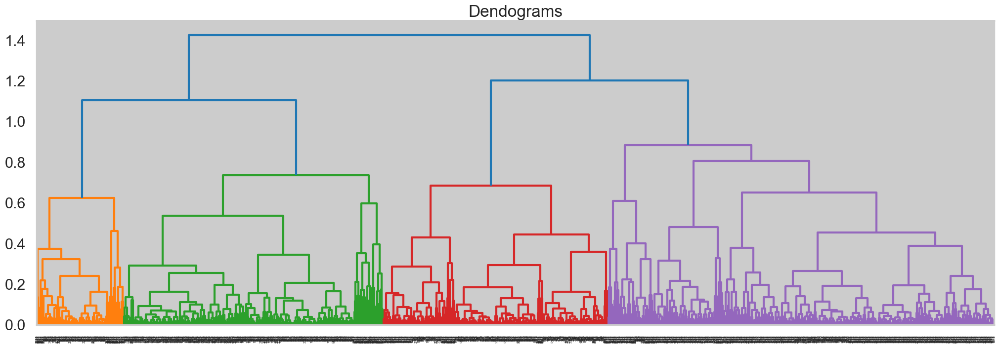

In [48]:
plt.figure(figsize=(25, 8))
plt.title("Dendograms")
dend3 = shc.dendrogram(shc.linkage(data, method='complete'))

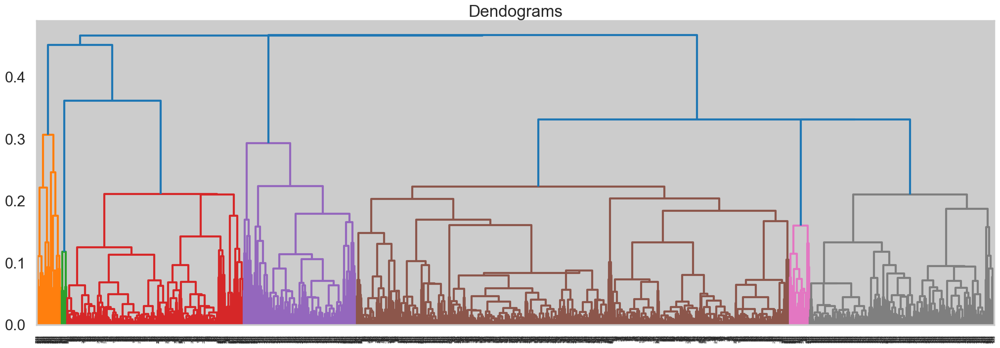

In [49]:
plt.figure(figsize=(25, 8))
plt.title("Dendograms")
dend4 = shc.dendrogram(shc.linkage(data, method='centroid'))

### 5.1 Finding the best parameters

In [65]:
# Finding the best parameters with the silhoutte score
linkages = ['ward', 'complete', 'average', 'single']
connectivity_func = lambda data: kneighbors_graph(data, 5, mode='connectivity', include_self=True)
connectivities = [None, connectivity_func]
compute_full_trees = ['auto', True, False]
compute_distancess = [True, False]

silhouette_avgs = []
parameters = list()
inertias = []

# Fit the clustering model for each preference parameter value
for linkage in linkages:
    for connectivity in connectivities:
        for compute_full_tree in compute_full_trees:
            for compute_distances in compute_distancess:

                agglomerative_clustering = cluster.AgglomerativeClustering(n_clusters=3, linkage=linkage, 
                                                                           connectivity=connectivity,
                                                                           compute_full_tree=compute_full_tree,
                                                                           compute_distances=compute_distances
                                                                )
                agglomerative_clustering.fit(data)
                silhouette_avg = metrics.silhouette_score(data, agglomerative_clustering.labels_)
                silhouette_avgs.append(silhouette_avg)
                used_parameters = "linkage: " + str(linkage) + ", " + "connectivity: " + str(connectivity) + ", " + "compute_full_tree: " + str(compute_full_tree) + ", " + "compute_distances: " + str(compute_distances)
                parameters.append(used_parameters)
                # Get the cluster labels and the number of clusters
                labels = agglomerative_clustering.labels_
                unique_labels = np.unique(labels)
                n_clusters = len(unique_labels)

                # Get the cluster centers
                cluster_centers = np.zeros((n_clusters, data.shape[1]))
                for i in range(n_clusters):
                    cluster_centers[i] = np.mean(data[labels == unique_labels[i]], axis=0)

                # Calculate the inertia score
                inertia = 0.0
                for i in range(len(data)):
                    # Calculate the distance to the nearest cluster center
                    distances = [((data[i] - center) ** 2).sum() for center in cluster_centers]
                    min_distance = min(distances)
                    # Add the squared distance to the inertia score
                    inertia += min_distance
                inertias.append(inertia)


df = pd.DataFrame(list(zip(silhouette_avgs, inertias)), index =parameters, columns =['Silhoutte_Score', 'Inertia_Score'])
df

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_agglomerative.py:282: UserWarning: the number of connected components of the connectivity matrix is 2 > 1. Completing it to avoid stopping the tree early.
  connectivity, n_connected_components = _fix_connectivity(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_agglomerative.py:282: UserWarning: the number of connected components of the connectivity matrix is 2 > 1. Completing it to avoid stopping the tree early.
  connectivity, n_connected_components = _fix_connectivity(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_agglomerative.py:282: UserWarning: the number of connected components of the connectivity matrix is 2 > 1. Completing it to avoid stopping the tree early.
  connectivity, n_connected_components = _fix_connectivity(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_agglomerative.py:282: UserWarni

,Silhoutte_Score,Inertia_Score
"linkage: ward, connectivity: None, compute_full_tree: auto, compute_distances: True",0.354929,101.136881
"linkage: ward, connectivity: None, compute_full_tree: auto, compute_distances: False",0.354929,101.136881
"linkage: ward, connectivity: None, compute_full_tree: True, compute_distances: True",0.354929,101.136881
"linkage: ward, connectivity: None, compute_full_tree: True, compute_distances: False",0.354929,101.136881
"linkage: ward, connectivity: None, compute_full_tree: False, compute_distances: True",0.354929,101.136881
"linkage: ward, connectivity: None, compute_full_tree: False, compute_distances: False",0.354929,101.136881
"linkage: ward, connectivity: <function <lambda> at 0x7fa8b8cfc9d0>, compute_full_tree: auto, compute_distances: True",0.456223,85.903381
"linkage: ward, connectivity: <function <lambda> at 0x7fa8b8cfc9d0>, compute_full_tree: auto, compute_distances: False",0.456223,85.903381
"linkage: ward, connectivity: <function <lambda> at 0x7fa8b8cfc9d0>, compute_full_tree: True, compute_distances: True",0.456223,85.903381
"linkage: ward, connectivity: <function <lambda> at 0x7fa8b8cfc9d0>, compute_full_tree: True, compute_distances: False",0.456223,85.903381


In [66]:
df[df.Silhoutte_Score==df.Silhoutte_Score.max()]

,Silhoutte_Score,Inertia_Score
"linkage: ward, connectivity: <function <lambda> at 0x7fa8b8cfc9d0>, compute_full_tree: auto, compute_distances: True",0.456223,85.903381
"linkage: ward, connectivity: <function <lambda> at 0x7fa8b8cfc9d0>, compute_full_tree: auto, compute_distances: False",0.456223,85.903381
"linkage: ward, connectivity: <function <lambda> at 0x7fa8b8cfc9d0>, compute_full_tree: True, compute_distances: True",0.456223,85.903381
"linkage: ward, connectivity: <function <lambda> at 0x7fa8b8cfc9d0>, compute_full_tree: True, compute_distances: False",0.456223,85.903381
"linkage: ward, connectivity: <function <lambda> at 0x7fa8b8cfc9d0>, compute_full_tree: False, compute_distances: True",0.456223,85.903381
"linkage: ward, connectivity: <function <lambda> at 0x7fa8b8cfc9d0>, compute_full_tree: False, compute_distances: False",0.456223,85.903381


In [67]:
df[df.Inertia_Score==df.Inertia_Score.min()]

,Silhoutte_Score,Inertia_Score
"linkage: ward, connectivity: <function <lambda> at 0x7fa8b8cfc9d0>, compute_full_tree: auto, compute_distances: True",0.456223,85.903381
"linkage: ward, connectivity: <function <lambda> at 0x7fa8b8cfc9d0>, compute_full_tree: auto, compute_distances: False",0.456223,85.903381
"linkage: ward, connectivity: <function <lambda> at 0x7fa8b8cfc9d0>, compute_full_tree: True, compute_distances: True",0.456223,85.903381
"linkage: ward, connectivity: <function <lambda> at 0x7fa8b8cfc9d0>, compute_full_tree: True, compute_distances: False",0.456223,85.903381
"linkage: ward, connectivity: <function <lambda> at 0x7fa8b8cfc9d0>, compute_full_tree: False, compute_distances: True",0.456223,85.903381
"linkage: ward, connectivity: <function <lambda> at 0x7fa8b8cfc9d0>, compute_full_tree: False, compute_distances: False",0.456223,85.903381


### 5.2 Final

In [74]:
connectivity_func = lambda data: kneighbors_graph(data, 5, mode='connectivity', include_self=True)
agglomerative_clustering = cluster.AgglomerativeClustering(n_clusters=3, linkage='ward', 
                                                           connectivity=connectivity_func, affinity='euclidean', 
                                                         metric=None, memory=None, compute_full_tree='auto', 
                                                         distance_threshold=None, compute_distances=False
                                                )
agglomerative_clustering.fit(data)
metrics.silhouette_score(data, agglomerative_clustering.labels_)

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_agglomerative.py:282: UserWarning: the number of connected components of the connectivity matrix is 2 > 1. Completing it to avoid stopping the tree early.
  connectivity, n_connected_components = _fix_connectivity(


0.45622348876182706

In [73]:
connectivity_func = lambda data: kneighbors_graph(data, 5, mode='connectivity', include_self=True)
agglomerative_clustering = cluster.AgglomerativeClustering(n_clusters=3, linkage='ward', 
                                                           connectivity=connectivity_func, affinity='euclidean', 
                                                         metric=None, memory=None, compute_full_tree='auto', 
                                                         distance_threshold=None, compute_distances=False
                                                )
agglomerative_clustering.fit(data)
# Get the cluster labels and the number of clusters
labels = agglomerative_clustering.labels_
unique_labels = np.unique(labels)
n_clusters = len(unique_labels)

# Get the cluster centers
cluster_centers = np.zeros((n_clusters, data.shape[1]))
for i in range(n_clusters):
    cluster_centers[i] = np.mean(data[labels == unique_labels[i]], axis=0)

# Calculate the inertia score
inertia = 0.0
for i in range(len(data)):
    # Calculate the distance to the nearest cluster center
    distances = [((data[i] - center) ** 2).sum() for center in cluster_centers]
    min_distance = min(distances)
    # Add the squared distance to the inertia score
    inertia += min_distance
inertia

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_agglomerative.py:282: UserWarning: the number of connected components of the connectivity matrix is 2 > 1. Completing it to avoid stopping the tree early.
  connectivity, n_connected_components = _fix_connectivity(


85.90338058607882

/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(
/Users/hasanenesguray/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_agglomerative.py:282: UserWarning: the number of connected components of the connectivity matrix is 2 > 1. Completing it to avoid stopping the tree early.
  connectivity, n_connected_components = _fix_connectivity(


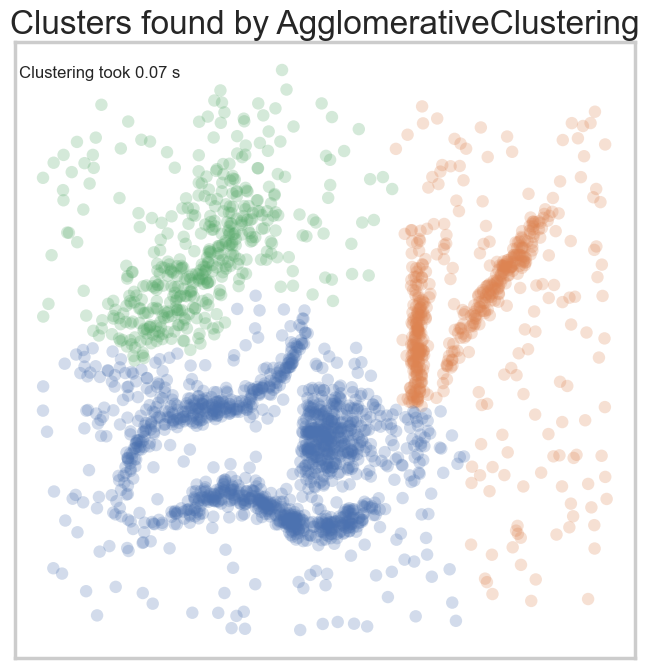

In [72]:
connectivity_func = lambda data: kneighbors_graph(data, 5, mode='connectivity', include_self=True)
plot_clusters(data, cluster.AgglomerativeClustering, (), {'n_clusters':3, 'linkage':'ward', 
                                                          'connectivity':connectivity_func, 'affinity':'euclidean', 
                                                         'metric':None, 'memory':None, 'compute_full_tree':'auto', 
                                                         'distance_threshold':None, 'compute_distances':False})


## 6. HDBSCAN

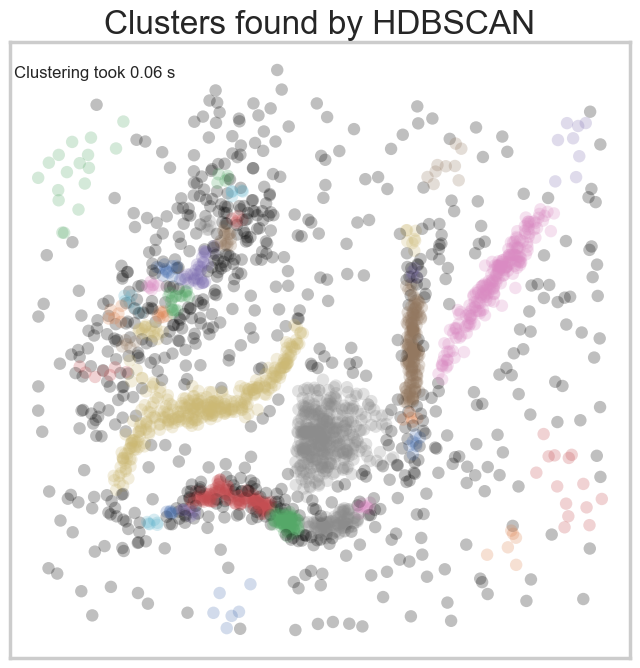

In [75]:
plot_clusters(data, hdbscan.HDBSCAN, (), {})

### 6.1 Finding the best min_cluster_sizes, cluster_selection_method parameter

In [121]:
# Finding the best parameters with the silhoutte score
min_cluster_sizes = np.arange(2, 150, 1)
cluster_selection_methods = ['eom', 'leaf']

parameters = list()
clusters_list = list()
silhoutte_list = list()
inertias = list()

# Fit the clustering model for each preference parameter value
for min_cluster_size in min_cluster_sizes:
    for cluster_selection_method in cluster_selection_methods:
        try:
            # Fit HDBSCAN model
            clusterer = hdbscan.HDBSCAN(min_cluster_size=min_cluster_size, cluster_selection_method=cluster_selection_method)
            clusterer.fit(data)

            # Get cluster labels
            labels = clusterer.labels_

            # Print number of clusters
            num_clusters = len(set(labels)) - (1 if -1 in labels else 0)  # Subtract one for the noise label


            used_parameters = "min_cluster_size: " + str(min_cluster_size) + ", " + "cluster_selection_method: " + str(cluster_selection_method)


            # Calculate silhouette score
            labels = clusterer.labels_
            if -1 in labels:
                # exclude noise points from silhouette score calculation
                silhouette = metrics.silhouette_score(data[labels != -1], labels[labels != -1])
            else:
                silhouette = metrics.silhouette_score(data, labels)


            # Calculate cluster persistence
            persistence = clusterer.cluster_persistence_

            # Calculate a variant of inertia score
            inertia_score = np.sum(persistence[persistence > 0])

            clusters_list.append(num_clusters)
            parameters.append(used_parameters)
            silhoutte_list.append(silhouette)
            inertias.append(inertia_score)

        except:
            pass

df = pd.DataFrame(list(zip(clusters_list, silhoutte_list, inertias)), index =parameters, columns =['Clusters_Number', 'Silhoutte_Score', 'Inertia_Score'])
df


,Clusters_Number,Silhoutte_Score,Inertia_Score
"min_cluster_size: 2, cluster_selection_method: eom",342,0.454263,13.724949
"min_cluster_size: 2, cluster_selection_method: leaf",398,0.483555,14.006157
"min_cluster_size: 3, cluster_selection_method: eom",153,0.401982,11.365583
"min_cluster_size: 3, cluster_selection_method: leaf",197,0.515399,13.448718
"min_cluster_size: 4, cluster_selection_method: eom",55,0.131627,2.585209
...,...,...,...
"min_cluster_size: 144, cluster_selection_method: leaf",2,0.681715,0.187423
"min_cluster_size: 145, cluster_selection_method: eom",2,0.686197,0.185067
"min_cluster_size: 145, cluster_selection_method: leaf",2,0.686197,0.185067
"min_cluster_size: 146, cluster_selection_method: eom",2,0.687339,0.178863


In [123]:
df[df.Clusters_Number==3]

,Clusters_Number,Silhoutte_Score,Inertia_Score
"min_cluster_size: 128, cluster_selection_method: leaf",3,0.682690,0.280375
"min_cluster_size: 131, cluster_selection_method: eom",3,0.529356,0.134929
"min_cluster_size: 132, cluster_selection_method: eom",3,0.527912,0.121648
"min_cluster_size: 133, cluster_selection_method: eom",3,0.555200,0.128252
"min_cluster_size: 134, cluster_selection_method: leaf",3,0.658825,0.250664
"min_cluster_size: 136, cluster_selection_method: leaf",3,0.662879,0.238351
"min_cluster_size: 139, cluster_selection_method: leaf",3,0.663486,0.225252


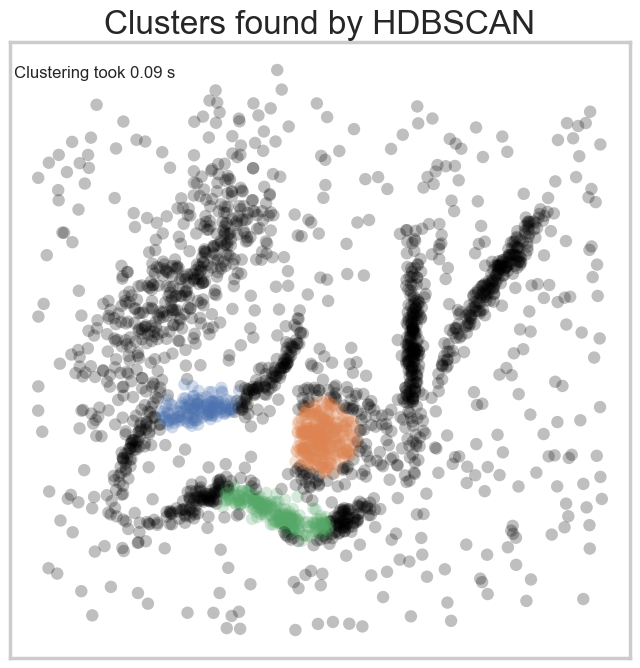

In [122]:
plot_clusters(data, hdbscan.HDBSCAN, (), {'min_cluster_size':128, 'cluster_selection_method':'leaf'})

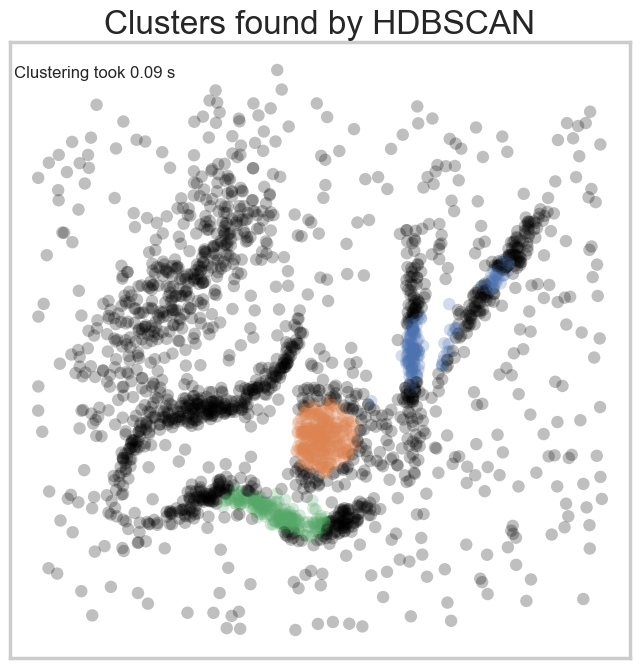

In [124]:
plot_clusters(data, hdbscan.HDBSCAN, (), {'min_cluster_size':139, 'cluster_selection_method':'leaf'})

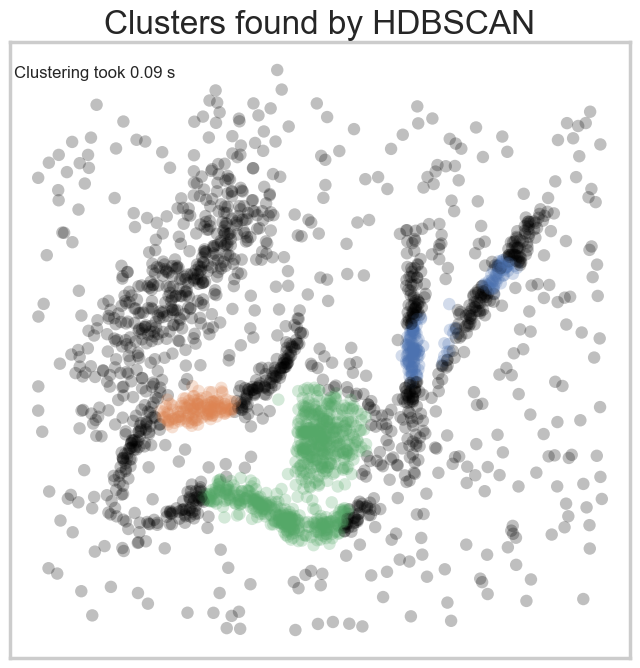

In [125]:
plot_clusters(data, hdbscan.HDBSCAN, (), {'min_cluster_size':132, 'cluster_selection_method':'eom'})

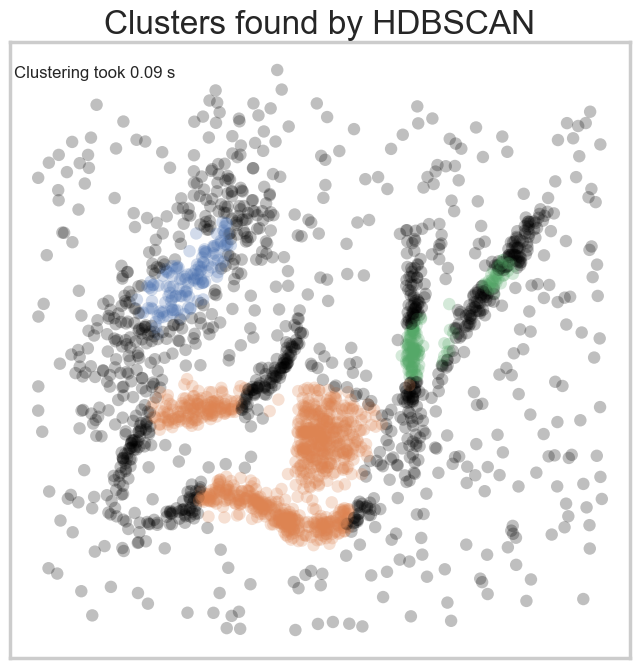

In [126]:
plot_clusters(data, hdbscan.HDBSCAN, (), {'min_cluster_size':133, 'cluster_selection_method':'eom'})

### 6.2 Finding the best min_samples parameter

In [127]:
# Finding the best parameters with the silhoutte and inertia score
min_sampless = np.arange(1, 501, 1)

parameters = list()
clusters_list = list()
silhoutte_list = list()
inertias = list()

# Fit the clustering model for each preference parameter value
for min_samples in min_sampless:
    try:
        # Fit HDBSCAN model
        clusterer = hdbscan.HDBSCAN(min_cluster_size=133, cluster_selection_method='eom', min_samples=min_samples)
        clusterer.fit(data)

        # Get cluster labels
        labels = clusterer.labels_

        # Print number of clusters
        num_clusters = len(set(labels)) - (1 if -1 in labels else 0)  # Subtract one for the noise label
        

        used_parameters = "min_samples: " + str(min_samples)
        

        # Calculate silhouette score
        labels = clusterer.labels_
        if -1 in labels:
            # exclude noise points from silhouette score calculation
            silhouette = metrics.silhouette_score(data[labels != -1], labels[labels != -1])
        else:
            silhouette = metrics.silhouette_score(data, labels)

        
        # Calculate cluster persistence
        persistence = clusterer.cluster_persistence_

        # Calculate a variant of inertia score
        inertia_score = np.sum(persistence[persistence > 0])
        
        clusters_list.append(num_clusters)
        parameters.append(used_parameters)
        silhoutte_list.append(silhouette)
        inertias.append(inertia_score)
        
    except:
        pass

df = pd.DataFrame(list(zip(clusters_list, silhoutte_list, inertias)), index =parameters, columns =['Clusters_Number', 'Silhoutte_Score', 'Inertia_Score'])
df


,Clusters_Number,Silhoutte_Score,Inertia_Score
min_samples: 1,6,0.431620,1.717670
min_samples: 2,6,0.435340,1.736779
min_samples: 3,6,0.438419,1.965471
min_samples: 4,6,0.437727,2.062117
min_samples: 5,6,0.444524,1.991008
...,...,...,...
min_samples: 145,2,0.686197,0.199336
min_samples: 146,2,0.687339,0.197632
min_samples: 147,2,0.690783,0.189503
min_samples: 148,2,0.689464,0.186061


In [128]:
df[df.Clusters_Number==3]

,Clusters_Number,Silhoutte_Score,Inertia_Score
min_samples: 131,3,0.529356,0.134079
min_samples: 132,3,0.527912,0.119863
min_samples: 133,3,0.555200,0.128252
min_samples: 134,3,0.527828,0.113161


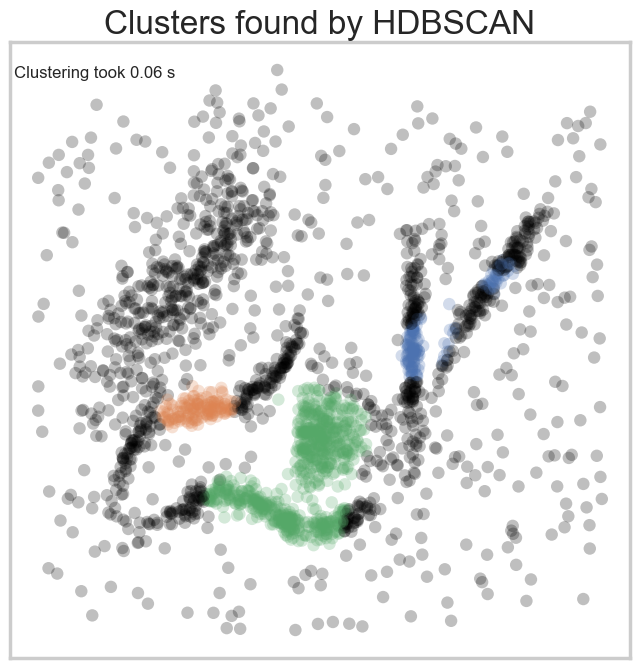

In [129]:
plot_clusters(data, hdbscan.HDBSCAN, (), {'min_cluster_size':133, 'cluster_selection_method':'eom', 'min_samples':134})

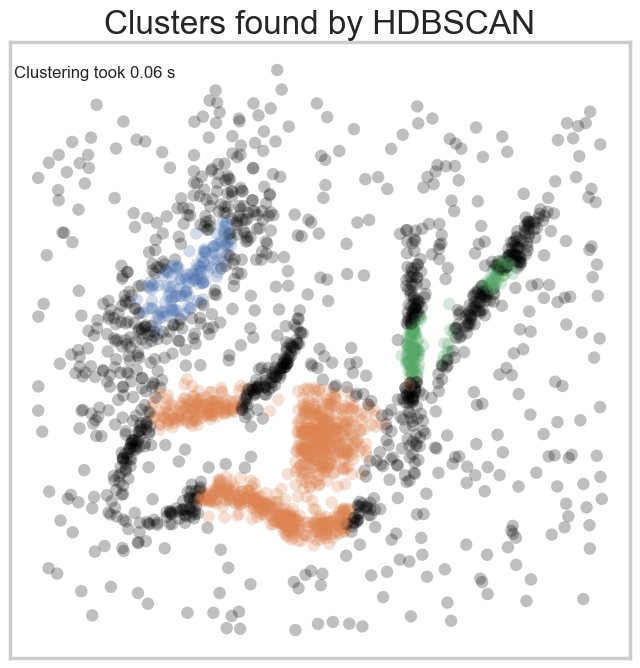

In [130]:
plot_clusters(data, hdbscan.HDBSCAN, (), {'min_cluster_size':133, 'cluster_selection_method':'eom', 'min_samples':133})

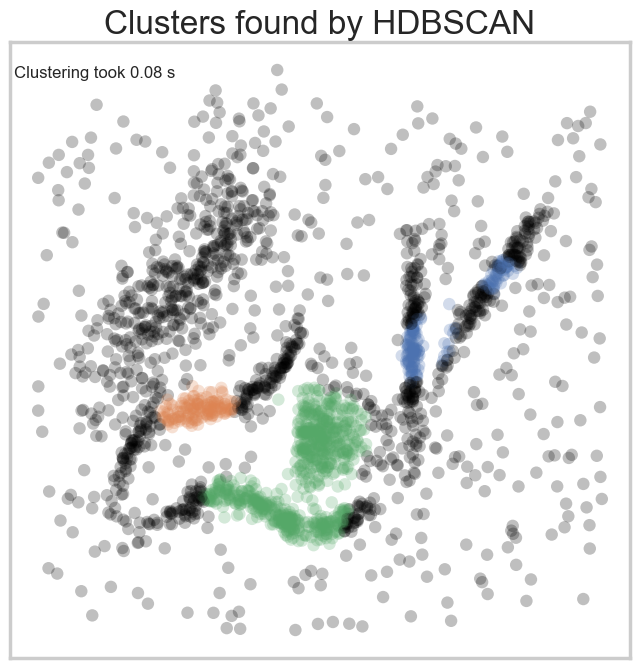

In [131]:
plot_clusters(data, hdbscan.HDBSCAN, (), {'min_cluster_size':133, 'cluster_selection_method':'eom', 'min_samples':132})

### 6.3 Finding the best cluster_selection_epsilon parameter

In [132]:
# Finding the best parameters with the silhoutte and inertia score
cluster_selection_epsilons = [0.0001, 0.001, 0.01, 0.1]

parameters = list()
clusters_list = list()
silhoutte_list = list()
inertias = list()

# Fit the clustering model for each preference parameter value
for cluster_selection_epsilon in cluster_selection_epsilons:
    try:
        # Fit HDBSCAN model
        clusterer = hdbscan.HDBSCAN(min_cluster_size=133, cluster_selection_method='eom', min_samples=133, 
                                    cluster_selection_epsilon=cluster_selection_epsilon)
        clusterer.fit(data)

        # Get cluster labels
        labels = clusterer.labels_

        # Print number of clusters
        num_clusters = len(set(labels)) - (1 if -1 in labels else 0)  # Subtract one for the noise label
        

        used_parameters = "cluster_selection_epsilon: " + str(cluster_selection_epsilon)
        

        # Calculate silhouette score
        labels = clusterer.labels_
        if -1 in labels:
            # exclude noise points from silhouette score calculation
            silhouette = metrics.silhouette_score(data[labels != -1], labels[labels != -1])
        else:
            silhouette = metrics.silhouette_score(data, labels)

        
        # Calculate cluster persistence
        persistence = clusterer.cluster_persistence_

        # Calculate a variant of inertia score
        inertia_score = np.sum(persistence[persistence > 0])
        
        clusters_list.append(num_clusters)
        parameters.append(used_parameters)
        silhoutte_list.append(silhouette)
        inertias.append(inertia_score)
        
    except:
        pass

df = pd.DataFrame(list(zip(clusters_list, silhoutte_list, inertias)), index =parameters, columns =['Clusters_Number', 'Silhoutte_Score', 'Inertia_Score'])
df


,Clusters_Number,Silhoutte_Score,Inertia_Score
cluster_selection_epsilon: 0.0001,3,0.555200,0.128252
cluster_selection_epsilon: 0.001,3,0.555200,0.128252
cluster_selection_epsilon: 0.01,3,0.555200,0.128252
cluster_selection_epsilon: 0.1,2,0.405844,0.083537


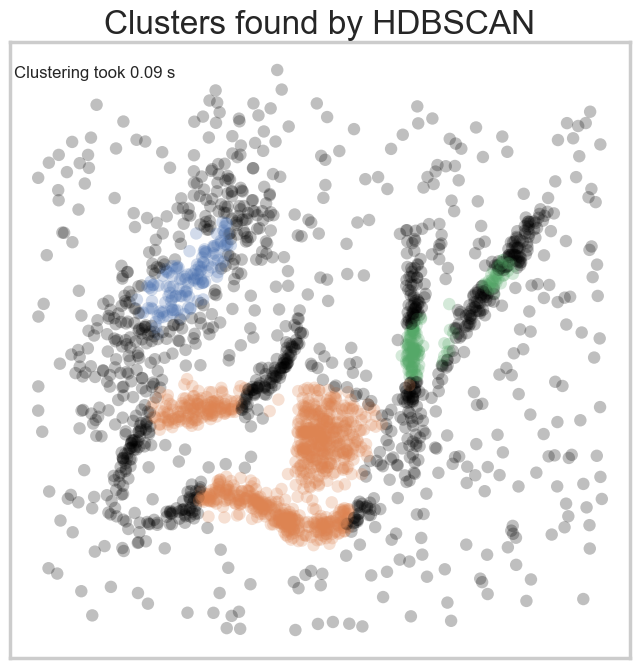

In [134]:
plot_clusters(data, hdbscan.HDBSCAN, (), {'min_cluster_size':133, 'cluster_selection_method':'eom', 'min_samples':133, 'cluster_selection_epsilon':0.01})


### 6.3 Finding the best alpha parameter

In [135]:
# Finding the best parameters with the silhoutte and inertia score
alphas = [0.1, 1.0, 1.3]

parameters = list()
clusters_list = list()
silhoutte_list = list()
inertias = list()

# Fit the clustering model for each preference parameter value
for alpha in alphas:
    try:
        # Fit HDBSCAN model
        clusterer = hdbscan.HDBSCAN(min_cluster_size=133, cluster_selection_method='eom', min_samples=133, 
                                    cluster_selection_epsilon=0.01, alpha=alpha)
        clusterer.fit(data)

        # Get cluster labels
        labels = clusterer.labels_

        # Print number of clusters
        num_clusters = len(set(labels)) - (1 if -1 in labels else 0)  # Subtract one for the noise label
        

        used_parameters = "alpha: " + str(alpha)
        

        # Calculate silhouette score
        labels = clusterer.labels_
        if -1 in labels:
            # exclude noise points from silhouette score calculation
            silhouette = metrics.silhouette_score(data[labels != -1], labels[labels != -1])
        else:
            silhouette = metrics.silhouette_score(data, labels)

        
        # Calculate cluster persistence
        persistence = clusterer.cluster_persistence_

        # Calculate a variant of inertia score
        inertia_score = np.sum(persistence[persistence > 0])
        
        clusters_list.append(num_clusters)
        parameters.append(used_parameters)
        silhoutte_list.append(silhouette)
        inertias.append(inertia_score)
        
    except:
        pass

df = pd.DataFrame(list(zip(clusters_list, silhoutte_list, inertias)), index =parameters, columns =['Clusters_Number', 'Silhoutte_Score', 'Inertia_Score'])
df


,Clusters_Number,Silhoutte_Score,Inertia_Score
alpha: 0.1,3,0.5552,0.128252
alpha: 1.0,3,0.5552,0.128252
alpha: 1.3,3,0.5552,0.128252


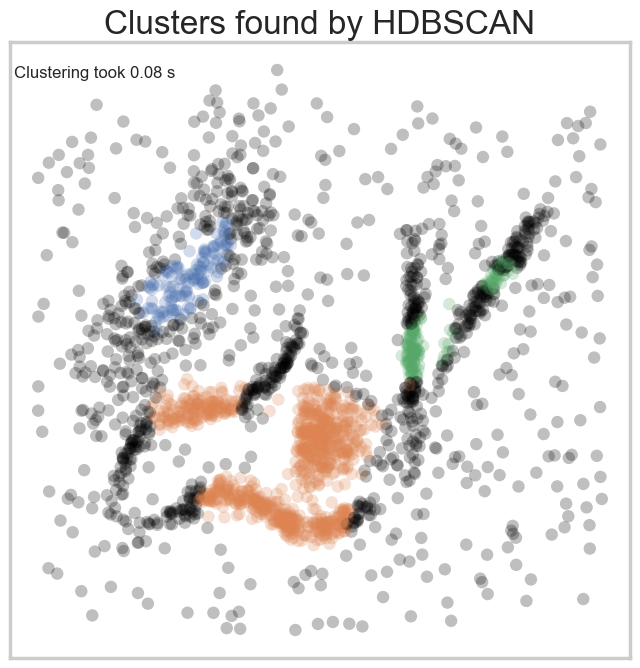

In [136]:
plot_clusters(data, hdbscan.HDBSCAN, (), {'min_cluster_size':133, 'cluster_selection_method':'eom', 'min_samples':133,
                                          'cluster_selection_epsilon':0.01, 'alpha': 1.0})


### 6.4 Final

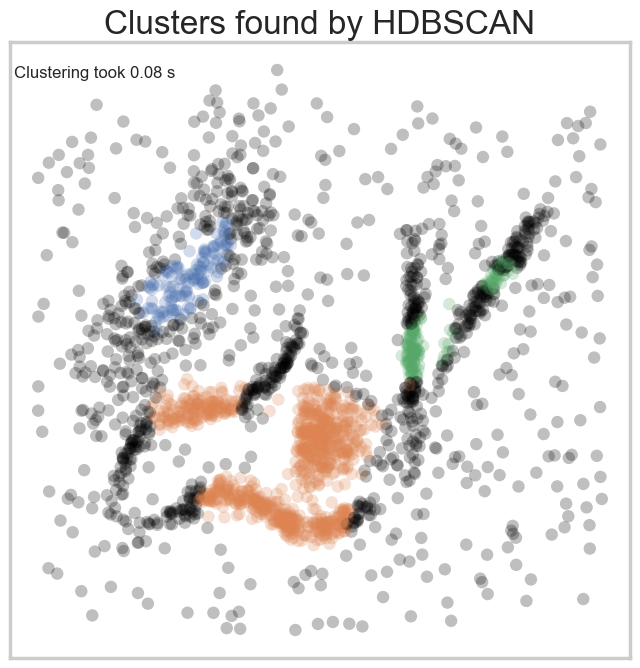

In [138]:
plot_clusters(data, hdbscan.HDBSCAN, (), {'min_cluster_size':133, 'cluster_selection_method':'eom', 'min_samples':133,
                                          'cluster_selection_epsilon':0.01, 'alpha': 1.0, 'allow_single_cluster': False})
